# RBM training $ L=9$  - Dataset with 25 different temperatures

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split
import seaborn as sns

import torch
import torch.nn as nn
torch.manual_seed(12)

import sys
# sys.path.append('../modules')
from rbm_L10 import RBM
from mc_ising2d import IsingMC
import os

In [2]:
L = 10

## Dataset with $ T/J = 10^{-6}, 0.25, 0.5, ..., 5.5, 5.75, 6 $.

The first step is to load the Ising data generated by Monte Carlo procedure. The file `L9_Ising2D_MC.pkl` contains spins configurations for a square lattice $L\times L$, with $L=9$. There are 2000 spins configurations for each of 25 different temperatures $ T/J = 10^{-6}, 0.25, 0.5, ..., 5.5, 5.75, 6 $.

In [3]:
ising_data = pd.read_pickle(f'L{L}_Ising2D_MC.pkl')
ising_data.head()

,state,magn,energy,temp
0,"[0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, ...",0,-16,6.0
1,"[0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, ...",0,-4,6.0
2,"[0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, ...",-24,-32,6.0
3,"[1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, ...",-16,-64,6.0
4,"[0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, ...",-14,-40,6.0


In [4]:
ising_data['temp'].value_counts()

temp
6.000000    2000
2.750000    2000
0.250000    2000
0.500000    2000
0.750000    2000
1.000000    2000
1.250000    2000
1.500000    2000
1.750000    2000
2.000000    2000
2.250000    2000
2.500000    2000
3.000000    2000
5.750000    2000
3.250000    2000
3.500000    2000
3.750000    2000
4.000000    2000
4.250000    2000
4.500000    2000
4.750000    2000
5.000000    2000
5.250000    2000
5.500000    2000
0.000001    2000
Name: count, dtype: int64

In the thermodynamic limit $( L^2 \rightarrow \infty )$, the isotropic Ising model in a square lattice was analytically solved by [Lars Onsager](https://en.wikipedia.org/wiki/Lars_Onsager) in [1944](https://journals.aps.org/pr/abstract/10.1103/PhysRev.65.117). In this limit, the model show spontaneous magnetization for $ T < T_c$, with $T_c$ given by 

$$ \frac{T_c}{J} = \frac{2}{\log\left(1 + \sqrt{ 2}\right)} \approx 2.269185  \;. $$

With the class `IsingMC` we can check some thermodynamics quantities.

Method fit will construct states to the following temperatures: 
[3.5        3.4        3.3        3.2        3.1        3.
 2.9        2.8        2.7        2.6        2.5        2.4
 2.3        2.27918531 2.26918531 2.25918531 2.2        2.1
 2.         1.9        1.8        1.7        1.6        1.5
 1.4        1.3        1.2        1.1        1.        ]


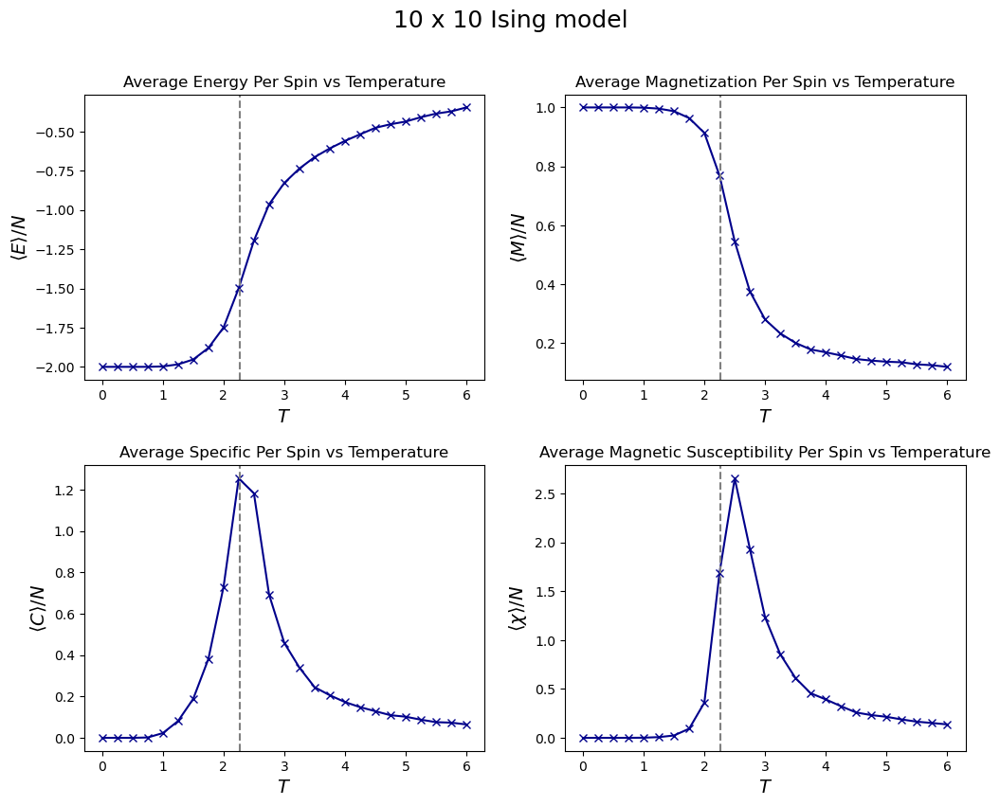

In [5]:
IsingMC(L= L).plot_thermodynamics(spin_MC= ising_data, Tc_scaled= False)

In [6]:
data = ising_data.drop(columns= ['energy', 'magn'])

### Constructing training and test sets

Using `train_test_split` from [`sklearn`](http://scikit-learn.org/) it is easy to split the data into training and test sets. Since `train_test_split` is a random process and our data has 1000 samples for each of the 25 temperatures values, we split the data for each temperature in order to avoid the possibility of a biased split towards some temperature value.

In [7]:
train_data_ = pd.DataFrame()
test_data_ = pd.DataFrame()

for _, temp in enumerate(data['temp'].value_counts().index.tolist()):
    
    train_data_T, test_data_T = train_test_split(data[data['temp'] == temp],
                                                 test_size= 0.2,
                                                 random_state= 12)
    
    train_data_ = pd.concat([train_data_, train_data_T])
    test_data_ = pd.concat([test_data_, test_data_T])

### Training the model

Our code implementing a Restricted Boltzmann Machine is written a python class called `RBM` which is imported from `rbm.py`.

For simplification, the units have no bias and the RBM stochasticity parameter, represented below by $T$ is set to unity, as usual in most practical applications. Note that we set `use_cuda=True`, which makes use of [CUDA tensor types](https://pytorch.org/docs/stable/cuda.html), implementing GPU computation. If a GPU is not available, one should just set `use_cuda=False`.

In [8]:
train_numpy_array = np.stack([np.array(elem, dtype=np.float32) for elem in train_data_['state']])
test_numpy_array = np.stack([np.array(elem, dtype=np.float32) for elem in test_data_['state']])

# Convert the numpy arrays to PyTorch tensors
training_set = torch.tensor(train_numpy_array)
test_set = torch.tensor(test_numpy_array)

# Randomly shuffle the training data
training_set = training_set[torch.randperm(training_set.size(0))]

In [9]:
training_set.shape[1]

100

Training RBM 1/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360087 (train), 0.359854 (test), Pseud_Lik: -38.436861, Time: 1.773260, 
Ep 20, Rec er: 0.337935 (train), 0.338450 (test), Pseud_Lik: -33.864677, Time: 1.631530, 
Ep 30, Rec er: 0.328395 (train), 0.329418 (test), Pseud_Lik: -31.913264, Time: 1.790855, 
Ep 40, Rec er: 0.323490 (train), 0.324112 (test), Pseud_Lik: -30.458848, Time: 1.988511, 
Ep 50, Rec er: 0.319053 (train), 0.318447 (test), Pseud_Lik: -29.731340, Time: 2.064103, 
Ep 60, Rec er: 0.314578 (train), 0.315543 (test), Pseud_Lik: -29.009778, Time: 2.115962, 
Ep 70, Rec er: 0.311032 (train), 0.312432 (test), Pseud_Lik: -28.360394, Time: 2.003653, 
Ep 80, Rec er: 0.307774 (train), 0.308535 (test), Pseud_Lik: -27.741224, Time: 1.816510, 
Ep 90, Rec er: 0.304246 (train), 0.305868 (test), Pseud_Lik: -27.568014, Time: 2.225508, 
Ep 100, Rec er: 0.302025 (train), 0.302296 (test), Pse

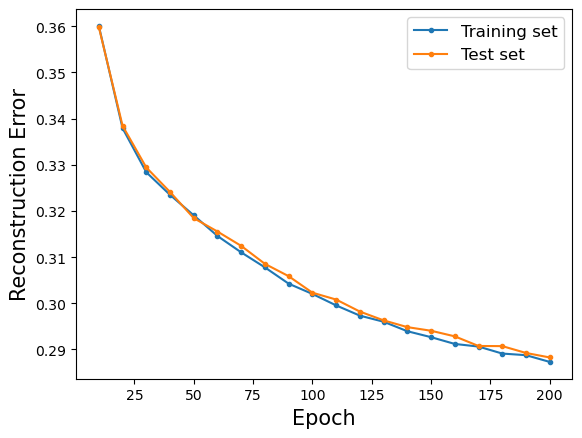

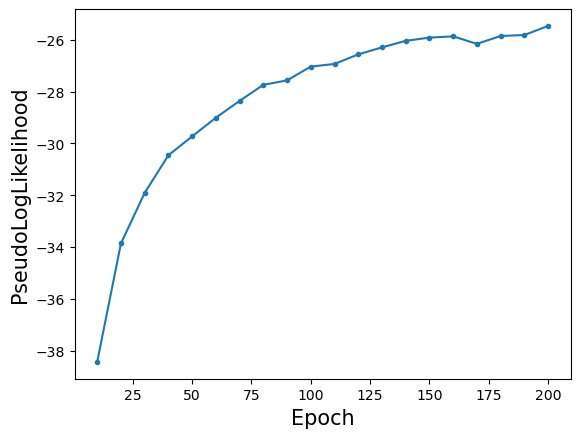

Training RBM 2/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359468 (train), 0.358667 (test), Pseud_Lik: -38.171971, Time: 1.885680, 
Ep 20, Rec er: 0.337422 (train), 0.338762 (test), Pseud_Lik: -34.194390, Time: 2.759458, 
Ep 30, Rec er: 0.327812 (train), 0.327938 (test), Pseud_Lik: -32.239870, Time: 2.010019, 
Ep 40, Rec er: 0.321737 (train), 0.322025 (test), Pseud_Lik: -30.716947, Time: 2.337098, 
Ep 50, Rec er: 0.317394 (train), 0.316873 (test), Pseud_Lik: -29.663410, Time: 2.520047, 
Ep 60, Rec er: 0.312819 (train), 0.312708 (test), Pseud_Lik: -28.915005, Time: 1.882209, 
Ep 70, Rec er: 0.308584 (train), 0.309462 (test), Pseud_Lik: -28.007600, Time: 1.934201, 
Ep 80, Rec er: 0.304931 (train), 0.305103 (test), Pseud_Lik: -27.703530, Time: 2.071206, 
Ep 90, Rec er: 0.301305 (train), 0.302004 (test), Pseud_Lik: -27.319171, Time: 2.163642, 
Ep 100, Rec er: 0.298619 (train), 0.299262 (test), Pse

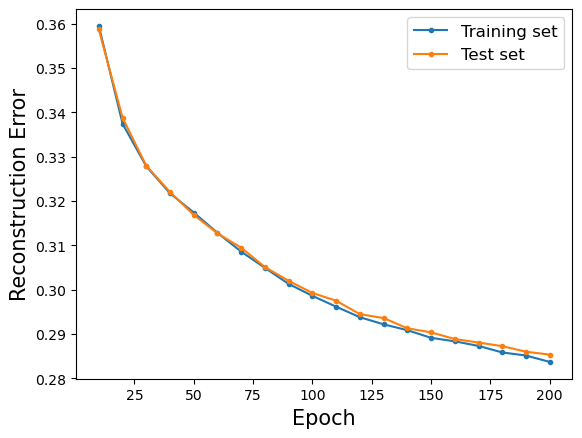

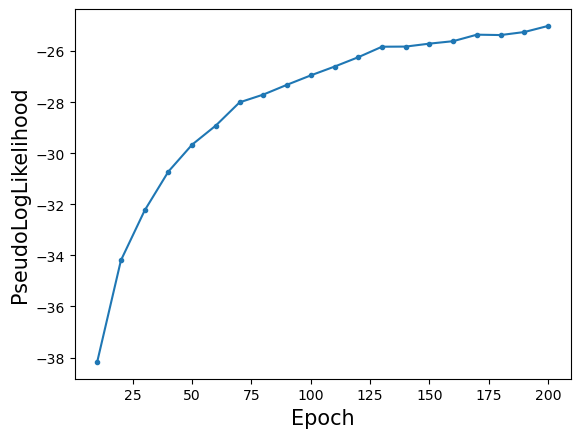

Training RBM 3/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359970 (train), 0.358973 (test), Pseud_Lik: -38.321353, Time: 1.908287, 
Ep 20, Rec er: 0.338226 (train), 0.338354 (test), Pseud_Lik: -34.075135, Time: 1.771564, 
Ep 30, Rec er: 0.327813 (train), 0.328386 (test), Pseud_Lik: -31.878445, Time: 1.930167, 
Ep 40, Rec er: 0.321848 (train), 0.322997 (test), Pseud_Lik: -30.496968, Time: 1.822461, 
Ep 50, Rec er: 0.317381 (train), 0.317824 (test), Pseud_Lik: -29.706286, Time: 1.849793, 
Ep 60, Rec er: 0.312856 (train), 0.313904 (test), Pseud_Lik: -28.615841, Time: 1.819117, 
Ep 70, Rec er: 0.309226 (train), 0.309642 (test), Pseud_Lik: -28.295609, Time: 2.185160, 
Ep 80, Rec er: 0.305574 (train), 0.306296 (test), Pseud_Lik: -27.760757, Time: 1.847116, 
Ep 90, Rec er: 0.302365 (train), 0.303564 (test), Pseud_Lik: -27.630853, Time: 2.023296, 
Ep 100, Rec er: 0.299503 (train), 0.300073 (test), Pse

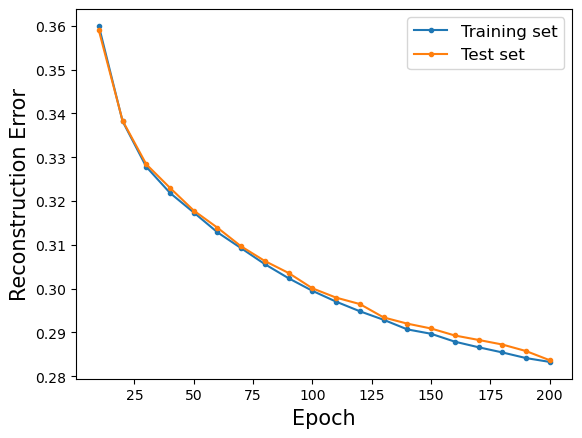

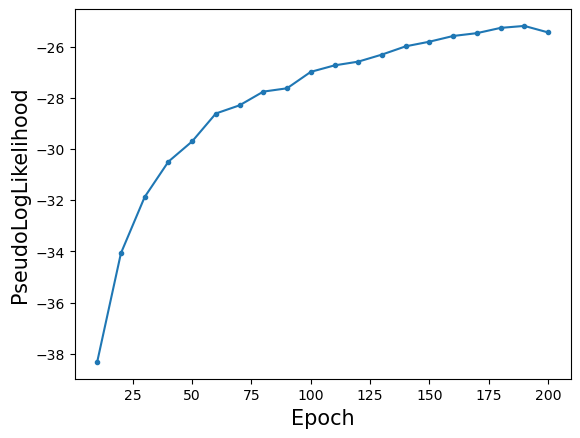

Training RBM 4/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358620 (train), 0.358786 (test), Pseud_Lik: -38.092976, Time: 2.763844, 
Ep 20, Rec er: 0.337706 (train), 0.337607 (test), Pseud_Lik: -34.013032, Time: 2.153121, 
Ep 30, Rec er: 0.327763 (train), 0.328354 (test), Pseud_Lik: -31.926347, Time: 2.097741, 
Ep 40, Rec er: 0.321448 (train), 0.322238 (test), Pseud_Lik: -30.626745, Time: 2.019471, 
Ep 50, Rec er: 0.317398 (train), 0.317721 (test), Pseud_Lik: -29.652292, Time: 2.125805, 
Ep 60, Rec er: 0.312440 (train), 0.313681 (test), Pseud_Lik: -29.006267, Time: 1.976031, 
Ep 70, Rec er: 0.308572 (train), 0.309058 (test), Pseud_Lik: -28.195093, Time: 2.222811, 
Ep 80, Rec er: 0.305163 (train), 0.306566 (test), Pseud_Lik: -27.736715, Time: 2.449426, 
Ep 90, Rec er: 0.302241 (train), 0.302235 (test), Pseud_Lik: -27.463129, Time: 2.387199, 
Ep 100, Rec er: 0.299231 (train), 0.300005 (test), Pse

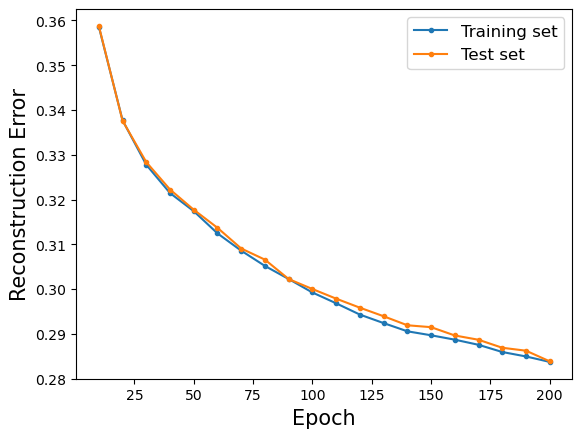

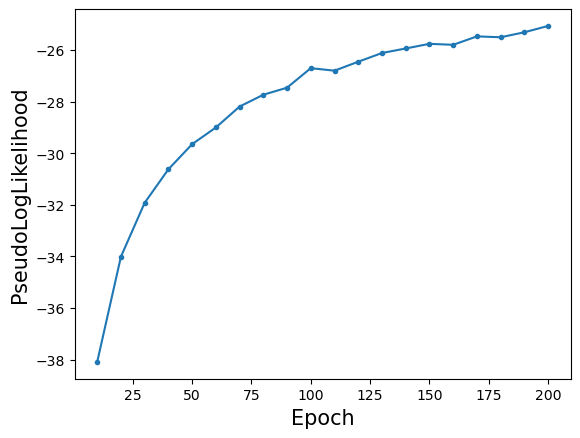

Training RBM 5/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359958 (train), 0.359638 (test), Pseud_Lik: -38.312285, Time: 2.627380, 
Ep 20, Rec er: 0.338420 (train), 0.338696 (test), Pseud_Lik: -33.985113, Time: 2.216978, 
Ep 30, Rec er: 0.327841 (train), 0.328455 (test), Pseud_Lik: -32.171725, Time: 2.158096, 
Ep 40, Rec er: 0.321433 (train), 0.321419 (test), Pseud_Lik: -30.718693, Time: 2.186101, 
Ep 50, Rec er: 0.316490 (train), 0.316408 (test), Pseud_Lik: -29.373993, Time: 2.212447, 
Ep 60, Rec er: 0.311632 (train), 0.311899 (test), Pseud_Lik: -28.535312, Time: 2.326252, 
Ep 70, Rec er: 0.307367 (train), 0.307744 (test), Pseud_Lik: -27.960484, Time: 2.674774, 
Ep 80, Rec er: 0.303634 (train), 0.303974 (test), Pseud_Lik: -27.594589, Time: 2.624284, 
Ep 90, Rec er: 0.300672 (train), 0.300708 (test), Pseud_Lik: -26.989973, Time: 3.331036, 
Ep 100, Rec er: 0.297513 (train), 0.299284 (test), Pse

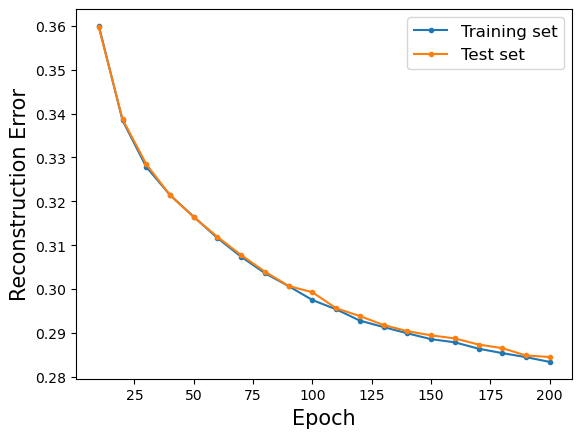

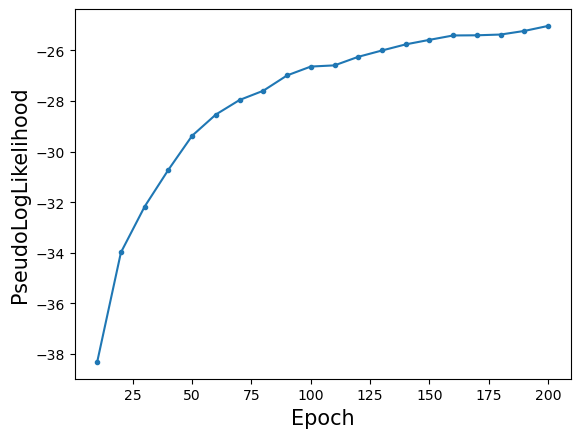

Training RBM 6/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360519 (train), 0.359247 (test), Pseud_Lik: -38.248586, Time: 2.384179, 
Ep 20, Rec er: 0.338410 (train), 0.338342 (test), Pseud_Lik: -34.298566, Time: 2.712384, 
Ep 30, Rec er: 0.328144 (train), 0.328875 (test), Pseud_Lik: -32.456806, Time: 2.483595, 
Ep 40, Rec er: 0.321713 (train), 0.322624 (test), Pseud_Lik: -31.225665, Time: 2.443577, 
Ep 50, Rec er: 0.316767 (train), 0.316862 (test), Pseud_Lik: -29.560948, Time: 2.391040, 
Ep 60, Rec er: 0.311207 (train), 0.312296 (test), Pseud_Lik: -28.600356, Time: 3.230378, 
Ep 70, Rec er: 0.306669 (train), 0.308344 (test), Pseud_Lik: -27.971557, Time: 2.574299, 
Ep 80, Rec er: 0.302125 (train), 0.302918 (test), Pseud_Lik: -27.116597, Time: 3.044852, 
Ep 90, Rec er: 0.299070 (train), 0.299437 (test), Pseud_Lik: -26.838967, Time: 2.500874, 
Ep 100, Rec er: 0.296541 (train), 0.297851 (test), Pse

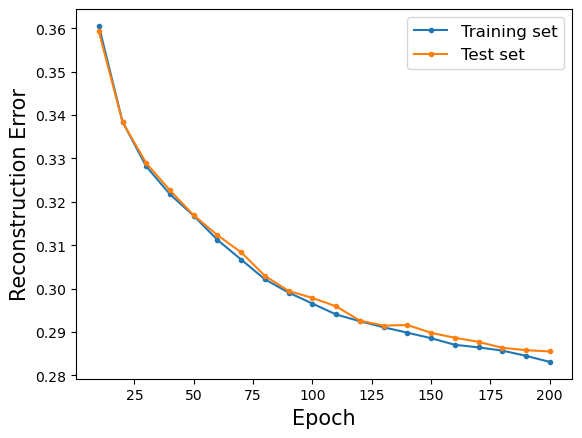

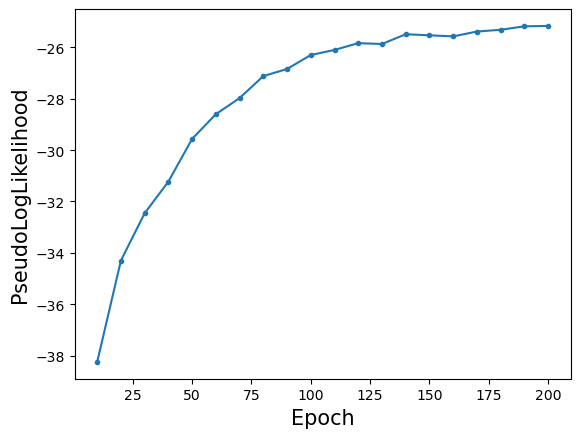

Training RBM 7/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359876 (train), 0.358901 (test), Pseud_Lik: -38.193679, Time: 3.058132, 
Ep 20, Rec er: 0.338073 (train), 0.338492 (test), Pseud_Lik: -33.995762, Time: 2.959265, 
Ep 30, Rec er: 0.328351 (train), 0.329324 (test), Pseud_Lik: -32.501294, Time: 3.163404, 
Ep 40, Rec er: 0.322315 (train), 0.323063 (test), Pseud_Lik: -31.255093, Time: 2.279370, 
Ep 50, Rec er: 0.317107 (train), 0.317245 (test), Pseud_Lik: -29.826068, Time: 2.208246, 
Ep 60, Rec er: 0.311898 (train), 0.311932 (test), Pseud_Lik: -28.838028, Time: 3.220533, 
Ep 70, Rec er: 0.307072 (train), 0.308040 (test), Pseud_Lik: -28.351413, Time: 2.429129, 
Ep 80, Rec er: 0.303337 (train), 0.303847 (test), Pseud_Lik: -27.756059, Time: 2.072909, 
Ep 90, Rec er: 0.299720 (train), 0.300231 (test), Pseud_Lik: -27.306455, Time: 2.454535, 
Ep 100, Rec er: 0.297323 (train), 0.298378 (test), Pse

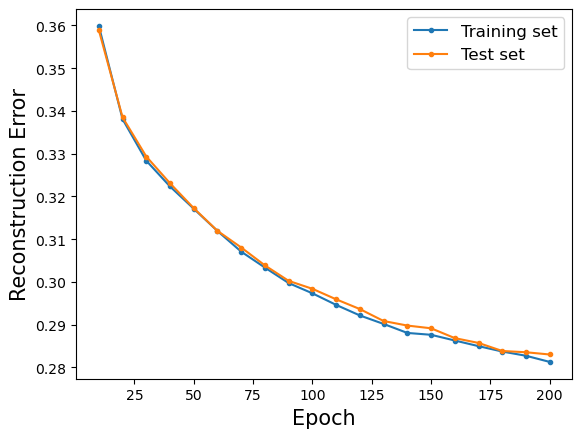

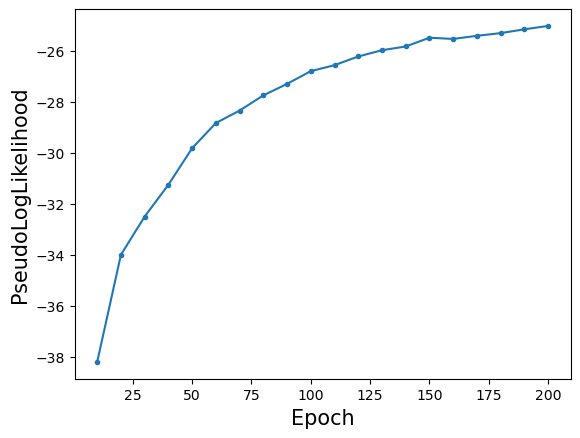

Training RBM 8/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359699 (train), 0.358230 (test), Pseud_Lik: -38.174891, Time: 2.084133, 
Ep 20, Rec er: 0.337759 (train), 0.338089 (test), Pseud_Lik: -33.997925, Time: 2.128502, 
Ep 30, Rec er: 0.328645 (train), 0.329324 (test), Pseud_Lik: -31.965082, Time: 2.304548, 
Ep 40, Rec er: 0.322518 (train), 0.322214 (test), Pseud_Lik: -30.880599, Time: 2.384577, 
Ep 50, Rec er: 0.317477 (train), 0.318097 (test), Pseud_Lik: -30.063593, Time: 2.209522, 
Ep 60, Rec er: 0.312746 (train), 0.313235 (test), Pseud_Lik: -28.974219, Time: 2.167529, 
Ep 70, Rec er: 0.308158 (train), 0.309925 (test), Pseud_Lik: -28.196531, Time: 2.142000, 
Ep 80, Rec er: 0.304298 (train), 0.304701 (test), Pseud_Lik: -27.597494, Time: 2.100137, 
Ep 90, Rec er: 0.301093 (train), 0.301177 (test), Pseud_Lik: -27.063406, Time: 2.490649, 
Ep 100, Rec er: 0.297658 (train), 0.298521 (test), Pse

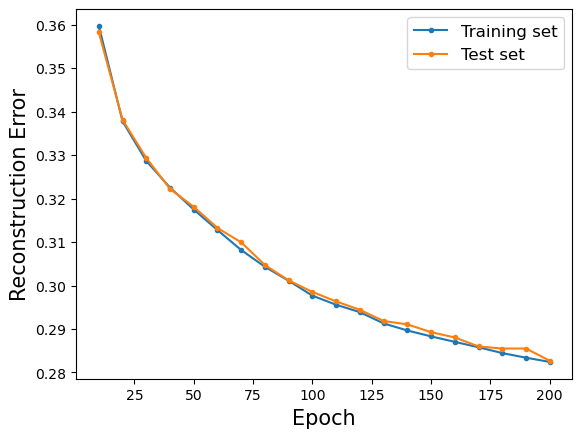

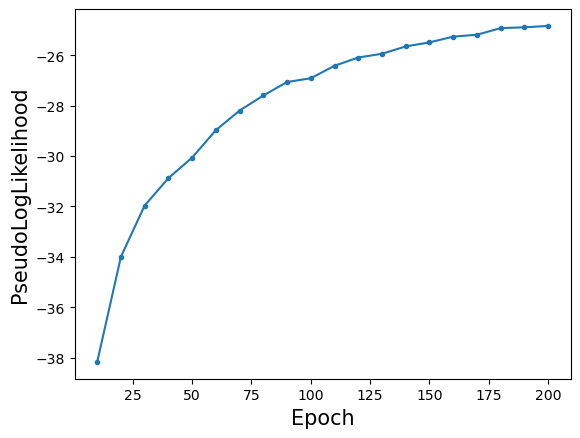

Training RBM 9/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361192 (train), 0.360526 (test), Pseud_Lik: -38.200172, Time: 1.914896, 
Ep 20, Rec er: 0.337573 (train), 0.338511 (test), Pseud_Lik: -34.139576, Time: 2.023575, 
Ep 30, Rec er: 0.327726 (train), 0.327688 (test), Pseud_Lik: -32.246161, Time: 2.257815, 
Ep 40, Rec er: 0.321805 (train), 0.322676 (test), Pseud_Lik: -30.986204, Time: 1.849798, 
Ep 50, Rec er: 0.317036 (train), 0.317708 (test), Pseud_Lik: -29.914974, Time: 1.908380, 
Ep 60, Rec er: 0.312595 (train), 0.313568 (test), Pseud_Lik: -29.012499, Time: 2.055829, 
Ep 70, Rec er: 0.308181 (train), 0.308559 (test), Pseud_Lik: -28.279994, Time: 2.043547, 
Ep 80, Rec er: 0.304417 (train), 0.305089 (test), Pseud_Lik: -27.715030, Time: 1.840000, 
Ep 90, Rec er: 0.300913 (train), 0.302613 (test), Pseud_Lik: -27.154217, Time: 1.928153, 
Ep 100, Rec er: 0.297505 (train), 0.298779 (test), Pse

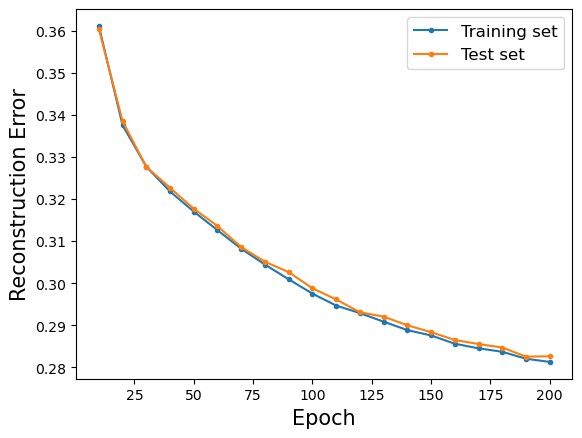

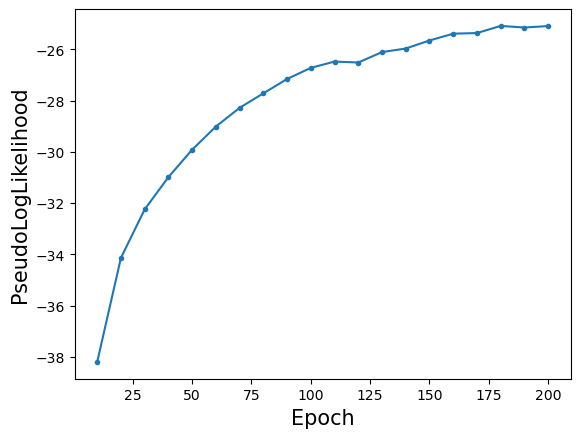

Training RBM 10/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359427 (train), 0.358872 (test), Pseud_Lik: -38.351854, Time: 1.965457, 
Ep 20, Rec er: 0.338458 (train), 0.339039 (test), Pseud_Lik: -34.466012, Time: 1.936453, 
Ep 30, Rec er: 0.327354 (train), 0.327923 (test), Pseud_Lik: -32.085167, Time: 1.888008, 
Ep 40, Rec er: 0.320296 (train), 0.322235 (test), Pseud_Lik: -30.474804, Time: 2.195158, 
Ep 50, Rec er: 0.315369 (train), 0.315792 (test), Pseud_Lik: -29.525735, Time: 2.181631, 
Ep 60, Rec er: 0.310846 (train), 0.311256 (test), Pseud_Lik: -28.812820, Time: 2.452309, 
Ep 70, Rec er: 0.306149 (train), 0.306944 (test), Pseud_Lik: -28.128522, Time: 1.960970, 
Ep 80, Rec er: 0.302838 (train), 0.302817 (test), Pseud_Lik: -27.570353, Time: 2.473121, 
Ep 90, Rec er: 0.299727 (train), 0.300571 (test), Pseud_Lik: -27.084698, Time: 2.395632, 
Ep 100, Rec er: 0.296860 (train), 0.297836 (test), Ps

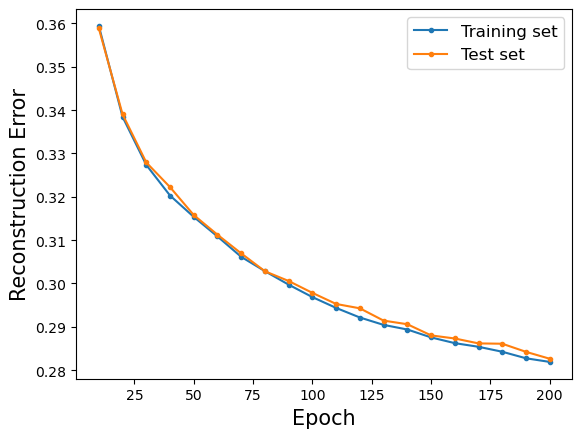

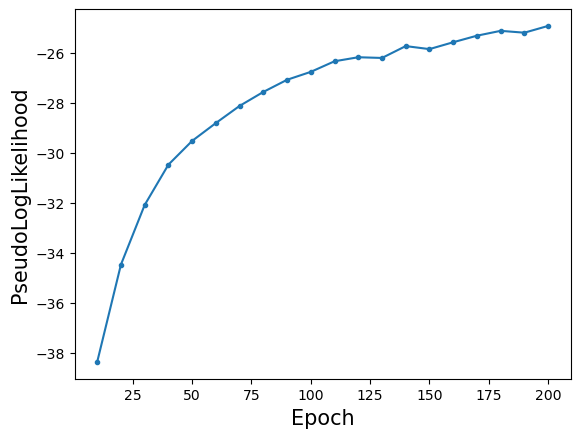

Training RBM 11/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360967 (train), 0.361182 (test), Pseud_Lik: -38.210740, Time: 1.996624, 
Ep 20, Rec er: 0.338399 (train), 0.338371 (test), Pseud_Lik: -34.183160, Time: 2.362386, 
Ep 30, Rec er: 0.327654 (train), 0.327707 (test), Pseud_Lik: -32.295877, Time: 1.952627, 
Ep 40, Rec er: 0.321687 (train), 0.322890 (test), Pseud_Lik: -30.785308, Time: 2.032040, 
Ep 50, Rec er: 0.316787 (train), 0.317485 (test), Pseud_Lik: -29.716583, Time: 2.148764, 
Ep 60, Rec er: 0.311733 (train), 0.311271 (test), Pseud_Lik: -29.167463, Time: 2.403731, 
Ep 70, Rec er: 0.307407 (train), 0.308052 (test), Pseud_Lik: -28.171265, Time: 2.423521, 
Ep 80, Rec er: 0.302733 (train), 0.303953 (test), Pseud_Lik: -27.736594, Time: 1.942636, 
Ep 90, Rec er: 0.299410 (train), 0.300489 (test), Pseud_Lik: -27.252996, Time: 1.889562, 
Ep 100, Rec er: 0.296346 (train), 0.297871 (test), Ps

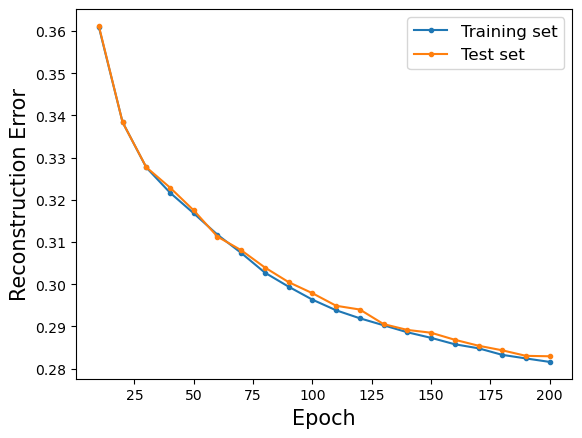

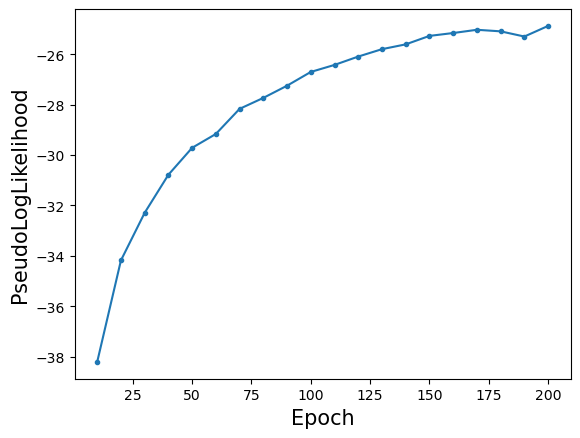

Training RBM 12/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359462 (train), 0.359402 (test), Pseud_Lik: -38.255642, Time: 1.797614, 
Ep 20, Rec er: 0.338180 (train), 0.338588 (test), Pseud_Lik: -34.158184, Time: 1.912610, 
Ep 30, Rec er: 0.328342 (train), 0.328085 (test), Pseud_Lik: -32.261757, Time: 2.311336, 
Ep 40, Rec er: 0.321232 (train), 0.321972 (test), Pseud_Lik: -30.993963, Time: 2.293731, 
Ep 50, Rec er: 0.316281 (train), 0.317249 (test), Pseud_Lik: -29.591495, Time: 1.913740, 
Ep 60, Rec er: 0.311490 (train), 0.311923 (test), Pseud_Lik: -28.681338, Time: 1.894009, 
Ep 70, Rec er: 0.307201 (train), 0.306487 (test), Pseud_Lik: -27.954905, Time: 1.926177, 
Ep 80, Rec er: 0.302309 (train), 0.302918 (test), Pseud_Lik: -27.203840, Time: 2.065289, 
Ep 90, Rec er: 0.299604 (train), 0.300206 (test), Pseud_Lik: -27.046902, Time: 1.993707, 
Ep 100, Rec er: 0.297001 (train), 0.297639 (test), Ps

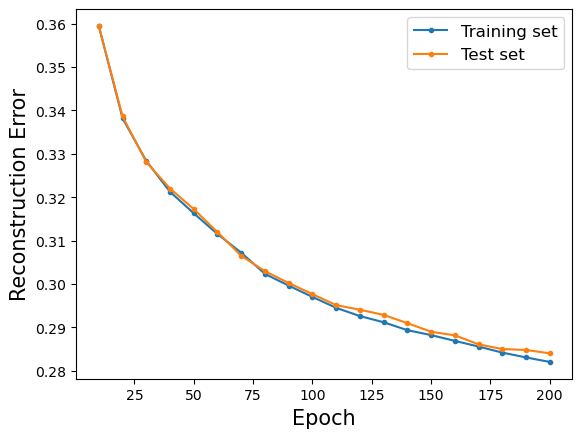

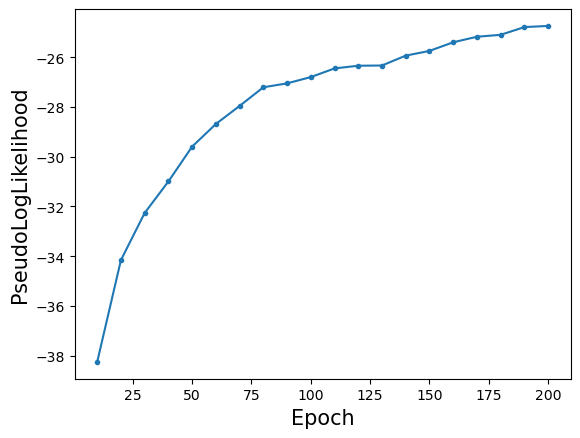

Training RBM 13/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359820 (train), 0.359665 (test), Pseud_Lik: -38.136045, Time: 1.826393, 
Ep 20, Rec er: 0.338479 (train), 0.338359 (test), Pseud_Lik: -34.061090, Time: 2.643637, 
Ep 30, Rec er: 0.327631 (train), 0.327577 (test), Pseud_Lik: -32.096193, Time: 2.267659, 
Ep 40, Rec er: 0.320859 (train), 0.320808 (test), Pseud_Lik: -30.507571, Time: 1.985495, 
Ep 50, Rec er: 0.316400 (train), 0.317610 (test), Pseud_Lik: -29.533030, Time: 2.120513, 
Ep 60, Rec er: 0.311466 (train), 0.312084 (test), Pseud_Lik: -28.894030, Time: 1.797202, 
Ep 70, Rec er: 0.307789 (train), 0.308216 (test), Pseud_Lik: -27.938474, Time: 1.878557, 
Ep 80, Rec er: 0.303634 (train), 0.303855 (test), Pseud_Lik: -27.404028, Time: 2.373603, 
Ep 90, Rec er: 0.300001 (train), 0.301422 (test), Pseud_Lik: -27.168881, Time: 2.048758, 
Ep 100, Rec er: 0.297802 (train), 0.298120 (test), Ps

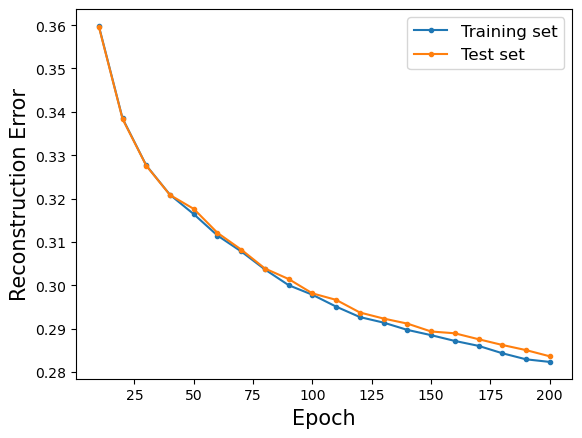

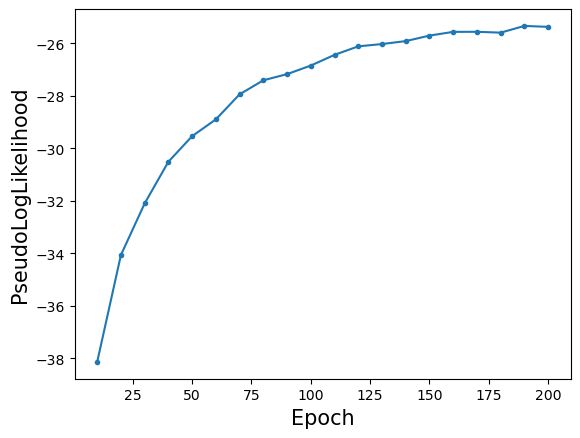

Training RBM 14/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359740 (train), 0.359633 (test), Pseud_Lik: -38.184045, Time: 1.728115, 
Ep 20, Rec er: 0.337828 (train), 0.338129 (test), Pseud_Lik: -34.273280, Time: 1.818549, 
Ep 30, Rec er: 0.327292 (train), 0.328246 (test), Pseud_Lik: -32.100408, Time: 1.889660, 
Ep 40, Rec er: 0.321434 (train), 0.321221 (test), Pseud_Lik: -30.743580, Time: 1.882700, 
Ep 50, Rec er: 0.316379 (train), 0.317227 (test), Pseud_Lik: -29.520668, Time: 1.819740, 
Ep 60, Rec er: 0.311118 (train), 0.311754 (test), Pseud_Lik: -28.846768, Time: 1.830673, 
Ep 70, Rec er: 0.306721 (train), 0.307418 (test), Pseud_Lik: -28.093597, Time: 1.819570, 
Ep 80, Rec er: 0.302916 (train), 0.304290 (test), Pseud_Lik: -27.669819, Time: 1.842518, 
Ep 90, Rec er: 0.299426 (train), 0.299790 (test), Pseud_Lik: -27.065971, Time: 1.965964, 
Ep 100, Rec er: 0.296417 (train), 0.297361 (test), Ps

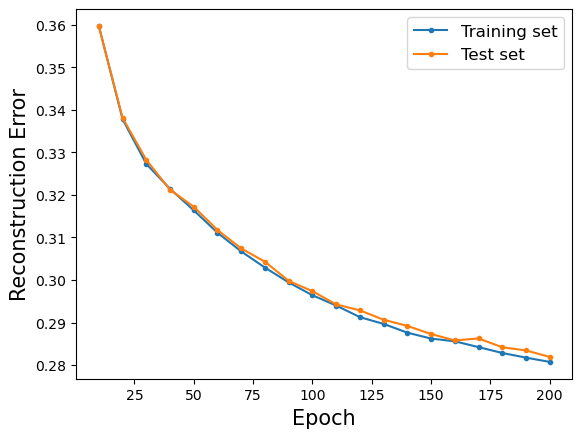

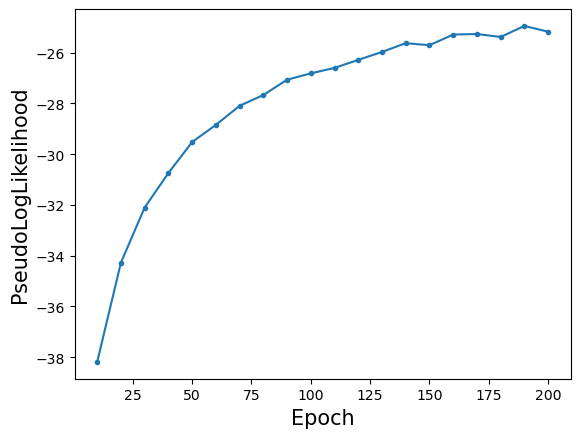

Training RBM 15/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361729 (train), 0.360575 (test), Pseud_Lik: -38.201154, Time: 1.787502, 
Ep 20, Rec er: 0.338675 (train), 0.339180 (test), Pseud_Lik: -34.582593, Time: 2.131622, 
Ep 30, Rec er: 0.327853 (train), 0.328906 (test), Pseud_Lik: -33.086140, Time: 2.128588, 
Ep 40, Rec er: 0.320207 (train), 0.320795 (test), Pseud_Lik: -31.196627, Time: 2.406605, 
Ep 50, Rec er: 0.314222 (train), 0.314269 (test), Pseud_Lik: -29.698286, Time: 2.596766, 
Ep 60, Rec er: 0.308528 (train), 0.309121 (test), Pseud_Lik: -28.718622, Time: 2.120012, 
Ep 70, Rec er: 0.303241 (train), 0.304939 (test), Pseud_Lik: -27.568410, Time: 1.936476, 
Ep 80, Rec er: 0.299243 (train), 0.299691 (test), Pseud_Lik: -27.233669, Time: 2.799631, 
Ep 90, Rec er: 0.296201 (train), 0.295946 (test), Pseud_Lik: -26.649436, Time: 2.245007, 
Ep 100, Rec er: 0.292722 (train), 0.293686 (test), Ps

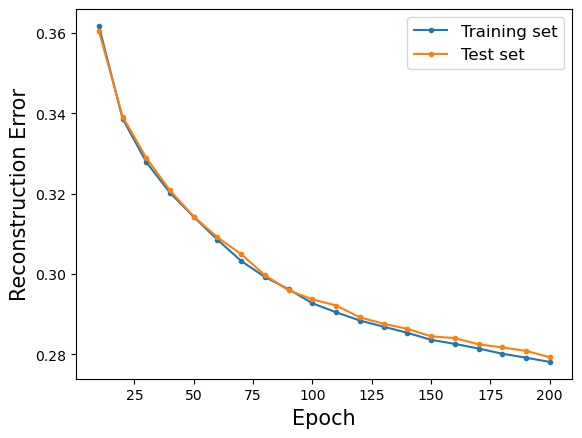

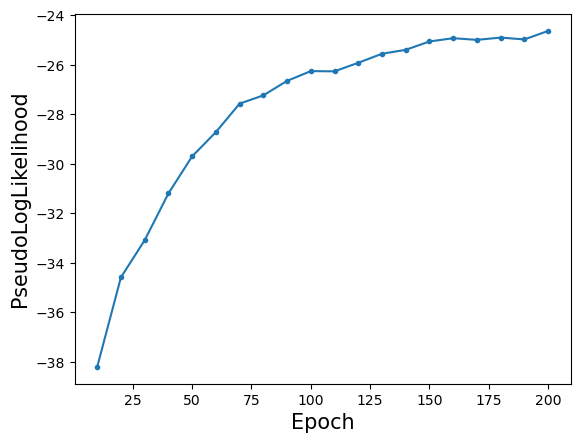

Training RBM 16/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358640 (train), 0.357898 (test), Pseud_Lik: -38.321844, Time: 2.075026, 
Ep 20, Rec er: 0.338140 (train), 0.338280 (test), Pseud_Lik: -34.208152, Time: 1.883818, 
Ep 30, Rec er: 0.327731 (train), 0.328341 (test), Pseud_Lik: -32.320994, Time: 2.350976, 
Ep 40, Rec er: 0.321411 (train), 0.322004 (test), Pseud_Lik: -30.503766, Time: 1.924985, 
Ep 50, Rec er: 0.316600 (train), 0.317459 (test), Pseud_Lik: -29.670624, Time: 2.155542, 
Ep 60, Rec er: 0.311503 (train), 0.313183 (test), Pseud_Lik: -28.750673, Time: 2.272704, 
Ep 70, Rec er: 0.306980 (train), 0.308033 (test), Pseud_Lik: -28.197577, Time: 1.840797, 
Ep 80, Rec er: 0.303280 (train), 0.304074 (test), Pseud_Lik: -27.475651, Time: 2.544142, 
Ep 90, Rec er: 0.299826 (train), 0.300941 (test), Pseud_Lik: -27.013777, Time: 2.167537, 
Ep 100, Rec er: 0.297059 (train), 0.298359 (test), Ps

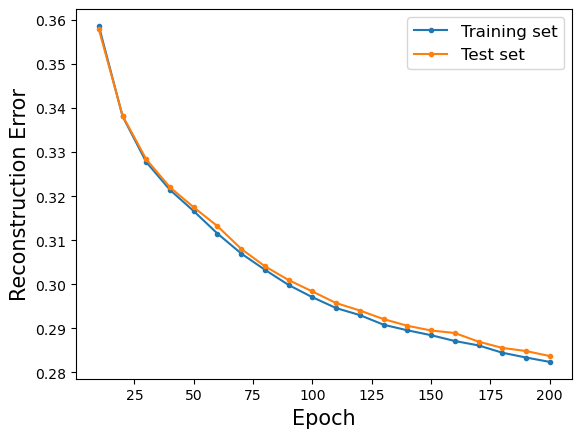

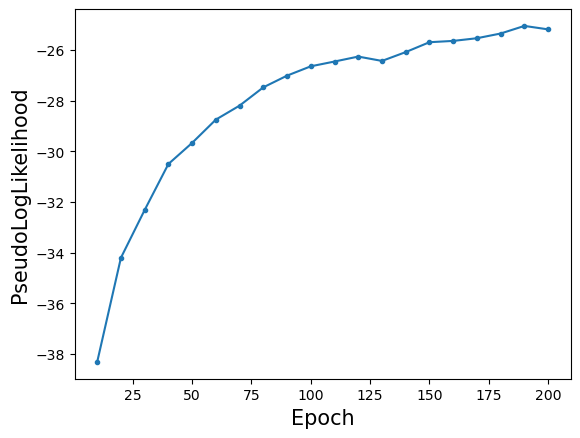

Training RBM 17/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360764 (train), 0.361091 (test), Pseud_Lik: -38.161541, Time: 1.907742, 
Ep 20, Rec er: 0.338322 (train), 0.337872 (test), Pseud_Lik: -34.220903, Time: 2.342560, 
Ep 30, Rec er: 0.327653 (train), 0.328839 (test), Pseud_Lik: -32.695724, Time: 1.947220, 
Ep 40, Rec er: 0.320878 (train), 0.321548 (test), Pseud_Lik: -31.144642, Time: 1.906499, 
Ep 50, Rec er: 0.315173 (train), 0.315462 (test), Pseud_Lik: -29.788944, Time: 1.824309, 
Ep 60, Rec er: 0.309966 (train), 0.310827 (test), Pseud_Lik: -28.568311, Time: 2.132500, 
Ep 70, Rec er: 0.305608 (train), 0.306641 (test), Pseud_Lik: -27.928186, Time: 1.978253, 
Ep 80, Rec er: 0.301918 (train), 0.302838 (test), Pseud_Lik: -27.437023, Time: 2.756220, 
Ep 90, Rec er: 0.298556 (train), 0.299523 (test), Pseud_Lik: -27.098193, Time: 1.995832, 
Ep 100, Rec er: 0.296334 (train), 0.297326 (test), Ps

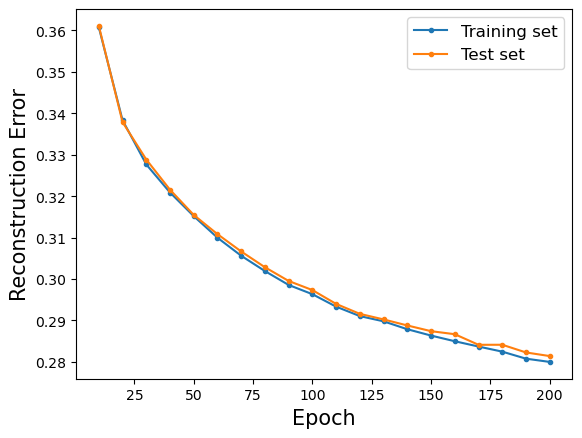

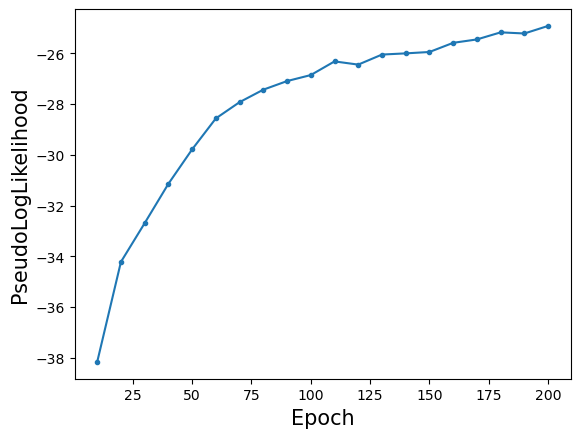

Training RBM 18/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362533 (train), 0.361712 (test), Pseud_Lik: -38.411740, Time: 1.807569, 
Ep 20, Rec er: 0.338976 (train), 0.338930 (test), Pseud_Lik: -34.482956, Time: 2.330972, 
Ep 30, Rec er: 0.326753 (train), 0.326843 (test), Pseud_Lik: -32.558546, Time: 1.914888, 
Ep 40, Rec er: 0.318670 (train), 0.320418 (test), Pseud_Lik: -30.529202, Time: 1.963429, 
Ep 50, Rec er: 0.313081 (train), 0.314015 (test), Pseud_Lik: -29.336071, Time: 1.890913, 
Ep 60, Rec er: 0.307828 (train), 0.307592 (test), Pseud_Lik: -28.497925, Time: 2.062443, 
Ep 70, Rec er: 0.303470 (train), 0.303672 (test), Pseud_Lik: -27.848497, Time: 2.014523, 
Ep 80, Rec er: 0.299228 (train), 0.299821 (test), Pseud_Lik: -27.115416, Time: 2.181600, 
Ep 90, Rec er: 0.295895 (train), 0.297156 (test), Pseud_Lik: -26.780070, Time: 2.194531, 
Ep 100, Rec er: 0.293093 (train), 0.294334 (test), Ps

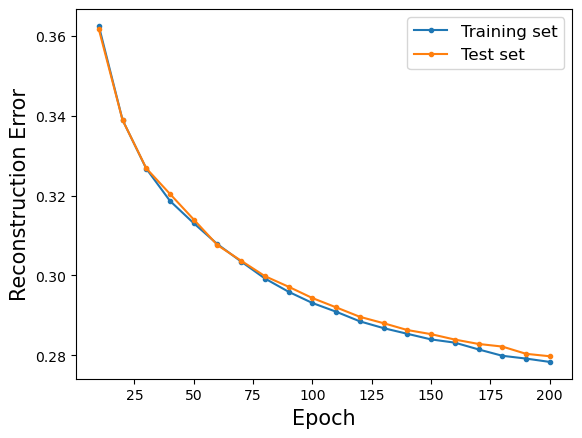

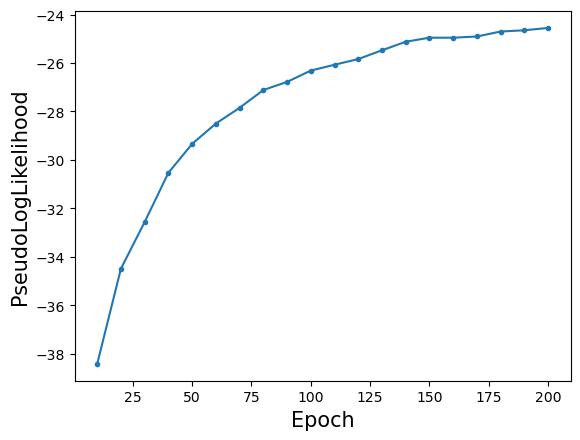

Training RBM 19/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360240 (train), 0.359016 (test), Pseud_Lik: -38.268783, Time: 2.701138, 
Ep 20, Rec er: 0.338585 (train), 0.338698 (test), Pseud_Lik: -33.698936, Time: 2.269398, 
Ep 30, Rec er: 0.329227 (train), 0.329897 (test), Pseud_Lik: -31.744150, Time: 2.437481, 
Ep 40, Rec er: 0.322989 (train), 0.324174 (test), Pseud_Lik: -30.835097, Time: 2.158584, 
Ep 50, Rec er: 0.319021 (train), 0.320973 (test), Pseud_Lik: -29.861851, Time: 2.522357, 
Ep 60, Rec er: 0.314860 (train), 0.315303 (test), Pseud_Lik: -29.412509, Time: 2.642868, 
Ep 70, Rec er: 0.310703 (train), 0.311404 (test), Pseud_Lik: -28.695692, Time: 2.150734, 
Ep 80, Rec er: 0.307014 (train), 0.307716 (test), Pseud_Lik: -28.121602, Time: 2.319702, 
Ep 90, Rec er: 0.304069 (train), 0.304962 (test), Pseud_Lik: -27.379945, Time: 3.029255, 
Ep 100, Rec er: 0.300939 (train), 0.301820 (test), Ps

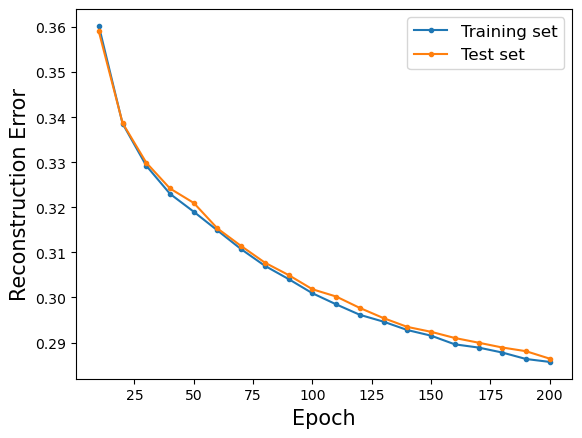

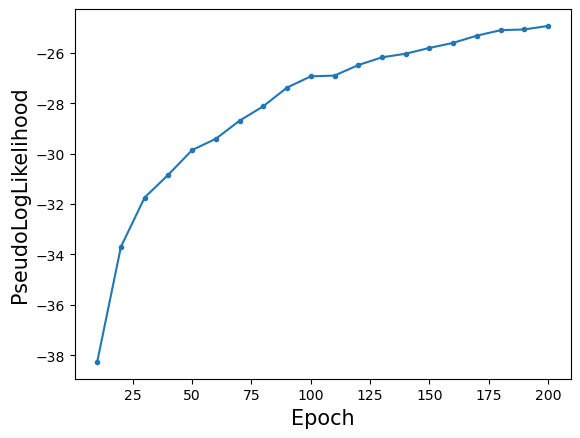

Training RBM 20/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360657 (train), 0.360792 (test), Pseud_Lik: -38.291916, Time: 1.935681, 
Ep 20, Rec er: 0.338938 (train), 0.338693 (test), Pseud_Lik: -34.348510, Time: 1.928526, 
Ep 30, Rec er: 0.328144 (train), 0.328201 (test), Pseud_Lik: -32.253139, Time: 1.909493, 
Ep 40, Rec er: 0.322018 (train), 0.324034 (test), Pseud_Lik: -30.903739, Time: 2.423552, 
Ep 50, Rec er: 0.316971 (train), 0.317787 (test), Pseud_Lik: -29.772593, Time: 1.992320, 
Ep 60, Rec er: 0.312482 (train), 0.312828 (test), Pseud_Lik: -29.150974, Time: 1.926870, 
Ep 70, Rec er: 0.307670 (train), 0.307653 (test), Pseud_Lik: -28.565058, Time: 1.969350, 
Ep 80, Rec er: 0.303181 (train), 0.304888 (test), Pseud_Lik: -27.646765, Time: 2.041478, 
Ep 90, Rec er: 0.300138 (train), 0.300981 (test), Pseud_Lik: -27.270076, Time: 2.013754, 
Ep 100, Rec er: 0.296911 (train), 0.297288 (test), Ps

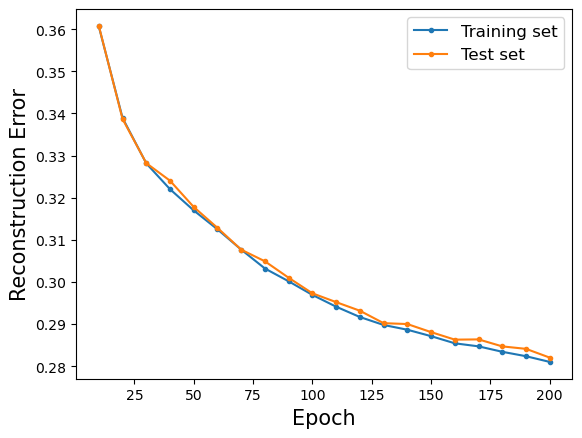

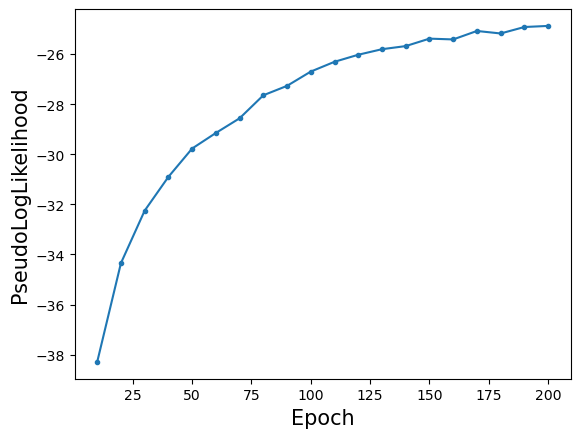

Training RBM 21/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362287 (train), 0.361339 (test), Pseud_Lik: -38.504176, Time: 2.132577, 
Ep 20, Rec er: 0.339188 (train), 0.339933 (test), Pseud_Lik: -34.326660, Time: 1.915726, 
Ep 30, Rec er: 0.329034 (train), 0.329037 (test), Pseud_Lik: -32.341564, Time: 2.097852, 
Ep 40, Rec er: 0.322458 (train), 0.322612 (test), Pseud_Lik: -30.880647, Time: 2.192267, 
Ep 50, Rec er: 0.316893 (train), 0.317224 (test), Pseud_Lik: -29.877870, Time: 2.008970, 
Ep 60, Rec er: 0.312412 (train), 0.312487 (test), Pseud_Lik: -28.960196, Time: 1.990243, 
Ep 70, Rec er: 0.307821 (train), 0.308806 (test), Pseud_Lik: -27.986210, Time: 1.992530, 
Ep 80, Rec er: 0.304315 (train), 0.305035 (test), Pseud_Lik: -27.626922, Time: 1.991873, 
Ep 90, Rec er: 0.301438 (train), 0.301206 (test), Pseud_Lik: -26.942511, Time: 1.899519, 
Ep 100, Rec er: 0.298221 (train), 0.299749 (test), Ps

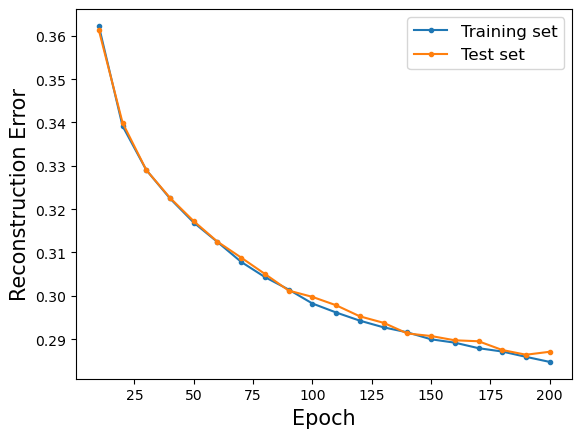

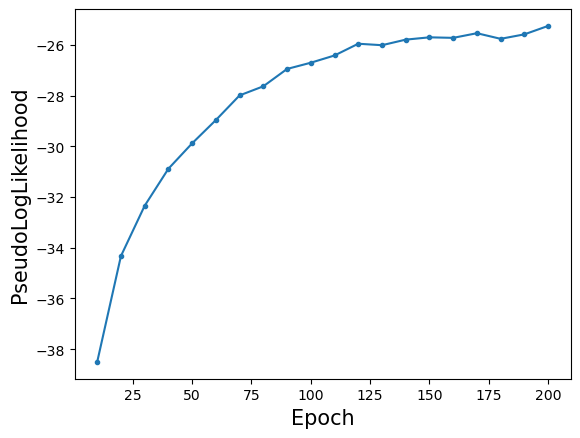

Training RBM 22/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361713 (train), 0.360437 (test), Pseud_Lik: -38.244160, Time: 2.036957, 
Ep 20, Rec er: 0.338303 (train), 0.338941 (test), Pseud_Lik: -34.300779, Time: 1.804054, 
Ep 30, Rec er: 0.327146 (train), 0.328164 (test), Pseud_Lik: -32.293487, Time: 1.984776, 
Ep 40, Rec er: 0.320010 (train), 0.319170 (test), Pseud_Lik: -30.509840, Time: 1.849972, 
Ep 50, Rec er: 0.314696 (train), 0.315486 (test), Pseud_Lik: -29.260357, Time: 1.852795, 
Ep 60, Rec er: 0.309782 (train), 0.310250 (test), Pseud_Lik: -28.661461, Time: 1.937001, 
Ep 70, Rec er: 0.305136 (train), 0.305661 (test), Pseud_Lik: -27.776879, Time: 2.094750, 
Ep 80, Rec er: 0.301108 (train), 0.301876 (test), Pseud_Lik: -27.238224, Time: 1.924620, 
Ep 90, Rec er: 0.297807 (train), 0.299419 (test), Pseud_Lik: -26.709324, Time: 2.274587, 
Ep 100, Rec er: 0.294919 (train), 0.295902 (test), Ps

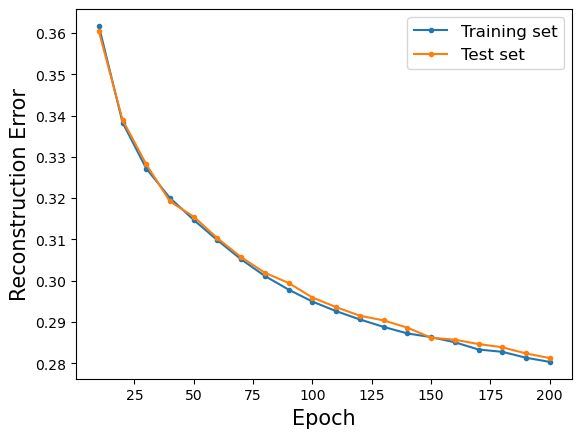

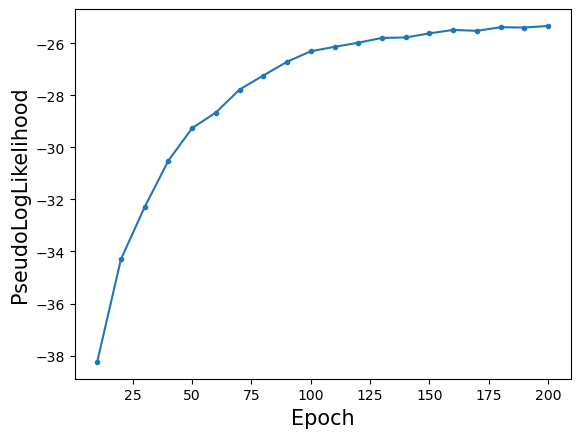

Training RBM 23/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361046 (train), 0.361023 (test), Pseud_Lik: -38.348868, Time: 3.102549, 
Ep 20, Rec er: 0.338390 (train), 0.338690 (test), Pseud_Lik: -34.371580, Time: 2.272260, 
Ep 30, Rec er: 0.327464 (train), 0.327653 (test), Pseud_Lik: -32.249864, Time: 2.124543, 
Ep 40, Rec er: 0.320121 (train), 0.320656 (test), Pseud_Lik: -30.797459, Time: 2.205503, 
Ep 50, Rec er: 0.314988 (train), 0.315700 (test), Pseud_Lik: -29.492686, Time: 1.997391, 
Ep 60, Rec er: 0.309648 (train), 0.310960 (test), Pseud_Lik: -28.828600, Time: 2.220777, 
Ep 70, Rec er: 0.305767 (train), 0.306091 (test), Pseud_Lik: -28.025658, Time: 3.107759, 
Ep 80, Rec er: 0.301780 (train), 0.301753 (test), Pseud_Lik: -27.470114, Time: 2.199217, 
Ep 90, Rec er: 0.298430 (train), 0.299265 (test), Pseud_Lik: -27.152024, Time: 2.213830, 
Ep 100, Rec er: 0.294674 (train), 0.296289 (test), Ps

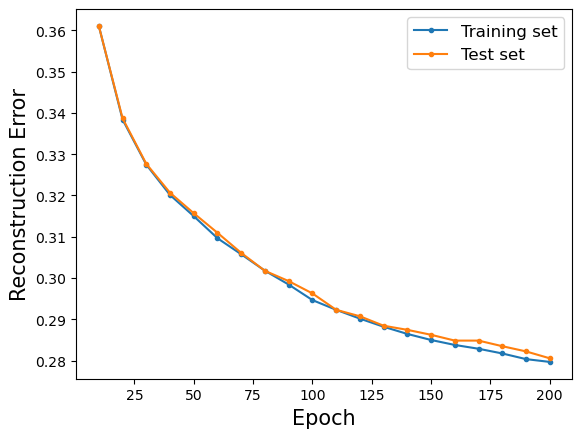

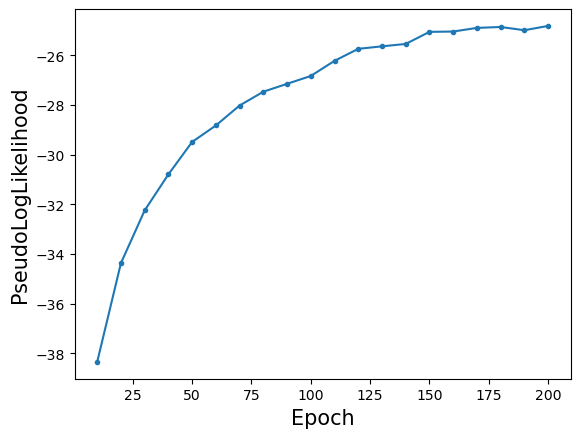

Training RBM 24/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361108 (train), 0.360980 (test), Pseud_Lik: -38.245907, Time: 2.358786, 
Ep 20, Rec er: 0.339027 (train), 0.338609 (test), Pseud_Lik: -34.325284, Time: 1.929169, 
Ep 30, Rec er: 0.327212 (train), 0.327032 (test), Pseud_Lik: -32.170806, Time: 2.824052, 
Ep 40, Rec er: 0.320055 (train), 0.320844 (test), Pseud_Lik: -30.497620, Time: 2.027382, 
Ep 50, Rec er: 0.313946 (train), 0.314977 (test), Pseud_Lik: -29.590919, Time: 2.175214, 
Ep 60, Rec er: 0.309227 (train), 0.310829 (test), Pseud_Lik: -28.907025, Time: 2.225805, 
Ep 70, Rec er: 0.304742 (train), 0.305558 (test), Pseud_Lik: -28.151486, Time: 2.217720, 
Ep 80, Rec er: 0.301106 (train), 0.301443 (test), Pseud_Lik: -27.553355, Time: 2.329473, 
Ep 90, Rec er: 0.297868 (train), 0.298939 (test), Pseud_Lik: -27.127977, Time: 2.392716, 
Ep 100, Rec er: 0.294643 (train), 0.295566 (test), Ps

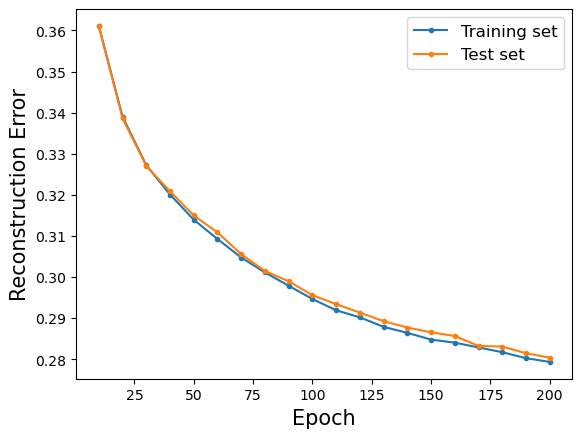

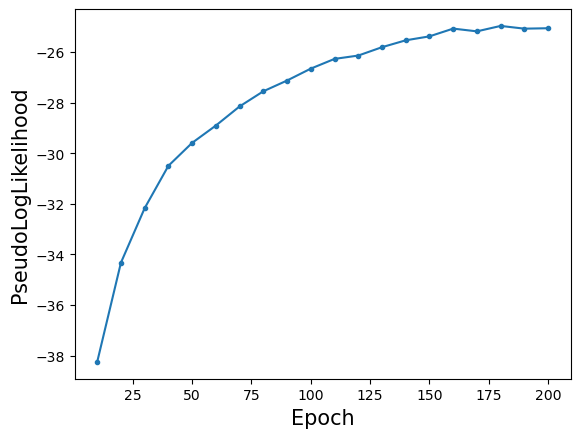

Training RBM 25/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360786 (train), 0.360157 (test), Pseud_Lik: -38.209628, Time: 1.867111, 
Ep 20, Rec er: 0.338306 (train), 0.338711 (test), Pseud_Lik: -34.155759, Time: 1.911232, 
Ep 30, Rec er: 0.327848 (train), 0.328566 (test), Pseud_Lik: -32.561443, Time: 2.049750, 
Ep 40, Rec er: 0.321401 (train), 0.322458 (test), Pseud_Lik: -30.957864, Time: 1.876474, 
Ep 50, Rec er: 0.316430 (train), 0.316593 (test), Pseud_Lik: -29.891430, Time: 1.944074, 
Ep 60, Rec er: 0.310956 (train), 0.311545 (test), Pseud_Lik: -28.976800, Time: 2.019287, 
Ep 70, Rec er: 0.306547 (train), 0.306930 (test), Pseud_Lik: -28.051458, Time: 2.268689, 
Ep 80, Rec er: 0.302518 (train), 0.303187 (test), Pseud_Lik: -27.337220, Time: 2.041556, 
Ep 90, Rec er: 0.298541 (train), 0.300124 (test), Pseud_Lik: -26.842471, Time: 2.166716, 
Ep 100, Rec er: 0.295509 (train), 0.297247 (test), Ps

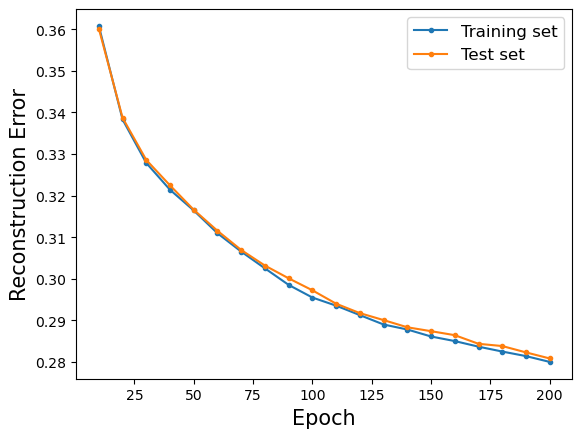

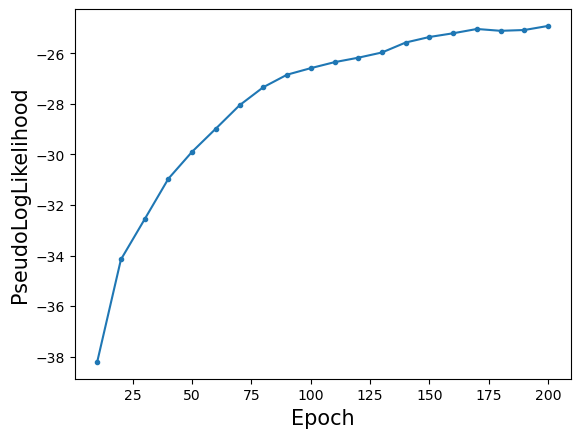

Training RBM 26/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362098 (train), 0.362243 (test), Pseud_Lik: -38.359525, Time: 2.074271, 
Ep 20, Rec er: 0.339099 (train), 0.339309 (test), Pseud_Lik: -34.861332, Time: 1.862280, 
Ep 30, Rec er: 0.327264 (train), 0.328228 (test), Pseud_Lik: -32.470691, Time: 1.946644, 
Ep 40, Rec er: 0.319432 (train), 0.319402 (test), Pseud_Lik: -30.737536, Time: 2.032320, 
Ep 50, Rec er: 0.313168 (train), 0.313930 (test), Pseud_Lik: -29.534679, Time: 2.076843, 
Ep 60, Rec er: 0.307813 (train), 0.308445 (test), Pseud_Lik: -28.614126, Time: 1.883378, 
Ep 70, Rec er: 0.303462 (train), 0.304036 (test), Pseud_Lik: -27.741136, Time: 2.020069, 
Ep 80, Rec er: 0.298801 (train), 0.298434 (test), Pseud_Lik: -27.203712, Time: 2.164445, 
Ep 90, Rec er: 0.295302 (train), 0.296636 (test), Pseud_Lik: -26.652683, Time: 2.005588, 
Ep 100, Rec er: 0.292416 (train), 0.294223 (test), Ps

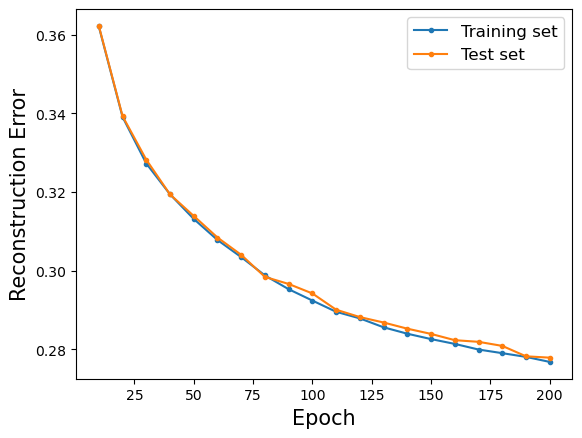

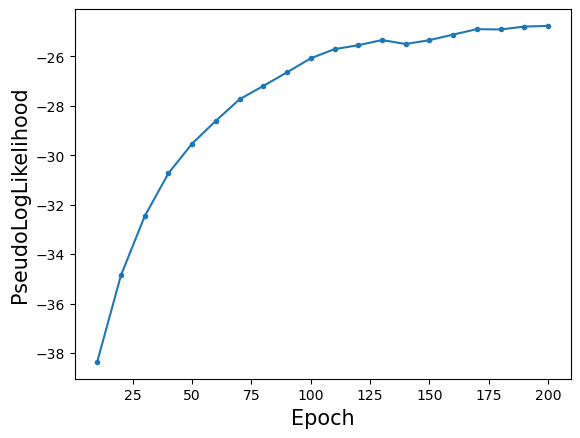

Training RBM 27/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362232 (train), 0.362057 (test), Pseud_Lik: -38.332854, Time: 2.443228, 
Ep 20, Rec er: 0.338291 (train), 0.338597 (test), Pseud_Lik: -34.731385, Time: 1.987693, 
Ep 30, Rec er: 0.326620 (train), 0.326461 (test), Pseud_Lik: -32.424289, Time: 2.503661, 
Ep 40, Rec er: 0.319025 (train), 0.319366 (test), Pseud_Lik: -30.877111, Time: 1.905000, 
Ep 50, Rec er: 0.312377 (train), 0.313689 (test), Pseud_Lik: -29.596954, Time: 1.873286, 
Ep 60, Rec er: 0.307113 (train), 0.307726 (test), Pseud_Lik: -28.540351, Time: 1.894334, 
Ep 70, Rec er: 0.302147 (train), 0.302597 (test), Pseud_Lik: -27.632169, Time: 1.918343, 
Ep 80, Rec er: 0.298629 (train), 0.299151 (test), Pseud_Lik: -27.161891, Time: 2.098277, 
Ep 90, Rec er: 0.294818 (train), 0.295867 (test), Pseud_Lik: -26.668224, Time: 1.899505, 
Ep 100, Rec er: 0.292184 (train), 0.293014 (test), Ps

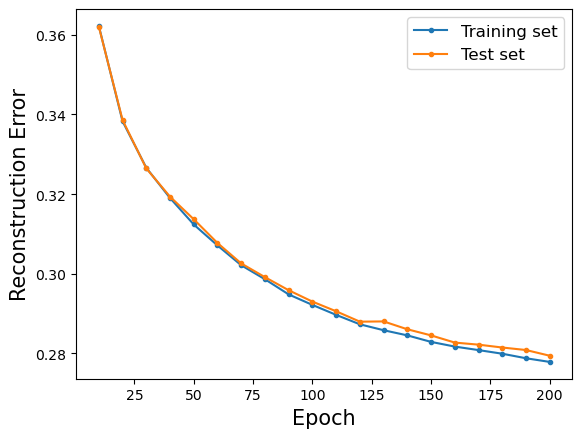

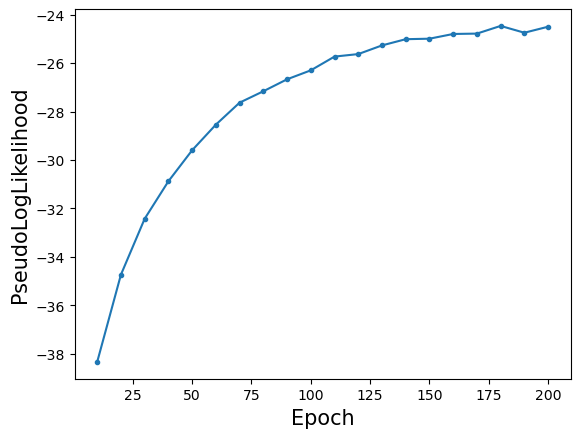

Training RBM 28/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360082 (train), 0.359514 (test), Pseud_Lik: -38.119044, Time: 2.168806, 
Ep 20, Rec er: 0.337564 (train), 0.337353 (test), Pseud_Lik: -34.136688, Time: 2.232944, 
Ep 30, Rec er: 0.327289 (train), 0.327899 (test), Pseud_Lik: -32.070392, Time: 2.302647, 
Ep 40, Rec er: 0.321399 (train), 0.321997 (test), Pseud_Lik: -30.850314, Time: 1.870736, 
Ep 50, Rec er: 0.316592 (train), 0.317536 (test), Pseud_Lik: -29.586298, Time: 1.843881, 
Ep 60, Rec er: 0.311850 (train), 0.311896 (test), Pseud_Lik: -28.708144, Time: 1.985933, 
Ep 70, Rec er: 0.307550 (train), 0.307573 (test), Pseud_Lik: -28.117745, Time: 2.020214, 
Ep 80, Rec er: 0.303397 (train), 0.303572 (test), Pseud_Lik: -27.622265, Time: 2.053975, 
Ep 90, Rec er: 0.299626 (train), 0.299958 (test), Pseud_Lik: -27.387487, Time: 1.935654, 
Ep 100, Rec er: 0.296752 (train), 0.298013 (test), Ps

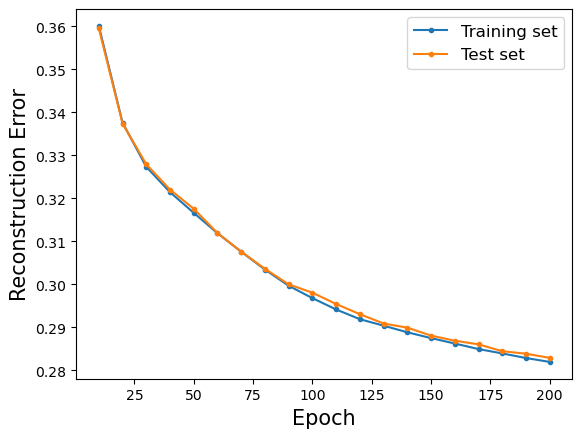

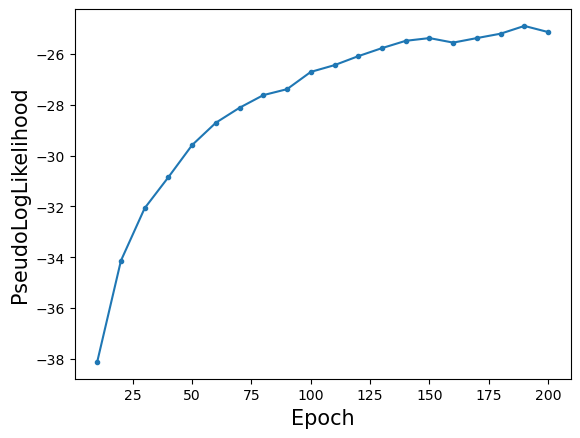

Training RBM 29/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361399 (train), 0.360710 (test), Pseud_Lik: -38.177980, Time: 1.794205, 
Ep 20, Rec er: 0.338759 (train), 0.339987 (test), Pseud_Lik: -34.624441, Time: 1.831266, 
Ep 30, Rec er: 0.327425 (train), 0.328174 (test), Pseud_Lik: -32.402142, Time: 1.841517, 
Ep 40, Rec er: 0.319529 (train), 0.320739 (test), Pseud_Lik: -30.866949, Time: 1.869911, 
Ep 50, Rec er: 0.314042 (train), 0.314453 (test), Pseud_Lik: -29.675947, Time: 1.872541, 
Ep 60, Rec er: 0.308970 (train), 0.309442 (test), Pseud_Lik: -28.713573, Time: 1.883723, 
Ep 70, Rec er: 0.303909 (train), 0.304841 (test), Pseud_Lik: -27.783772, Time: 1.922654, 
Ep 80, Rec er: 0.300644 (train), 0.301945 (test), Pseud_Lik: -27.326057, Time: 2.079091, 
Ep 90, Rec er: 0.296551 (train), 0.297164 (test), Pseud_Lik: -26.983075, Time: 1.974856, 
Ep 100, Rec er: 0.293491 (train), 0.294983 (test), Ps

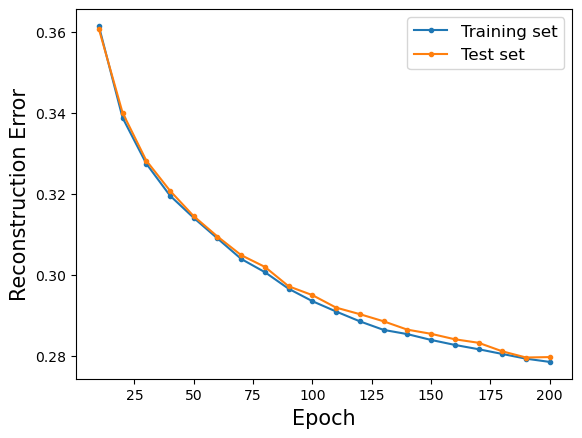

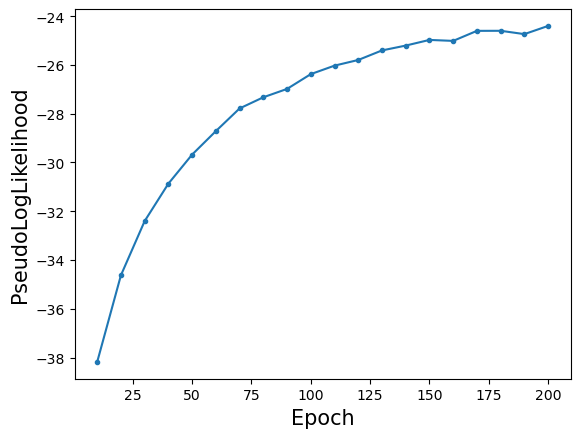

Training RBM 30/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361204 (train), 0.362386 (test), Pseud_Lik: -38.284545, Time: 1.851590, 
Ep 20, Rec er: 0.339522 (train), 0.340393 (test), Pseud_Lik: -34.440973, Time: 1.755620, 
Ep 30, Rec er: 0.328826 (train), 0.329233 (test), Pseud_Lik: -32.432873, Time: 1.863210, 
Ep 40, Rec er: 0.321510 (train), 0.321818 (test), Pseud_Lik: -30.980310, Time: 1.872925, 
Ep 50, Rec er: 0.316023 (train), 0.316946 (test), Pseud_Lik: -30.224964, Time: 2.120299, 
Ep 60, Rec er: 0.311060 (train), 0.312336 (test), Pseud_Lik: -29.101988, Time: 2.428511, 
Ep 70, Rec er: 0.306574 (train), 0.307068 (test), Pseud_Lik: -28.270784, Time: 1.858380, 
Ep 80, Rec er: 0.302201 (train), 0.302348 (test), Pseud_Lik: -27.708111, Time: 1.927273, 
Ep 90, Rec er: 0.298234 (train), 0.299569 (test), Pseud_Lik: -27.044006, Time: 1.951658, 
Ep 100, Rec er: 0.295692 (train), 0.296233 (test), Ps

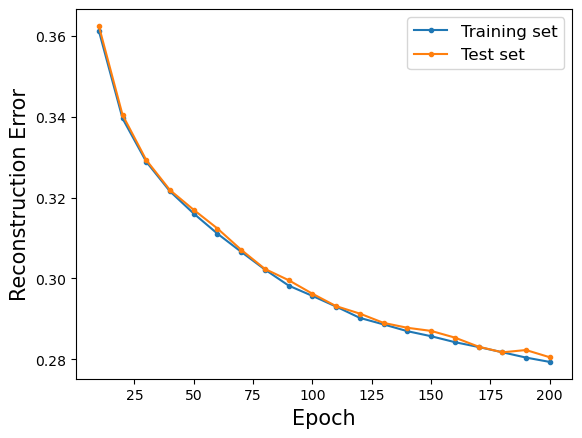

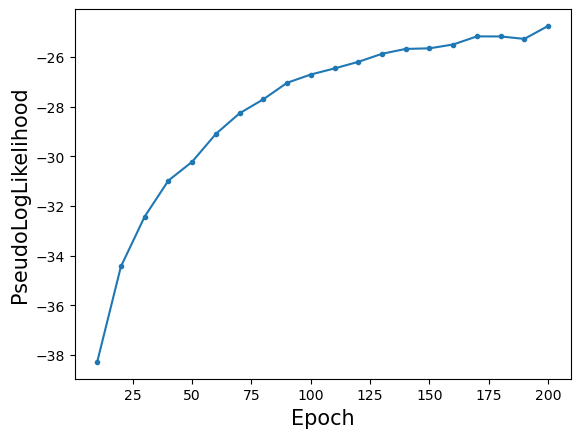

Training RBM 31/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359776 (train), 0.358710 (test), Pseud_Lik: -38.286629, Time: 1.816910, 
Ep 20, Rec er: 0.338441 (train), 0.338942 (test), Pseud_Lik: -34.117820, Time: 1.928648, 
Ep 30, Rec er: 0.328929 (train), 0.329017 (test), Pseud_Lik: -32.219241, Time: 2.524771, 
Ep 40, Rec er: 0.321969 (train), 0.323369 (test), Pseud_Lik: -30.824638, Time: 1.893929, 
Ep 50, Rec er: 0.316708 (train), 0.317575 (test), Pseud_Lik: -29.902430, Time: 2.105540, 
Ep 60, Rec er: 0.311543 (train), 0.312638 (test), Pseud_Lik: -28.946792, Time: 2.294486, 
Ep 70, Rec er: 0.307129 (train), 0.307018 (test), Pseud_Lik: -28.188255, Time: 1.860968, 
Ep 80, Rec er: 0.302882 (train), 0.303399 (test), Pseud_Lik: -27.538984, Time: 1.868797, 
Ep 90, Rec er: 0.299049 (train), 0.299610 (test), Pseud_Lik: -27.154676, Time: 2.246194, 
Ep 100, Rec er: 0.295921 (train), 0.296402 (test), Ps

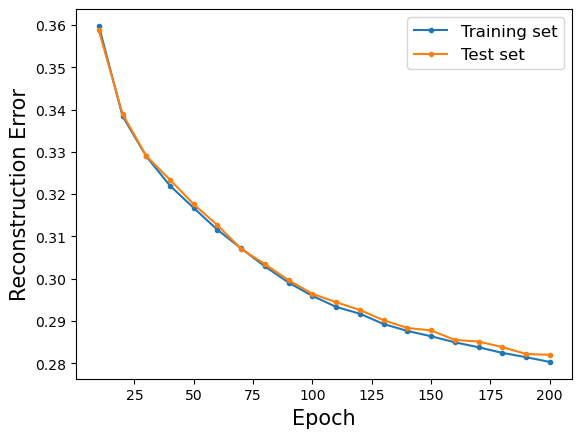

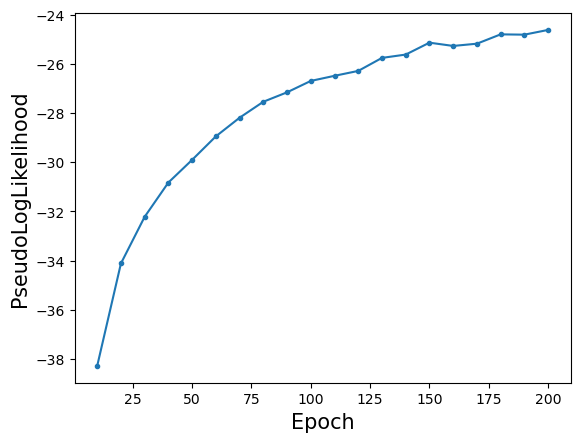

Training RBM 32/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362605 (train), 0.361785 (test), Pseud_Lik: -38.287844, Time: 1.713360, 
Ep 20, Rec er: 0.338559 (train), 0.338704 (test), Pseud_Lik: -34.743151, Time: 1.754898, 
Ep 30, Rec er: 0.325954 (train), 0.326690 (test), Pseud_Lik: -32.588656, Time: 1.774656, 
Ep 40, Rec er: 0.319174 (train), 0.319966 (test), Pseud_Lik: -31.056443, Time: 1.785536, 
Ep 50, Rec er: 0.313745 (train), 0.314107 (test), Pseud_Lik: -29.587298, Time: 1.796639, 
Ep 60, Rec er: 0.308991 (train), 0.308855 (test), Pseud_Lik: -28.648343, Time: 1.808717, 
Ep 70, Rec er: 0.303783 (train), 0.304342 (test), Pseud_Lik: -27.672549, Time: 1.820794, 
Ep 80, Rec er: 0.299773 (train), 0.299860 (test), Pseud_Lik: -27.259552, Time: 1.876213, 
Ep 90, Rec er: 0.296625 (train), 0.297180 (test), Pseud_Lik: -26.798196, Time: 1.921686, 
Ep 100, Rec er: 0.292897 (train), 0.294339 (test), Ps

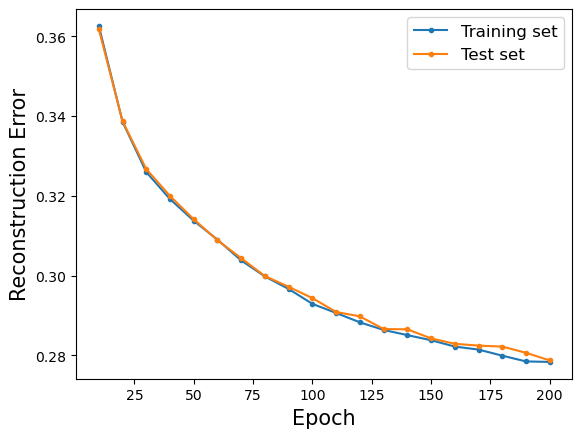

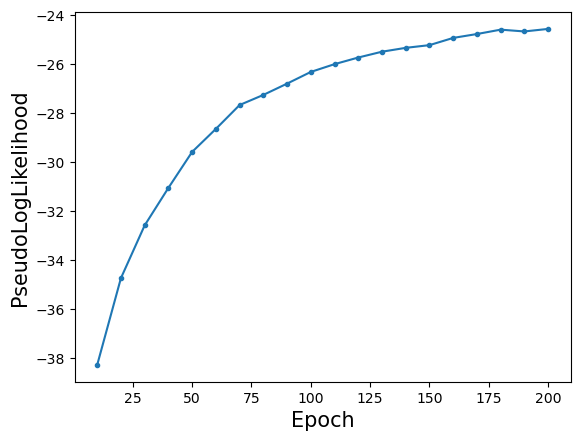

Training RBM 33/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362034 (train), 0.361877 (test), Pseud_Lik: -38.398242, Time: 1.704967, 
Ep 20, Rec er: 0.339692 (train), 0.339435 (test), Pseud_Lik: -34.527877, Time: 1.735974, 
Ep 30, Rec er: 0.328439 (train), 0.328543 (test), Pseud_Lik: -32.648877, Time: 1.758295, 
Ep 40, Rec er: 0.320278 (train), 0.320663 (test), Pseud_Lik: -31.112640, Time: 1.789599, 
Ep 50, Rec er: 0.314407 (train), 0.314508 (test), Pseud_Lik: -29.602826, Time: 1.803269, 
Ep 60, Rec er: 0.308721 (train), 0.309319 (test), Pseud_Lik: -28.624526, Time: 1.805284, 
Ep 70, Rec er: 0.303938 (train), 0.304999 (test), Pseud_Lik: -27.580415, Time: 1.807997, 
Ep 80, Rec er: 0.300027 (train), 0.301018 (test), Pseud_Lik: -26.970901, Time: 1.884950, 
Ep 90, Rec er: 0.296578 (train), 0.297061 (test), Pseud_Lik: -26.720753, Time: 1.835259, 
Ep 100, Rec er: 0.293714 (train), 0.295120 (test), Ps

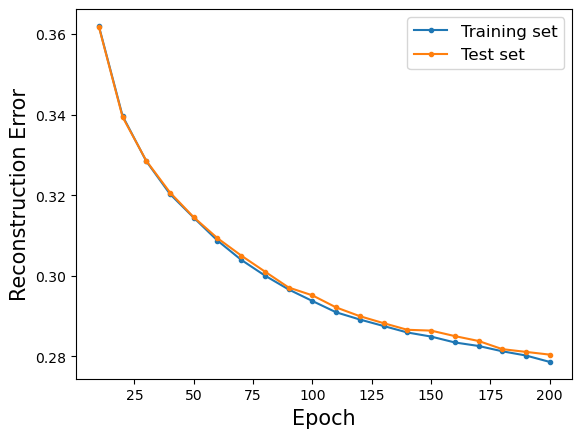

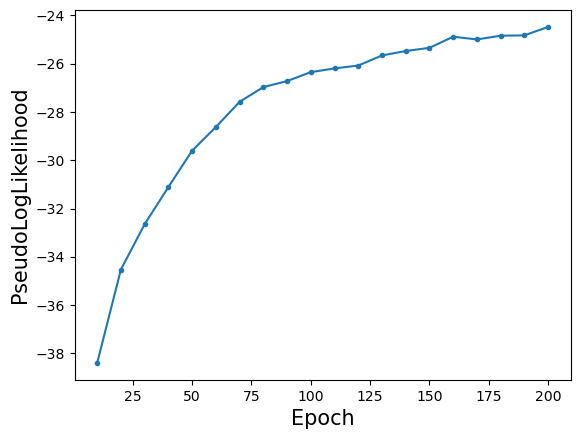

Training RBM 34/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362209 (train), 0.361032 (test), Pseud_Lik: -38.179790, Time: 1.903147, 
Ep 20, Rec er: 0.339884 (train), 0.340100 (test), Pseud_Lik: -34.739700, Time: 1.840231, 
Ep 30, Rec er: 0.328209 (train), 0.328623 (test), Pseud_Lik: -32.518574, Time: 1.779477, 
Ep 40, Rec er: 0.320371 (train), 0.319779 (test), Pseud_Lik: -30.984003, Time: 1.788757, 
Ep 50, Rec er: 0.315478 (train), 0.315833 (test), Pseud_Lik: -29.779086, Time: 1.840317, 
Ep 60, Rec er: 0.310555 (train), 0.310781 (test), Pseud_Lik: -28.904560, Time: 1.844164, 
Ep 70, Rec er: 0.305861 (train), 0.305688 (test), Pseud_Lik: -28.408509, Time: 1.825014, 
Ep 80, Rec er: 0.301877 (train), 0.302211 (test), Pseud_Lik: -27.769701, Time: 1.826544, 
Ep 90, Rec er: 0.297719 (train), 0.298287 (test), Pseud_Lik: -27.232745, Time: 1.840390, 
Ep 100, Rec er: 0.294487 (train), 0.296687 (test), Ps

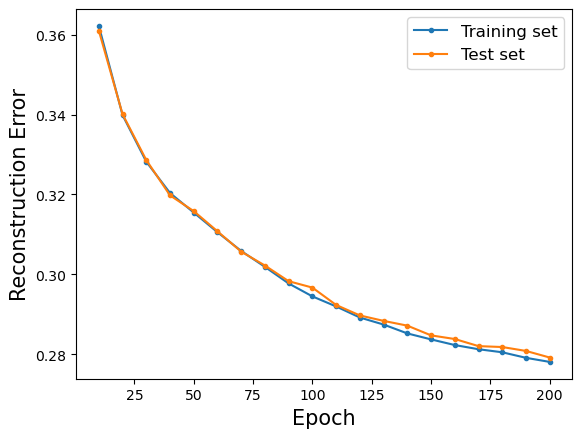

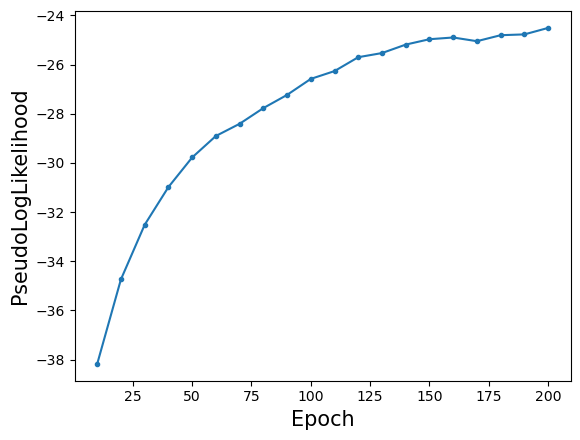

Training RBM 35/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360088 (train), 0.360053 (test), Pseud_Lik: -38.183796, Time: 1.806012, 
Ep 20, Rec er: 0.339329 (train), 0.339092 (test), Pseud_Lik: -34.357050, Time: 1.761833, 
Ep 30, Rec er: 0.328890 (train), 0.329793 (test), Pseud_Lik: -32.689380, Time: 1.798130, 
Ep 40, Rec er: 0.322415 (train), 0.322748 (test), Pseud_Lik: -31.316431, Time: 1.887559, 
Ep 50, Rec er: 0.316465 (train), 0.317590 (test), Pseud_Lik: -30.022499, Time: 1.818266, 
Ep 60, Rec er: 0.311257 (train), 0.311214 (test), Pseud_Lik: -28.769878, Time: 1.925289, 
Ep 70, Rec er: 0.306054 (train), 0.307164 (test), Pseud_Lik: -28.114971, Time: 1.848061, 
Ep 80, Rec er: 0.302000 (train), 0.302737 (test), Pseud_Lik: -27.450050, Time: 1.897763, 
Ep 90, Rec er: 0.297976 (train), 0.299621 (test), Pseud_Lik: -26.681864, Time: 1.845782, 
Ep 100, Rec er: 0.295279 (train), 0.296355 (test), Ps

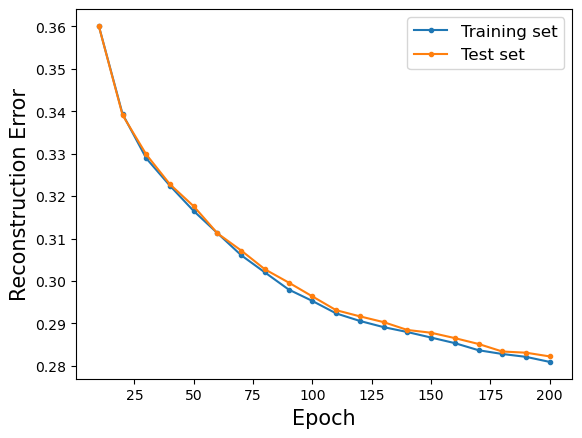

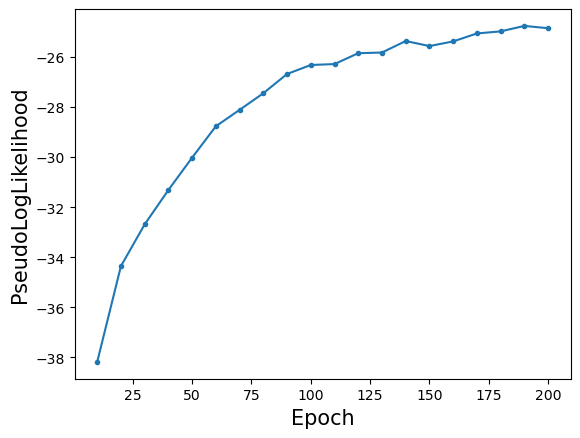

Training RBM 36/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361658 (train), 0.361472 (test), Pseud_Lik: -38.395471, Time: 1.751253, 
Ep 20, Rec er: 0.338443 (train), 0.338955 (test), Pseud_Lik: -34.466809, Time: 1.792015, 
Ep 30, Rec er: 0.326315 (train), 0.326328 (test), Pseud_Lik: -32.427161, Time: 1.786253, 
Ep 40, Rec er: 0.318553 (train), 0.319248 (test), Pseud_Lik: -30.579467, Time: 1.812298, 
Ep 50, Rec er: 0.313231 (train), 0.313176 (test), Pseud_Lik: -29.402027, Time: 1.835896, 
Ep 60, Rec er: 0.307674 (train), 0.309028 (test), Pseud_Lik: -28.389977, Time: 1.850354, 
Ep 70, Rec er: 0.303232 (train), 0.304251 (test), Pseud_Lik: -27.776664, Time: 1.841998, 
Ep 80, Rec er: 0.299477 (train), 0.300881 (test), Pseud_Lik: -27.192209, Time: 1.907644, 
Ep 90, Rec er: 0.295611 (train), 0.297062 (test), Pseud_Lik: -26.833314, Time: 1.857067, 
Ep 100, Rec er: 0.293784 (train), 0.294595 (test), Ps

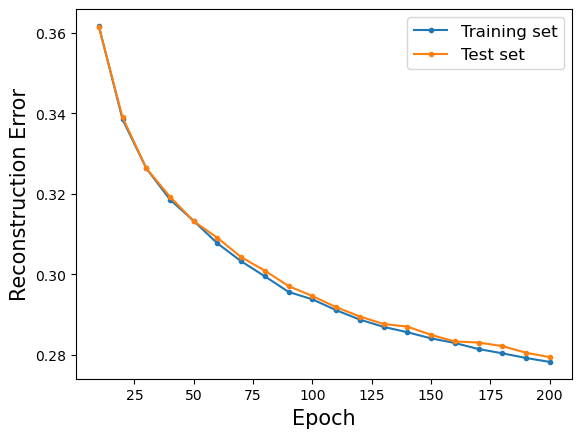

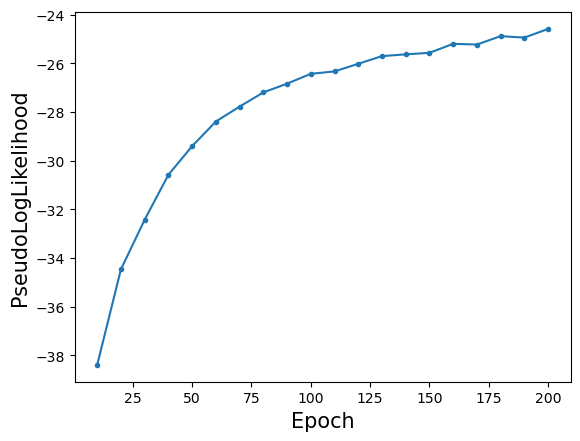

Training RBM 37/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360321 (train), 0.360221 (test), Pseud_Lik: -38.379402, Time: 1.791245, 
Ep 20, Rec er: 0.340137 (train), 0.340392 (test), Pseud_Lik: -34.282686, Time: 1.854815, 
Ep 30, Rec er: 0.329366 (train), 0.329898 (test), Pseud_Lik: -32.749688, Time: 1.871177, 
Ep 40, Rec er: 0.321272 (train), 0.322349 (test), Pseud_Lik: -31.049868, Time: 1.815751, 
Ep 50, Rec er: 0.316016 (train), 0.317369 (test), Pseud_Lik: -30.005146, Time: 1.847624, 
Ep 60, Rec er: 0.310332 (train), 0.312077 (test), Pseud_Lik: -28.795484, Time: 1.966623, 
Ep 70, Rec er: 0.305871 (train), 0.306559 (test), Pseud_Lik: -27.993344, Time: 1.861599, 
Ep 80, Rec er: 0.301601 (train), 0.302770 (test), Pseud_Lik: -27.215740, Time: 1.826812, 
Ep 90, Rec er: 0.298395 (train), 0.298799 (test), Pseud_Lik: -26.716847, Time: 1.862427, 
Ep 100, Rec er: 0.295378 (train), 0.295944 (test), Ps

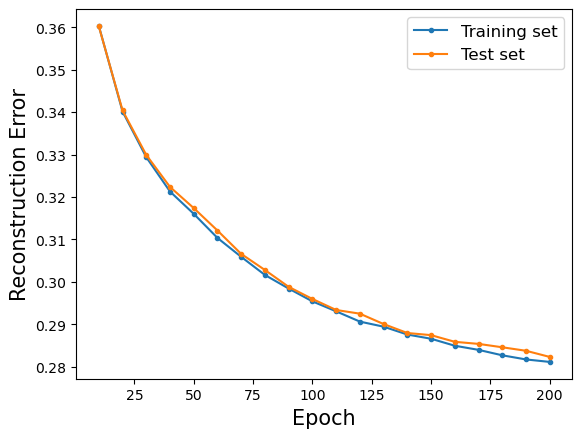

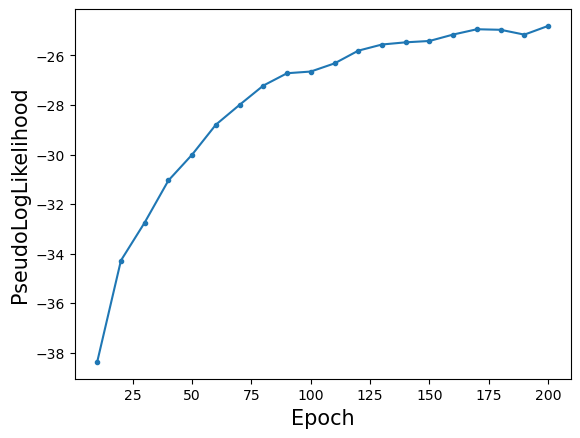

Training RBM 38/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361846 (train), 0.360647 (test), Pseud_Lik: -38.305588, Time: 1.728239, 
Ep 20, Rec er: 0.338133 (train), 0.338026 (test), Pseud_Lik: -34.403591, Time: 1.751686, 
Ep 30, Rec er: 0.326658 (train), 0.327173 (test), Pseud_Lik: -32.334498, Time: 1.811167, 
Ep 40, Rec er: 0.320250 (train), 0.321694 (test), Pseud_Lik: -30.947866, Time: 1.794258, 
Ep 50, Rec er: 0.315105 (train), 0.316312 (test), Pseud_Lik: -29.671735, Time: 1.847685, 
Ep 60, Rec er: 0.310222 (train), 0.310403 (test), Pseud_Lik: -28.786866, Time: 1.866999, 
Ep 70, Rec er: 0.305309 (train), 0.306339 (test), Pseud_Lik: -28.120999, Time: 1.881666, 
Ep 80, Rec er: 0.301337 (train), 0.302011 (test), Pseud_Lik: -27.196112, Time: 1.877527, 
Ep 90, Rec er: 0.297840 (train), 0.298324 (test), Pseud_Lik: -26.913533, Time: 1.907042, 
Ep 100, Rec er: 0.295289 (train), 0.296317 (test), Ps

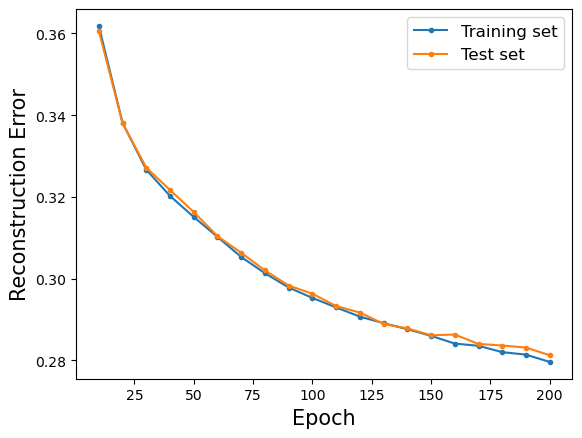

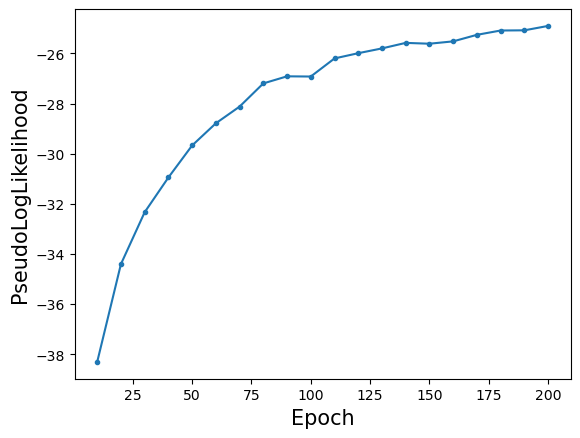

Training RBM 39/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360428 (train), 0.360157 (test), Pseud_Lik: -38.108302, Time: 1.741563, 
Ep 20, Rec er: 0.338161 (train), 0.337690 (test), Pseud_Lik: -34.204102, Time: 1.785794, 
Ep 30, Rec er: 0.327181 (train), 0.327527 (test), Pseud_Lik: -32.384739, Time: 1.759314, 
Ep 40, Rec er: 0.320196 (train), 0.320331 (test), Pseud_Lik: -30.795869, Time: 1.805231, 
Ep 50, Rec er: 0.314423 (train), 0.315935 (test), Pseud_Lik: -29.615204, Time: 1.801062, 
Ep 60, Rec er: 0.309835 (train), 0.310905 (test), Pseud_Lik: -28.727628, Time: 1.820926, 
Ep 70, Rec er: 0.305102 (train), 0.305032 (test), Pseud_Lik: -27.960088, Time: 1.848364, 
Ep 80, Rec er: 0.301128 (train), 0.302045 (test), Pseud_Lik: -27.173659, Time: 1.855109, 
Ep 90, Rec er: 0.297557 (train), 0.299311 (test), Pseud_Lik: -26.774516, Time: 1.835059, 
Ep 100, Rec er: 0.294588 (train), 0.295722 (test), Ps

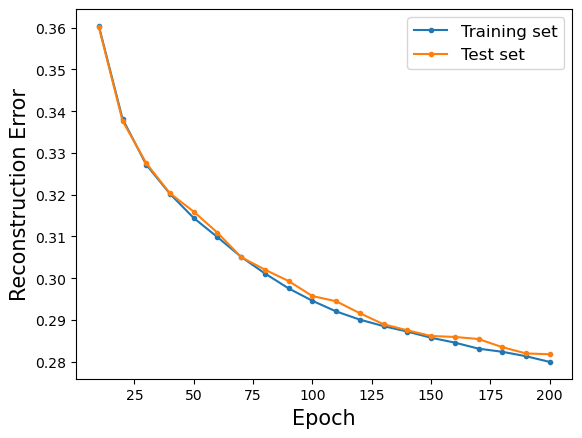

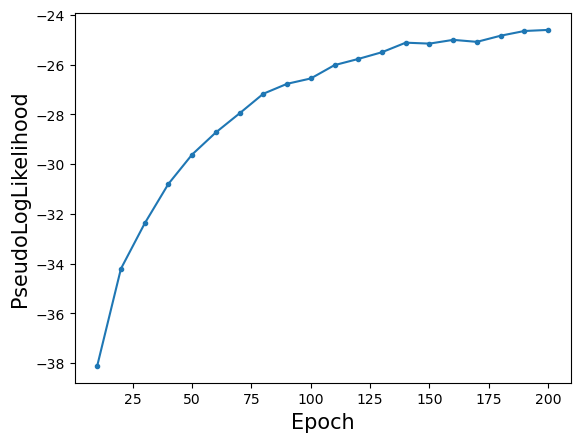

Training RBM 40/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359295 (train), 0.358661 (test), Pseud_Lik: -38.228217, Time: 1.716229, 
Ep 20, Rec er: 0.336764 (train), 0.337550 (test), Pseud_Lik: -33.929213, Time: 1.769513, 
Ep 30, Rec er: 0.326692 (train), 0.327251 (test), Pseud_Lik: -32.053094, Time: 1.760695, 
Ep 40, Rec er: 0.319658 (train), 0.320461 (test), Pseud_Lik: -30.588129, Time: 1.799346, 
Ep 50, Rec er: 0.315073 (train), 0.315096 (test), Pseud_Lik: -29.407361, Time: 1.786153, 
Ep 60, Rec er: 0.310253 (train), 0.310861 (test), Pseud_Lik: -28.649475, Time: 1.801146, 
Ep 70, Rec er: 0.306209 (train), 0.306956 (test), Pseud_Lik: -27.975172, Time: 1.805680, 
Ep 80, Rec er: 0.302021 (train), 0.303285 (test), Pseud_Lik: -27.580624, Time: 1.827715, 
Ep 90, Rec er: 0.298913 (train), 0.299921 (test), Pseud_Lik: -26.917461, Time: 1.817717, 
Ep 100, Rec er: 0.295986 (train), 0.296161 (test), Ps

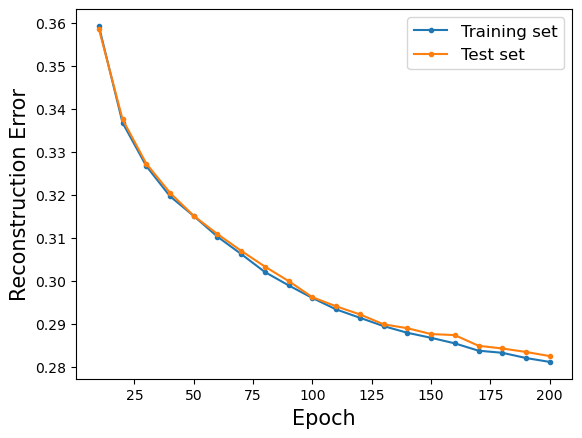

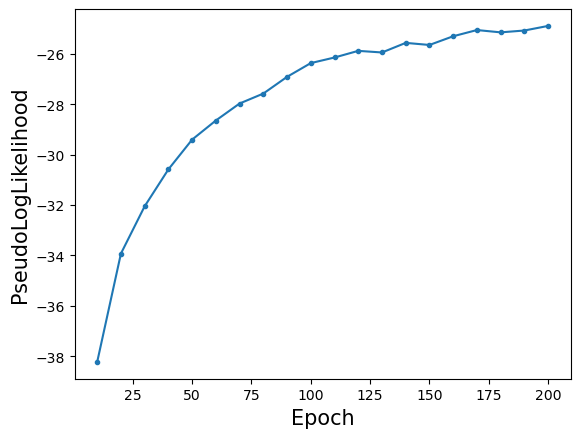

Training RBM 41/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361052 (train), 0.360110 (test), Pseud_Lik: -38.134218, Time: 1.729936, 
Ep 20, Rec er: 0.338056 (train), 0.338537 (test), Pseud_Lik: -33.866476, Time: 1.819537, 
Ep 30, Rec er: 0.328285 (train), 0.328760 (test), Pseud_Lik: -32.028540, Time: 1.791010, 
Ep 40, Rec er: 0.322090 (train), 0.322538 (test), Pseud_Lik: -30.788862, Time: 1.776901, 
Ep 50, Rec er: 0.317011 (train), 0.318488 (test), Pseud_Lik: -29.582829, Time: 1.780368, 
Ep 60, Rec er: 0.312717 (train), 0.313278 (test), Pseud_Lik: -29.014812, Time: 1.829442, 
Ep 70, Rec er: 0.308476 (train), 0.309046 (test), Pseud_Lik: -28.524101, Time: 1.912044, 
Ep 80, Rec er: 0.304317 (train), 0.305676 (test), Pseud_Lik: -27.793393, Time: 1.864252, 
Ep 90, Rec er: 0.301231 (train), 0.301349 (test), Pseud_Lik: -27.242916, Time: 1.831977, 
Ep 100, Rec er: 0.298072 (train), 0.298515 (test), Ps

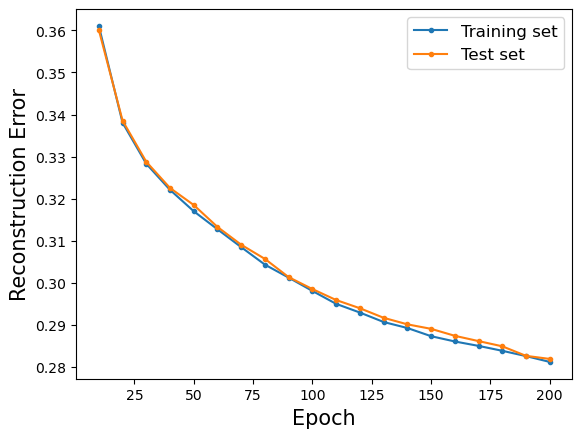

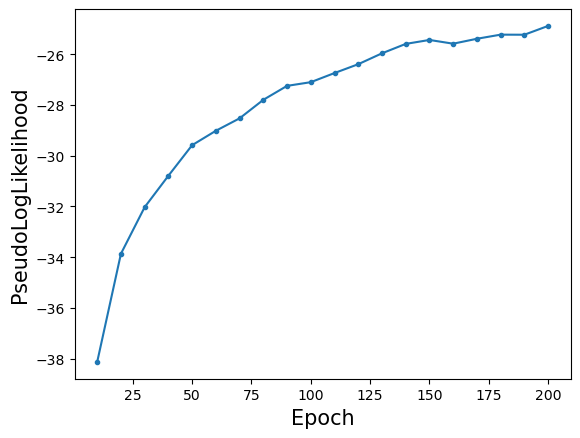

Training RBM 42/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361100 (train), 0.360428 (test), Pseud_Lik: -38.307866, Time: 1.719063, 
Ep 20, Rec er: 0.338212 (train), 0.338429 (test), Pseud_Lik: -34.237261, Time: 1.768224, 
Ep 30, Rec er: 0.328083 (train), 0.328448 (test), Pseud_Lik: -32.381385, Time: 1.795918, 
Ep 40, Rec er: 0.321406 (train), 0.321501 (test), Pseud_Lik: -30.960965, Time: 1.901087, 
Ep 50, Rec er: 0.316381 (train), 0.316423 (test), Pseud_Lik: -29.769782, Time: 1.802733, 
Ep 60, Rec er: 0.310946 (train), 0.311913 (test), Pseud_Lik: -28.923404, Time: 1.811234, 
Ep 70, Rec er: 0.307286 (train), 0.307351 (test), Pseud_Lik: -27.915959, Time: 1.820438, 
Ep 80, Rec er: 0.302779 (train), 0.304029 (test), Pseud_Lik: -27.356011, Time: 1.846142, 
Ep 90, Rec er: 0.299819 (train), 0.300063 (test), Pseud_Lik: -26.996418, Time: 1.828543, 
Ep 100, Rec er: 0.296887 (train), 0.298090 (test), Ps

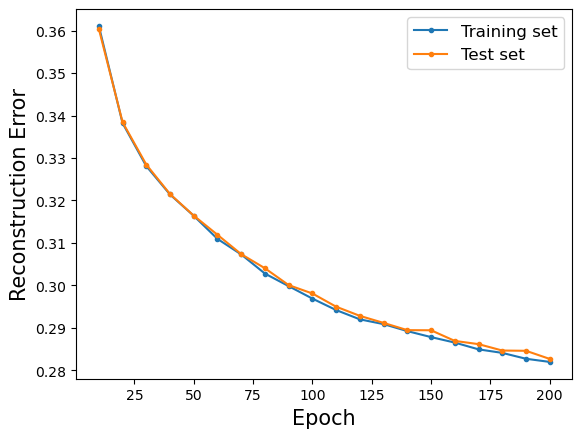

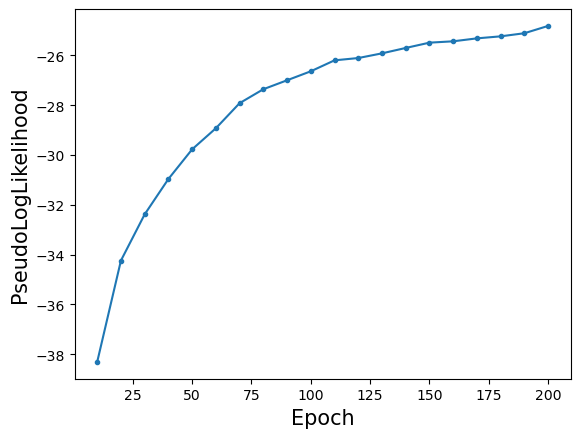

Training RBM 43/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359594 (train), 0.359531 (test), Pseud_Lik: -38.167502, Time: 1.709628, 
Ep 20, Rec er: 0.338524 (train), 0.339539 (test), Pseud_Lik: -34.131822, Time: 1.768688, 
Ep 30, Rec er: 0.328130 (train), 0.328627 (test), Pseud_Lik: -32.166053, Time: 1.794467, 
Ep 40, Rec er: 0.321415 (train), 0.321484 (test), Pseud_Lik: -30.651722, Time: 1.847283, 
Ep 50, Rec er: 0.315801 (train), 0.317059 (test), Pseud_Lik: -29.369059, Time: 1.812456, 
Ep 60, Rec er: 0.310910 (train), 0.310875 (test), Pseud_Lik: -28.588733, Time: 1.834748, 
Ep 70, Rec er: 0.306301 (train), 0.307446 (test), Pseud_Lik: -27.910111, Time: 1.792741, 
Ep 80, Rec er: 0.302545 (train), 0.303574 (test), Pseud_Lik: -27.248372, Time: 1.815899, 
Ep 90, Rec er: 0.299105 (train), 0.300015 (test), Pseud_Lik: -26.824682, Time: 1.814096, 
Ep 100, Rec er: 0.296269 (train), 0.297233 (test), Ps

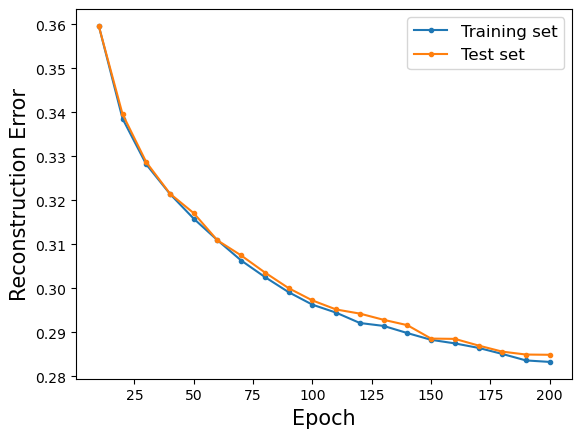

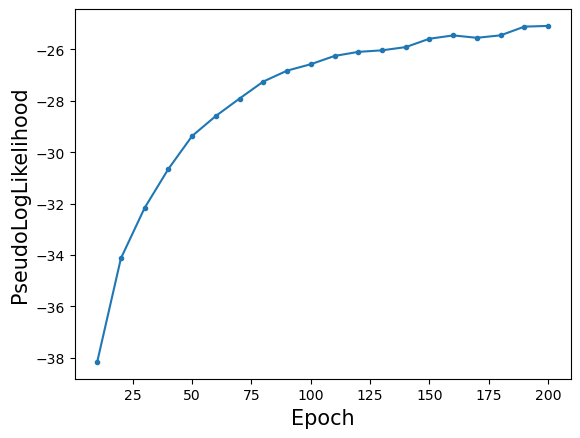

Training RBM 44/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359319 (train), 0.358899 (test), Pseud_Lik: -38.094307, Time: 1.805273, 
Ep 20, Rec er: 0.337210 (train), 0.337981 (test), Pseud_Lik: -34.167998, Time: 1.781578, 
Ep 30, Rec er: 0.327751 (train), 0.327761 (test), Pseud_Lik: -32.025595, Time: 1.772201, 
Ep 40, Rec er: 0.321454 (train), 0.321500 (test), Pseud_Lik: -30.955891, Time: 1.777902, 
Ep 50, Rec er: 0.315927 (train), 0.316114 (test), Pseud_Lik: -29.672245, Time: 1.789729, 
Ep 60, Rec er: 0.311433 (train), 0.311924 (test), Pseud_Lik: -28.699902, Time: 1.800689, 
Ep 70, Rec er: 0.307107 (train), 0.306730 (test), Pseud_Lik: -28.043878, Time: 1.838298, 
Ep 80, Rec er: 0.303136 (train), 0.303962 (test), Pseud_Lik: -27.417395, Time: 1.860968, 
Ep 90, Rec er: 0.299953 (train), 0.300657 (test), Pseud_Lik: -27.111777, Time: 1.906046, 
Ep 100, Rec er: 0.297128 (train), 0.297870 (test), Ps

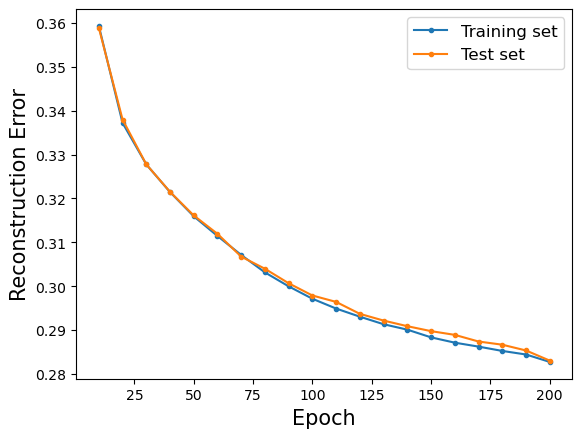

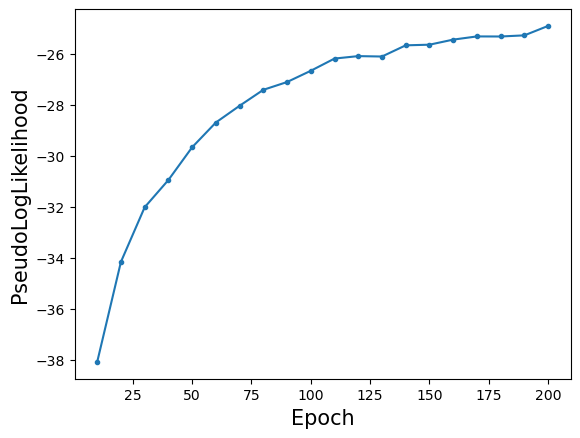

Training RBM 45/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361639 (train), 0.360700 (test), Pseud_Lik: -38.168762, Time: 1.845620, 
Ep 20, Rec er: 0.338050 (train), 0.338214 (test), Pseud_Lik: -34.417561, Time: 1.797385, 
Ep 30, Rec er: 0.326362 (train), 0.326896 (test), Pseud_Lik: -32.078752, Time: 2.128904, 
Ep 40, Rec er: 0.319794 (train), 0.320443 (test), Pseud_Lik: -30.680158, Time: 1.952408, 
Ep 50, Rec er: 0.314454 (train), 0.315050 (test), Pseud_Lik: -29.287005, Time: 1.958492, 
Ep 60, Rec er: 0.309517 (train), 0.310892 (test), Pseud_Lik: -28.780641, Time: 2.078336, 
Ep 70, Rec er: 0.305233 (train), 0.306427 (test), Pseud_Lik: -27.930315, Time: 1.881221, 
Ep 80, Rec er: 0.301296 (train), 0.301751 (test), Pseud_Lik: -27.357836, Time: 2.222026, 
Ep 90, Rec er: 0.297612 (train), 0.299079 (test), Pseud_Lik: -27.001065, Time: 2.250780, 
Ep 100, Rec er: 0.294295 (train), 0.294624 (test), Ps

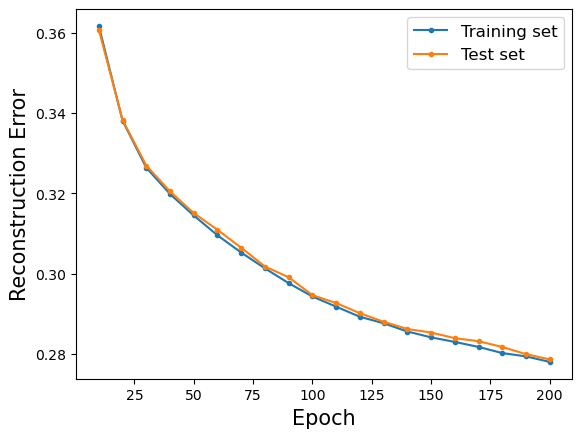

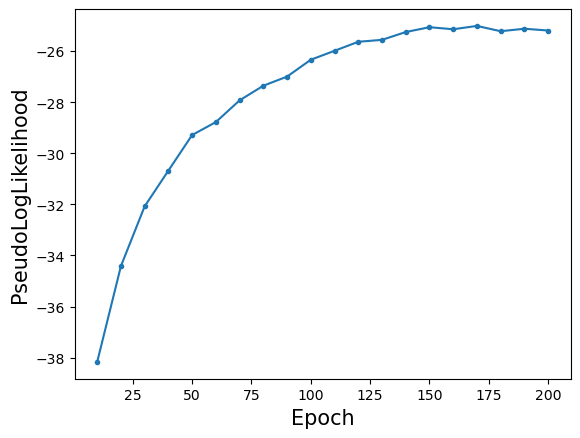

Training RBM 46/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360185 (train), 0.360269 (test), Pseud_Lik: -38.319777, Time: 2.070744, 
Ep 20, Rec er: 0.338370 (train), 0.339049 (test), Pseud_Lik: -34.295926, Time: 2.326791, 
Ep 30, Rec er: 0.328562 (train), 0.328516 (test), Pseud_Lik: -32.137236, Time: 2.709659, 
Ep 40, Rec er: 0.322090 (train), 0.323110 (test), Pseud_Lik: -30.671025, Time: 2.459278, 
Ep 50, Rec er: 0.316412 (train), 0.316986 (test), Pseud_Lik: -29.263367, Time: 2.400879, 
Ep 60, Rec er: 0.311698 (train), 0.312870 (test), Pseud_Lik: -28.521306, Time: 2.337493, 
Ep 70, Rec er: 0.307701 (train), 0.309076 (test), Pseud_Lik: -27.774950, Time: 2.493986, 
Ep 80, Rec er: 0.303698 (train), 0.304824 (test), Pseud_Lik: -27.496318, Time: 2.134242, 
Ep 90, Rec er: 0.300836 (train), 0.301910 (test), Pseud_Lik: -26.988766, Time: 2.727857, 
Ep 100, Rec er: 0.298222 (train), 0.298507 (test), Ps

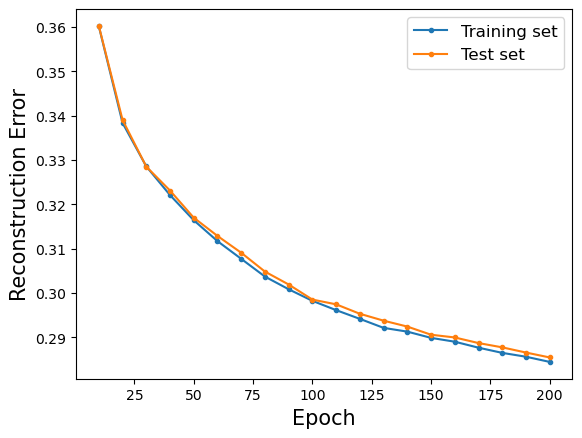

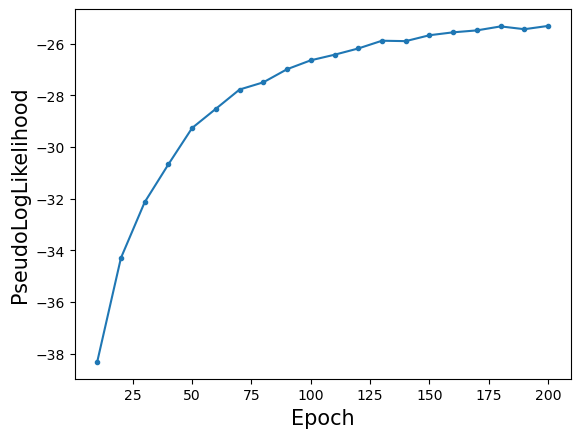

Training RBM 47/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360971 (train), 0.360661 (test), Pseud_Lik: -38.227085, Time: 2.456324, 
Ep 20, Rec er: 0.339118 (train), 0.338776 (test), Pseud_Lik: -34.435981, Time: 2.858819, 
Ep 30, Rec er: 0.327692 (train), 0.328492 (test), Pseud_Lik: -32.623503, Time: 1.932781, 
Ep 40, Rec er: 0.320429 (train), 0.321079 (test), Pseud_Lik: -30.941507, Time: 1.852886, 
Ep 50, Rec er: 0.314874 (train), 0.314894 (test), Pseud_Lik: -29.683603, Time: 2.075593, 
Ep 60, Rec er: 0.309443 (train), 0.310683 (test), Pseud_Lik: -28.728171, Time: 2.188361, 
Ep 70, Rec er: 0.305113 (train), 0.305525 (test), Pseud_Lik: -28.069089, Time: 3.011644, 
Ep 80, Rec er: 0.301143 (train), 0.301722 (test), Pseud_Lik: -27.268811, Time: 2.486462, 
Ep 90, Rec er: 0.297344 (train), 0.298222 (test), Pseud_Lik: -26.943451, Time: 2.219356, 
Ep 100, Rec er: 0.294149 (train), 0.294964 (test), Ps

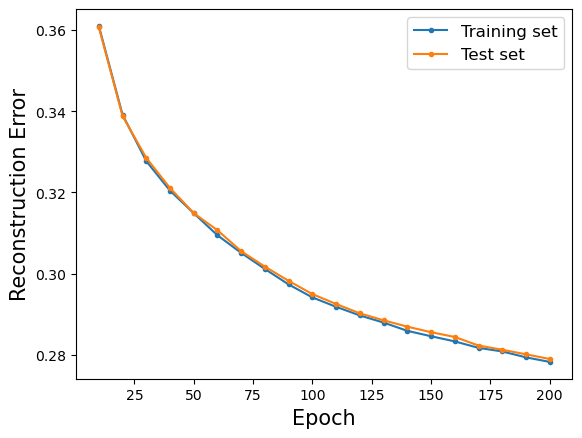

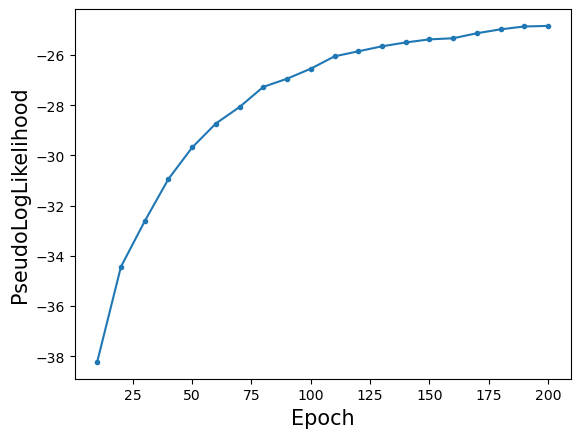

Training RBM 48/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361402 (train), 0.360468 (test), Pseud_Lik: -38.171560, Time: 2.427291, 
Ep 20, Rec er: 0.339277 (train), 0.338856 (test), Pseud_Lik: -34.450598, Time: 2.356488, 
Ep 30, Rec er: 0.327876 (train), 0.328091 (test), Pseud_Lik: -32.442431, Time: 2.464993, 
Ep 40, Rec er: 0.319819 (train), 0.320659 (test), Pseud_Lik: -30.898211, Time: 2.178575, 
Ep 50, Rec er: 0.314826 (train), 0.315256 (test), Pseud_Lik: -29.743293, Time: 2.561873, 
Ep 60, Rec er: 0.309540 (train), 0.310033 (test), Pseud_Lik: -28.653427, Time: 2.124664, 
Ep 70, Rec er: 0.304858 (train), 0.306636 (test), Pseud_Lik: -28.075352, Time: 2.254879, 
Ep 80, Rec er: 0.300570 (train), 0.301450 (test), Pseud_Lik: -27.397442, Time: 2.670353, 
Ep 90, Rec er: 0.297014 (train), 0.297648 (test), Pseud_Lik: -26.989675, Time: 2.290372, 
Ep 100, Rec er: 0.294713 (train), 0.294302 (test), Ps

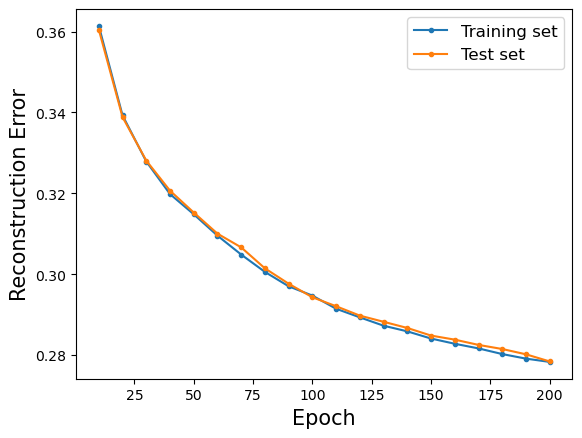

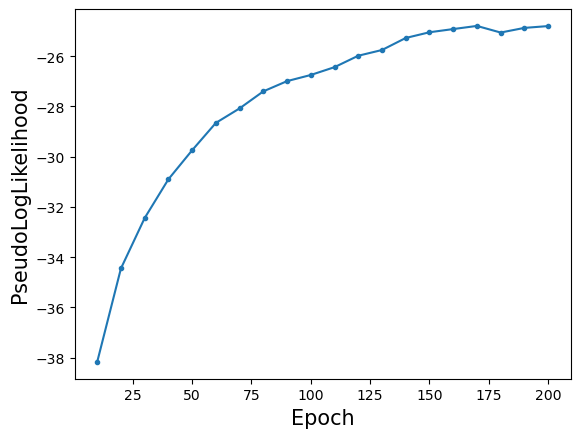

Training RBM 49/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362257 (train), 0.361824 (test), Pseud_Lik: -38.404651, Time: 2.982247, 
Ep 20, Rec er: 0.338572 (train), 0.338731 (test), Pseud_Lik: -34.795814, Time: 2.486446, 
Ep 30, Rec er: 0.325737 (train), 0.327085 (test), Pseud_Lik: -32.362519, Time: 1.796540, 
Ep 40, Rec er: 0.318469 (train), 0.318884 (test), Pseud_Lik: -30.741703, Time: 1.912424, 
Ep 50, Rec er: 0.312841 (train), 0.313054 (test), Pseud_Lik: -29.393770, Time: 2.284767, 
Ep 60, Rec er: 0.307302 (train), 0.308077 (test), Pseud_Lik: -28.150285, Time: 2.672827, 
Ep 70, Rec er: 0.303255 (train), 0.304245 (test), Pseud_Lik: -27.577518, Time: 2.792987, 
Ep 80, Rec er: 0.299515 (train), 0.299566 (test), Pseud_Lik: -26.920141, Time: 2.576692, 
Ep 90, Rec er: 0.295931 (train), 0.295979 (test), Pseud_Lik: -26.620995, Time: 2.068820, 
Ep 100, Rec er: 0.292594 (train), 0.293440 (test), Ps

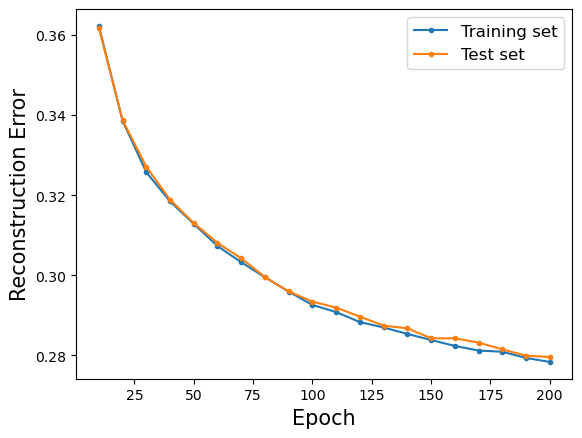

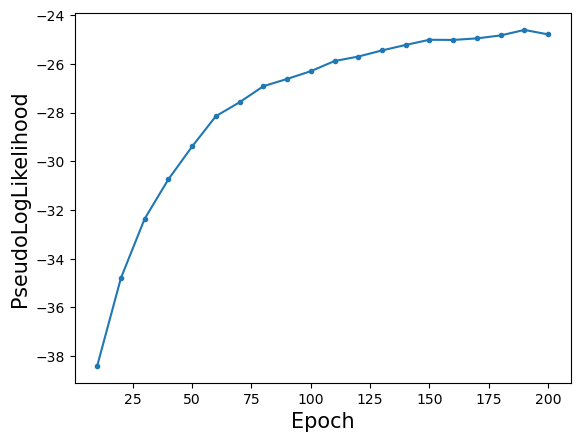

Training RBM 50/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360379 (train), 0.361251 (test), Pseud_Lik: -38.190912, Time: 2.088894, 
Ep 20, Rec er: 0.338487 (train), 0.339934 (test), Pseud_Lik: -34.255050, Time: 1.920668, 
Ep 30, Rec er: 0.328408 (train), 0.328392 (test), Pseud_Lik: -33.092953, Time: 2.809236, 
Ep 40, Rec er: 0.321303 (train), 0.322084 (test), Pseud_Lik: -31.221647, Time: 2.103995, 
Ep 50, Rec er: 0.315621 (train), 0.316239 (test), Pseud_Lik: -29.954532, Time: 2.207598, 
Ep 60, Rec er: 0.310603 (train), 0.312203 (test), Pseud_Lik: -28.926109, Time: 2.268903, 
Ep 70, Rec er: 0.306077 (train), 0.307589 (test), Pseud_Lik: -28.031969, Time: 2.105328, 
Ep 80, Rec er: 0.302366 (train), 0.301963 (test), Pseud_Lik: -27.391961, Time: 2.406443, 
Ep 90, Rec er: 0.298373 (train), 0.300275 (test), Pseud_Lik: -27.127594, Time: 2.955688, 
Ep 100, Rec er: 0.295051 (train), 0.295775 (test), Ps

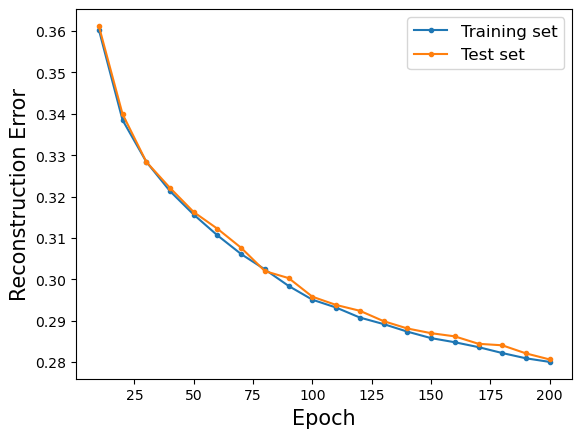

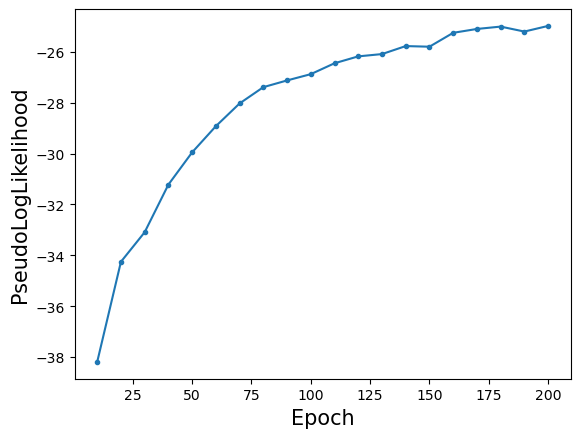

Training RBM 51/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360076 (train), 0.359679 (test), Pseud_Lik: -38.129418, Time: 2.035677, 
Ep 20, Rec er: 0.337304 (train), 0.337673 (test), Pseud_Lik: -34.279925, Time: 1.791965, 
Ep 30, Rec er: 0.326523 (train), 0.327369 (test), Pseud_Lik: -32.302684, Time: 1.856315, 
Ep 40, Rec er: 0.319438 (train), 0.320164 (test), Pseud_Lik: -30.904031, Time: 2.144463, 
Ep 50, Rec er: 0.313904 (train), 0.314645 (test), Pseud_Lik: -29.653784, Time: 2.237513, 
Ep 60, Rec er: 0.308693 (train), 0.309762 (test), Pseud_Lik: -28.724944, Time: 2.366388, 
Ep 70, Rec er: 0.304050 (train), 0.304522 (test), Pseud_Lik: -27.657781, Time: 2.216233, 
Ep 80, Rec er: 0.299768 (train), 0.300615 (test), Pseud_Lik: -27.119744, Time: 2.103079, 
Ep 90, Rec er: 0.295928 (train), 0.297279 (test), Pseud_Lik: -26.562675, Time: 2.049449, 
Ep 100, Rec er: 0.293272 (train), 0.294257 (test), Ps

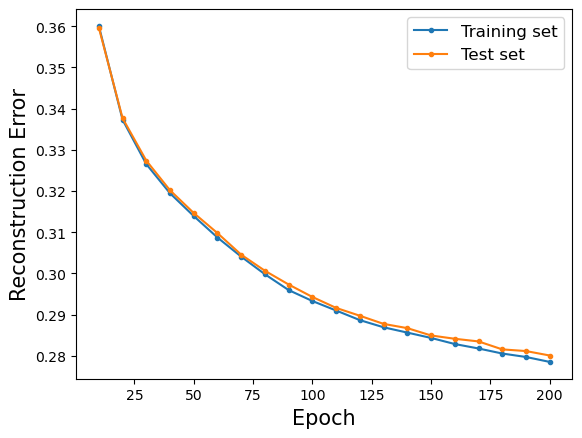

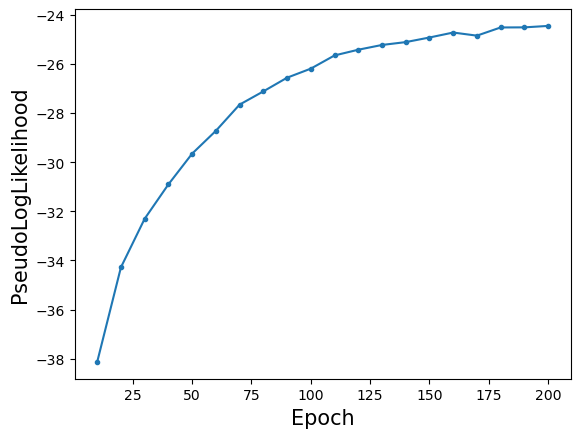

Training RBM 52/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359717 (train), 0.359651 (test), Pseud_Lik: -38.090857, Time: 1.960160, 
Ep 20, Rec er: 0.337893 (train), 0.339362 (test), Pseud_Lik: -34.139394, Time: 2.247362, 
Ep 30, Rec er: 0.327651 (train), 0.327815 (test), Pseud_Lik: -32.150523, Time: 1.855274, 
Ep 40, Rec er: 0.321056 (train), 0.321175 (test), Pseud_Lik: -30.659357, Time: 2.202349, 
Ep 50, Rec er: 0.316025 (train), 0.316221 (test), Pseud_Lik: -29.320883, Time: 2.801584, 
Ep 60, Rec er: 0.310605 (train), 0.311920 (test), Pseud_Lik: -28.689112, Time: 2.191017, 
Ep 70, Rec er: 0.306872 (train), 0.306889 (test), Pseud_Lik: -27.914786, Time: 1.866189, 
Ep 80, Rec er: 0.302402 (train), 0.303510 (test), Pseud_Lik: -27.403162, Time: 1.932333, 
Ep 90, Rec er: 0.299196 (train), 0.300400 (test), Pseud_Lik: -26.809741, Time: 1.989091, 
Ep 100, Rec er: 0.296165 (train), 0.296752 (test), Ps

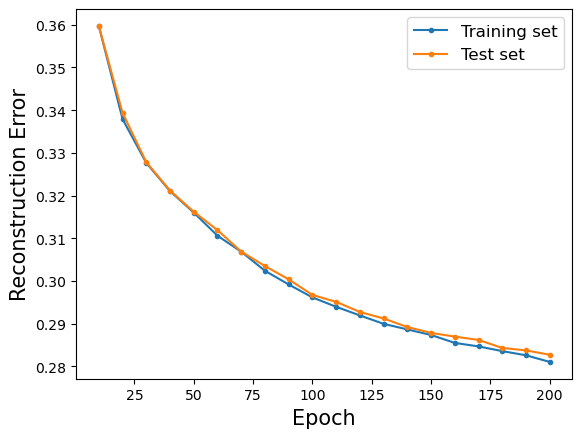

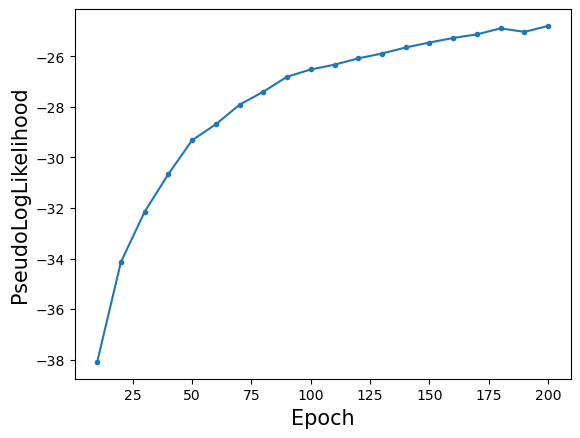

Training RBM 53/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358100 (train), 0.357328 (test), Pseud_Lik: -38.115158, Time: 1.858466, 
Ep 20, Rec er: 0.336870 (train), 0.337353 (test), Pseud_Lik: -34.023993, Time: 1.911328, 
Ep 30, Rec er: 0.327620 (train), 0.328563 (test), Pseud_Lik: -31.760129, Time: 1.933813, 
Ep 40, Rec er: 0.322541 (train), 0.323230 (test), Pseud_Lik: -30.676138, Time: 1.938979, 
Ep 50, Rec er: 0.317817 (train), 0.318296 (test), Pseud_Lik: -30.108172, Time: 1.835365, 
Ep 60, Rec er: 0.313532 (train), 0.314539 (test), Pseud_Lik: -29.209228, Time: 1.835928, 
Ep 70, Rec er: 0.308950 (train), 0.310812 (test), Pseud_Lik: -28.552391, Time: 1.920918, 
Ep 80, Rec er: 0.305290 (train), 0.305743 (test), Pseud_Lik: -27.819282, Time: 2.096942, 
Ep 90, Rec er: 0.302121 (train), 0.301854 (test), Pseud_Lik: -27.096150, Time: 2.176718, 
Ep 100, Rec er: 0.298838 (train), 0.299629 (test), Ps

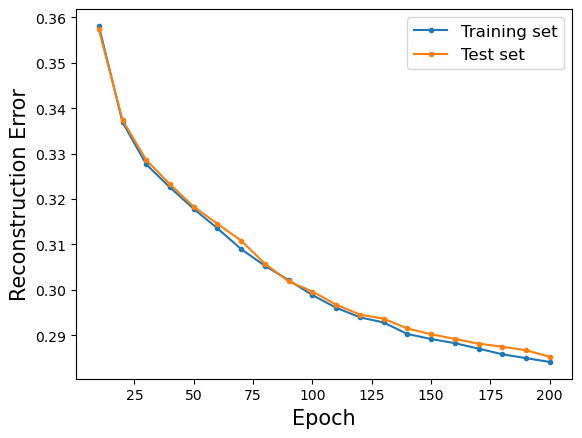

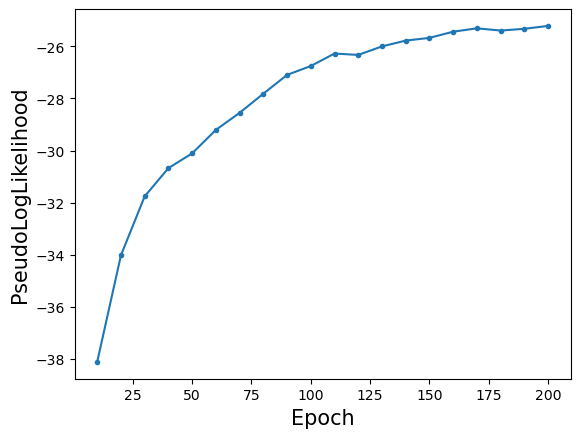

Training RBM 54/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361068 (train), 0.361211 (test), Pseud_Lik: -38.331211, Time: 1.925431, 
Ep 20, Rec er: 0.339292 (train), 0.339544 (test), Pseud_Lik: -34.481506, Time: 1.889553, 
Ep 30, Rec er: 0.327415 (train), 0.327346 (test), Pseud_Lik: -32.188157, Time: 1.988350, 
Ep 40, Rec er: 0.320286 (train), 0.319976 (test), Pseud_Lik: -30.650316, Time: 1.948579, 
Ep 50, Rec er: 0.314340 (train), 0.315278 (test), Pseud_Lik: -29.562681, Time: 2.235298, 
Ep 60, Rec er: 0.309895 (train), 0.310780 (test), Pseud_Lik: -28.606512, Time: 2.130270, 
Ep 70, Rec er: 0.305510 (train), 0.306693 (test), Pseud_Lik: -28.114984, Time: 1.991966, 
Ep 80, Rec er: 0.301506 (train), 0.301542 (test), Pseud_Lik: -27.516742, Time: 2.259576, 
Ep 90, Rec er: 0.298097 (train), 0.298591 (test), Pseud_Lik: -26.796714, Time: 2.324059, 
Ep 100, Rec er: 0.295016 (train), 0.296413 (test), Ps

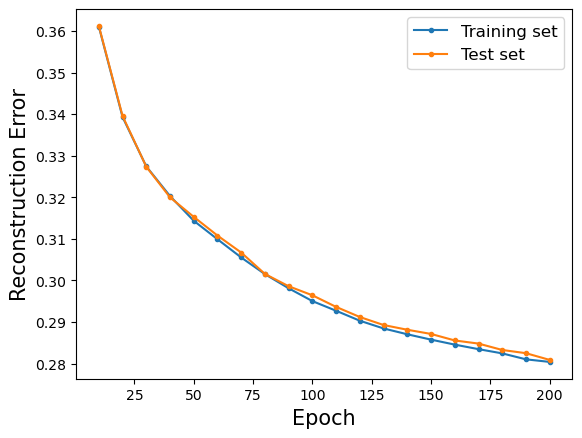

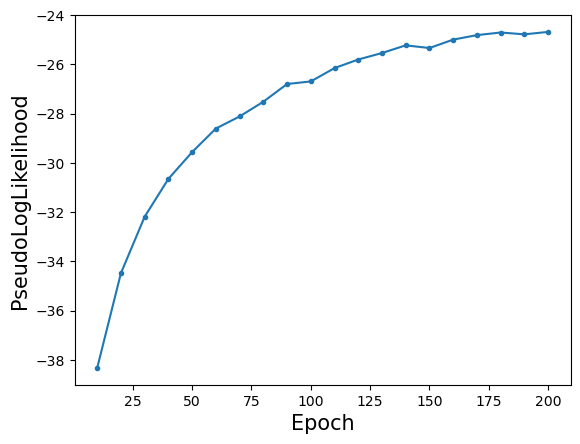

Training RBM 55/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361339 (train), 0.360814 (test), Pseud_Lik: -38.420287, Time: 2.094994, 
Ep 20, Rec er: 0.338704 (train), 0.338410 (test), Pseud_Lik: -34.514827, Time: 2.362485, 
Ep 30, Rec er: 0.327287 (train), 0.327376 (test), Pseud_Lik: -32.368555, Time: 1.836276, 
Ep 40, Rec er: 0.319612 (train), 0.319956 (test), Pseud_Lik: -30.653036, Time: 2.104921, 
Ep 50, Rec er: 0.313834 (train), 0.314094 (test), Pseud_Lik: -29.178606, Time: 1.884592, 
Ep 60, Rec er: 0.308686 (train), 0.309085 (test), Pseud_Lik: -28.604686, Time: 1.839878, 
Ep 70, Rec er: 0.304845 (train), 0.305551 (test), Pseud_Lik: -27.634911, Time: 2.960275, 
Ep 80, Rec er: 0.301216 (train), 0.301533 (test), Pseud_Lik: -27.197392, Time: 2.233794, 
Ep 90, Rec er: 0.297697 (train), 0.298688 (test), Pseud_Lik: -26.759371, Time: 2.065193, 
Ep 100, Rec er: 0.295027 (train), 0.294887 (test), Ps

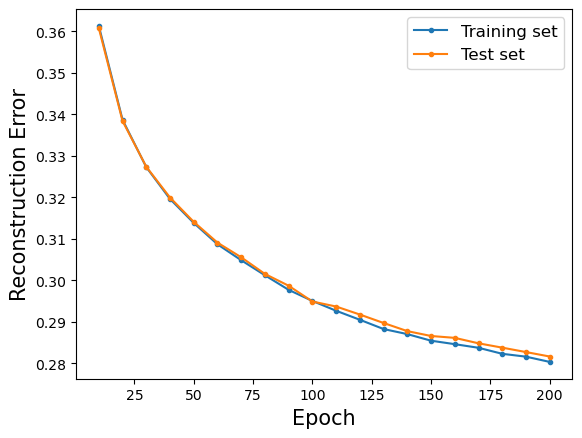

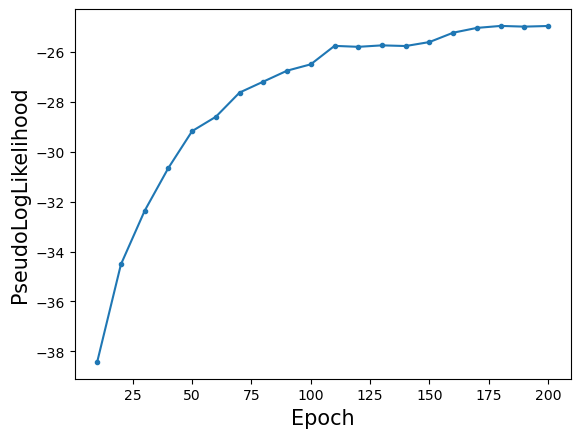

Training RBM 56/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360143 (train), 0.359478 (test), Pseud_Lik: -38.342196, Time: 3.169191, 
Ep 20, Rec er: 0.338008 (train), 0.337734 (test), Pseud_Lik: -34.499967, Time: 3.556165, 
Ep 30, Rec er: 0.327322 (train), 0.328158 (test), Pseud_Lik: -32.832160, Time: 2.132237, 
Ep 40, Rec er: 0.319916 (train), 0.321201 (test), Pseud_Lik: -30.991423, Time: 3.538522, 
Ep 50, Rec er: 0.313977 (train), 0.314978 (test), Pseud_Lik: -29.524250, Time: 2.528223, 
Ep 60, Rec er: 0.308920 (train), 0.310009 (test), Pseud_Lik: -28.469347, Time: 2.634342, 
Ep 70, Rec er: 0.303925 (train), 0.304353 (test), Pseud_Lik: -27.751329, Time: 2.200590, 
Ep 80, Rec er: 0.299462 (train), 0.300905 (test), Pseud_Lik: -26.954112, Time: 3.559753, 
Ep 90, Rec er: 0.296498 (train), 0.296393 (test), Pseud_Lik: -26.516280, Time: 3.187053, 
Ep 100, Rec er: 0.292804 (train), 0.293928 (test), Ps

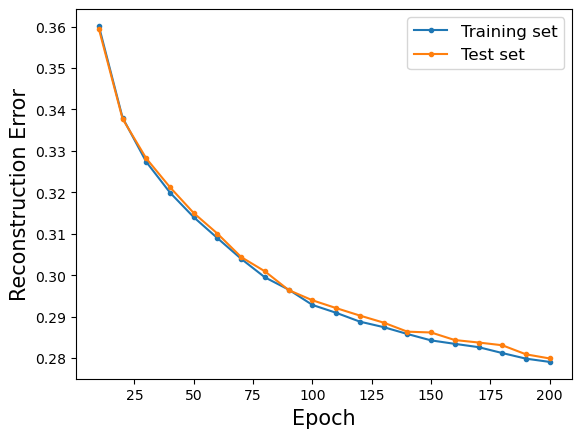

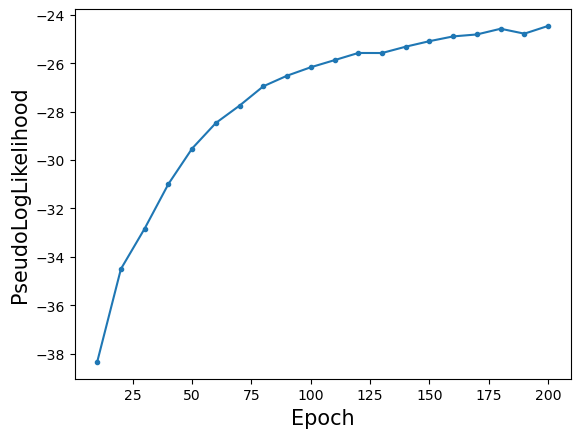

Training RBM 57/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360880 (train), 0.359108 (test), Pseud_Lik: -38.231788, Time: 1.895036, 
Ep 20, Rec er: 0.338726 (train), 0.338674 (test), Pseud_Lik: -34.422015, Time: 1.977910, 
Ep 30, Rec er: 0.327619 (train), 0.327754 (test), Pseud_Lik: -31.987375, Time: 2.651816, 
Ep 40, Rec er: 0.321109 (train), 0.321690 (test), Pseud_Lik: -30.560880, Time: 2.365202, 
Ep 50, Rec er: 0.315320 (train), 0.315871 (test), Pseud_Lik: -29.684717, Time: 2.023789, 
Ep 60, Rec er: 0.310976 (train), 0.310758 (test), Pseud_Lik: -28.558873, Time: 3.021876, 
Ep 70, Rec er: 0.306763 (train), 0.307923 (test), Pseud_Lik: -27.847194, Time: 2.414364, 
Ep 80, Rec er: 0.302842 (train), 0.303947 (test), Pseud_Lik: -27.313408, Time: 2.328542, 
Ep 90, Rec er: 0.299699 (train), 0.300293 (test), Pseud_Lik: -26.984396, Time: 2.079246, 
Ep 100, Rec er: 0.296966 (train), 0.298310 (test), Ps

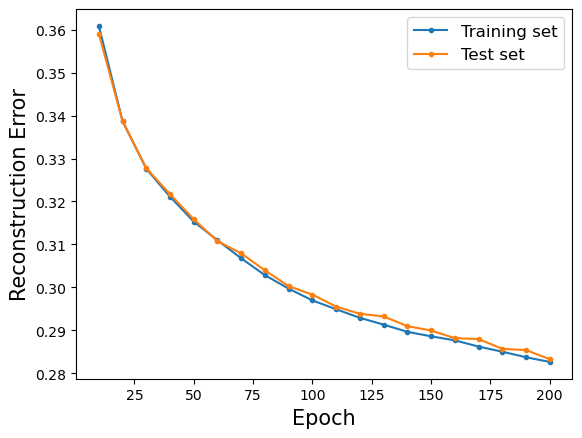

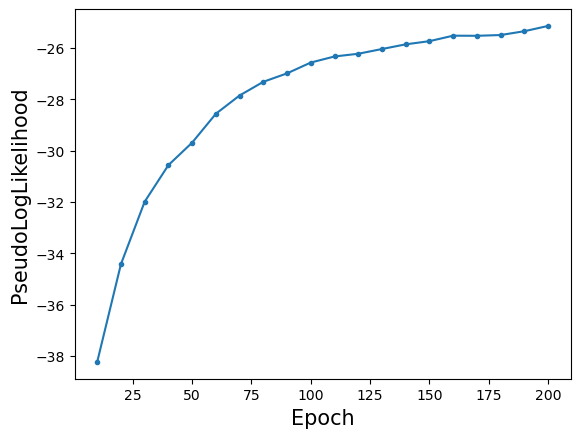

Training RBM 58/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360914 (train), 0.360229 (test), Pseud_Lik: -38.286297, Time: 2.187464, 
Ep 20, Rec er: 0.338926 (train), 0.339440 (test), Pseud_Lik: -34.413732, Time: 2.207152, 
Ep 30, Rec er: 0.329135 (train), 0.328978 (test), Pseud_Lik: -32.331950, Time: 2.064973, 
Ep 40, Rec er: 0.322449 (train), 0.322288 (test), Pseud_Lik: -31.068570, Time: 1.960486, 
Ep 50, Rec er: 0.316962 (train), 0.318099 (test), Pseud_Lik: -30.090950, Time: 2.240432, 
Ep 60, Rec er: 0.312044 (train), 0.312757 (test), Pseud_Lik: -29.322701, Time: 2.367528, 
Ep 70, Rec er: 0.307442 (train), 0.308411 (test), Pseud_Lik: -28.629137, Time: 2.492417, 
Ep 80, Rec er: 0.302694 (train), 0.302704 (test), Pseud_Lik: -27.837087, Time: 2.109970, 
Ep 90, Rec er: 0.299351 (train), 0.299853 (test), Pseud_Lik: -27.350495, Time: 2.190408, 
Ep 100, Rec er: 0.295592 (train), 0.296203 (test), Ps

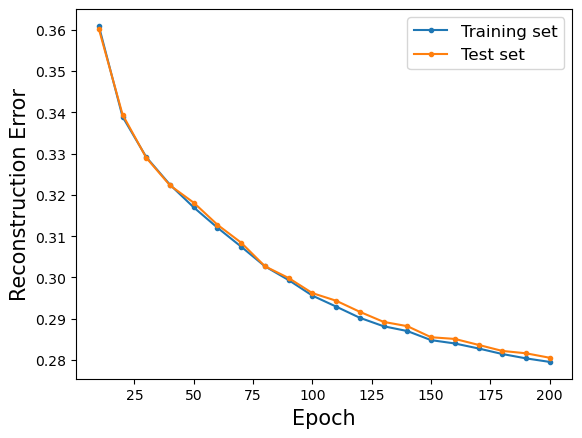

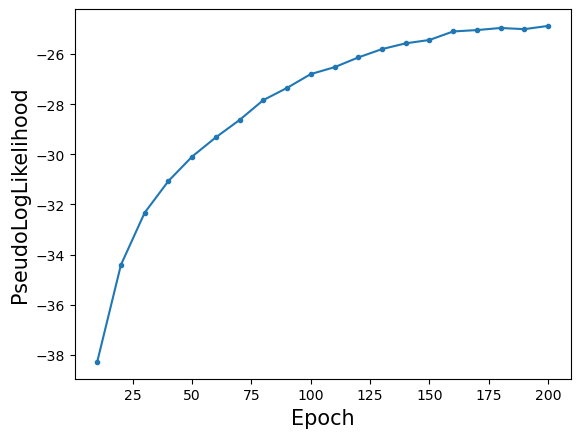

Training RBM 59/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360122 (train), 0.360484 (test), Pseud_Lik: -38.170719, Time: 2.182640, 
Ep 20, Rec er: 0.338696 (train), 0.338608 (test), Pseud_Lik: -34.111149, Time: 1.798287, 
Ep 30, Rec er: 0.328191 (train), 0.328363 (test), Pseud_Lik: -31.915503, Time: 2.038081, 
Ep 40, Rec er: 0.322120 (train), 0.322032 (test), Pseud_Lik: -31.085297, Time: 1.985969, 
Ep 50, Rec er: 0.316980 (train), 0.317539 (test), Pseud_Lik: -30.315528, Time: 1.858444, 
Ep 60, Rec er: 0.311437 (train), 0.312868 (test), Pseud_Lik: -29.332101, Time: 1.961669, 
Ep 70, Rec er: 0.306984 (train), 0.308252 (test), Pseud_Lik: -28.392884, Time: 2.484512, 
Ep 80, Rec er: 0.302946 (train), 0.304332 (test), Pseud_Lik: -27.579771, Time: 2.068328, 
Ep 90, Rec er: 0.299386 (train), 0.299081 (test), Pseud_Lik: -27.398332, Time: 2.952133, 
Ep 100, Rec er: 0.296462 (train), 0.296525 (test), Ps

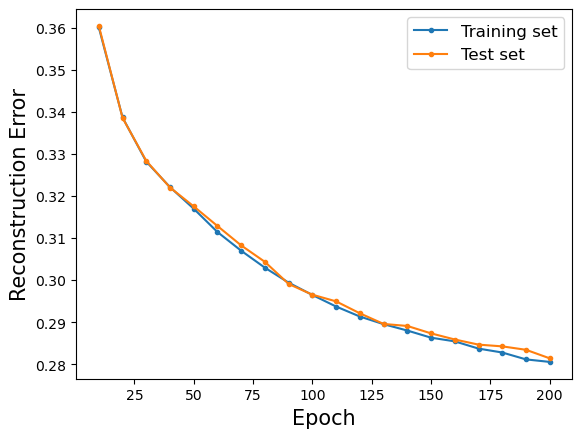

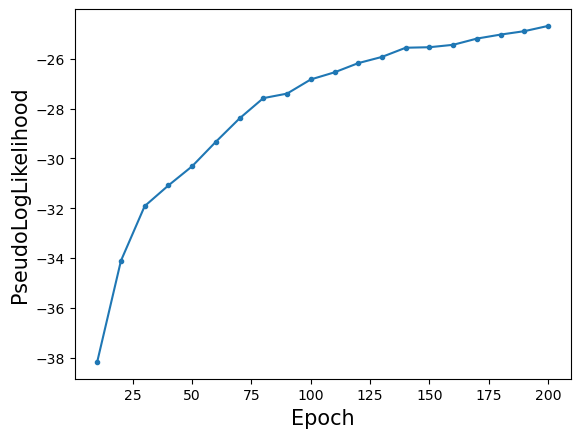

Training RBM 60/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358505 (train), 0.357456 (test), Pseud_Lik: -38.183526, Time: 2.372327, 
Ep 20, Rec er: 0.338422 (train), 0.338786 (test), Pseud_Lik: -33.886273, Time: 1.897780, 
Ep 30, Rec er: 0.327655 (train), 0.329585 (test), Pseud_Lik: -31.735296, Time: 2.225691, 
Ep 40, Rec er: 0.321775 (train), 0.322151 (test), Pseud_Lik: -30.568069, Time: 2.110848, 
Ep 50, Rec er: 0.316935 (train), 0.317382 (test), Pseud_Lik: -29.413450, Time: 2.910278, 
Ep 60, Rec er: 0.312909 (train), 0.314488 (test), Pseud_Lik: -28.552871, Time: 2.131771, 
Ep 70, Rec er: 0.308979 (train), 0.309570 (test), Pseud_Lik: -28.334966, Time: 2.363117, 
Ep 80, Rec er: 0.305515 (train), 0.306751 (test), Pseud_Lik: -28.108901, Time: 3.263154, 
Ep 90, Rec er: 0.301995 (train), 0.303583 (test), Pseud_Lik: -27.410892, Time: 2.022089, 
Ep 100, Rec er: 0.299223 (train), 0.300735 (test), Ps

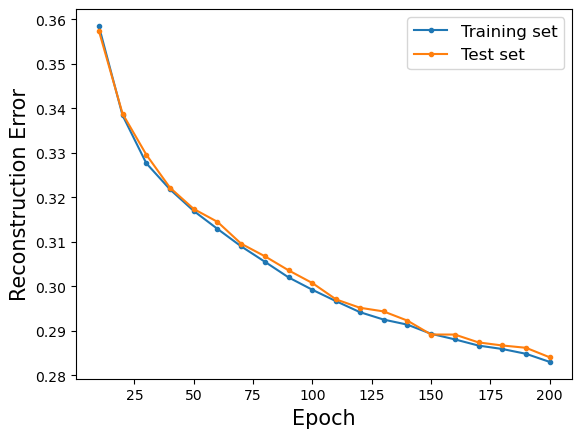

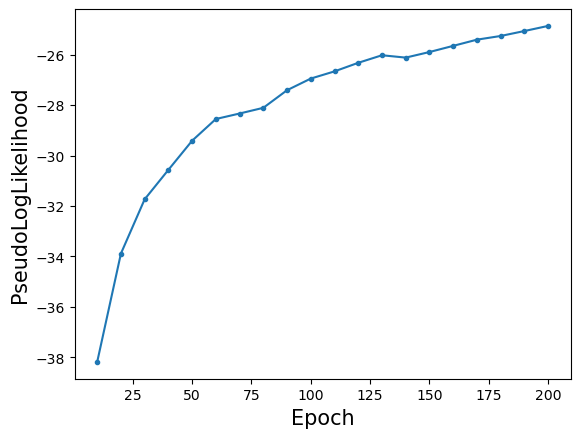

Training RBM 61/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360672 (train), 0.361250 (test), Pseud_Lik: -38.439419, Time: 1.957946, 
Ep 20, Rec er: 0.338350 (train), 0.338135 (test), Pseud_Lik: -34.295496, Time: 2.329934, 
Ep 30, Rec er: 0.327687 (train), 0.327737 (test), Pseud_Lik: -32.445311, Time: 2.214480, 
Ep 40, Rec er: 0.320759 (train), 0.321420 (test), Pseud_Lik: -31.043146, Time: 2.193297, 
Ep 50, Rec er: 0.314800 (train), 0.315180 (test), Pseud_Lik: -29.658582, Time: 2.369601, 
Ep 60, Rec er: 0.309616 (train), 0.310133 (test), Pseud_Lik: -28.725300, Time: 2.580448, 
Ep 70, Rec er: 0.305342 (train), 0.304910 (test), Pseud_Lik: -27.892422, Time: 2.966203, 
Ep 80, Rec er: 0.301916 (train), 0.302184 (test), Pseud_Lik: -27.564719, Time: 2.486530, 
Ep 90, Rec er: 0.298246 (train), 0.298995 (test), Pseud_Lik: -26.873871, Time: 2.623155, 
Ep 100, Rec er: 0.295284 (train), 0.296510 (test), Ps

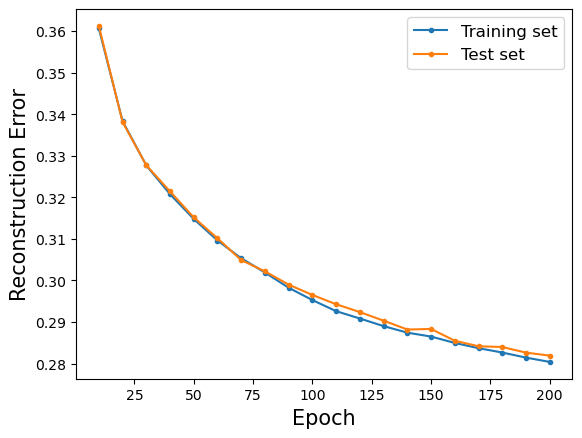

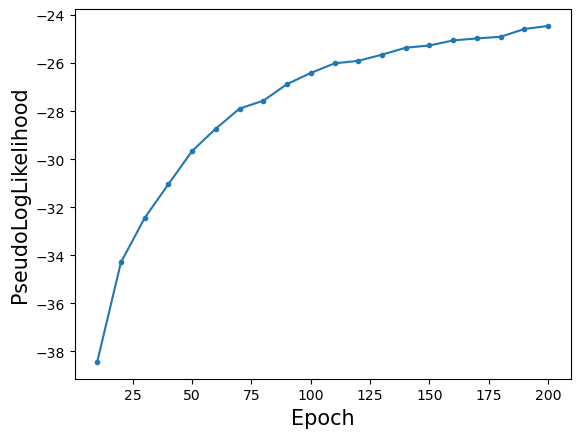

Training RBM 62/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362207 (train), 0.362078 (test), Pseud_Lik: -38.456547, Time: 1.874943, 
Ep 20, Rec er: 0.339093 (train), 0.339431 (test), Pseud_Lik: -34.853486, Time: 1.879775, 
Ep 30, Rec er: 0.326219 (train), 0.326436 (test), Pseud_Lik: -32.336313, Time: 1.879784, 
Ep 40, Rec er: 0.318167 (train), 0.319064 (test), Pseud_Lik: -30.602158, Time: 2.019669, 
Ep 50, Rec er: 0.312192 (train), 0.313436 (test), Pseud_Lik: -29.561575, Time: 2.065670, 
Ep 60, Rec er: 0.306798 (train), 0.307886 (test), Pseud_Lik: -28.642157, Time: 2.090402, 
Ep 70, Rec er: 0.302359 (train), 0.302463 (test), Pseud_Lik: -27.920568, Time: 2.155578, 
Ep 80, Rec er: 0.298028 (train), 0.297944 (test), Pseud_Lik: -27.241067, Time: 2.011697, 
Ep 90, Rec er: 0.294718 (train), 0.295383 (test), Pseud_Lik: -26.687692, Time: 2.131627, 
Ep 100, Rec er: 0.291472 (train), 0.292420 (test), Ps

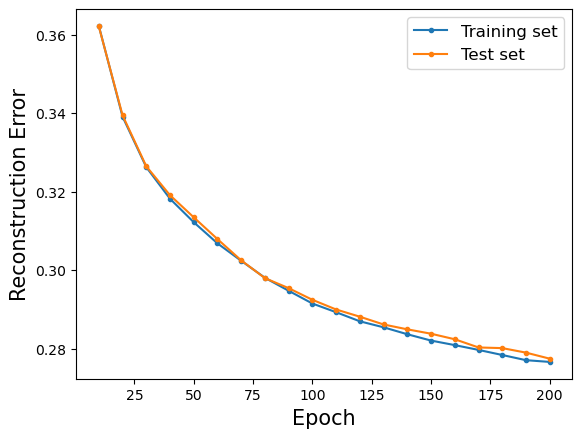

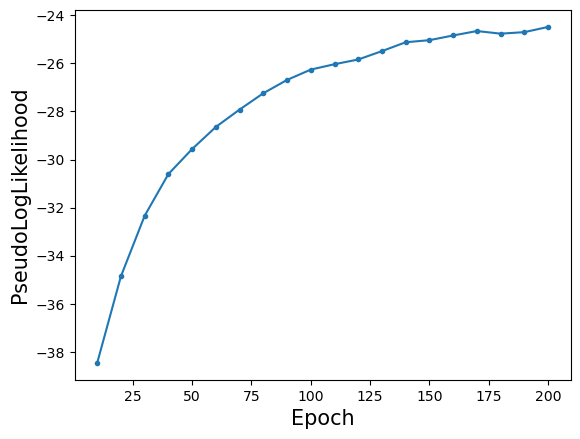

Training RBM 63/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358712 (train), 0.357908 (test), Pseud_Lik: -38.051999, Time: 2.087316, 
Ep 20, Rec er: 0.337901 (train), 0.337681 (test), Pseud_Lik: -33.969343, Time: 1.849253, 
Ep 30, Rec er: 0.327947 (train), 0.328938 (test), Pseud_Lik: -32.320127, Time: 2.521138, 
Ep 40, Rec er: 0.322474 (train), 0.322945 (test), Pseud_Lik: -31.074370, Time: 1.995162, 
Ep 50, Rec er: 0.316707 (train), 0.317977 (test), Pseud_Lik: -29.780171, Time: 2.431593, 
Ep 60, Rec er: 0.312031 (train), 0.313442 (test), Pseud_Lik: -28.628554, Time: 2.026237, 
Ep 70, Rec er: 0.308093 (train), 0.309747 (test), Pseud_Lik: -27.905060, Time: 2.049742, 
Ep 80, Rec er: 0.304132 (train), 0.304983 (test), Pseud_Lik: -27.498751, Time: 2.102658, 
Ep 90, Rec er: 0.300312 (train), 0.301035 (test), Pseud_Lik: -27.007351, Time: 2.261902, 
Ep 100, Rec er: 0.297788 (train), 0.298442 (test), Ps

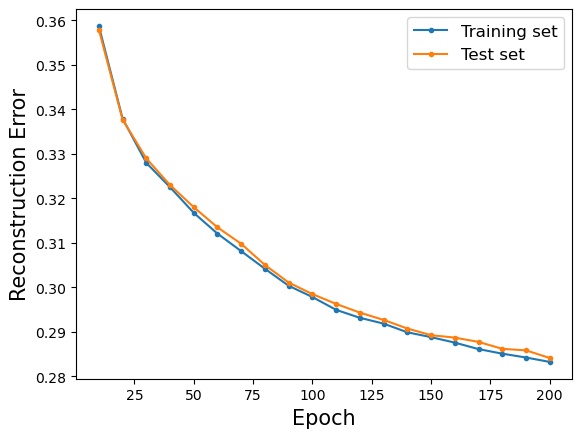

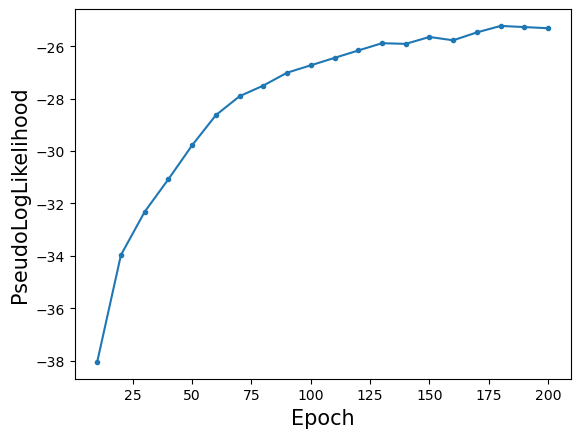

Training RBM 64/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360412 (train), 0.359759 (test), Pseud_Lik: -38.315431, Time: 2.237926, 
Ep 20, Rec er: 0.337204 (train), 0.337977 (test), Pseud_Lik: -34.278021, Time: 2.263656, 
Ep 30, Rec er: 0.327719 (train), 0.327959 (test), Pseud_Lik: -32.161430, Time: 2.596230, 
Ep 40, Rec er: 0.322324 (train), 0.322893 (test), Pseud_Lik: -30.987163, Time: 1.951571, 
Ep 50, Rec er: 0.317043 (train), 0.318174 (test), Pseud_Lik: -29.736290, Time: 2.208298, 
Ep 60, Rec er: 0.312641 (train), 0.312277 (test), Pseud_Lik: -28.964020, Time: 2.167153, 
Ep 70, Rec er: 0.307884 (train), 0.308350 (test), Pseud_Lik: -28.035826, Time: 2.024523, 
Ep 80, Rec er: 0.303715 (train), 0.304581 (test), Pseud_Lik: -27.520457, Time: 2.058569, 
Ep 90, Rec er: 0.300545 (train), 0.301309 (test), Pseud_Lik: -27.222866, Time: 1.896207, 
Ep 100, Rec er: 0.297677 (train), 0.299410 (test), Ps

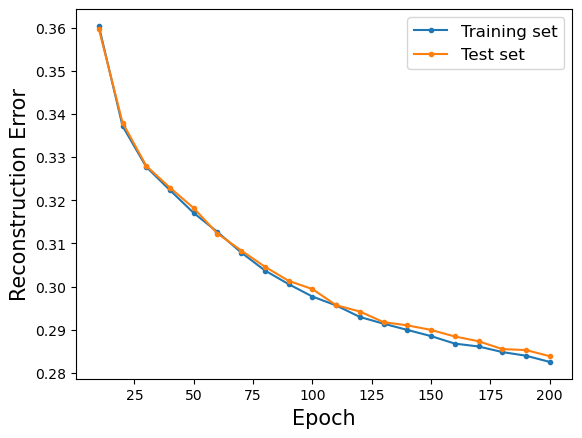

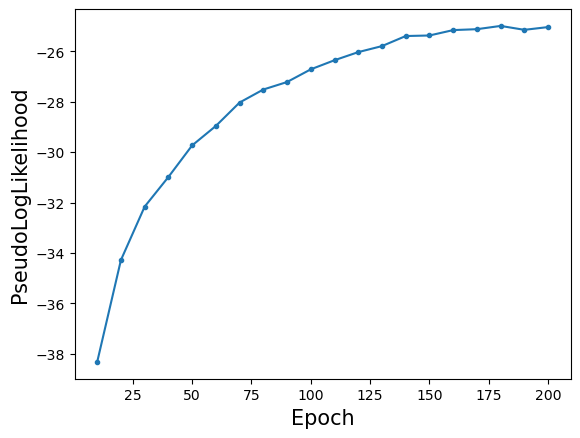

Training RBM 65/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360078 (train), 0.359972 (test), Pseud_Lik: -38.128888, Time: 2.017328, 
Ep 20, Rec er: 0.337999 (train), 0.337818 (test), Pseud_Lik: -34.430340, Time: 2.633401, 
Ep 30, Rec er: 0.326883 (train), 0.327382 (test), Pseud_Lik: -32.356861, Time: 2.512017, 
Ep 40, Rec er: 0.319525 (train), 0.320107 (test), Pseud_Lik: -30.701988, Time: 1.967289, 
Ep 50, Rec er: 0.314280 (train), 0.314190 (test), Pseud_Lik: -29.538817, Time: 2.035080, 
Ep 60, Rec er: 0.309758 (train), 0.310599 (test), Pseud_Lik: -28.516421, Time: 2.115105, 
Ep 70, Rec er: 0.305085 (train), 0.306387 (test), Pseud_Lik: -27.859925, Time: 2.476535, 
Ep 80, Rec er: 0.301293 (train), 0.303131 (test), Pseud_Lik: -27.470265, Time: 2.118968, 
Ep 90, Rec er: 0.297884 (train), 0.299060 (test), Pseud_Lik: -26.832977, Time: 1.933347, 
Ep 100, Rec er: 0.295331 (train), 0.296276 (test), Ps

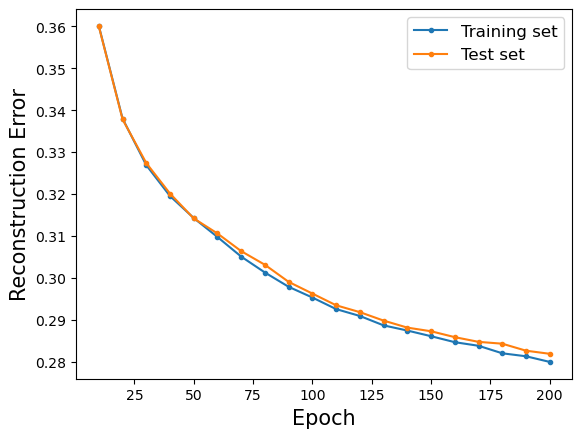

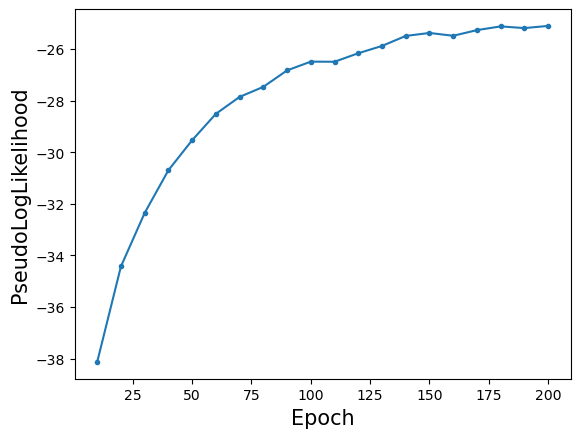

Training RBM 66/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361336 (train), 0.360730 (test), Pseud_Lik: -38.225694, Time: 1.871618, 
Ep 20, Rec er: 0.339000 (train), 0.340186 (test), Pseud_Lik: -34.290753, Time: 2.848603, 
Ep 30, Rec er: 0.328441 (train), 0.328987 (test), Pseud_Lik: -32.218101, Time: 3.074316, 
Ep 40, Rec er: 0.321058 (train), 0.322321 (test), Pseud_Lik: -30.428186, Time: 2.075454, 
Ep 50, Rec er: 0.316067 (train), 0.316768 (test), Pseud_Lik: -29.424799, Time: 2.441258, 
Ep 60, Rec er: 0.311325 (train), 0.312290 (test), Pseud_Lik: -28.770959, Time: 2.294131, 
Ep 70, Rec er: 0.307344 (train), 0.307221 (test), Pseud_Lik: -28.340637, Time: 2.718995, 
Ep 80, Rec er: 0.303336 (train), 0.304241 (test), Pseud_Lik: -27.915180, Time: 2.352847, 
Ep 90, Rec er: 0.300452 (train), 0.300685 (test), Pseud_Lik: -27.712671, Time: 2.420666, 
Ep 100, Rec er: 0.297404 (train), 0.297584 (test), Ps

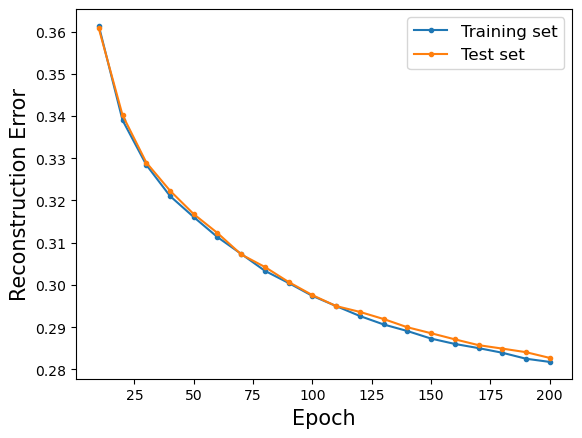

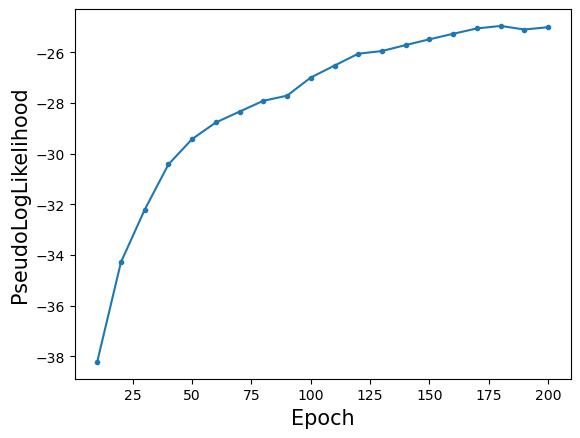

Training RBM 67/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359627 (train), 0.360122 (test), Pseud_Lik: -38.157401, Time: 2.179134, 
Ep 20, Rec er: 0.338606 (train), 0.339624 (test), Pseud_Lik: -34.183254, Time: 1.915636, 
Ep 30, Rec er: 0.327901 (train), 0.328744 (test), Pseud_Lik: -32.171213, Time: 2.662565, 
Ep 40, Rec er: 0.321739 (train), 0.321752 (test), Pseud_Lik: -30.398084, Time: 2.401697, 
Ep 50, Rec er: 0.316558 (train), 0.317306 (test), Pseud_Lik: -29.496187, Time: 2.734570, 
Ep 60, Rec er: 0.312514 (train), 0.312807 (test), Pseud_Lik: -28.580884, Time: 2.052782, 
Ep 70, Rec er: 0.307958 (train), 0.308687 (test), Pseud_Lik: -28.013808, Time: 2.103153, 
Ep 80, Rec er: 0.304675 (train), 0.305424 (test), Pseud_Lik: -27.580637, Time: 2.047899, 
Ep 90, Rec er: 0.300816 (train), 0.301920 (test), Pseud_Lik: -27.043773, Time: 2.467547, 
Ep 100, Rec er: 0.298061 (train), 0.298950 (test), Ps

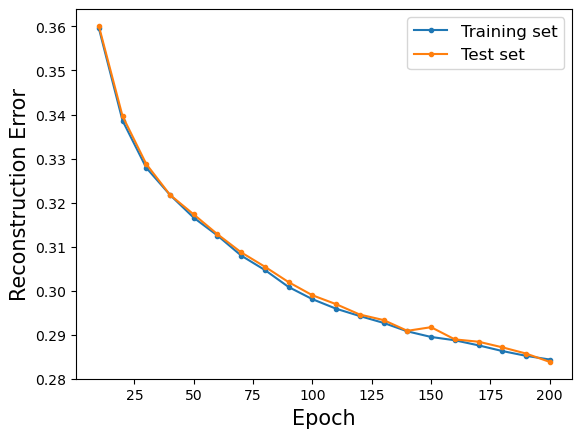

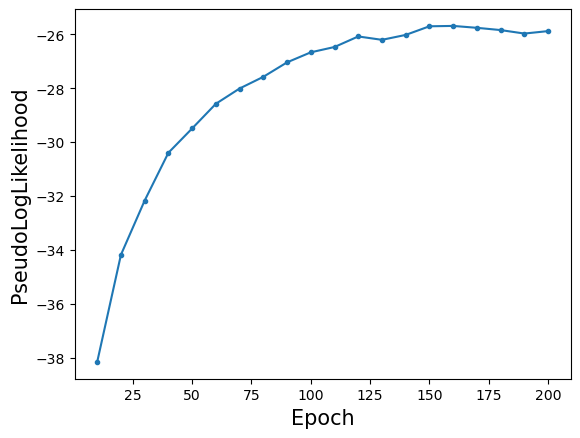

Training RBM 68/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359773 (train), 0.358835 (test), Pseud_Lik: -38.141524, Time: 1.819962, 
Ep 20, Rec er: 0.338275 (train), 0.338432 (test), Pseud_Lik: -34.682991, Time: 2.054378, 
Ep 30, Rec er: 0.327583 (train), 0.327639 (test), Pseud_Lik: -32.647877, Time: 2.256004, 
Ep 40, Rec er: 0.320687 (train), 0.321099 (test), Pseud_Lik: -31.184657, Time: 2.261769, 
Ep 50, Rec er: 0.315598 (train), 0.316022 (test), Pseud_Lik: -29.986768, Time: 2.146438, 
Ep 60, Rec er: 0.310565 (train), 0.311500 (test), Pseud_Lik: -28.963767, Time: 2.180397, 
Ep 70, Rec er: 0.306069 (train), 0.306825 (test), Pseud_Lik: -28.275179, Time: 1.862336, 
Ep 80, Rec er: 0.301545 (train), 0.302213 (test), Pseud_Lik: -27.513313, Time: 2.118445, 
Ep 90, Rec er: 0.297751 (train), 0.298421 (test), Pseud_Lik: -26.978673, Time: 2.165397, 
Ep 100, Rec er: 0.294851 (train), 0.296120 (test), Ps

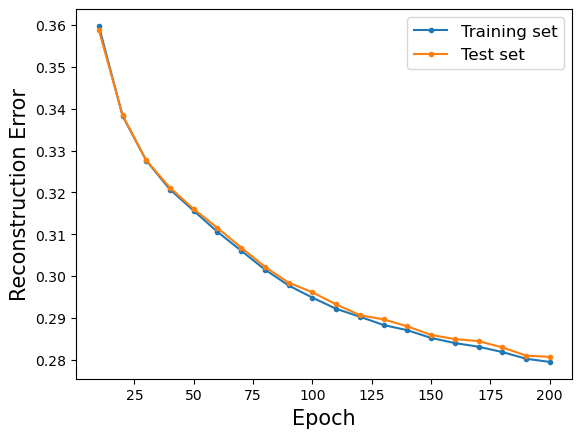

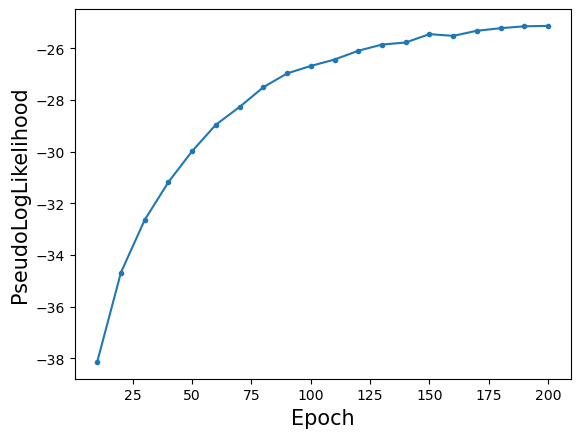

Training RBM 69/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359934 (train), 0.359050 (test), Pseud_Lik: -38.198889, Time: 2.906642, 
Ep 20, Rec er: 0.337593 (train), 0.337834 (test), Pseud_Lik: -34.021890, Time: 2.496584, 
Ep 30, Rec er: 0.327717 (train), 0.328218 (test), Pseud_Lik: -31.824680, Time: 3.244654, 
Ep 40, Rec er: 0.321864 (train), 0.323341 (test), Pseud_Lik: -30.744051, Time: 1.961660, 
Ep 50, Rec er: 0.317233 (train), 0.317044 (test), Pseud_Lik: -29.891514, Time: 2.348285, 
Ep 60, Rec er: 0.311903 (train), 0.313340 (test), Pseud_Lik: -29.015042, Time: 2.034953, 
Ep 70, Rec er: 0.307732 (train), 0.309036 (test), Pseud_Lik: -28.323350, Time: 1.928192, 
Ep 80, Rec er: 0.304304 (train), 0.305248 (test), Pseud_Lik: -27.681264, Time: 2.378025, 
Ep 90, Rec er: 0.301395 (train), 0.301628 (test), Pseud_Lik: -27.344720, Time: 2.161180, 
Ep 100, Rec er: 0.297667 (train), 0.298694 (test), Ps

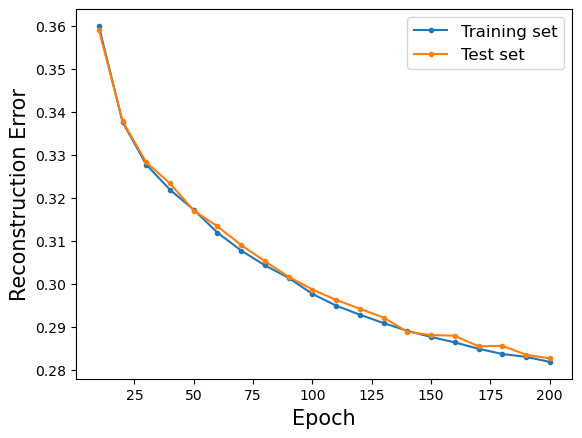

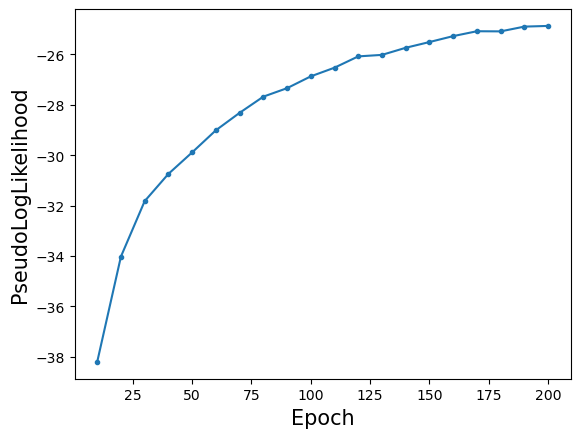

Training RBM 70/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359767 (train), 0.359583 (test), Pseud_Lik: -38.205129, Time: 2.301377, 
Ep 20, Rec er: 0.337956 (train), 0.338110 (test), Pseud_Lik: -34.266207, Time: 2.885688, 
Ep 30, Rec er: 0.326709 (train), 0.327587 (test), Pseud_Lik: -32.088450, Time: 2.911466, 
Ep 40, Rec er: 0.320163 (train), 0.321287 (test), Pseud_Lik: -30.591224, Time: 2.833669, 
Ep 50, Rec er: 0.314623 (train), 0.315437 (test), Pseud_Lik: -29.693901, Time: 2.719224, 
Ep 60, Rec er: 0.310364 (train), 0.310748 (test), Pseud_Lik: -28.615514, Time: 2.500456, 
Ep 70, Rec er: 0.305999 (train), 0.307271 (test), Pseud_Lik: -28.229189, Time: 2.541897, 
Ep 80, Rec er: 0.301799 (train), 0.302281 (test), Pseud_Lik: -27.477884, Time: 2.081981, 
Ep 90, Rec er: 0.298642 (train), 0.298785 (test), Pseud_Lik: -27.028505, Time: 2.709481, 
Ep 100, Rec er: 0.296223 (train), 0.296470 (test), Ps

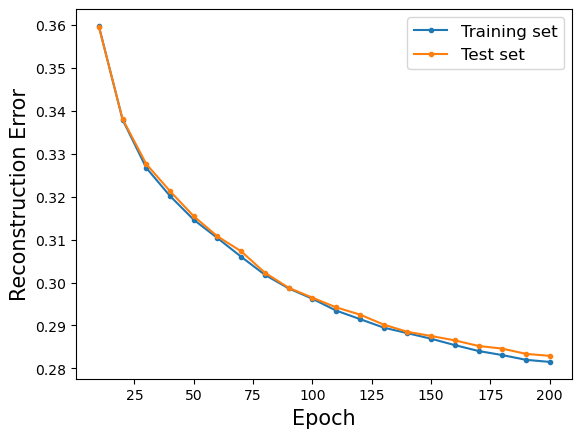

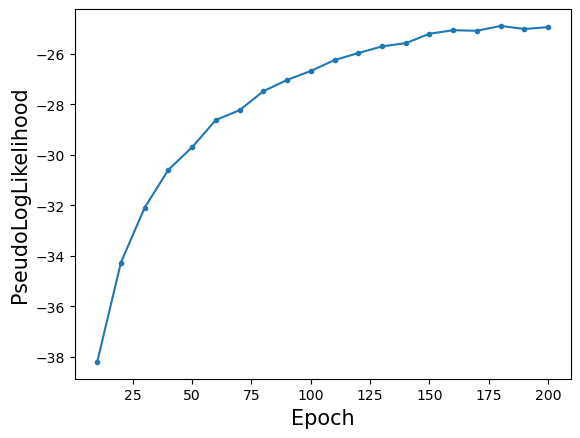

Training RBM 71/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360059 (train), 0.359167 (test), Pseud_Lik: -38.193555, Time: 1.964828, 
Ep 20, Rec er: 0.337890 (train), 0.337177 (test), Pseud_Lik: -34.102326, Time: 2.047736, 
Ep 30, Rec er: 0.327426 (train), 0.328066 (test), Pseud_Lik: -32.168475, Time: 2.407054, 
Ep 40, Rec er: 0.320988 (train), 0.322260 (test), Pseud_Lik: -30.546168, Time: 2.161121, 
Ep 50, Rec er: 0.316638 (train), 0.316907 (test), Pseud_Lik: -29.564355, Time: 2.216773, 
Ep 60, Rec er: 0.311198 (train), 0.311562 (test), Pseud_Lik: -28.904333, Time: 2.047484, 
Ep 70, Rec er: 0.307501 (train), 0.307986 (test), Pseud_Lik: -28.017374, Time: 2.528239, 
Ep 80, Rec er: 0.303703 (train), 0.304438 (test), Pseud_Lik: -27.716318, Time: 2.417412, 
Ep 90, Rec er: 0.300435 (train), 0.300945 (test), Pseud_Lik: -27.224078, Time: 2.247371, 
Ep 100, Rec er: 0.297491 (train), 0.298441 (test), Ps

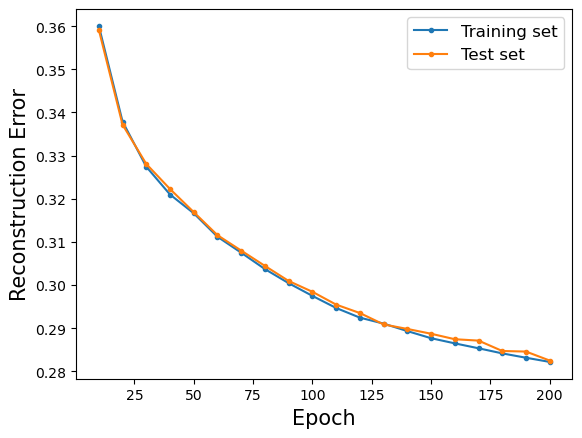

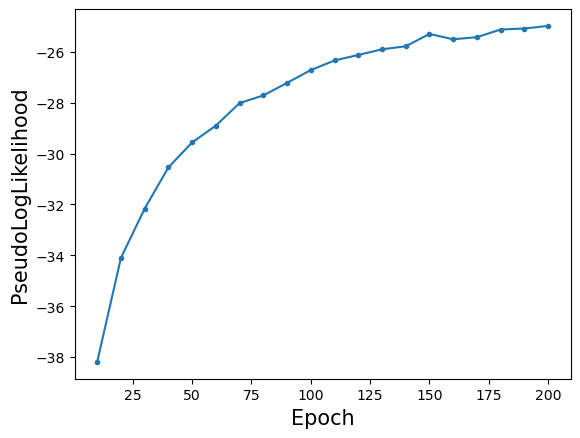

Training RBM 72/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359610 (train), 0.358741 (test), Pseud_Lik: -38.110267, Time: 3.262702, 
Ep 20, Rec er: 0.337889 (train), 0.338106 (test), Pseud_Lik: -34.260181, Time: 1.965440, 
Ep 30, Rec er: 0.327836 (train), 0.327913 (test), Pseud_Lik: -32.345176, Time: 1.944704, 
Ep 40, Rec er: 0.321593 (train), 0.321225 (test), Pseud_Lik: -30.820407, Time: 1.906218, 
Ep 50, Rec er: 0.316261 (train), 0.317167 (test), Pseud_Lik: -29.932995, Time: 2.647333, 
Ep 60, Rec er: 0.311567 (train), 0.311909 (test), Pseud_Lik: -29.013407, Time: 1.994783, 
Ep 70, Rec er: 0.307167 (train), 0.308710 (test), Pseud_Lik: -28.394372, Time: 2.241628, 
Ep 80, Rec er: 0.303214 (train), 0.304086 (test), Pseud_Lik: -27.642568, Time: 1.977002, 
Ep 90, Rec er: 0.299665 (train), 0.301326 (test), Pseud_Lik: -27.127339, Time: 2.075983, 
Ep 100, Rec er: 0.296448 (train), 0.297333 (test), Ps

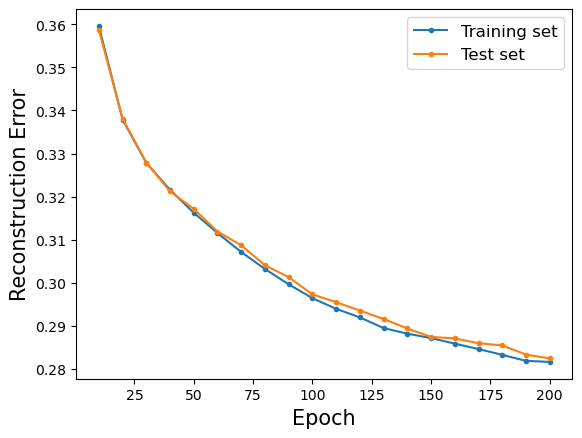

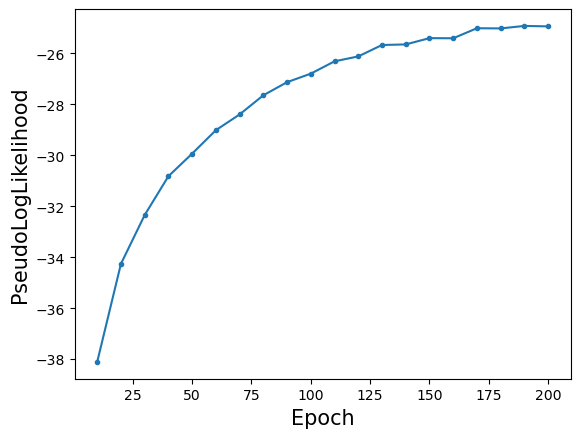

Training RBM 73/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360659 (train), 0.359666 (test), Pseud_Lik: -38.263222, Time: 2.692396, 
Ep 20, Rec er: 0.338348 (train), 0.337910 (test), Pseud_Lik: -34.254595, Time: 1.894588, 
Ep 30, Rec er: 0.327467 (train), 0.328798 (test), Pseud_Lik: -31.950004, Time: 2.004122, 
Ep 40, Rec er: 0.321046 (train), 0.322438 (test), Pseud_Lik: -30.523672, Time: 2.507894, 
Ep 50, Rec er: 0.316438 (train), 0.317514 (test), Pseud_Lik: -29.504591, Time: 2.096074, 
Ep 60, Rec er: 0.311469 (train), 0.311949 (test), Pseud_Lik: -28.879985, Time: 2.541597, 
Ep 70, Rec er: 0.307505 (train), 0.307844 (test), Pseud_Lik: -28.338978, Time: 1.988113, 
Ep 80, Rec er: 0.303699 (train), 0.304431 (test), Pseud_Lik: -27.831725, Time: 2.588505, 
Ep 90, Rec er: 0.300624 (train), 0.300786 (test), Pseud_Lik: -27.353012, Time: 2.101484, 
Ep 100, Rec er: 0.297391 (train), 0.299356 (test), Ps

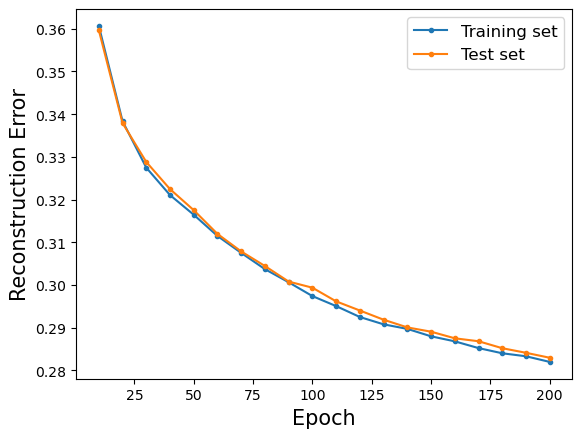

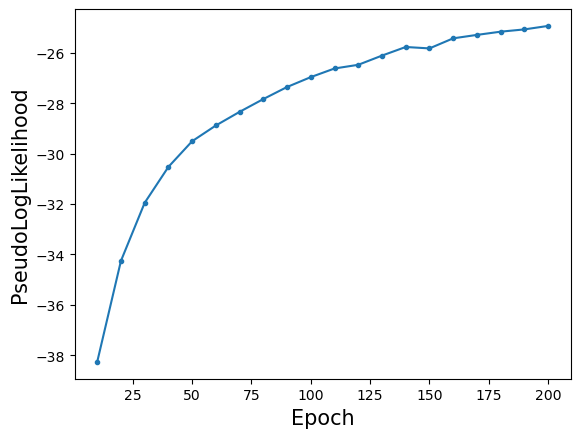

Training RBM 74/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359914 (train), 0.359012 (test), Pseud_Lik: -38.181937, Time: 2.603072, 
Ep 20, Rec er: 0.337929 (train), 0.337725 (test), Pseud_Lik: -34.341553, Time: 2.416534, 
Ep 30, Rec er: 0.326662 (train), 0.327352 (test), Pseud_Lik: -32.271102, Time: 2.161584, 
Ep 40, Rec er: 0.319838 (train), 0.320185 (test), Pseud_Lik: -30.427835, Time: 3.236051, 
Ep 50, Rec er: 0.314466 (train), 0.314896 (test), Pseud_Lik: -29.455449, Time: 2.131913, 
Ep 60, Rec er: 0.309733 (train), 0.310969 (test), Pseud_Lik: -28.428047, Time: 2.119353, 
Ep 70, Rec er: 0.304859 (train), 0.306394 (test), Pseud_Lik: -27.969582, Time: 2.079304, 
Ep 80, Rec er: 0.301459 (train), 0.301613 (test), Pseud_Lik: -27.366615, Time: 2.181058, 
Ep 90, Rec er: 0.298078 (train), 0.298308 (test), Pseud_Lik: -26.964175, Time: 2.337593, 
Ep 100, Rec er: 0.294890 (train), 0.296367 (test), Ps

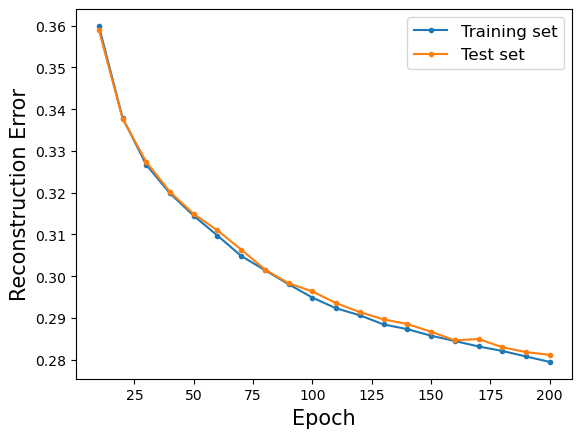

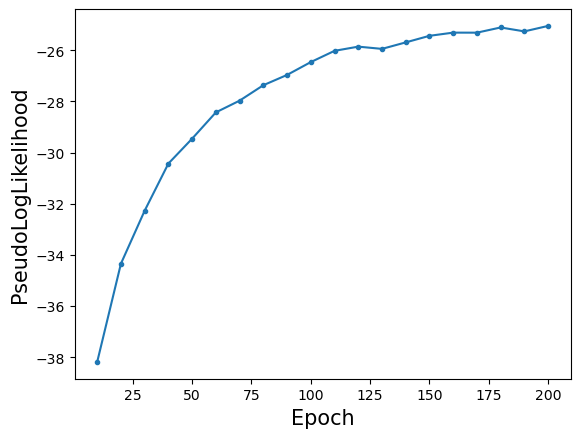

Training RBM 75/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360472 (train), 0.360588 (test), Pseud_Lik: -38.223556, Time: 2.151163, 
Ep 20, Rec er: 0.338832 (train), 0.340538 (test), Pseud_Lik: -34.399911, Time: 1.849634, 
Ep 30, Rec er: 0.328074 (train), 0.328526 (test), Pseud_Lik: -32.530480, Time: 2.073767, 
Ep 40, Rec er: 0.320888 (train), 0.321318 (test), Pseud_Lik: -30.705753, Time: 3.223666, 
Ep 50, Rec er: 0.315584 (train), 0.316607 (test), Pseud_Lik: -29.612483, Time: 2.354702, 
Ep 60, Rec er: 0.310486 (train), 0.311340 (test), Pseud_Lik: -28.678892, Time: 2.137418, 
Ep 70, Rec er: 0.305811 (train), 0.307122 (test), Pseud_Lik: -28.204544, Time: 2.450786, 
Ep 80, Rec er: 0.302033 (train), 0.304045 (test), Pseud_Lik: -27.511330, Time: 2.523058, 
Ep 90, Rec er: 0.298341 (train), 0.299992 (test), Pseud_Lik: -26.957982, Time: 2.301869, 
Ep 100, Rec er: 0.296001 (train), 0.296595 (test), Ps

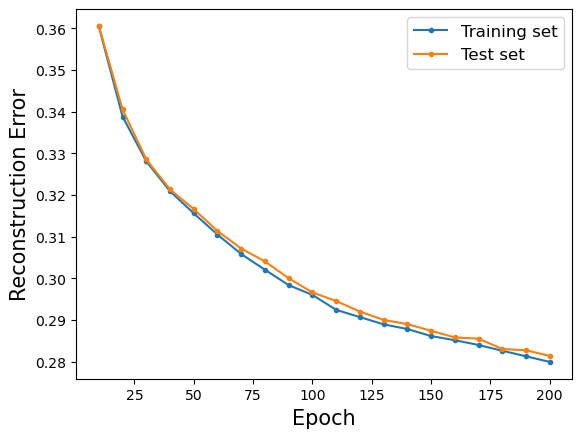

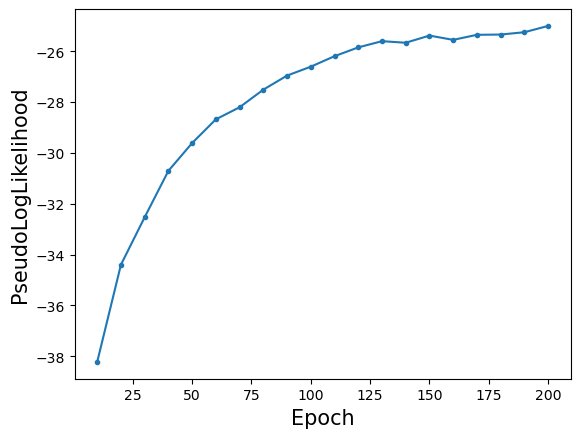

Training RBM 76/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361167 (train), 0.360541 (test), Pseud_Lik: -38.216299, Time: 2.132249, 
Ep 20, Rec er: 0.338366 (train), 0.339046 (test), Pseud_Lik: -34.537787, Time: 1.860636, 
Ep 30, Rec er: 0.326636 (train), 0.327301 (test), Pseud_Lik: -31.913986, Time: 2.123231, 
Ep 40, Rec er: 0.319895 (train), 0.319445 (test), Pseud_Lik: -30.273181, Time: 2.249303, 
Ep 50, Rec er: 0.314673 (train), 0.314612 (test), Pseud_Lik: -29.411454, Time: 1.947556, 
Ep 60, Rec er: 0.309674 (train), 0.310245 (test), Pseud_Lik: -28.624773, Time: 1.955950, 
Ep 70, Rec er: 0.305603 (train), 0.305977 (test), Pseud_Lik: -28.041826, Time: 2.187037, 
Ep 80, Rec er: 0.302257 (train), 0.302227 (test), Pseud_Lik: -27.491199, Time: 1.953975, 
Ep 90, Rec er: 0.298831 (train), 0.298834 (test), Pseud_Lik: -26.857841, Time: 2.296997, 
Ep 100, Rec er: 0.296018 (train), 0.296149 (test), Ps

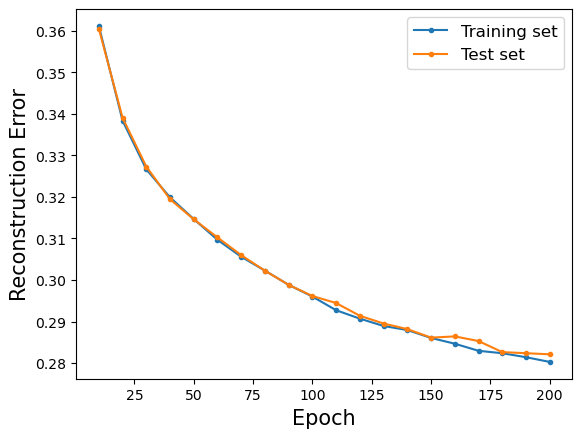

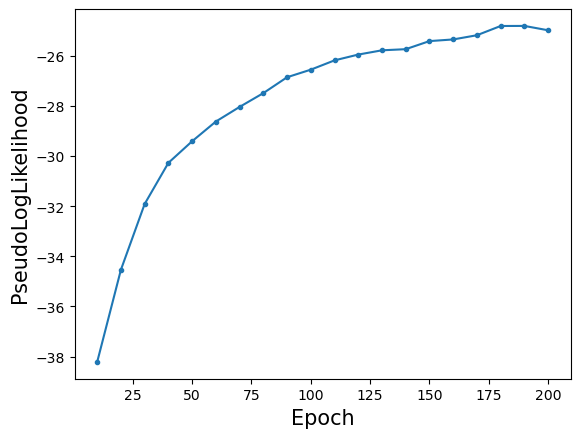

Training RBM 77/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361182 (train), 0.360419 (test), Pseud_Lik: -38.236626, Time: 2.319368, 
Ep 20, Rec er: 0.338952 (train), 0.339058 (test), Pseud_Lik: -34.428934, Time: 1.804986, 
Ep 30, Rec er: 0.327126 (train), 0.327225 (test), Pseud_Lik: -32.150144, Time: 1.929401, 
Ep 40, Rec er: 0.319330 (train), 0.320229 (test), Pseud_Lik: -30.377404, Time: 2.002324, 
Ep 50, Rec er: 0.314031 (train), 0.314072 (test), Pseud_Lik: -29.498403, Time: 1.996042, 
Ep 60, Rec er: 0.309341 (train), 0.310552 (test), Pseud_Lik: -28.613034, Time: 1.922604, 
Ep 70, Rec er: 0.305007 (train), 0.305113 (test), Pseud_Lik: -27.848612, Time: 1.923024, 
Ep 80, Rec er: 0.301287 (train), 0.302194 (test), Pseud_Lik: -27.420629, Time: 2.111516, 
Ep 90, Rec er: 0.297778 (train), 0.298436 (test), Pseud_Lik: -26.917637, Time: 2.026802, 
Ep 100, Rec er: 0.294981 (train), 0.296019 (test), Ps

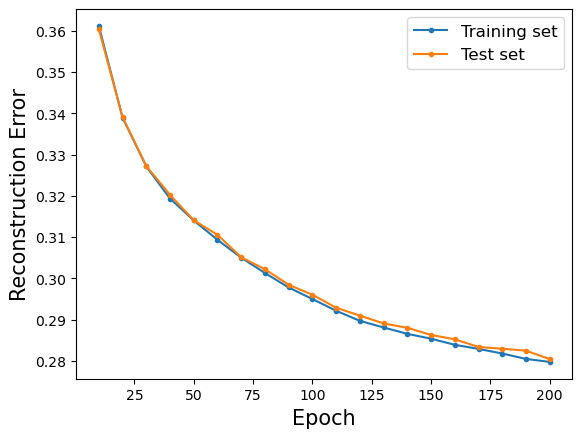

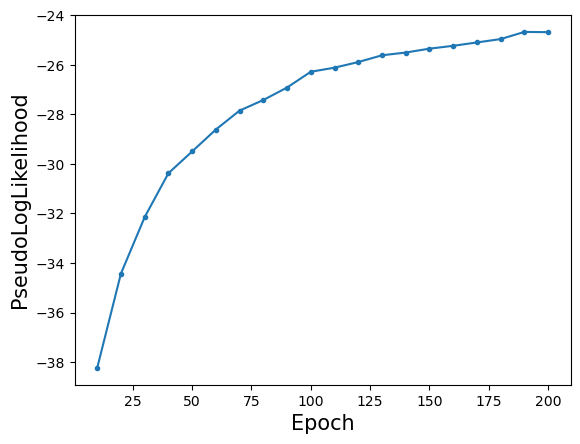

Training RBM 78/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362075 (train), 0.362438 (test), Pseud_Lik: -38.217208, Time: 1.883011, 
Ep 20, Rec er: 0.338684 (train), 0.339428 (test), Pseud_Lik: -34.373180, Time: 1.868938, 
Ep 30, Rec er: 0.327465 (train), 0.327613 (test), Pseud_Lik: -32.263028, Time: 2.416091, 
Ep 40, Rec er: 0.319436 (train), 0.320453 (test), Pseud_Lik: -30.976953, Time: 2.596022, 
Ep 50, Rec er: 0.314133 (train), 0.314760 (test), Pseud_Lik: -29.616544, Time: 1.909153, 
Ep 60, Rec er: 0.308973 (train), 0.309499 (test), Pseud_Lik: -28.633239, Time: 2.950158, 
Ep 70, Rec er: 0.304573 (train), 0.305014 (test), Pseud_Lik: -27.842937, Time: 2.167960, 
Ep 80, Rec er: 0.300099 (train), 0.301708 (test), Pseud_Lik: -27.317560, Time: 2.839707, 
Ep 90, Rec er: 0.297114 (train), 0.298086 (test), Pseud_Lik: -26.821255, Time: 2.753034, 
Ep 100, Rec er: 0.294331 (train), 0.295601 (test), Ps

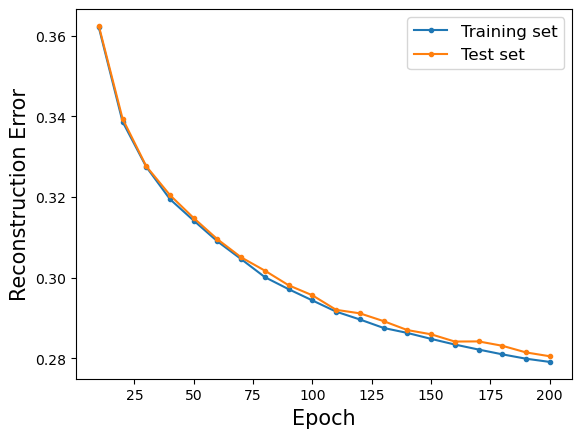

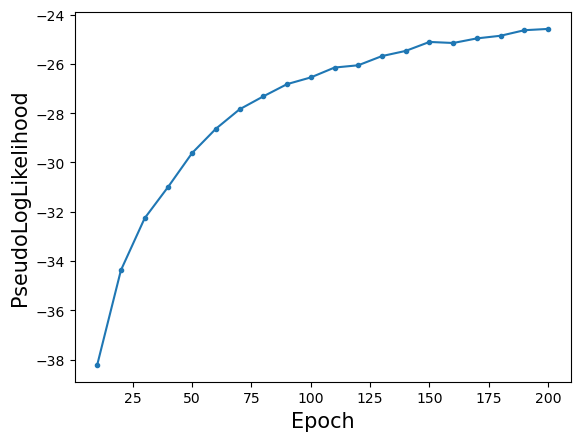

Training RBM 79/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359722 (train), 0.359514 (test), Pseud_Lik: -38.109689, Time: 2.465639, 
Ep 20, Rec er: 0.338815 (train), 0.339417 (test), Pseud_Lik: -34.334818, Time: 2.719396, 
Ep 30, Rec er: 0.328107 (train), 0.329192 (test), Pseud_Lik: -32.482161, Time: 2.214327, 
Ep 40, Rec er: 0.321814 (train), 0.322375 (test), Pseud_Lik: -30.643709, Time: 2.121441, 
Ep 50, Rec er: 0.316454 (train), 0.316774 (test), Pseud_Lik: -29.964079, Time: 2.363875, 
Ep 60, Rec er: 0.311548 (train), 0.312506 (test), Pseud_Lik: -28.871221, Time: 2.833227, 
Ep 70, Rec er: 0.306765 (train), 0.307139 (test), Pseud_Lik: -28.155874, Time: 2.075487, 
Ep 80, Rec er: 0.302772 (train), 0.304092 (test), Pseud_Lik: -27.474346, Time: 2.255626, 
Ep 90, Rec er: 0.299654 (train), 0.300477 (test), Pseud_Lik: -27.058306, Time: 2.108692, 
Ep 100, Rec er: 0.296356 (train), 0.298105 (test), Ps

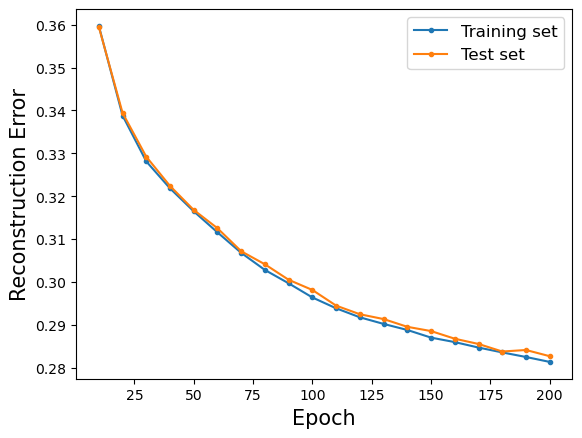

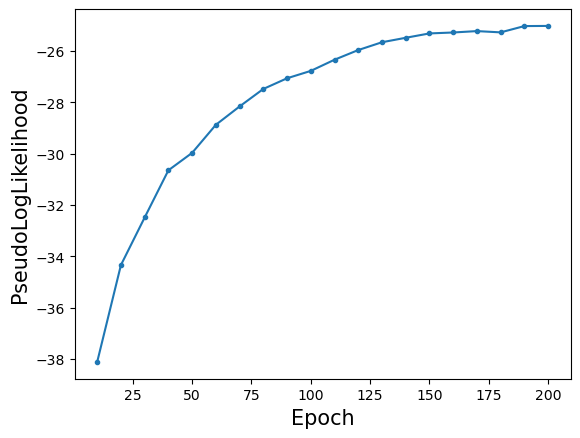

Training RBM 80/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360744 (train), 0.360340 (test), Pseud_Lik: -38.156794, Time: 2.494904, 
Ep 20, Rec er: 0.339461 (train), 0.339479 (test), Pseud_Lik: -34.425367, Time: 1.832883, 
Ep 30, Rec er: 0.328558 (train), 0.328962 (test), Pseud_Lik: -32.311596, Time: 1.817016, 
Ep 40, Rec er: 0.321899 (train), 0.321982 (test), Pseud_Lik: -31.031734, Time: 1.909197, 
Ep 50, Rec er: 0.315803 (train), 0.317222 (test), Pseud_Lik: -29.887213, Time: 1.865620, 
Ep 60, Rec er: 0.310470 (train), 0.310212 (test), Pseud_Lik: -28.711760, Time: 2.327153, 
Ep 70, Rec er: 0.306074 (train), 0.307589 (test), Pseud_Lik: -27.891634, Time: 1.843715, 
Ep 80, Rec er: 0.302447 (train), 0.302889 (test), Pseud_Lik: -27.395074, Time: 2.010027, 
Ep 90, Rec er: 0.298135 (train), 0.298824 (test), Pseud_Lik: -27.205150, Time: 2.054339, 
Ep 100, Rec er: 0.294976 (train), 0.296563 (test), Ps

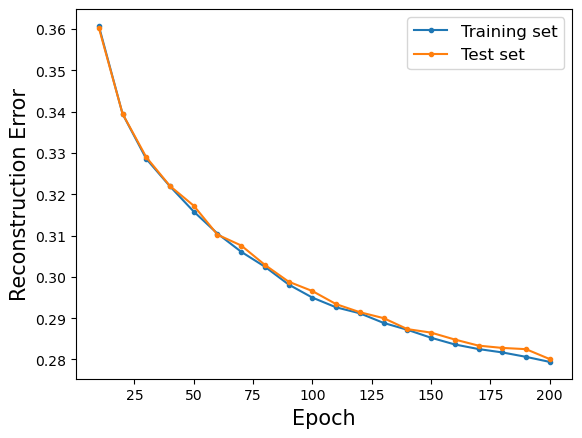

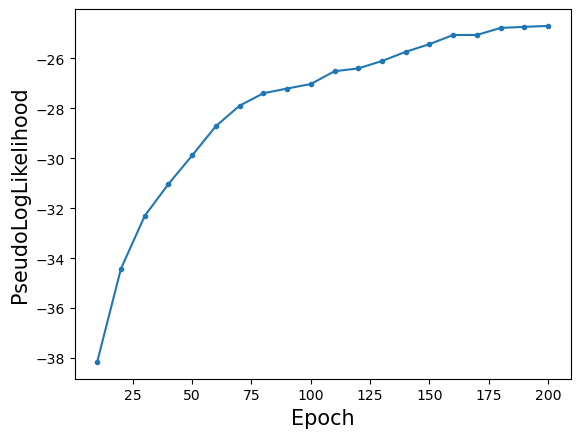

Training RBM 81/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362150 (train), 0.362415 (test), Pseud_Lik: -38.317396, Time: 2.396147, 
Ep 20, Rec er: 0.339074 (train), 0.339859 (test), Pseud_Lik: -34.600079, Time: 1.875139, 
Ep 30, Rec er: 0.327510 (train), 0.328238 (test), Pseud_Lik: -32.313720, Time: 2.497025, 
Ep 40, Rec er: 0.320936 (train), 0.321818 (test), Pseud_Lik: -30.980623, Time: 2.217427, 
Ep 50, Rec er: 0.315439 (train), 0.316544 (test), Pseud_Lik: -29.806685, Time: 2.575519, 
Ep 60, Rec er: 0.310481 (train), 0.311554 (test), Pseud_Lik: -28.735554, Time: 2.272166, 
Ep 70, Rec er: 0.306017 (train), 0.306477 (test), Pseud_Lik: -28.197962, Time: 2.025366, 
Ep 80, Rec er: 0.301700 (train), 0.301836 (test), Pseud_Lik: -27.549054, Time: 1.978583, 
Ep 90, Rec er: 0.298251 (train), 0.299168 (test), Pseud_Lik: -26.751764, Time: 2.675768, 
Ep 100, Rec er: 0.295172 (train), 0.295107 (test), Ps

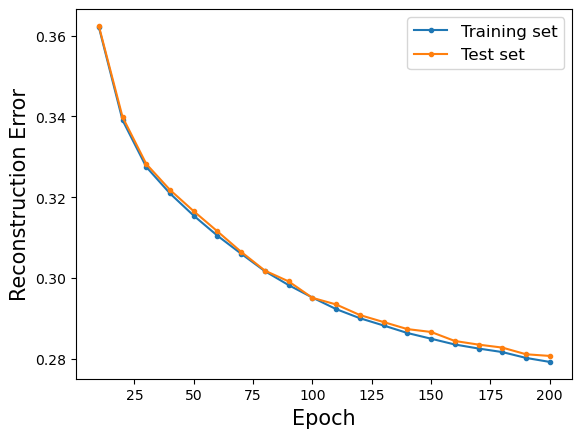

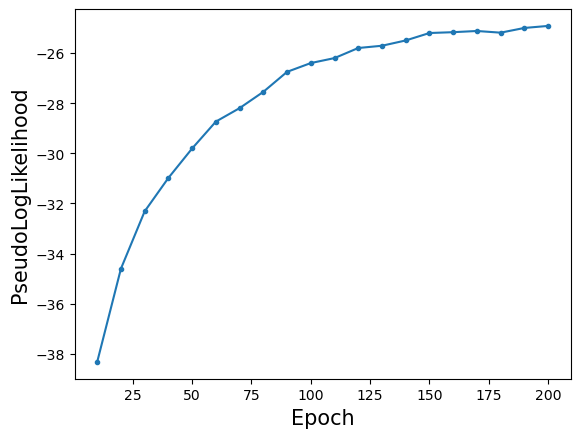

Training RBM 82/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359167 (train), 0.359256 (test), Pseud_Lik: -38.135504, Time: 2.537566, 
Ep 20, Rec er: 0.337500 (train), 0.336909 (test), Pseud_Lik: -34.266187, Time: 2.020523, 
Ep 30, Rec er: 0.327219 (train), 0.327105 (test), Pseud_Lik: -32.102381, Time: 1.965404, 
Ep 40, Rec er: 0.320864 (train), 0.322376 (test), Pseud_Lik: -30.869109, Time: 2.050275, 
Ep 50, Rec er: 0.316601 (train), 0.317407 (test), Pseud_Lik: -29.662515, Time: 2.196940, 
Ep 60, Rec er: 0.311758 (train), 0.312872 (test), Pseud_Lik: -29.122263, Time: 1.878691, 
Ep 70, Rec er: 0.307948 (train), 0.308044 (test), Pseud_Lik: -28.157765, Time: 2.092806, 
Ep 80, Rec er: 0.304022 (train), 0.304944 (test), Pseud_Lik: -27.513019, Time: 2.760086, 
Ep 90, Rec er: 0.300636 (train), 0.300939 (test), Pseud_Lik: -27.207228, Time: 2.411284, 
Ep 100, Rec er: 0.297325 (train), 0.298068 (test), Ps

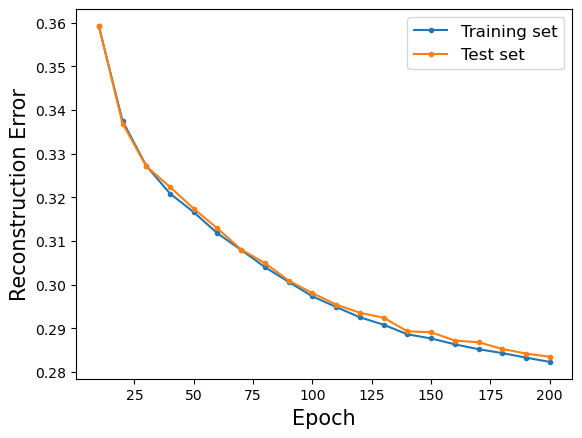

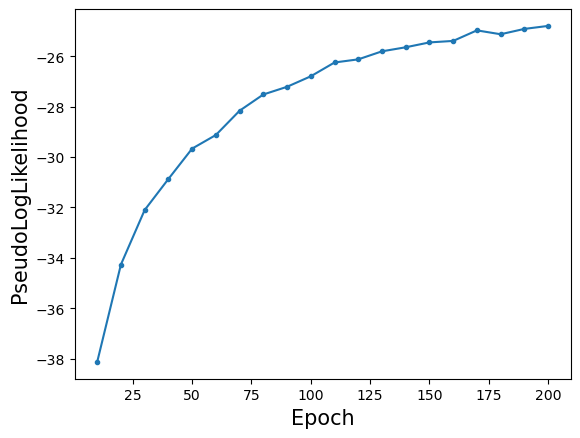

Training RBM 83/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359120 (train), 0.358053 (test), Pseud_Lik: -38.247568, Time: 1.932861, 
Ep 20, Rec er: 0.337934 (train), 0.338628 (test), Pseud_Lik: -33.945919, Time: 2.017026, 
Ep 30, Rec er: 0.327605 (train), 0.328782 (test), Pseud_Lik: -32.250020, Time: 2.010718, 
Ep 40, Rec er: 0.321170 (train), 0.321313 (test), Pseud_Lik: -30.635195, Time: 2.352184, 
Ep 50, Rec er: 0.315670 (train), 0.315981 (test), Pseud_Lik: -29.654339, Time: 2.437846, 
Ep 60, Rec er: 0.311645 (train), 0.312090 (test), Pseud_Lik: -28.654470, Time: 1.977276, 
Ep 70, Rec er: 0.306872 (train), 0.306952 (test), Pseud_Lik: -28.017635, Time: 1.934142, 
Ep 80, Rec er: 0.303250 (train), 0.304704 (test), Pseud_Lik: -27.616187, Time: 2.316237, 
Ep 90, Rec er: 0.300017 (train), 0.300834 (test), Pseud_Lik: -27.675155, Time: 2.112616, 
Ep 100, Rec er: 0.297072 (train), 0.297935 (test), Ps

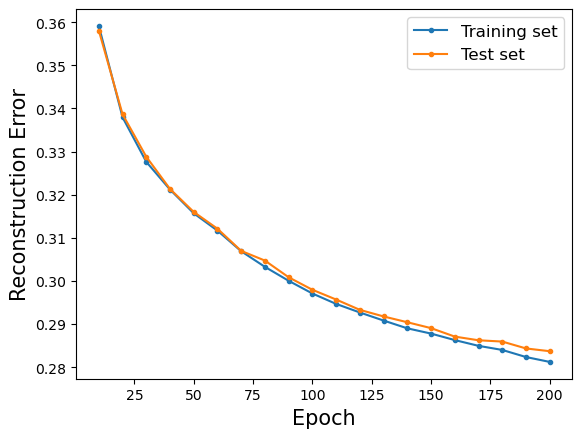

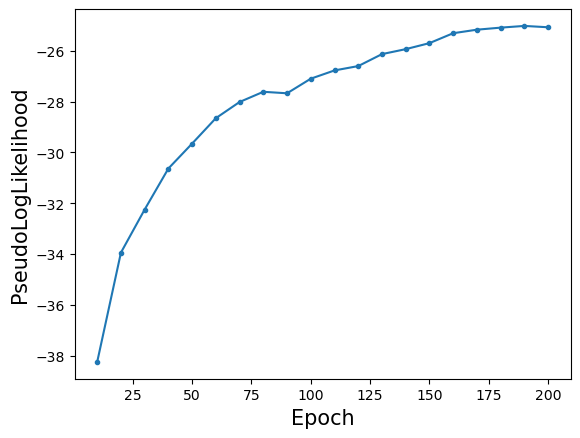

Training RBM 84/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361403 (train), 0.360043 (test), Pseud_Lik: -38.413195, Time: 3.016035, 
Ep 20, Rec er: 0.339276 (train), 0.339048 (test), Pseud_Lik: -34.359155, Time: 2.612377, 
Ep 30, Rec er: 0.328791 (train), 0.328307 (test), Pseud_Lik: -32.525496, Time: 2.067561, 
Ep 40, Rec er: 0.321696 (train), 0.321605 (test), Pseud_Lik: -31.021127, Time: 2.220930, 
Ep 50, Rec er: 0.316282 (train), 0.317296 (test), Pseud_Lik: -29.783262, Time: 2.320114, 
Ep 60, Rec er: 0.311466 (train), 0.311888 (test), Pseud_Lik: -28.913668, Time: 2.184635, 
Ep 70, Rec er: 0.307530 (train), 0.308165 (test), Pseud_Lik: -28.243832, Time: 2.215568, 
Ep 80, Rec er: 0.303093 (train), 0.303306 (test), Pseud_Lik: -27.606293, Time: 2.372950, 
Ep 90, Rec er: 0.300066 (train), 0.301467 (test), Pseud_Lik: -27.211015, Time: 2.566529, 
Ep 100, Rec er: 0.297223 (train), 0.298215 (test), Ps

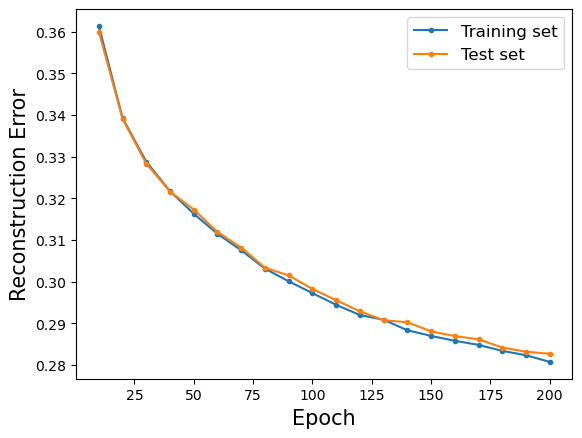

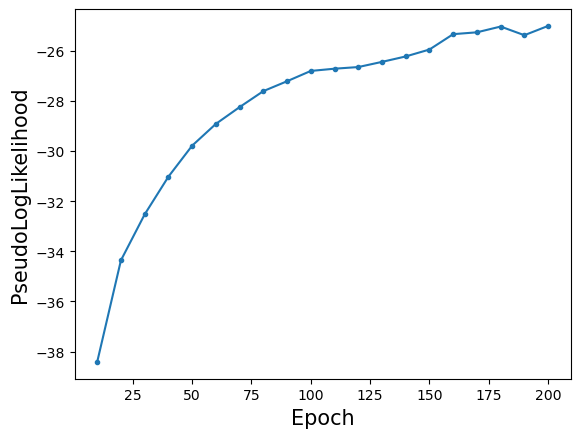

Training RBM 85/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359577 (train), 0.359777 (test), Pseud_Lik: -38.175545, Time: 1.749443, 
Ep 20, Rec er: 0.337217 (train), 0.337190 (test), Pseud_Lik: -34.132964, Time: 1.985163, 
Ep 30, Rec er: 0.326414 (train), 0.326737 (test), Pseud_Lik: -32.228030, Time: 1.987203, 
Ep 40, Rec er: 0.320968 (train), 0.321531 (test), Pseud_Lik: -30.323191, Time: 1.860778, 
Ep 50, Rec er: 0.316165 (train), 0.316469 (test), Pseud_Lik: -29.227366, Time: 1.878456, 
Ep 60, Rec er: 0.311809 (train), 0.312683 (test), Pseud_Lik: -28.680709, Time: 1.837758, 
Ep 70, Rec er: 0.306933 (train), 0.307917 (test), Pseud_Lik: -27.829508, Time: 1.940365, 
Ep 80, Rec er: 0.303969 (train), 0.304587 (test), Pseud_Lik: -27.363711, Time: 1.980721, 
Ep 90, Rec er: 0.300232 (train), 0.301404 (test), Pseud_Lik: -26.940517, Time: 2.172232, 
Ep 100, Rec er: 0.297014 (train), 0.298527 (test), Ps

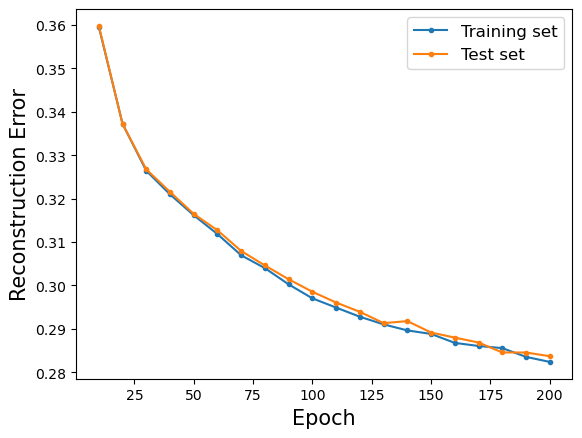

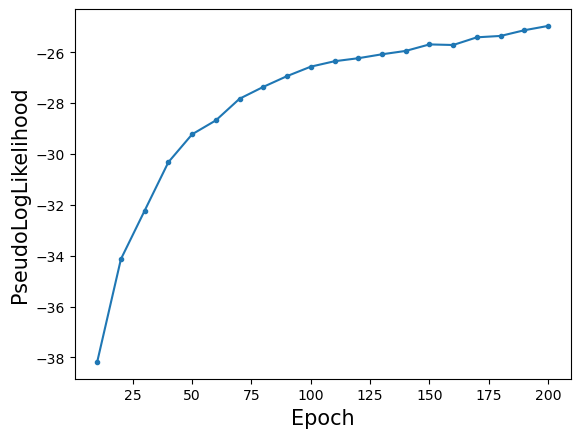

Training RBM 86/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361020 (train), 0.359543 (test), Pseud_Lik: -38.241033, Time: 2.146842, 
Ep 20, Rec er: 0.337712 (train), 0.338598 (test), Pseud_Lik: -34.725705, Time: 2.424637, 
Ep 30, Rec er: 0.326551 (train), 0.326569 (test), Pseud_Lik: -32.520898, Time: 2.143871, 
Ep 40, Rec er: 0.318963 (train), 0.319189 (test), Pseud_Lik: -30.664175, Time: 2.471400, 
Ep 50, Rec er: 0.313585 (train), 0.313940 (test), Pseud_Lik: -29.150871, Time: 2.808613, 
Ep 60, Rec er: 0.308059 (train), 0.308354 (test), Pseud_Lik: -28.536166, Time: 2.284654, 
Ep 70, Rec er: 0.303396 (train), 0.304527 (test), Pseud_Lik: -27.774030, Time: 2.371856, 
Ep 80, Rec er: 0.299216 (train), 0.300493 (test), Pseud_Lik: -27.315855, Time: 2.158811, 
Ep 90, Rec er: 0.296360 (train), 0.296647 (test), Pseud_Lik: -26.771771, Time: 1.920682, 
Ep 100, Rec er: 0.293041 (train), 0.294224 (test), Ps

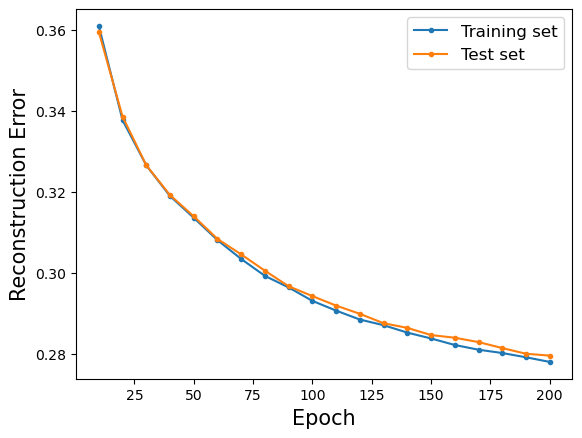

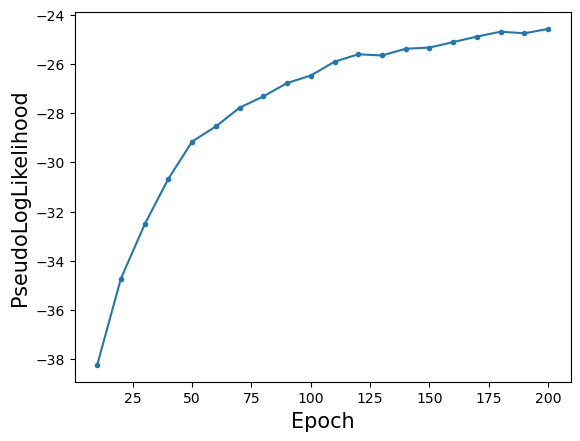

Training RBM 87/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359735 (train), 0.358971 (test), Pseud_Lik: -38.294431, Time: 2.094582, 
Ep 20, Rec er: 0.337545 (train), 0.337767 (test), Pseud_Lik: -34.049359, Time: 2.275478, 
Ep 30, Rec er: 0.327657 (train), 0.328348 (test), Pseud_Lik: -31.786345, Time: 1.822758, 
Ep 40, Rec er: 0.321853 (train), 0.321399 (test), Pseud_Lik: -30.727855, Time: 2.020251, 
Ep 50, Rec er: 0.317287 (train), 0.318375 (test), Pseud_Lik: -29.536367, Time: 1.903166, 
Ep 60, Rec er: 0.312485 (train), 0.313209 (test), Pseud_Lik: -28.811764, Time: 2.249697, 
Ep 70, Rec er: 0.308603 (train), 0.308355 (test), Pseud_Lik: -28.140641, Time: 2.071955, 
Ep 80, Rec er: 0.304478 (train), 0.306253 (test), Pseud_Lik: -27.745679, Time: 2.062707, 
Ep 90, Rec er: 0.301739 (train), 0.303223 (test), Pseud_Lik: -27.361956, Time: 1.962332, 
Ep 100, Rec er: 0.298997 (train), 0.299726 (test), Ps

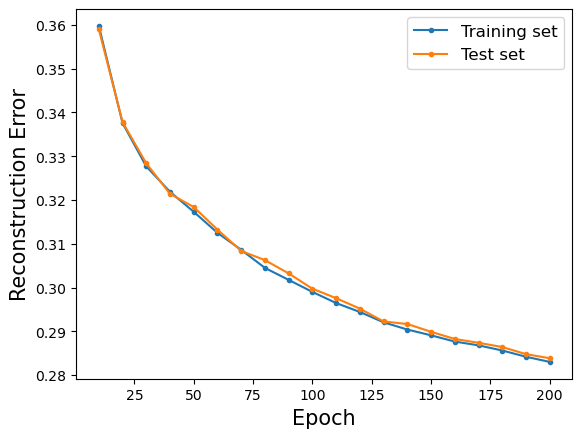

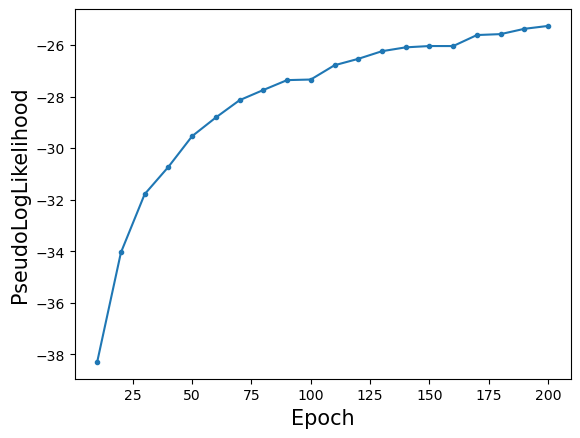

Training RBM 88/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359367 (train), 0.358000 (test), Pseud_Lik: -37.958347, Time: 1.851464, 
Ep 20, Rec er: 0.338141 (train), 0.337867 (test), Pseud_Lik: -34.253561, Time: 2.347831, 
Ep 30, Rec er: 0.327919 (train), 0.327213 (test), Pseud_Lik: -32.410946, Time: 1.982736, 
Ep 40, Rec er: 0.320470 (train), 0.320920 (test), Pseud_Lik: -30.662840, Time: 2.177489, 
Ep 50, Rec er: 0.315495 (train), 0.316206 (test), Pseud_Lik: -29.826697, Time: 1.903080, 
Ep 60, Rec er: 0.309891 (train), 0.310914 (test), Pseud_Lik: -29.069263, Time: 2.206787, 
Ep 70, Rec er: 0.305061 (train), 0.305824 (test), Pseud_Lik: -28.123376, Time: 1.957242, 
Ep 80, Rec er: 0.301115 (train), 0.301654 (test), Pseud_Lik: -27.462289, Time: 2.231544, 
Ep 90, Rec er: 0.297410 (train), 0.298021 (test), Pseud_Lik: -26.834576, Time: 1.935166, 
Ep 100, Rec er: 0.294506 (train), 0.296106 (test), Ps

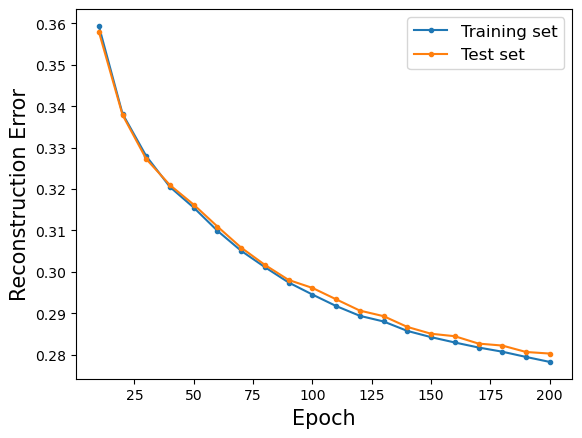

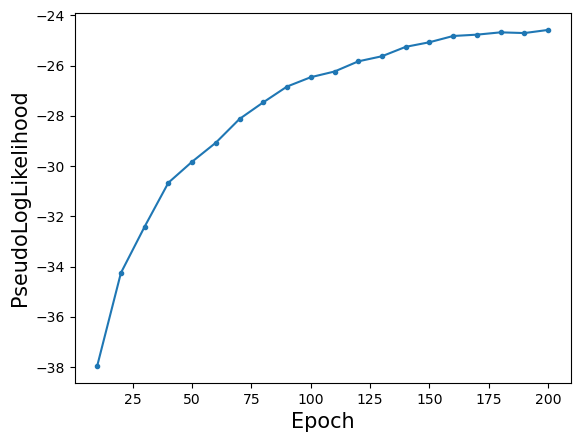

Training RBM 89/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359277 (train), 0.358575 (test), Pseud_Lik: -38.280221, Time: 1.912112, 
Ep 20, Rec er: 0.337424 (train), 0.338805 (test), Pseud_Lik: -34.107707, Time: 1.879860, 
Ep 30, Rec er: 0.327992 (train), 0.328602 (test), Pseud_Lik: -32.142396, Time: 2.213827, 
Ep 40, Rec er: 0.321661 (train), 0.322111 (test), Pseud_Lik: -30.894036, Time: 2.028389, 
Ep 50, Rec er: 0.315742 (train), 0.316036 (test), Pseud_Lik: -29.674747, Time: 1.922630, 
Ep 60, Rec er: 0.310896 (train), 0.311140 (test), Pseud_Lik: -28.636716, Time: 2.027804, 
Ep 70, Rec er: 0.306098 (train), 0.307180 (test), Pseud_Lik: -27.978898, Time: 2.045394, 
Ep 80, Rec er: 0.302374 (train), 0.303091 (test), Pseud_Lik: -27.215652, Time: 1.927874, 
Ep 90, Rec er: 0.298830 (train), 0.299562 (test), Pseud_Lik: -26.852051, Time: 1.891450, 
Ep 100, Rec er: 0.296286 (train), 0.297211 (test), Ps

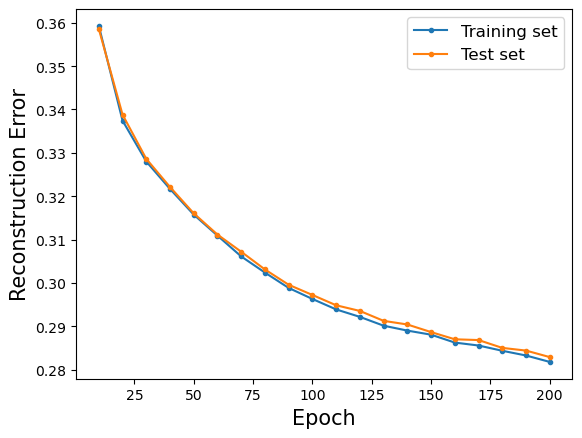

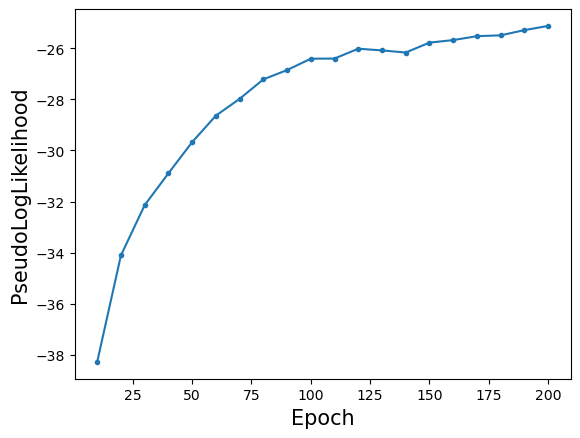

Training RBM 90/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361477 (train), 0.360892 (test), Pseud_Lik: -38.421856, Time: 2.069663, 
Ep 20, Rec er: 0.338959 (train), 0.339860 (test), Pseud_Lik: -34.391791, Time: 2.222943, 
Ep 30, Rec er: 0.328100 (train), 0.328515 (test), Pseud_Lik: -32.361049, Time: 2.808749, 
Ep 40, Rec er: 0.321172 (train), 0.321619 (test), Pseud_Lik: -30.672584, Time: 2.332913, 
Ep 50, Rec er: 0.315629 (train), 0.316425 (test), Pseud_Lik: -29.505873, Time: 2.303782, 
Ep 60, Rec er: 0.310962 (train), 0.311834 (test), Pseud_Lik: -28.757380, Time: 2.505483, 
Ep 70, Rec er: 0.306623 (train), 0.308496 (test), Pseud_Lik: -28.018990, Time: 2.640736, 
Ep 80, Rec er: 0.302859 (train), 0.303040 (test), Pseud_Lik: -27.387488, Time: 2.301998, 
Ep 90, Rec er: 0.299246 (train), 0.300574 (test), Pseud_Lik: -26.948570, Time: 2.636430, 
Ep 100, Rec er: 0.296448 (train), 0.297727 (test), Ps

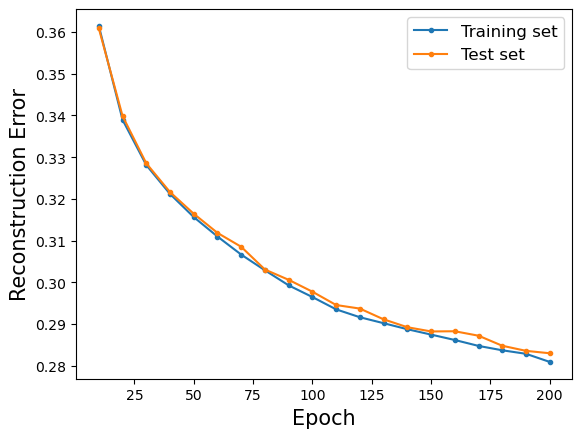

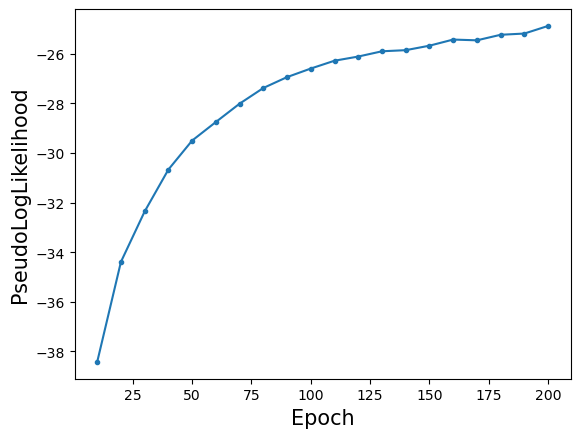

Training RBM 91/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361805 (train), 0.360926 (test), Pseud_Lik: -38.341371, Time: 2.930579, 
Ep 20, Rec er: 0.338312 (train), 0.339187 (test), Pseud_Lik: -34.212399, Time: 1.981015, 
Ep 30, Rec er: 0.327597 (train), 0.328699 (test), Pseud_Lik: -32.374681, Time: 1.931632, 
Ep 40, Rec er: 0.320695 (train), 0.321012 (test), Pseud_Lik: -31.033879, Time: 2.177010, 
Ep 50, Rec er: 0.315589 (train), 0.315553 (test), Pseud_Lik: -30.026244, Time: 2.458755, 
Ep 60, Rec er: 0.309725 (train), 0.310256 (test), Pseud_Lik: -28.802385, Time: 2.935235, 
Ep 70, Rec er: 0.304808 (train), 0.305940 (test), Pseud_Lik: -28.126800, Time: 2.669039, 
Ep 80, Rec er: 0.300832 (train), 0.301801 (test), Pseud_Lik: -27.296672, Time: 2.334281, 
Ep 90, Rec er: 0.296997 (train), 0.297707 (test), Pseud_Lik: -26.843431, Time: 2.357977, 
Ep 100, Rec er: 0.293865 (train), 0.294625 (test), Ps

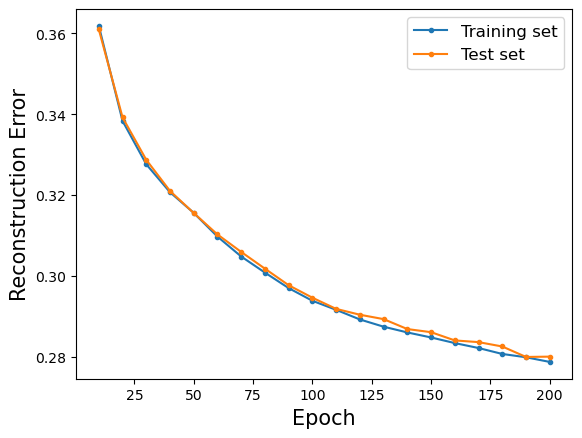

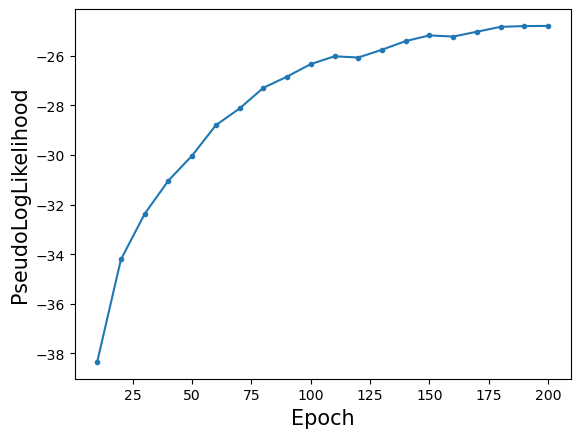

Training RBM 92/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360342 (train), 0.359689 (test), Pseud_Lik: -38.408784, Time: 3.014100, 
Ep 20, Rec er: 0.338320 (train), 0.338402 (test), Pseud_Lik: -34.315200, Time: 1.951860, 
Ep 30, Rec er: 0.327814 (train), 0.328086 (test), Pseud_Lik: -32.229827, Time: 2.592000, 
Ep 40, Rec er: 0.321170 (train), 0.321230 (test), Pseud_Lik: -30.593790, Time: 2.893773, 
Ep 50, Rec er: 0.315814 (train), 0.315926 (test), Pseud_Lik: -29.757766, Time: 2.663477, 
Ep 60, Rec er: 0.310518 (train), 0.311589 (test), Pseud_Lik: -28.717604, Time: 2.188667, 
Ep 70, Rec er: 0.306448 (train), 0.307233 (test), Pseud_Lik: -27.976120, Time: 3.108575, 
Ep 80, Rec er: 0.302770 (train), 0.303297 (test), Pseud_Lik: -27.606605, Time: 2.662261, 
Ep 90, Rec er: 0.299239 (train), 0.299852 (test), Pseud_Lik: -27.502638, Time: 3.196054, 
Ep 100, Rec er: 0.296373 (train), 0.297838 (test), Ps

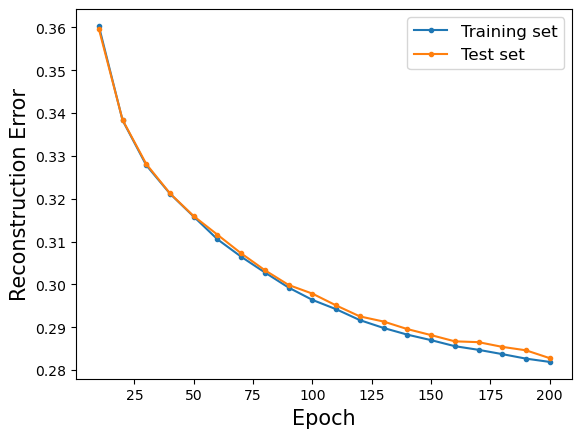

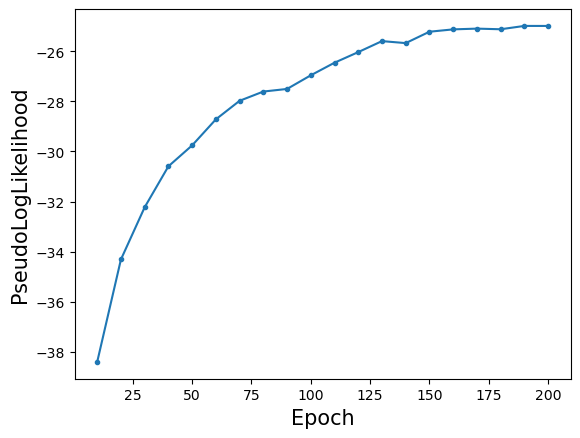

Training RBM 93/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360619 (train), 0.360697 (test), Pseud_Lik: -38.327039, Time: 3.504174, 
Ep 20, Rec er: 0.337885 (train), 0.338299 (test), Pseud_Lik: -34.369861, Time: 1.956410, 
Ep 30, Rec er: 0.326966 (train), 0.327988 (test), Pseud_Lik: -32.245034, Time: 3.368578, 
Ep 40, Rec er: 0.320376 (train), 0.321007 (test), Pseud_Lik: -30.505755, Time: 2.522718, 
Ep 50, Rec er: 0.315525 (train), 0.316011 (test), Pseud_Lik: -29.149923, Time: 3.343298, 
Ep 60, Rec er: 0.310316 (train), 0.311948 (test), Pseud_Lik: -28.557856, Time: 2.244225, 
Ep 70, Rec er: 0.306813 (train), 0.307362 (test), Pseud_Lik: -27.818997, Time: 2.340523, 
Ep 80, Rec er: 0.303405 (train), 0.303918 (test), Pseud_Lik: -27.453897, Time: 2.724734, 
Ep 90, Rec er: 0.299842 (train), 0.300871 (test), Pseud_Lik: -27.090004, Time: 2.502727, 
Ep 100, Rec er: 0.296898 (train), 0.297429 (test), Ps

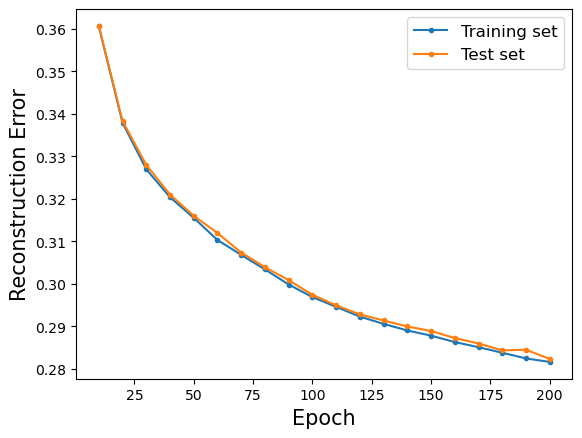

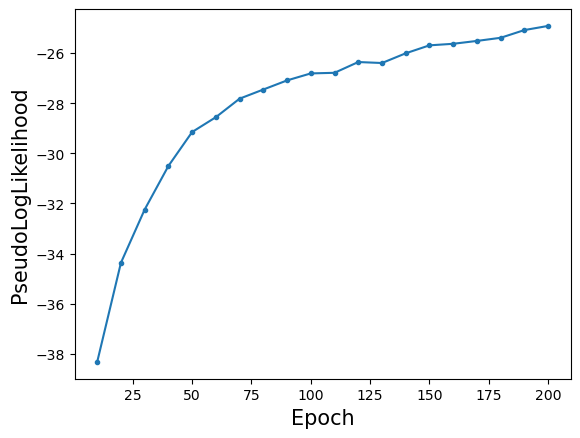

Training RBM 94/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360932 (train), 0.360981 (test), Pseud_Lik: -38.286844, Time: 2.612099, 
Ep 20, Rec er: 0.338878 (train), 0.339707 (test), Pseud_Lik: -34.436532, Time: 2.084532, 
Ep 30, Rec er: 0.327734 (train), 0.329111 (test), Pseud_Lik: -31.983660, Time: 2.349909, 
Ep 40, Rec er: 0.320601 (train), 0.320857 (test), Pseud_Lik: -30.712846, Time: 2.185702, 
Ep 50, Rec er: 0.315541 (train), 0.316580 (test), Pseud_Lik: -29.514687, Time: 3.034612, 
Ep 60, Rec er: 0.310340 (train), 0.310198 (test), Pseud_Lik: -28.647813, Time: 2.413338, 
Ep 70, Rec er: 0.306220 (train), 0.306644 (test), Pseud_Lik: -27.852241, Time: 2.425108, 
Ep 80, Rec er: 0.301866 (train), 0.303379 (test), Pseud_Lik: -27.148034, Time: 2.004937, 
Ep 90, Rec er: 0.298198 (train), 0.300000 (test), Pseud_Lik: -26.775245, Time: 2.191651, 
Ep 100, Rec er: 0.295654 (train), 0.297193 (test), Ps

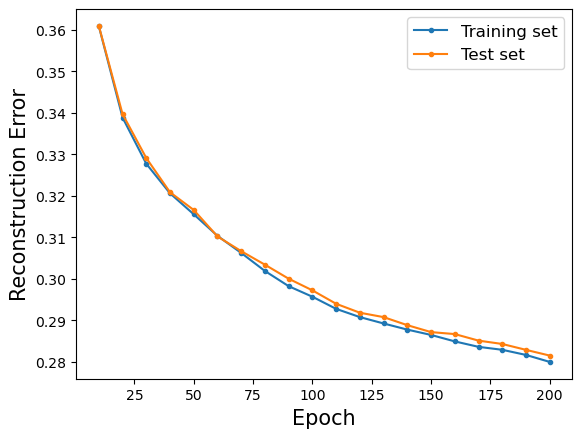

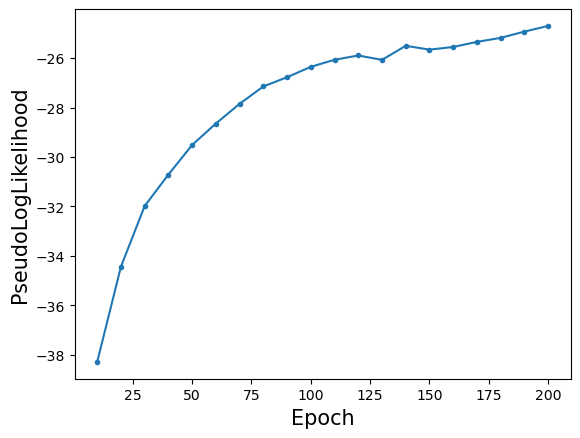

Training RBM 95/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361446 (train), 0.360852 (test), Pseud_Lik: -38.414408, Time: 2.010705, 
Ep 20, Rec er: 0.339561 (train), 0.340109 (test), Pseud_Lik: -34.829213, Time: 1.902326, 
Ep 30, Rec er: 0.327897 (train), 0.327990 (test), Pseud_Lik: -32.911978, Time: 2.354321, 
Ep 40, Rec er: 0.319990 (train), 0.320935 (test), Pseud_Lik: -31.007139, Time: 2.470573, 
Ep 50, Rec er: 0.314049 (train), 0.314308 (test), Pseud_Lik: -29.727599, Time: 2.066709, 
Ep 60, Rec er: 0.307916 (train), 0.309110 (test), Pseud_Lik: -28.596177, Time: 1.987245, 
Ep 70, Rec er: 0.303467 (train), 0.303650 (test), Pseud_Lik: -27.848860, Time: 2.819198, 
Ep 80, Rec er: 0.299110 (train), 0.299944 (test), Pseud_Lik: -27.231922, Time: 2.223795, 
Ep 90, Rec er: 0.295808 (train), 0.296213 (test), Pseud_Lik: -26.819987, Time: 2.739424, 
Ep 100, Rec er: 0.292842 (train), 0.293737 (test), Ps

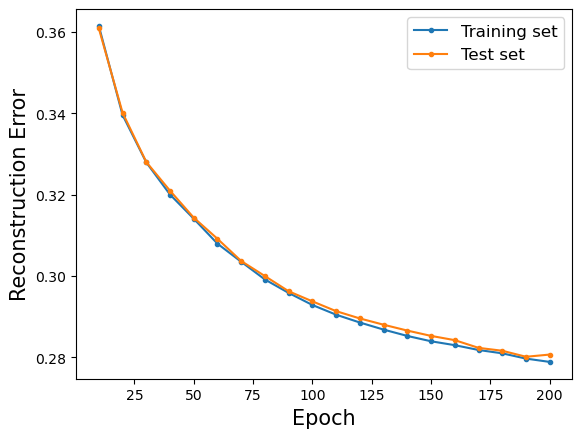

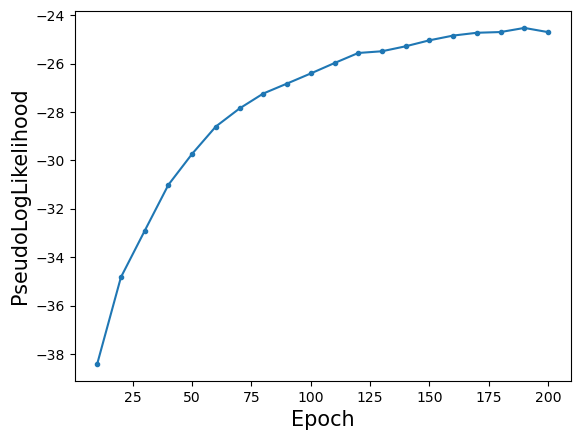

Training RBM 96/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361155 (train), 0.360407 (test), Pseud_Lik: -38.170643, Time: 1.927686, 
Ep 20, Rec er: 0.337290 (train), 0.336802 (test), Pseud_Lik: -34.082997, Time: 2.113432, 
Ep 30, Rec er: 0.326522 (train), 0.327270 (test), Pseud_Lik: -31.979359, Time: 2.413093, 
Ep 40, Rec er: 0.319963 (train), 0.320721 (test), Pseud_Lik: -30.758685, Time: 2.061107, 
Ep 50, Rec er: 0.315154 (train), 0.315332 (test), Pseud_Lik: -29.686180, Time: 1.949296, 
Ep 60, Rec er: 0.310057 (train), 0.310549 (test), Pseud_Lik: -28.729503, Time: 2.162488, 
Ep 70, Rec er: 0.306024 (train), 0.306838 (test), Pseud_Lik: -28.164140, Time: 2.783313, 
Ep 80, Rec er: 0.302323 (train), 0.303073 (test), Pseud_Lik: -27.892029, Time: 2.069065, 
Ep 90, Rec er: 0.298801 (train), 0.299840 (test), Pseud_Lik: -27.464530, Time: 3.167419, 
Ep 100, Rec er: 0.295531 (train), 0.296591 (test), Ps

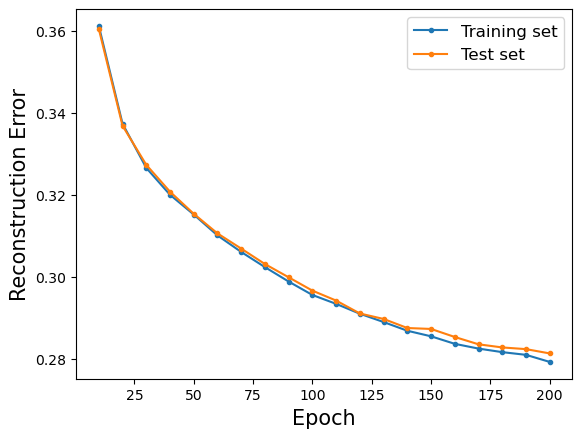

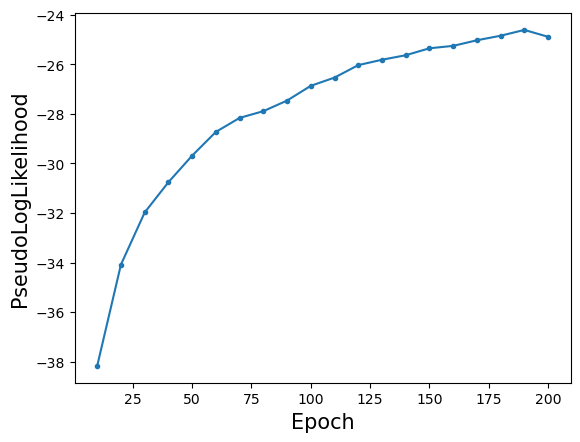

Training RBM 97/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360665 (train), 0.359819 (test), Pseud_Lik: -38.206754, Time: 1.916735, 
Ep 20, Rec er: 0.338631 (train), 0.339000 (test), Pseud_Lik: -34.316407, Time: 1.905670, 
Ep 30, Rec er: 0.327753 (train), 0.327665 (test), Pseud_Lik: -32.499718, Time: 2.035296, 
Ep 40, Rec er: 0.320072 (train), 0.320763 (test), Pseud_Lik: -30.737641, Time: 1.971029, 
Ep 50, Rec er: 0.314802 (train), 0.314588 (test), Pseud_Lik: -29.423969, Time: 2.256426, 
Ep 60, Rec er: 0.310054 (train), 0.309946 (test), Pseud_Lik: -28.440311, Time: 2.012672, 
Ep 70, Rec er: 0.304953 (train), 0.306094 (test), Pseud_Lik: -27.699273, Time: 1.998683, 
Ep 80, Rec er: 0.301062 (train), 0.301447 (test), Pseud_Lik: -27.529286, Time: 2.031752, 
Ep 90, Rec er: 0.297619 (train), 0.298265 (test), Pseud_Lik: -26.780383, Time: 2.280922, 
Ep 100, Rec er: 0.294621 (train), 0.295932 (test), Ps

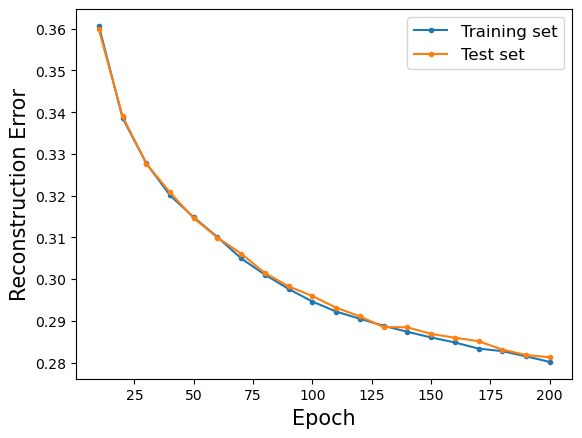

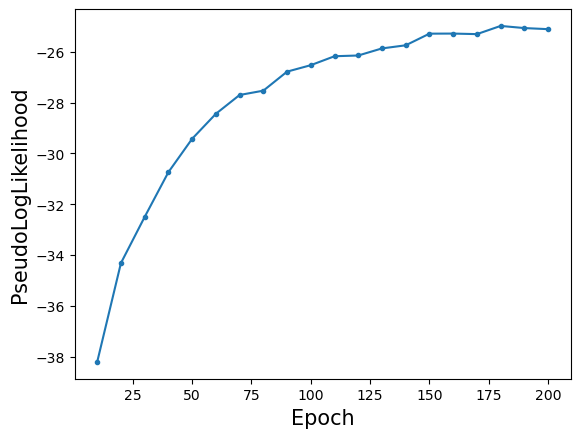

Training RBM 98/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362246 (train), 0.361247 (test), Pseud_Lik: -38.202631, Time: 1.984482, 
Ep 20, Rec er: 0.338502 (train), 0.338891 (test), Pseud_Lik: -34.427354, Time: 2.171963, 
Ep 30, Rec er: 0.327581 (train), 0.328228 (test), Pseud_Lik: -32.639648, Time: 2.302964, 
Ep 40, Rec er: 0.320454 (train), 0.321165 (test), Pseud_Lik: -31.120840, Time: 2.575077, 
Ep 50, Rec er: 0.314830 (train), 0.315798 (test), Pseud_Lik: -29.751708, Time: 1.872019, 
Ep 60, Rec er: 0.309939 (train), 0.310421 (test), Pseud_Lik: -28.507905, Time: 2.106536, 
Ep 70, Rec er: 0.305212 (train), 0.306127 (test), Pseud_Lik: -28.011224, Time: 2.026011, 
Ep 80, Rec er: 0.301522 (train), 0.302267 (test), Pseud_Lik: -27.326334, Time: 2.343235, 
Ep 90, Rec er: 0.297406 (train), 0.299104 (test), Pseud_Lik: -26.972369, Time: 1.973597, 
Ep 100, Rec er: 0.295137 (train), 0.295757 (test), Ps

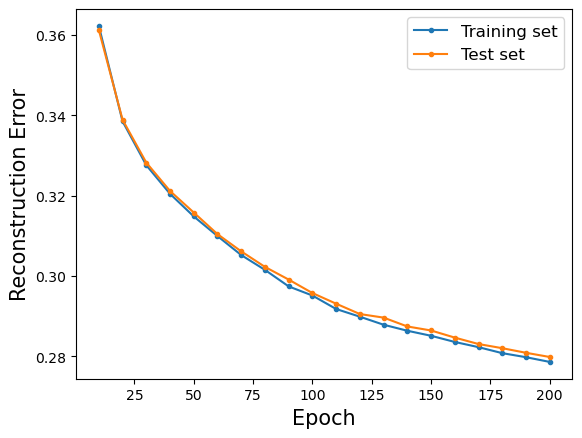

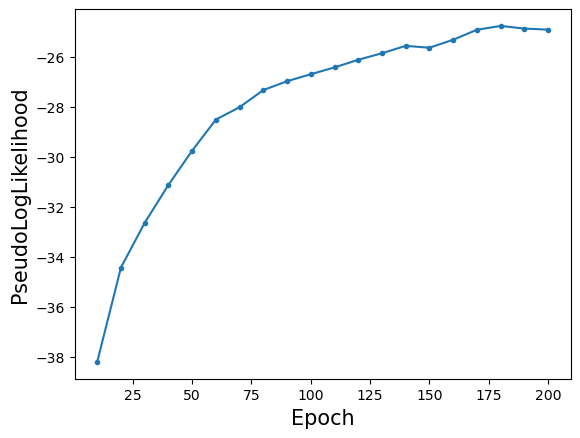

Training RBM 99/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358921 (train), 0.358713 (test), Pseud_Lik: -38.116762, Time: 3.253173, 
Ep 20, Rec er: 0.337546 (train), 0.337418 (test), Pseud_Lik: -33.958707, Time: 2.667834, 
Ep 30, Rec er: 0.327996 (train), 0.328719 (test), Pseud_Lik: -31.913429, Time: 2.321964, 
Ep 40, Rec er: 0.322038 (train), 0.323163 (test), Pseud_Lik: -30.348798, Time: 1.899139, 
Ep 50, Rec er: 0.317558 (train), 0.317959 (test), Pseud_Lik: -29.572208, Time: 1.999675, 
Ep 60, Rec er: 0.313097 (train), 0.314697 (test), Pseud_Lik: -28.719030, Time: 1.950794, 
Ep 70, Rec er: 0.308816 (train), 0.310788 (test), Pseud_Lik: -28.271723, Time: 2.089520, 
Ep 80, Rec er: 0.305383 (train), 0.306112 (test), Pseud_Lik: -27.669968, Time: 2.055708, 
Ep 90, Rec er: 0.302089 (train), 0.303180 (test), Pseud_Lik: -27.296581, Time: 1.995204, 
Ep 100, Rec er: 0.299542 (train), 0.299890 (test), Ps

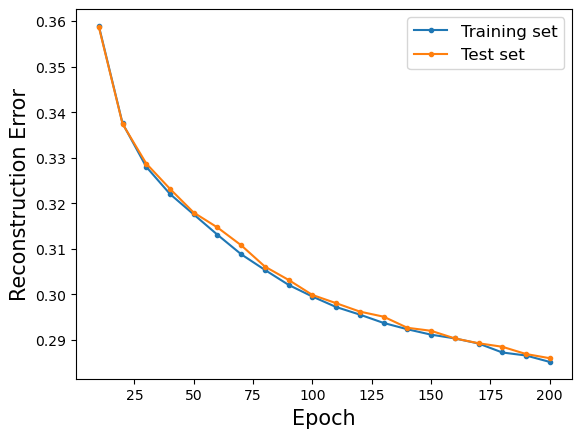

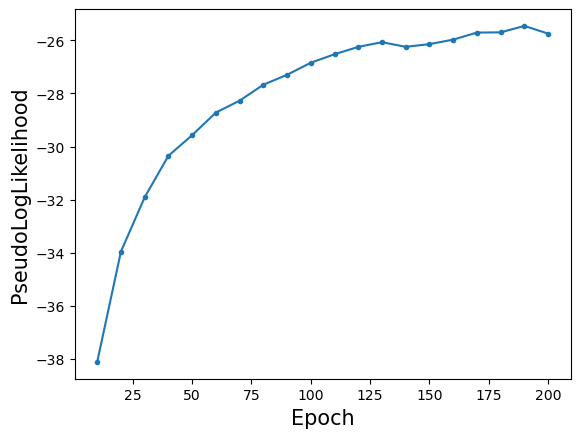

Training RBM 100/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360649 (train), 0.359850 (test), Pseud_Lik: -38.313705, Time: 2.029326, 
Ep 20, Rec er: 0.338419 (train), 0.338435 (test), Pseud_Lik: -34.154038, Time: 1.887539, 
Ep 30, Rec er: 0.328501 (train), 0.329675 (test), Pseud_Lik: -32.089798, Time: 2.163546, 
Ep 40, Rec er: 0.322155 (train), 0.323832 (test), Pseud_Lik: -30.768714, Time: 2.660324, 
Ep 50, Rec er: 0.317609 (train), 0.318418 (test), Pseud_Lik: -29.709104, Time: 2.093093, 
Ep 60, Rec er: 0.313419 (train), 0.313113 (test), Pseud_Lik: -28.775532, Time: 2.618002, 
Ep 70, Rec er: 0.308436 (train), 0.309056 (test), Pseud_Lik: -28.254579, Time: 2.418982, 
Ep 80, Rec er: 0.305242 (train), 0.305990 (test), Pseud_Lik: -27.623127, Time: 2.263564, 
Ep 90, Rec er: 0.301591 (train), 0.302466 (test), Pseud_Lik: -27.359640, Time: 2.866940, 
Ep 100, Rec er: 0.298913 (train), 0.299484 (test), P

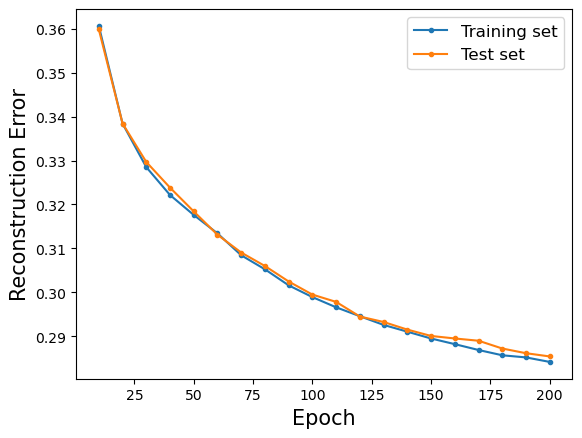

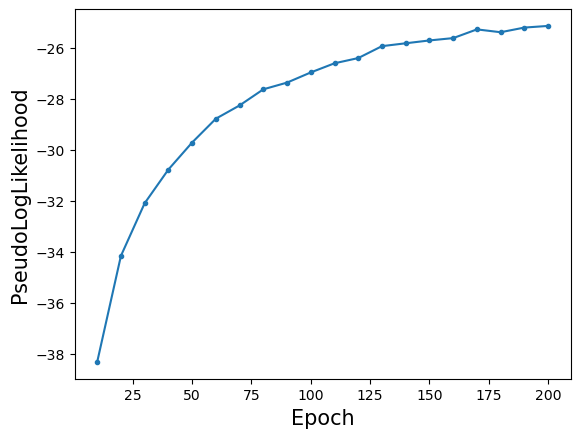

Training RBM 101/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360504 (train), 0.360182 (test), Pseud_Lik: -38.048711, Time: 2.647004, 
Ep 20, Rec er: 0.338821 (train), 0.338896 (test), Pseud_Lik: -34.741807, Time: 2.167453, 
Ep 30, Rec er: 0.327384 (train), 0.327408 (test), Pseud_Lik: -32.740834, Time: 2.441948, 
Ep 40, Rec er: 0.319504 (train), 0.319710 (test), Pseud_Lik: -30.816315, Time: 2.375724, 
Ep 50, Rec er: 0.313324 (train), 0.314033 (test), Pseud_Lik: -29.338649, Time: 2.493933, 
Ep 60, Rec er: 0.307925 (train), 0.308975 (test), Pseud_Lik: -28.515375, Time: 2.894108, 
Ep 70, Rec er: 0.303247 (train), 0.303791 (test), Pseud_Lik: -27.656372, Time: 2.151494, 
Ep 80, Rec er: 0.299518 (train), 0.300237 (test), Pseud_Lik: -27.442804, Time: 2.208926, 
Ep 90, Rec er: 0.296214 (train), 0.297316 (test), Pseud_Lik: -27.178398, Time: 2.493883, 
Ep 100, Rec er: 0.293143 (train), 0.294381 (test), P

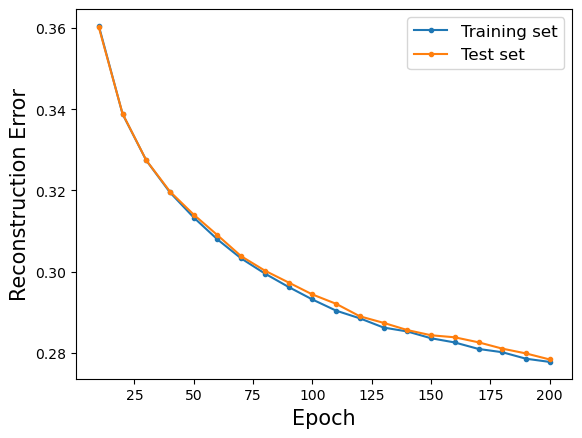

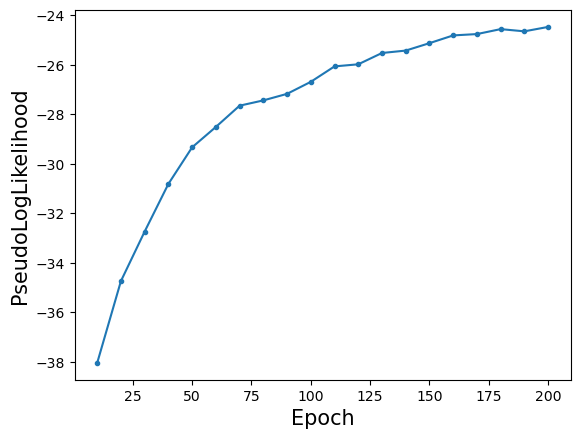

Training RBM 102/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360714 (train), 0.360709 (test), Pseud_Lik: -38.202223, Time: 2.475533, 
Ep 20, Rec er: 0.338821 (train), 0.339615 (test), Pseud_Lik: -34.425346, Time: 2.304398, 
Ep 30, Rec er: 0.327056 (train), 0.327920 (test), Pseud_Lik: -32.045357, Time: 2.359339, 
Ep 40, Rec er: 0.319281 (train), 0.320156 (test), Pseud_Lik: -30.705034, Time: 2.163689, 
Ep 50, Rec er: 0.314070 (train), 0.314237 (test), Pseud_Lik: -29.542769, Time: 2.035157, 
Ep 60, Rec er: 0.309105 (train), 0.309996 (test), Pseud_Lik: -28.490269, Time: 2.119948, 
Ep 70, Rec er: 0.304256 (train), 0.305197 (test), Pseud_Lik: -27.955066, Time: 2.151334, 
Ep 80, Rec er: 0.300483 (train), 0.300951 (test), Pseud_Lik: -27.121755, Time: 2.775654, 
Ep 90, Rec er: 0.296887 (train), 0.297796 (test), Pseud_Lik: -26.733575, Time: 2.232888, 
Ep 100, Rec er: 0.293990 (train), 0.294982 (test), P

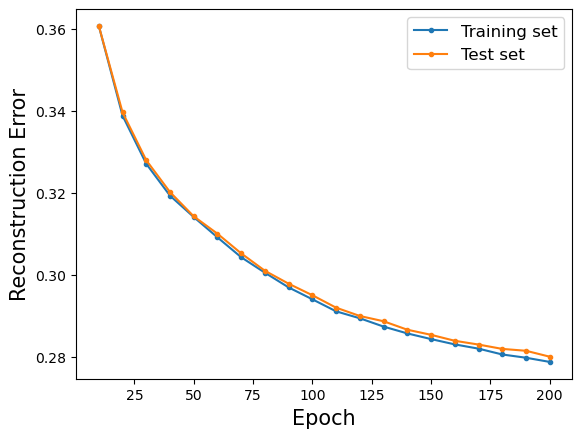

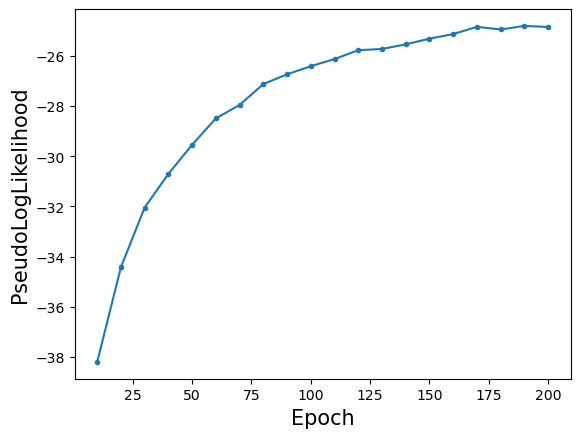

Training RBM 103/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361241 (train), 0.360428 (test), Pseud_Lik: -38.523421, Time: 3.038969, 
Ep 20, Rec er: 0.338474 (train), 0.338305 (test), Pseud_Lik: -34.237030, Time: 2.401691, 
Ep 30, Rec er: 0.327119 (train), 0.327680 (test), Pseud_Lik: -31.859727, Time: 2.008782, 
Ep 40, Rec er: 0.320549 (train), 0.320653 (test), Pseud_Lik: -30.681939, Time: 3.083983, 
Ep 50, Rec er: 0.315646 (train), 0.315631 (test), Pseud_Lik: -29.387860, Time: 2.589160, 
Ep 60, Rec er: 0.311248 (train), 0.311891 (test), Pseud_Lik: -28.502441, Time: 2.750303, 
Ep 70, Rec er: 0.307136 (train), 0.308792 (test), Pseud_Lik: -27.986162, Time: 2.257981, 
Ep 80, Rec er: 0.303573 (train), 0.305175 (test), Pseud_Lik: -27.460138, Time: 2.075775, 
Ep 90, Rec er: 0.301023 (train), 0.302525 (test), Pseud_Lik: -27.506195, Time: 2.361080, 
Ep 100, Rec er: 0.298147 (train), 0.298284 (test), P

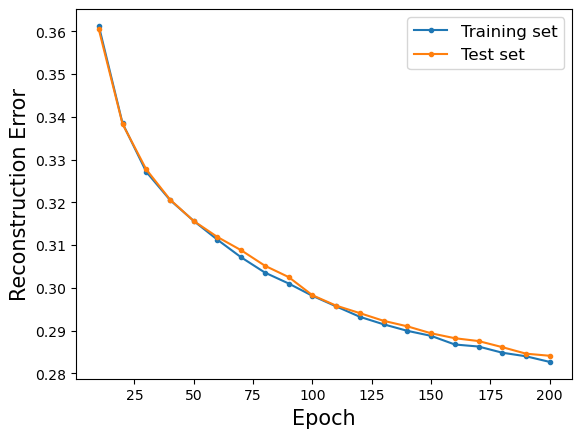

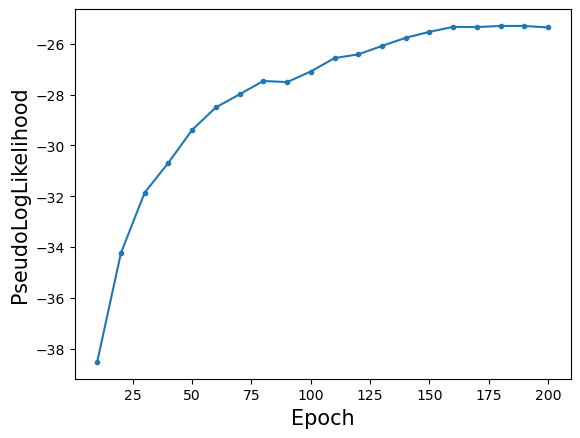

Training RBM 104/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360055 (train), 0.359470 (test), Pseud_Lik: -38.284863, Time: 2.280432, 
Ep 20, Rec er: 0.337981 (train), 0.338502 (test), Pseud_Lik: -34.253417, Time: 2.415278, 
Ep 30, Rec er: 0.327974 (train), 0.328685 (test), Pseud_Lik: -31.746193, Time: 2.356332, 
Ep 40, Rec er: 0.321558 (train), 0.321904 (test), Pseud_Lik: -30.422420, Time: 2.758078, 
Ep 50, Rec er: 0.316741 (train), 0.316723 (test), Pseud_Lik: -29.343698, Time: 2.250198, 
Ep 60, Rec er: 0.311863 (train), 0.312339 (test), Pseud_Lik: -28.759766, Time: 2.352978, 
Ep 70, Rec er: 0.307946 (train), 0.308438 (test), Pseud_Lik: -28.132435, Time: 2.237852, 
Ep 80, Rec er: 0.303856 (train), 0.305154 (test), Pseud_Lik: -27.684812, Time: 2.668147, 
Ep 90, Rec er: 0.300827 (train), 0.302057 (test), Pseud_Lik: -27.159144, Time: 2.125972, 
Ep 100, Rec er: 0.297688 (train), 0.298882 (test), P

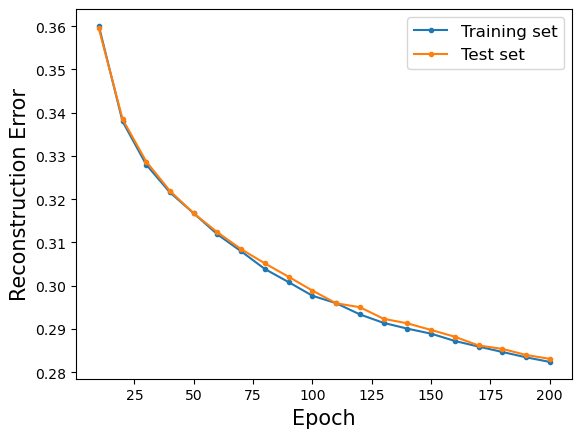

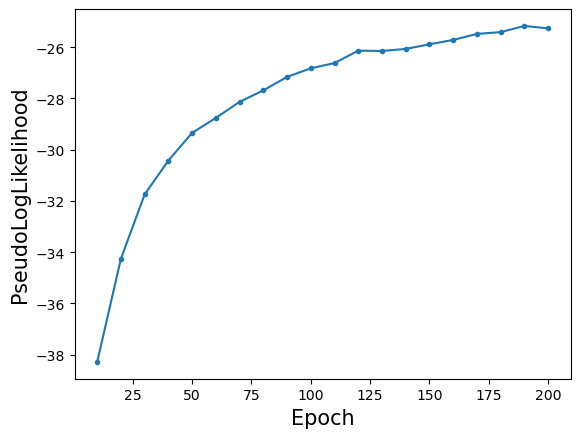

Training RBM 105/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361525 (train), 0.360882 (test), Pseud_Lik: -38.341866, Time: 2.235030, 
Ep 20, Rec er: 0.338189 (train), 0.338941 (test), Pseud_Lik: -34.281342, Time: 2.619155, 
Ep 30, Rec er: 0.327873 (train), 0.328662 (test), Pseud_Lik: -31.914423, Time: 2.681407, 
Ep 40, Rec er: 0.321362 (train), 0.321750 (test), Pseud_Lik: -30.623218, Time: 2.678927, 
Ep 50, Rec er: 0.316362 (train), 0.316297 (test), Pseud_Lik: -29.450091, Time: 2.994365, 
Ep 60, Rec er: 0.311378 (train), 0.311834 (test), Pseud_Lik: -28.896892, Time: 2.554866, 
Ep 70, Rec er: 0.307090 (train), 0.307949 (test), Pseud_Lik: -28.377885, Time: 2.514006, 
Ep 80, Rec er: 0.303370 (train), 0.304249 (test), Pseud_Lik: -27.708770, Time: 2.646110, 
Ep 90, Rec er: 0.300314 (train), 0.301518 (test), Pseud_Lik: -27.201288, Time: 2.532643, 
Ep 100, Rec er: 0.297276 (train), 0.297602 (test), P

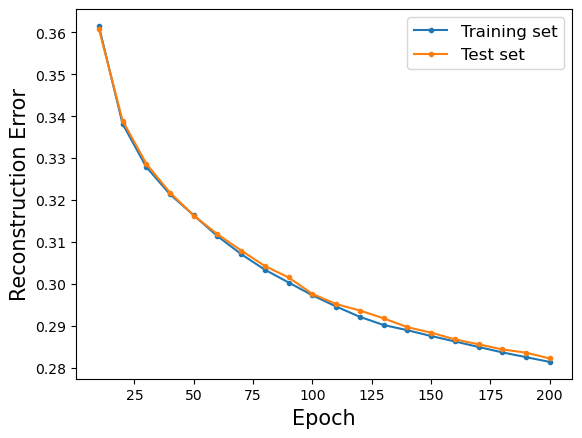

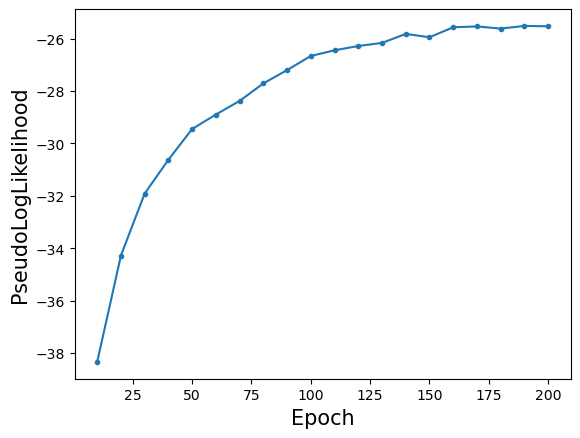

Training RBM 106/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362460 (train), 0.361447 (test), Pseud_Lik: -38.440570, Time: 2.131434, 
Ep 20, Rec er: 0.338846 (train), 0.339397 (test), Pseud_Lik: -34.629883, Time: 2.402745, 
Ep 30, Rec er: 0.327828 (train), 0.328473 (test), Pseud_Lik: -32.614349, Time: 2.523563, 
Ep 40, Rec er: 0.320149 (train), 0.320599 (test), Pseud_Lik: -30.996975, Time: 2.623694, 
Ep 50, Rec er: 0.315146 (train), 0.315187 (test), Pseud_Lik: -29.902694, Time: 2.686003, 
Ep 60, Rec er: 0.309401 (train), 0.310515 (test), Pseud_Lik: -28.943555, Time: 2.462514, 
Ep 70, Rec er: 0.305113 (train), 0.305460 (test), Pseud_Lik: -28.074781, Time: 2.222703, 
Ep 80, Rec er: 0.300547 (train), 0.301738 (test), Pseud_Lik: -27.779334, Time: 2.223050, 
Ep 90, Rec er: 0.297065 (train), 0.297872 (test), Pseud_Lik: -27.257261, Time: 2.884056, 
Ep 100, Rec er: 0.293674 (train), 0.294485 (test), P

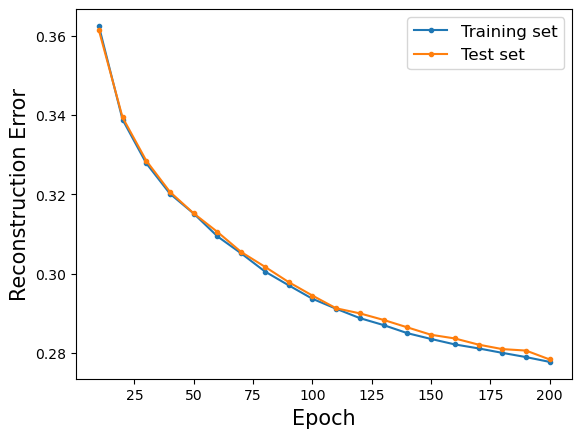

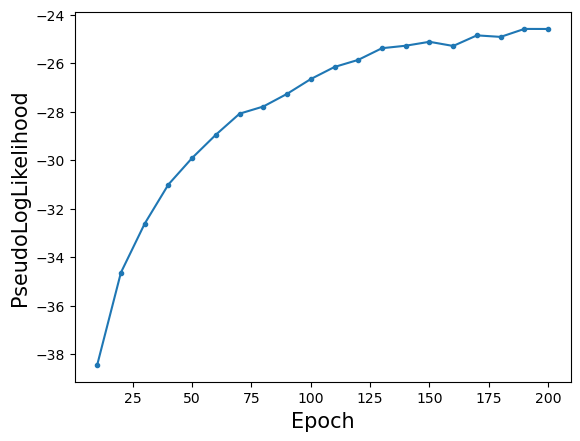

Training RBM 107/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360269 (train), 0.359951 (test), Pseud_Lik: -38.257423, Time: 2.002545, 
Ep 20, Rec er: 0.338118 (train), 0.337828 (test), Pseud_Lik: -34.113833, Time: 2.711352, 
Ep 30, Rec er: 0.327566 (train), 0.328081 (test), Pseud_Lik: -31.903662, Time: 2.070431, 
Ep 40, Rec er: 0.321721 (train), 0.322263 (test), Pseud_Lik: -30.578582, Time: 2.476829, 
Ep 50, Rec er: 0.317266 (train), 0.318133 (test), Pseud_Lik: -29.507538, Time: 2.385632, 
Ep 60, Rec er: 0.312770 (train), 0.312736 (test), Pseud_Lik: -28.874738, Time: 2.439129, 
Ep 70, Rec er: 0.308703 (train), 0.310228 (test), Pseud_Lik: -28.102048, Time: 2.278190, 
Ep 80, Rec er: 0.305004 (train), 0.306488 (test), Pseud_Lik: -27.698218, Time: 2.205468, 
Ep 90, Rec er: 0.302085 (train), 0.303748 (test), Pseud_Lik: -27.468364, Time: 2.278762, 
Ep 100, Rec er: 0.299467 (train), 0.299906 (test), P

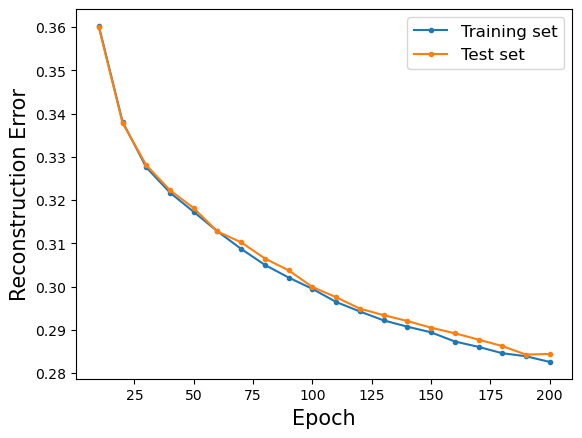

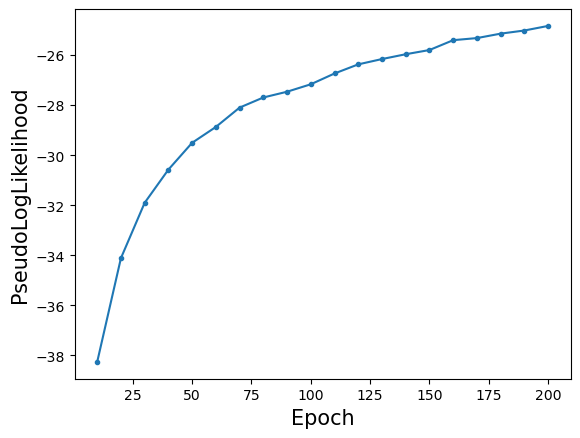

Training RBM 108/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361484 (train), 0.361501 (test), Pseud_Lik: -38.291343, Time: 2.164204, 
Ep 20, Rec er: 0.338116 (train), 0.339082 (test), Pseud_Lik: -34.447119, Time: 2.318409, 
Ep 30, Rec er: 0.326954 (train), 0.326488 (test), Pseud_Lik: -32.132164, Time: 1.936726, 
Ep 40, Rec er: 0.319773 (train), 0.319860 (test), Pseud_Lik: -30.555470, Time: 2.211531, 
Ep 50, Rec er: 0.314021 (train), 0.314175 (test), Pseud_Lik: -29.391989, Time: 2.134232, 
Ep 60, Rec er: 0.309358 (train), 0.310354 (test), Pseud_Lik: -28.442366, Time: 2.103430, 
Ep 70, Rec er: 0.304737 (train), 0.305568 (test), Pseud_Lik: -27.877780, Time: 2.073613, 
Ep 80, Rec er: 0.301443 (train), 0.301463 (test), Pseud_Lik: -27.143607, Time: 2.287052, 
Ep 90, Rec er: 0.298251 (train), 0.299303 (test), Pseud_Lik: -26.776728, Time: 2.200713, 
Ep 100, Rec er: 0.294702 (train), 0.296039 (test), P

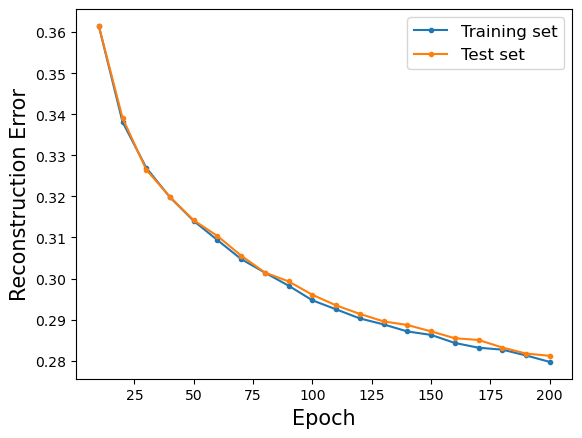

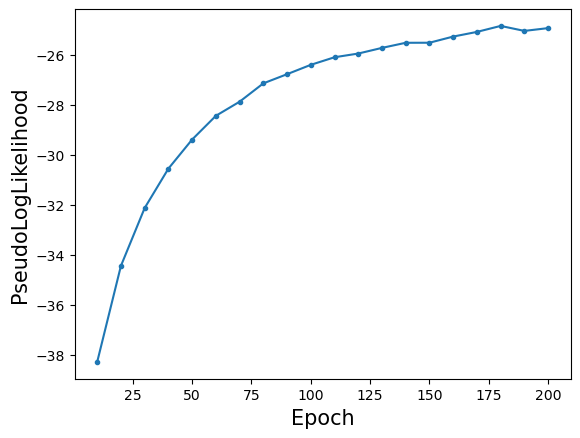

Training RBM 109/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.357904 (train), 0.356603 (test), Pseud_Lik: -38.134908, Time: 1.971329, 
Ep 20, Rec er: 0.337159 (train), 0.337987 (test), Pseud_Lik: -33.966402, Time: 1.876829, 
Ep 30, Rec er: 0.327974 (train), 0.328541 (test), Pseud_Lik: -32.207707, Time: 1.815186, 
Ep 40, Rec er: 0.322476 (train), 0.322656 (test), Pseud_Lik: -30.960414, Time: 1.875659, 
Ep 50, Rec er: 0.317847 (train), 0.319107 (test), Pseud_Lik: -29.790851, Time: 1.897172, 
Ep 60, Rec er: 0.313346 (train), 0.314631 (test), Pseud_Lik: -28.887149, Time: 1.912433, 
Ep 70, Rec er: 0.308904 (train), 0.310595 (test), Pseud_Lik: -28.344255, Time: 2.245981, 
Ep 80, Rec er: 0.305449 (train), 0.306188 (test), Pseud_Lik: -27.914925, Time: 1.827408, 
Ep 90, Rec er: 0.302200 (train), 0.302930 (test), Pseud_Lik: -27.273991, Time: 2.437198, 
Ep 100, Rec er: 0.299211 (train), 0.299600 (test), P

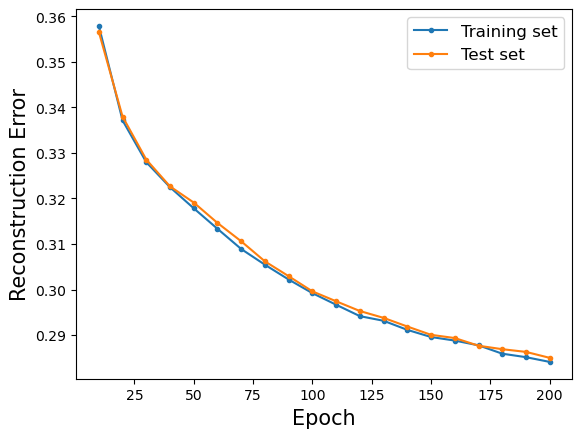

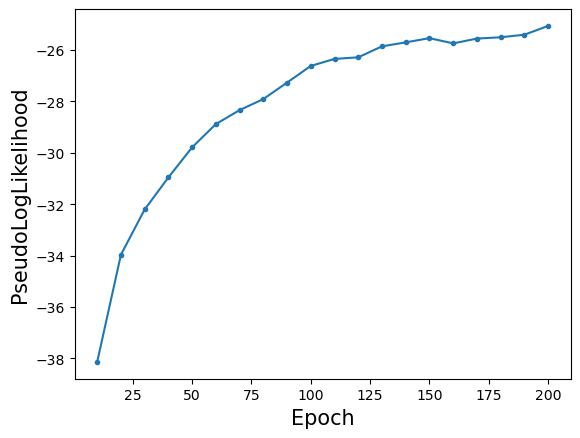

Training RBM 110/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359721 (train), 0.358950 (test), Pseud_Lik: -38.359160, Time: 1.828610, 
Ep 20, Rec er: 0.337992 (train), 0.338085 (test), Pseud_Lik: -34.089876, Time: 2.097066, 
Ep 30, Rec er: 0.327670 (train), 0.328374 (test), Pseud_Lik: -32.143239, Time: 1.848969, 
Ep 40, Rec er: 0.321468 (train), 0.322305 (test), Pseud_Lik: -30.962378, Time: 2.019030, 
Ep 50, Rec er: 0.316386 (train), 0.317464 (test), Pseud_Lik: -30.008188, Time: 1.987755, 
Ep 60, Rec er: 0.311347 (train), 0.312658 (test), Pseud_Lik: -29.193540, Time: 2.729593, 
Ep 70, Rec er: 0.307284 (train), 0.307887 (test), Pseud_Lik: -28.179857, Time: 1.926198, 
Ep 80, Rec er: 0.303418 (train), 0.304510 (test), Pseud_Lik: -27.945254, Time: 1.897496, 
Ep 90, Rec er: 0.300321 (train), 0.301126 (test), Pseud_Lik: -27.160634, Time: 2.177063, 
Ep 100, Rec er: 0.296800 (train), 0.298063 (test), P

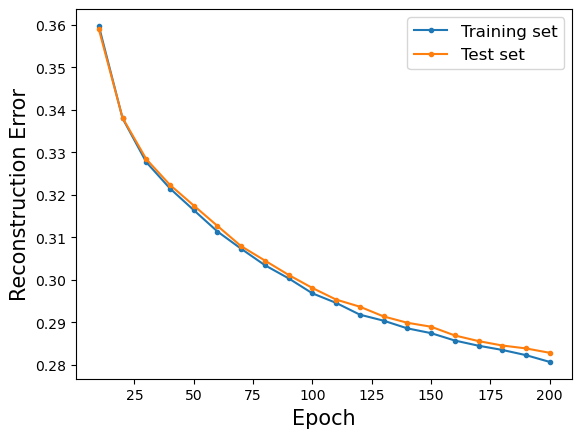

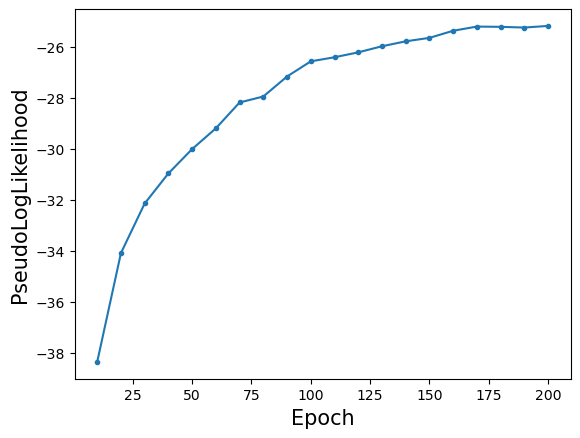

Training RBM 111/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361435 (train), 0.361369 (test), Pseud_Lik: -38.422564, Time: 1.926945, 
Ep 20, Rec er: 0.337775 (train), 0.338352 (test), Pseud_Lik: -34.337380, Time: 1.917842, 
Ep 30, Rec er: 0.326916 (train), 0.327034 (test), Pseud_Lik: -32.274586, Time: 2.017642, 
Ep 40, Rec er: 0.320263 (train), 0.320364 (test), Pseud_Lik: -30.752470, Time: 1.945966, 
Ep 50, Rec er: 0.314686 (train), 0.315288 (test), Pseud_Lik: -29.606807, Time: 2.184891, 
Ep 60, Rec er: 0.309621 (train), 0.310288 (test), Pseud_Lik: -28.394823, Time: 2.323470, 
Ep 70, Rec er: 0.305199 (train), 0.305921 (test), Pseud_Lik: -27.857474, Time: 2.322256, 
Ep 80, Rec er: 0.301158 (train), 0.302142 (test), Pseud_Lik: -27.370080, Time: 1.880112, 
Ep 90, Rec er: 0.297880 (train), 0.298148 (test), Pseud_Lik: -26.641883, Time: 1.854578, 
Ep 100, Rec er: 0.294616 (train), 0.295000 (test), P

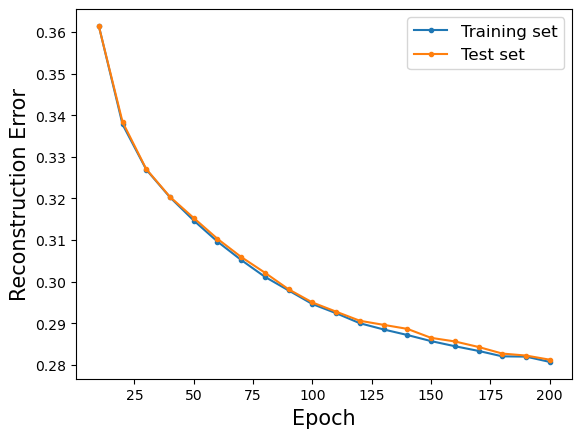

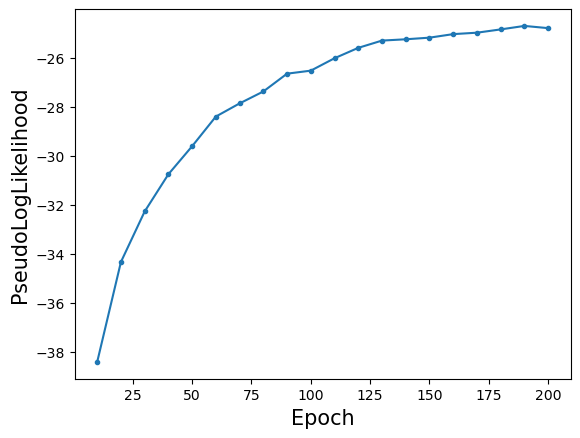

Training RBM 112/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362401 (train), 0.362198 (test), Pseud_Lik: -38.402995, Time: 1.879322, 
Ep 20, Rec er: 0.338382 (train), 0.337818 (test), Pseud_Lik: -34.692122, Time: 2.030969, 
Ep 30, Rec er: 0.326851 (train), 0.327176 (test), Pseud_Lik: -32.393117, Time: 2.080747, 
Ep 40, Rec er: 0.318929 (train), 0.320043 (test), Pseud_Lik: -30.691893, Time: 2.611102, 
Ep 50, Rec er: 0.313652 (train), 0.314648 (test), Pseud_Lik: -29.280022, Time: 2.019283, 
Ep 60, Rec er: 0.308422 (train), 0.309400 (test), Pseud_Lik: -28.383338, Time: 1.937082, 
Ep 70, Rec er: 0.303386 (train), 0.304684 (test), Pseud_Lik: -27.598670, Time: 2.347837, 
Ep 80, Rec er: 0.299122 (train), 0.299837 (test), Pseud_Lik: -27.142625, Time: 2.152597, 
Ep 90, Rec er: 0.296350 (train), 0.297238 (test), Pseud_Lik: -26.582024, Time: 2.246803, 
Ep 100, Rec er: 0.293286 (train), 0.294301 (test), P

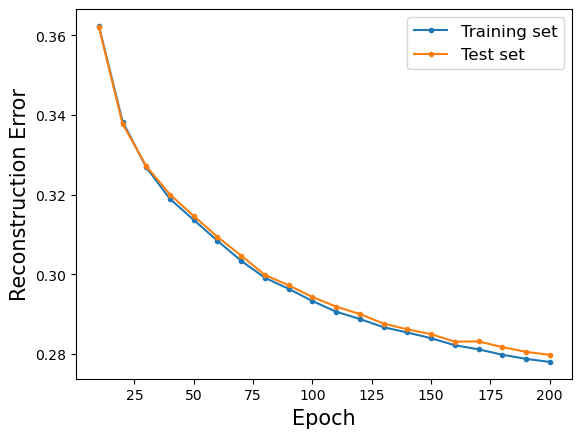

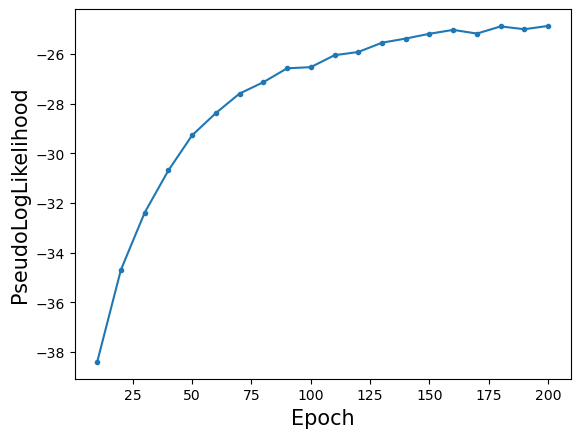

Training RBM 113/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361585 (train), 0.362284 (test), Pseud_Lik: -38.320563, Time: 1.760152, 
Ep 20, Rec er: 0.338795 (train), 0.337998 (test), Pseud_Lik: -34.362914, Time: 1.833331, 
Ep 30, Rec er: 0.326554 (train), 0.326955 (test), Pseud_Lik: -32.489038, Time: 1.923086, 
Ep 40, Rec er: 0.319077 (train), 0.318896 (test), Pseud_Lik: -30.782333, Time: 1.815392, 
Ep 50, Rec er: 0.313278 (train), 0.313287 (test), Pseud_Lik: -29.703939, Time: 2.199187, 
Ep 60, Rec er: 0.307523 (train), 0.308679 (test), Pseud_Lik: -28.322948, Time: 1.929132, 
Ep 70, Rec er: 0.303028 (train), 0.303718 (test), Pseud_Lik: -27.704323, Time: 1.927626, 
Ep 80, Rec er: 0.299421 (train), 0.299903 (test), Pseud_Lik: -26.909569, Time: 2.054240, 
Ep 90, Rec er: 0.295820 (train), 0.296915 (test), Pseud_Lik: -26.500754, Time: 1.888302, 
Ep 100, Rec er: 0.292499 (train), 0.294014 (test), P

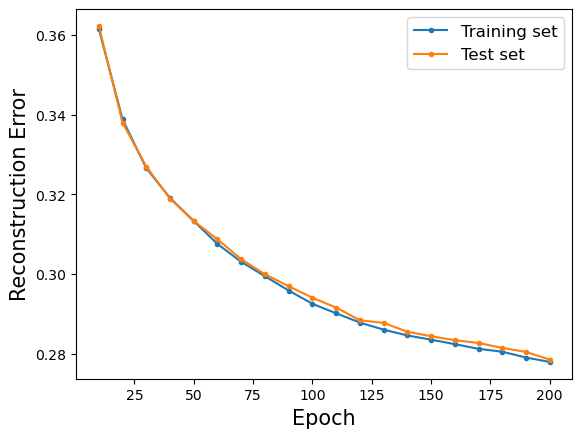

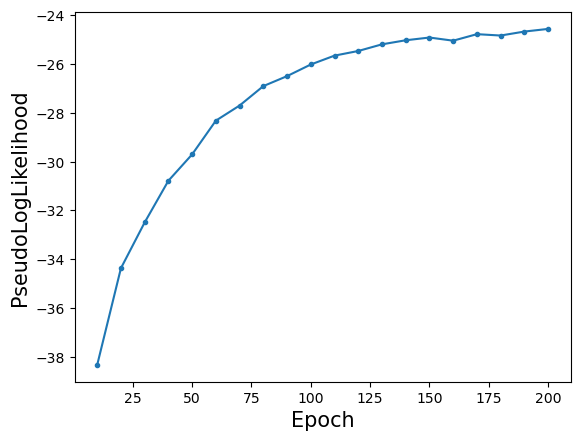

Training RBM 114/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362698 (train), 0.361654 (test), Pseud_Lik: -38.409177, Time: 1.774342, 
Ep 20, Rec er: 0.338934 (train), 0.339065 (test), Pseud_Lik: -34.454607, Time: 1.730325, 
Ep 30, Rec er: 0.327561 (train), 0.327959 (test), Pseud_Lik: -32.335899, Time: 2.093211, 
Ep 40, Rec er: 0.320372 (train), 0.320662 (test), Pseud_Lik: -31.115001, Time: 1.915257, 
Ep 50, Rec er: 0.315114 (train), 0.316281 (test), Pseud_Lik: -29.958201, Time: 1.973524, 
Ep 60, Rec er: 0.310179 (train), 0.310789 (test), Pseud_Lik: -28.696604, Time: 1.835789, 
Ep 70, Rec er: 0.305932 (train), 0.306476 (test), Pseud_Lik: -28.018140, Time: 1.908081, 
Ep 80, Rec er: 0.301737 (train), 0.302408 (test), Pseud_Lik: -27.481782, Time: 1.911700, 
Ep 90, Rec er: 0.298227 (train), 0.299068 (test), Pseud_Lik: -27.031193, Time: 1.888405, 
Ep 100, Rec er: 0.295143 (train), 0.296448 (test), P

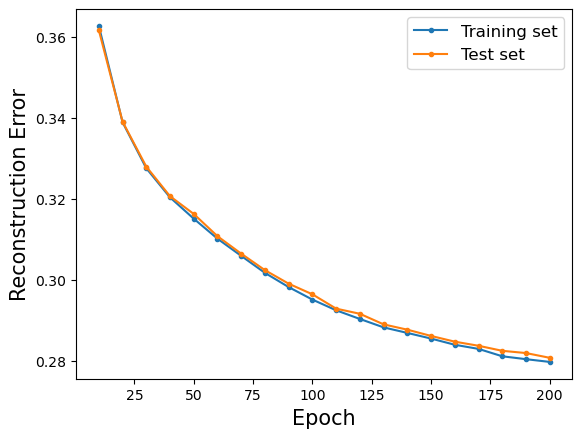

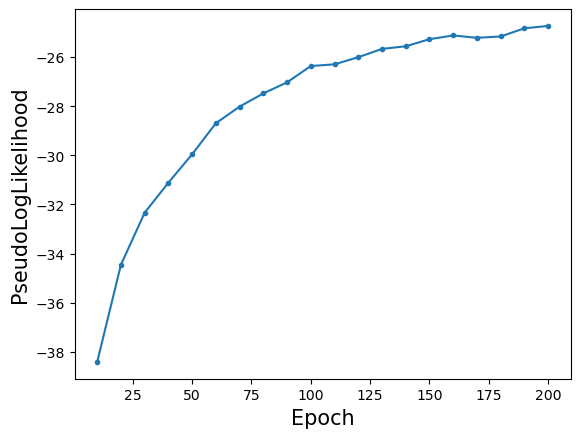

Training RBM 115/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360551 (train), 0.359570 (test), Pseud_Lik: -38.208175, Time: 2.385167, 
Ep 20, Rec er: 0.338468 (train), 0.339061 (test), Pseud_Lik: -34.288504, Time: 1.733493, 
Ep 30, Rec er: 0.327927 (train), 0.328969 (test), Pseud_Lik: -32.574849, Time: 1.852027, 
Ep 40, Rec er: 0.320836 (train), 0.322111 (test), Pseud_Lik: -31.306866, Time: 2.037705, 
Ep 50, Rec er: 0.315400 (train), 0.315668 (test), Pseud_Lik: -29.831834, Time: 2.074699, 
Ep 60, Rec er: 0.310299 (train), 0.311173 (test), Pseud_Lik: -28.854545, Time: 1.910287, 
Ep 70, Rec er: 0.305316 (train), 0.306279 (test), Pseud_Lik: -28.195629, Time: 2.364779, 
Ep 80, Rec er: 0.301440 (train), 0.302631 (test), Pseud_Lik: -27.429112, Time: 2.196511, 
Ep 90, Rec er: 0.297484 (train), 0.297303 (test), Pseud_Lik: -27.017430, Time: 2.239830, 
Ep 100, Rec er: 0.294688 (train), 0.295209 (test), P

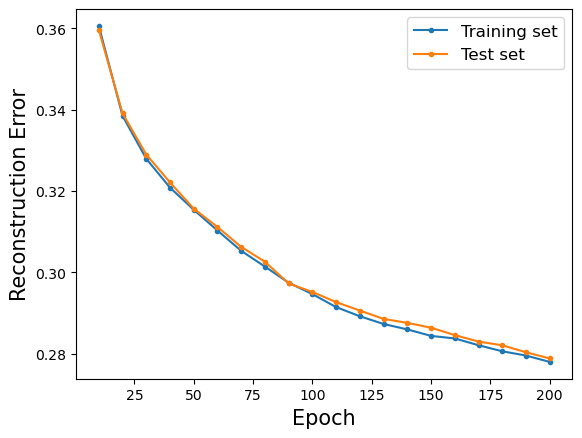

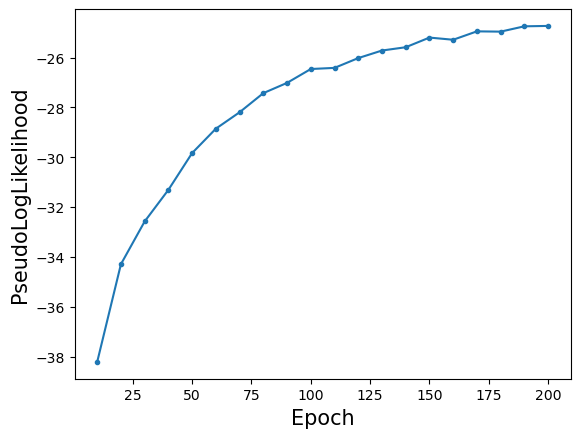

Training RBM 116/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358452 (train), 0.358238 (test), Pseud_Lik: -38.198297, Time: 1.824980, 
Ep 20, Rec er: 0.337708 (train), 0.337949 (test), Pseud_Lik: -33.955189, Time: 2.353760, 
Ep 30, Rec er: 0.327443 (train), 0.328255 (test), Pseud_Lik: -31.917371, Time: 1.773569, 
Ep 40, Rec er: 0.321526 (train), 0.322545 (test), Pseud_Lik: -30.463679, Time: 1.788750, 
Ep 50, Rec er: 0.316292 (train), 0.317292 (test), Pseud_Lik: -29.739834, Time: 1.685854, 
Ep 60, Rec er: 0.311817 (train), 0.312851 (test), Pseud_Lik: -28.974433, Time: 1.947506, 
Ep 70, Rec er: 0.307404 (train), 0.308780 (test), Pseud_Lik: -28.259217, Time: 2.033191, 
Ep 80, Rec er: 0.303843 (train), 0.304684 (test), Pseud_Lik: -27.745267, Time: 1.761517, 
Ep 90, Rec er: 0.300855 (train), 0.301766 (test), Pseud_Lik: -27.302939, Time: 1.806732, 
Ep 100, Rec er: 0.297993 (train), 0.298550 (test), P

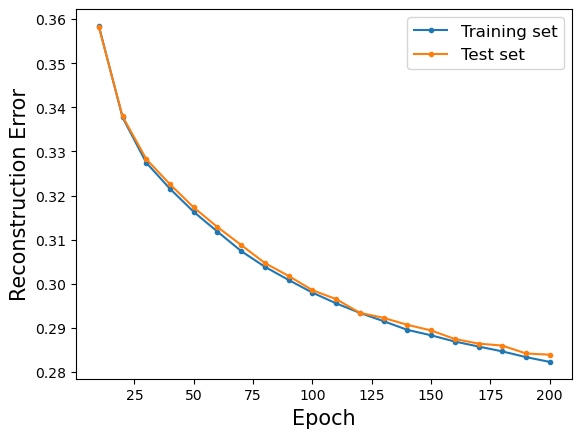

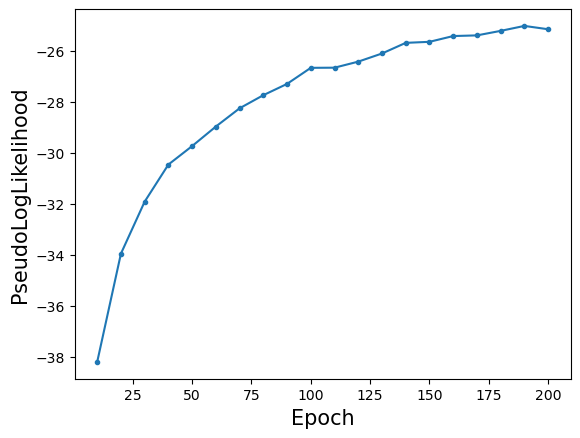

Training RBM 117/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361288 (train), 0.360250 (test), Pseud_Lik: -38.312464, Time: 1.678850, 
Ep 20, Rec er: 0.338451 (train), 0.338292 (test), Pseud_Lik: -34.440368, Time: 2.276805, 
Ep 30, Rec er: 0.327416 (train), 0.327689 (test), Pseud_Lik: -32.454445, Time: 1.671527, 
Ep 40, Rec er: 0.319296 (train), 0.319451 (test), Pseud_Lik: -30.746705, Time: 1.909374, 
Ep 50, Rec er: 0.313164 (train), 0.314504 (test), Pseud_Lik: -29.769435, Time: 1.780707, 
Ep 60, Rec er: 0.307778 (train), 0.308600 (test), Pseud_Lik: -28.741272, Time: 1.723790, 
Ep 70, Rec er: 0.302637 (train), 0.304690 (test), Pseud_Lik: -28.162034, Time: 1.763890, 
Ep 80, Rec er: 0.298611 (train), 0.298979 (test), Pseud_Lik: -27.262172, Time: 1.690896, 
Ep 90, Rec er: 0.294871 (train), 0.296464 (test), Pseud_Lik: -26.862795, Time: 2.087709, 
Ep 100, Rec er: 0.292286 (train), 0.292707 (test), P

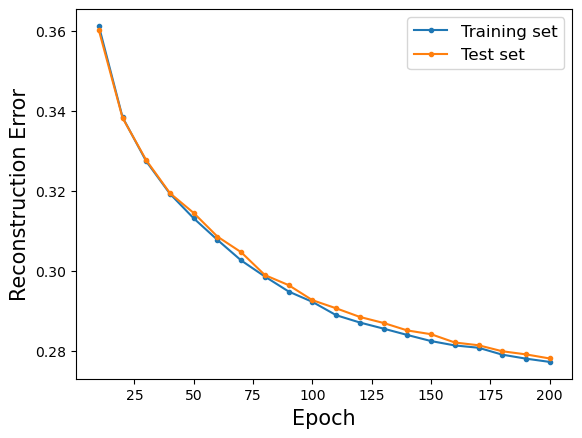

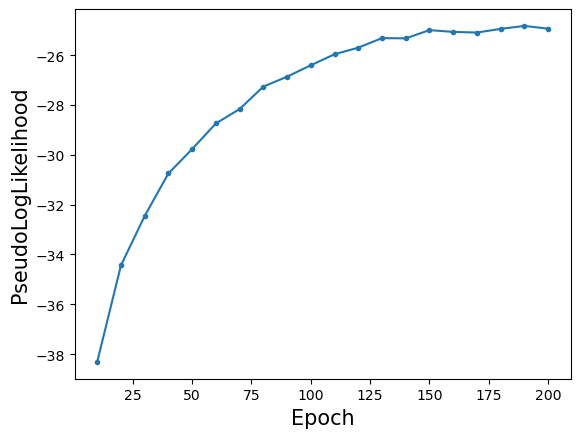

Training RBM 118/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359464 (train), 0.358974 (test), Pseud_Lik: -38.082762, Time: 1.686015, 
Ep 20, Rec er: 0.337028 (train), 0.337525 (test), Pseud_Lik: -33.982280, Time: 1.678444, 
Ep 30, Rec er: 0.327602 (train), 0.328676 (test), Pseud_Lik: -32.534884, Time: 1.735154, 
Ep 40, Rec er: 0.321877 (train), 0.322263 (test), Pseud_Lik: -30.969318, Time: 1.667998, 
Ep 50, Rec er: 0.316685 (train), 0.317373 (test), Pseud_Lik: -30.010461, Time: 1.678930, 
Ep 60, Rec er: 0.310925 (train), 0.311910 (test), Pseud_Lik: -28.890635, Time: 1.793235, 
Ep 70, Rec er: 0.306298 (train), 0.307736 (test), Pseud_Lik: -27.910754, Time: 1.686205, 
Ep 80, Rec er: 0.302680 (train), 0.303731 (test), Pseud_Lik: -27.556608, Time: 1.806656, 
Ep 90, Rec er: 0.298806 (train), 0.300116 (test), Pseud_Lik: -27.003904, Time: 1.706511, 
Ep 100, Rec er: 0.296531 (train), 0.296840 (test), P

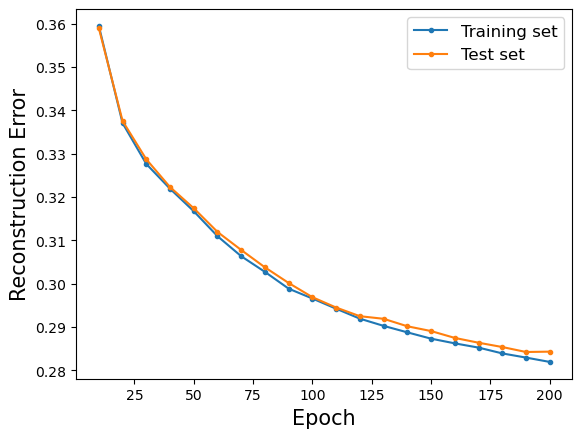

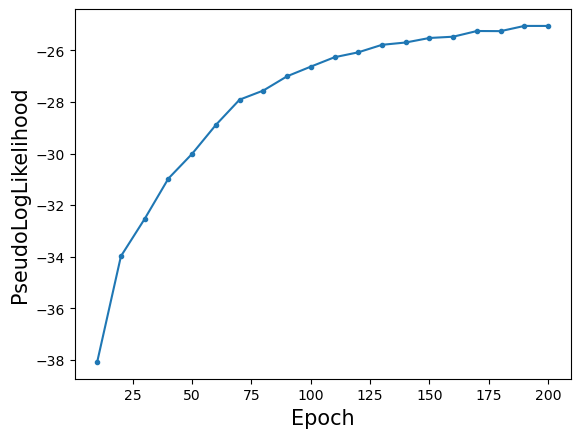

Training RBM 119/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361914 (train), 0.360845 (test), Pseud_Lik: -38.167217, Time: 1.841639, 
Ep 20, Rec er: 0.339909 (train), 0.339677 (test), Pseud_Lik: -34.504285, Time: 1.610322, 
Ep 30, Rec er: 0.328418 (train), 0.328319 (test), Pseud_Lik: -32.778912, Time: 1.645596, 
Ep 40, Rec er: 0.320569 (train), 0.321113 (test), Pseud_Lik: -31.153451, Time: 1.956278, 
Ep 50, Rec er: 0.314117 (train), 0.314224 (test), Pseud_Lik: -29.613946, Time: 1.647242, 
Ep 60, Rec er: 0.308908 (train), 0.309419 (test), Pseud_Lik: -28.658779, Time: 1.654154, 
Ep 70, Rec er: 0.304023 (train), 0.304994 (test), Pseud_Lik: -28.029253, Time: 1.662506, 
Ep 80, Rec er: 0.299647 (train), 0.300375 (test), Pseud_Lik: -27.498454, Time: 2.675627, 
Ep 90, Rec er: 0.296358 (train), 0.297048 (test), Pseud_Lik: -27.042898, Time: 1.719665, 
Ep 100, Rec er: 0.293536 (train), 0.294212 (test), P

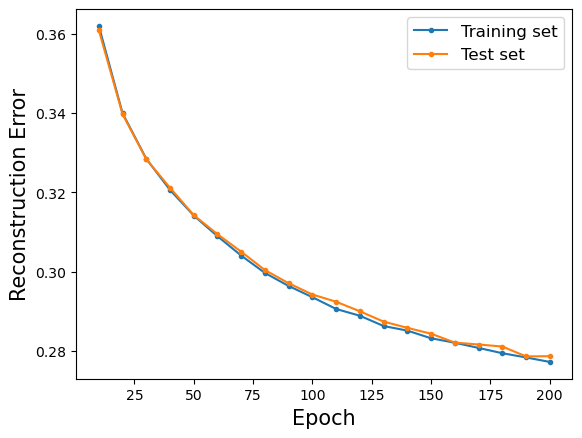

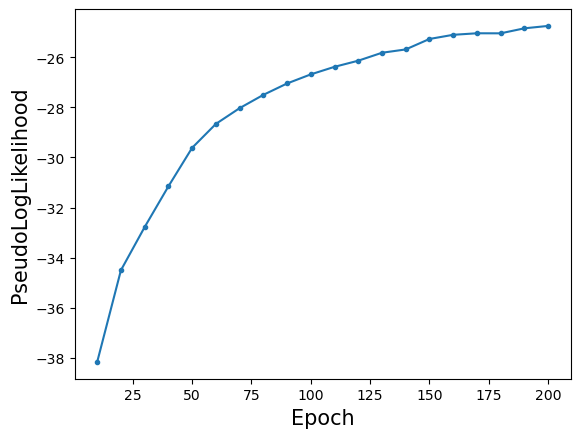

Training RBM 120/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359520 (train), 0.359737 (test), Pseud_Lik: -38.358944, Time: 1.565507, 
Ep 20, Rec er: 0.338175 (train), 0.338758 (test), Pseud_Lik: -34.025887, Time: 1.898591, 
Ep 30, Rec er: 0.327363 (train), 0.327778 (test), Pseud_Lik: -32.031779, Time: 1.622196, 
Ep 40, Rec er: 0.321220 (train), 0.321912 (test), Pseud_Lik: -30.722289, Time: 1.636858, 
Ep 50, Rec er: 0.315591 (train), 0.316132 (test), Pseud_Lik: -29.427346, Time: 1.721220, 
Ep 60, Rec er: 0.311224 (train), 0.311980 (test), Pseud_Lik: -28.730327, Time: 1.668850, 
Ep 70, Rec er: 0.307295 (train), 0.307511 (test), Pseud_Lik: -28.259562, Time: 1.695014, 
Ep 80, Rec er: 0.303943 (train), 0.304718 (test), Pseud_Lik: -27.588506, Time: 1.655301, 
Ep 90, Rec er: 0.300169 (train), 0.301534 (test), Pseud_Lik: -27.105387, Time: 1.704486, 
Ep 100, Rec er: 0.297557 (train), 0.298098 (test), P

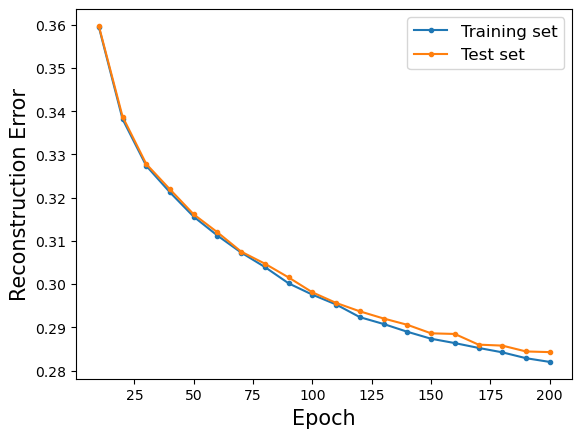

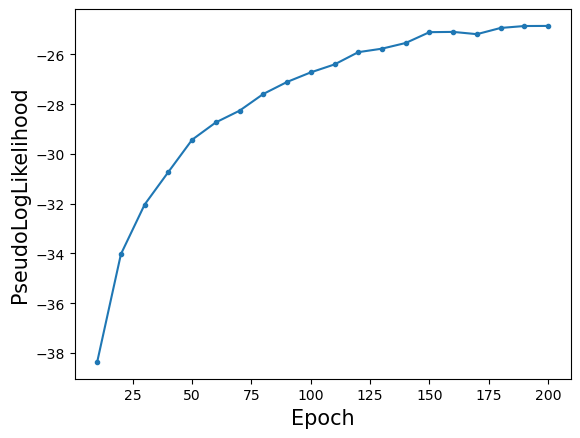

Training RBM 121/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362832 (train), 0.362425 (test), Pseud_Lik: -38.464654, Time: 1.706571, 
Ep 20, Rec er: 0.338729 (train), 0.339071 (test), Pseud_Lik: -34.350762, Time: 1.585779, 
Ep 30, Rec er: 0.327216 (train), 0.326713 (test), Pseud_Lik: -32.152969, Time: 1.775034, 
Ep 40, Rec er: 0.319531 (train), 0.320643 (test), Pseud_Lik: -30.639286, Time: 1.724935, 
Ep 50, Rec er: 0.314427 (train), 0.315722 (test), Pseud_Lik: -29.478314, Time: 2.014443, 
Ep 60, Rec er: 0.309359 (train), 0.309473 (test), Pseud_Lik: -28.674181, Time: 2.113506, 
Ep 70, Rec er: 0.304712 (train), 0.304969 (test), Pseud_Lik: -27.757775, Time: 1.952044, 
Ep 80, Rec er: 0.300520 (train), 0.300873 (test), Pseud_Lik: -27.480902, Time: 1.704126, 
Ep 90, Rec er: 0.297179 (train), 0.297847 (test), Pseud_Lik: -27.024467, Time: 1.776882, 
Ep 100, Rec er: 0.294020 (train), 0.294941 (test), P

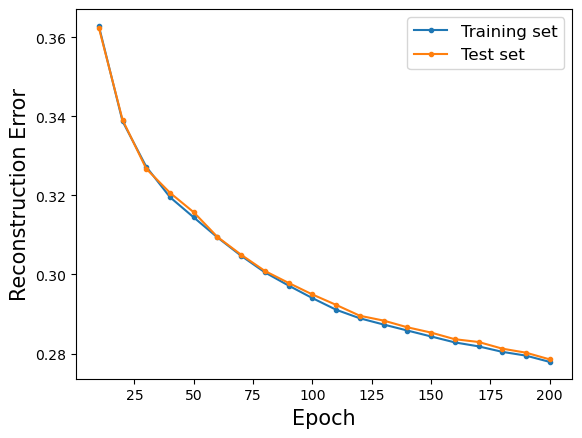

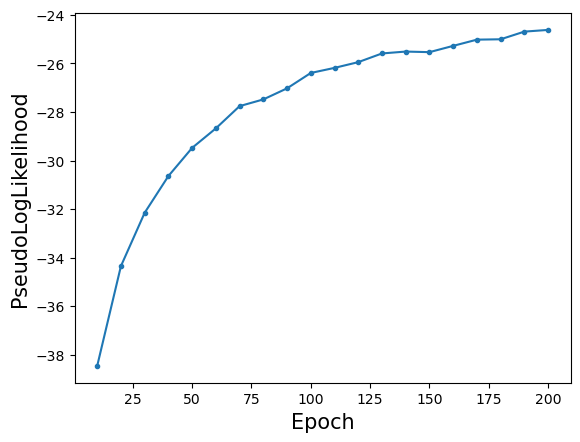

Training RBM 122/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360374 (train), 0.359368 (test), Pseud_Lik: -38.206765, Time: 2.166212, 
Ep 20, Rec er: 0.338613 (train), 0.339059 (test), Pseud_Lik: -34.095905, Time: 1.828869, 
Ep 30, Rec er: 0.329011 (train), 0.329372 (test), Pseud_Lik: -32.495098, Time: 1.901338, 
Ep 40, Rec er: 0.322073 (train), 0.322606 (test), Pseud_Lik: -31.174111, Time: 2.253014, 
Ep 50, Rec er: 0.316481 (train), 0.318275 (test), Pseud_Lik: -29.867343, Time: 1.753518, 
Ep 60, Rec er: 0.312499 (train), 0.312001 (test), Pseud_Lik: -28.821226, Time: 1.733239, 
Ep 70, Rec er: 0.307762 (train), 0.308283 (test), Pseud_Lik: -28.173515, Time: 2.102307, 
Ep 80, Rec er: 0.303770 (train), 0.304511 (test), Pseud_Lik: -27.849722, Time: 2.084654, 
Ep 90, Rec er: 0.300356 (train), 0.301200 (test), Pseud_Lik: -27.475149, Time: 2.060836, 
Ep 100, Rec er: 0.297127 (train), 0.299362 (test), P

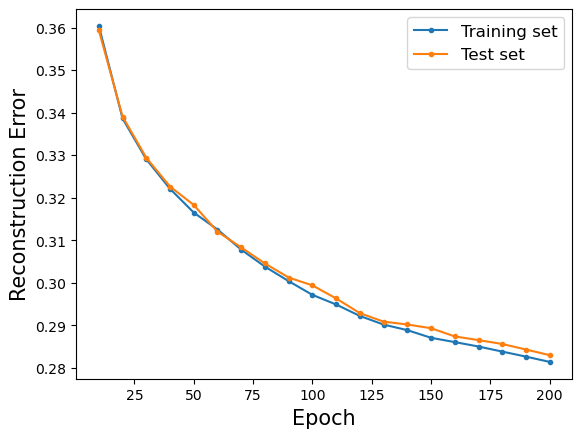

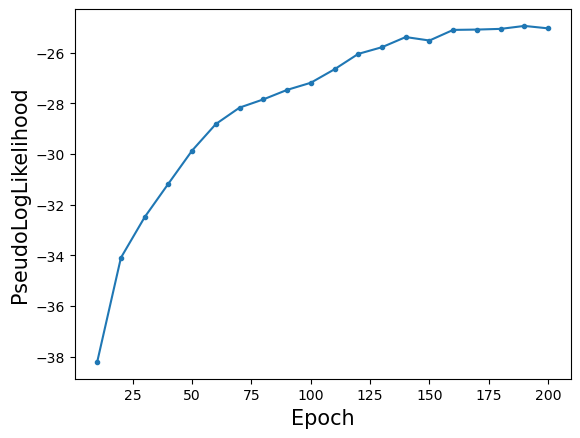

Training RBM 123/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.357753 (train), 0.357347 (test), Pseud_Lik: -38.024200, Time: 2.338995, 
Ep 20, Rec er: 0.337888 (train), 0.338452 (test), Pseud_Lik: -34.077540, Time: 2.163890, 
Ep 30, Rec er: 0.328633 (train), 0.328280 (test), Pseud_Lik: -32.143386, Time: 2.796123, 
Ep 40, Rec er: 0.322116 (train), 0.322711 (test), Pseud_Lik: -31.064667, Time: 1.890070, 
Ep 50, Rec er: 0.316901 (train), 0.317513 (test), Pseud_Lik: -30.025785, Time: 2.714157, 
Ep 60, Rec er: 0.311737 (train), 0.313018 (test), Pseud_Lik: -29.111678, Time: 2.868286, 
Ep 70, Rec er: 0.307082 (train), 0.306978 (test), Pseud_Lik: -28.401872, Time: 1.840664, 
Ep 80, Rec er: 0.302953 (train), 0.304719 (test), Pseud_Lik: -27.702315, Time: 2.116781, 
Ep 90, Rec er: 0.299171 (train), 0.300463 (test), Pseud_Lik: -27.256948, Time: 3.032471, 
Ep 100, Rec er: 0.296107 (train), 0.296549 (test), P

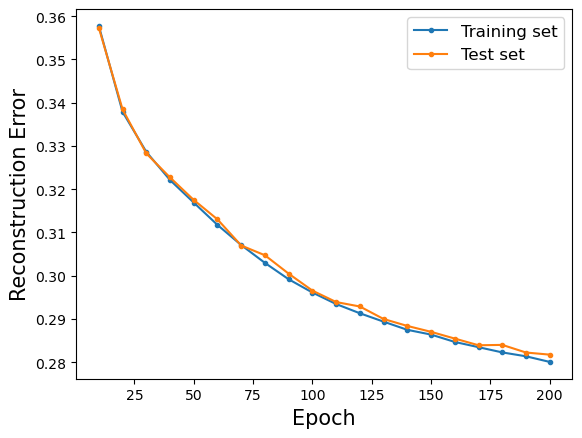

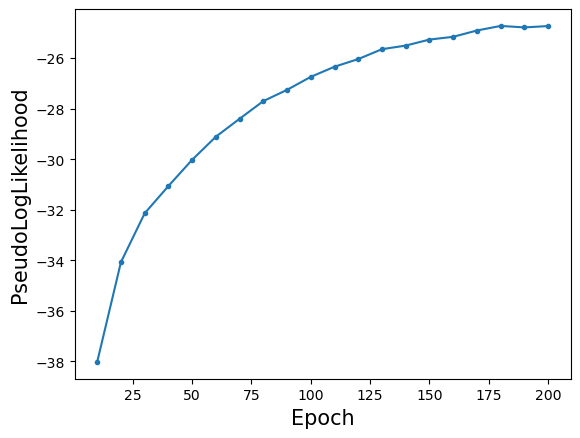

Training RBM 124/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.363042 (train), 0.362685 (test), Pseud_Lik: -38.301211, Time: 1.644149, 
Ep 20, Rec er: 0.340116 (train), 0.340726 (test), Pseud_Lik: -34.772764, Time: 2.453616, 
Ep 30, Rec er: 0.327391 (train), 0.327498 (test), Pseud_Lik: -32.779578, Time: 1.649894, 
Ep 40, Rec er: 0.318901 (train), 0.320596 (test), Pseud_Lik: -30.639067, Time: 1.632313, 
Ep 50, Rec er: 0.312906 (train), 0.313423 (test), Pseud_Lik: -29.329581, Time: 1.667527, 
Ep 60, Rec er: 0.307051 (train), 0.307468 (test), Pseud_Lik: -28.578110, Time: 1.739015, 
Ep 70, Rec er: 0.302774 (train), 0.303246 (test), Pseud_Lik: -27.968508, Time: 1.852466, 
Ep 80, Rec er: 0.298143 (train), 0.299017 (test), Pseud_Lik: -27.267620, Time: 2.444569, 
Ep 90, Rec er: 0.295202 (train), 0.295054 (test), Pseud_Lik: -26.825435, Time: 1.703642, 
Ep 100, Rec er: 0.291978 (train), 0.292892 (test), P

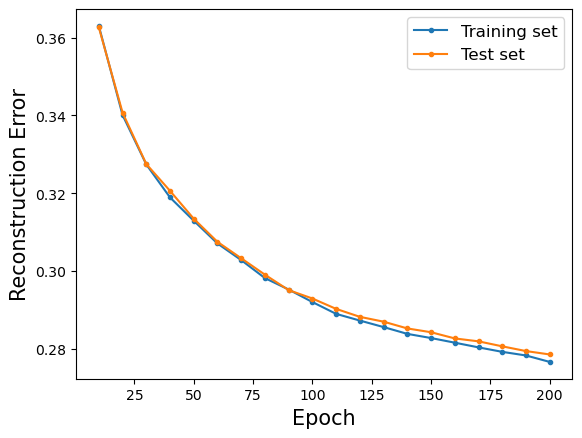

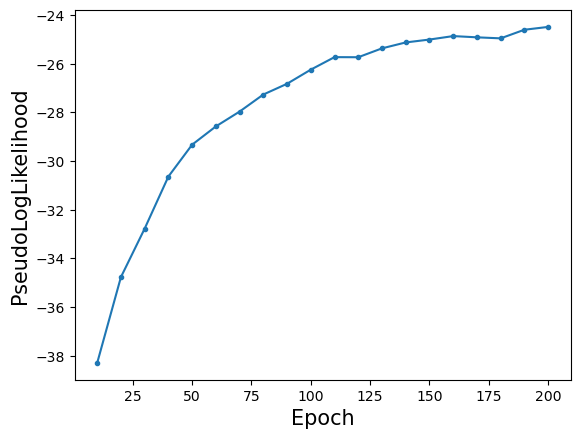

Training RBM 125/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360580 (train), 0.359925 (test), Pseud_Lik: -38.295004, Time: 2.395565, 
Ep 20, Rec er: 0.338340 (train), 0.338746 (test), Pseud_Lik: -34.434762, Time: 2.015061, 
Ep 30, Rec er: 0.327011 (train), 0.327530 (test), Pseud_Lik: -32.351798, Time: 2.111771, 
Ep 40, Rec er: 0.320060 (train), 0.321246 (test), Pseud_Lik: -30.556749, Time: 1.976230, 
Ep 50, Rec er: 0.314766 (train), 0.315226 (test), Pseud_Lik: -29.287714, Time: 1.785575, 
Ep 60, Rec er: 0.309579 (train), 0.309407 (test), Pseud_Lik: -28.558580, Time: 1.906498, 
Ep 70, Rec er: 0.305597 (train), 0.305836 (test), Pseud_Lik: -27.845913, Time: 2.241449, 
Ep 80, Rec er: 0.300973 (train), 0.301745 (test), Pseud_Lik: -27.405635, Time: 2.022091, 
Ep 90, Rec er: 0.297945 (train), 0.297987 (test), Pseud_Lik: -26.798161, Time: 2.046159, 
Ep 100, Rec er: 0.295098 (train), 0.296041 (test), P

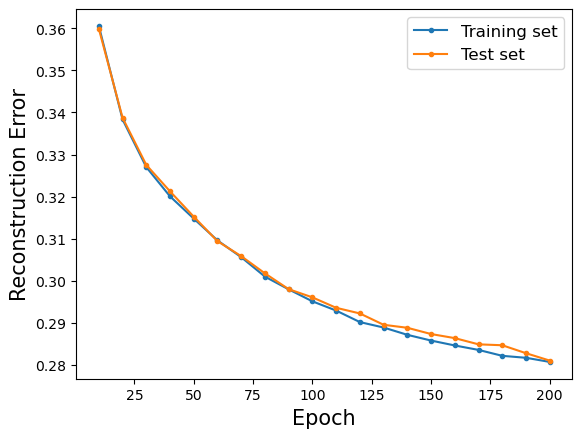

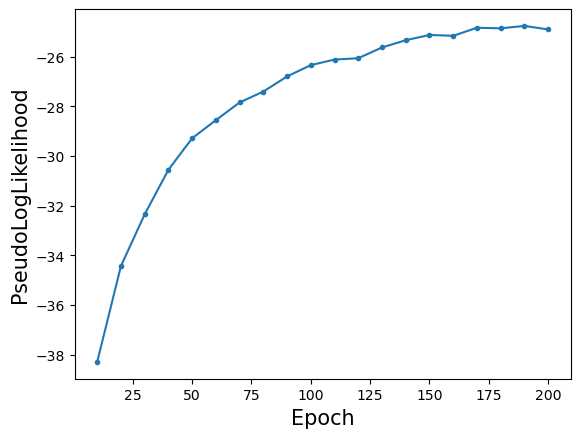

Training RBM 126/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361172 (train), 0.360818 (test), Pseud_Lik: -38.288657, Time: 2.179086, 
Ep 20, Rec er: 0.338258 (train), 0.338773 (test), Pseud_Lik: -34.176273, Time: 1.856120, 
Ep 30, Rec er: 0.328365 (train), 0.328012 (test), Pseud_Lik: -32.069154, Time: 2.378726, 
Ep 40, Rec er: 0.322118 (train), 0.321722 (test), Pseud_Lik: -30.946506, Time: 1.817432, 
Ep 50, Rec er: 0.317256 (train), 0.318304 (test), Pseud_Lik: -30.182138, Time: 2.199971, 
Ep 60, Rec er: 0.312069 (train), 0.312350 (test), Pseud_Lik: -29.478318, Time: 2.933016, 
Ep 70, Rec er: 0.307510 (train), 0.307020 (test), Pseud_Lik: -28.674410, Time: 2.148930, 
Ep 80, Rec er: 0.303303 (train), 0.304683 (test), Pseud_Lik: -27.961374, Time: 2.368945, 
Ep 90, Rec er: 0.299147 (train), 0.300677 (test), Pseud_Lik: -27.509663, Time: 2.170184, 
Ep 100, Rec er: 0.295630 (train), 0.295991 (test), P

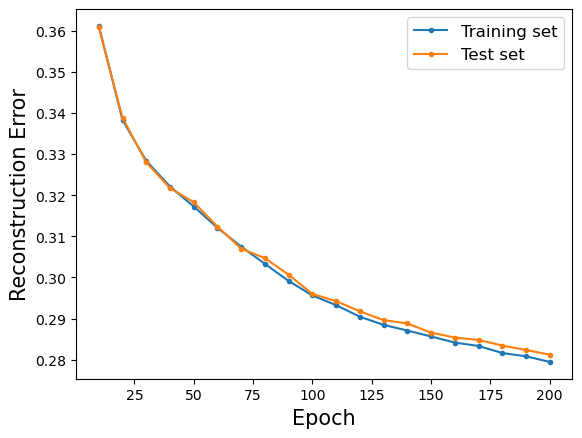

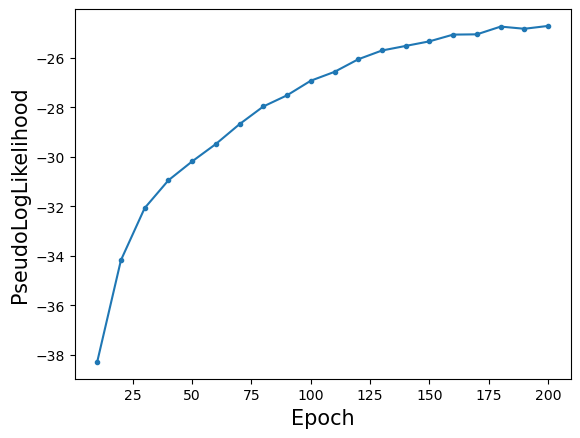

Training RBM 127/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361616 (train), 0.361396 (test), Pseud_Lik: -38.331951, Time: 2.406485, 
Ep 20, Rec er: 0.338863 (train), 0.339822 (test), Pseud_Lik: -34.466537, Time: 1.853111, 
Ep 30, Rec er: 0.327759 (train), 0.328454 (test), Pseud_Lik: -31.942721, Time: 1.708545, 
Ep 40, Rec er: 0.321160 (train), 0.321699 (test), Pseud_Lik: -30.645804, Time: 1.644880, 
Ep 50, Rec er: 0.316334 (train), 0.316680 (test), Pseud_Lik: -29.760228, Time: 2.321220, 
Ep 60, Rec er: 0.310978 (train), 0.312420 (test), Pseud_Lik: -28.863417, Time: 1.705314, 
Ep 70, Rec er: 0.306487 (train), 0.306919 (test), Pseud_Lik: -28.150710, Time: 1.724065, 
Ep 80, Rec er: 0.302686 (train), 0.303783 (test), Pseud_Lik: -27.563095, Time: 1.714714, 
Ep 90, Rec er: 0.299063 (train), 0.299940 (test), Pseud_Lik: -26.964053, Time: 1.807854, 
Ep 100, Rec er: 0.296265 (train), 0.296710 (test), P

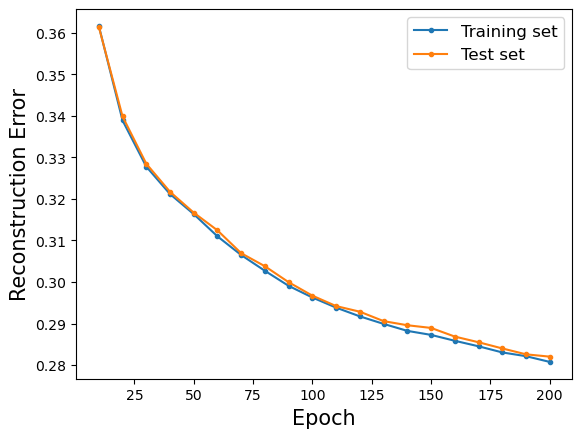

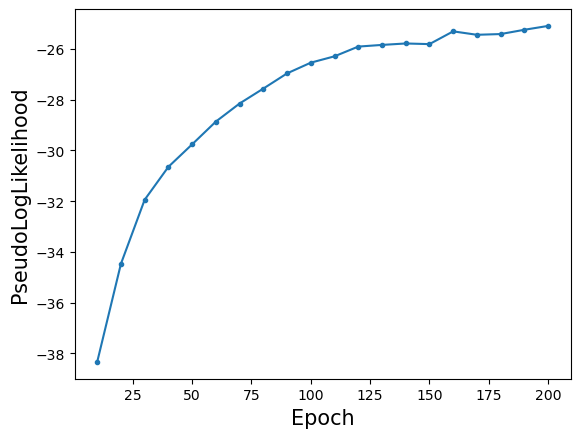

Training RBM 128/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361947 (train), 0.362227 (test), Pseud_Lik: -38.299277, Time: 1.832132, 
Ep 20, Rec er: 0.339102 (train), 0.339978 (test), Pseud_Lik: -34.709310, Time: 1.650806, 
Ep 30, Rec er: 0.327667 (train), 0.328235 (test), Pseud_Lik: -32.578428, Time: 1.702619, 
Ep 40, Rec er: 0.319565 (train), 0.320242 (test), Pseud_Lik: -30.554289, Time: 1.683782, 
Ep 50, Rec er: 0.313645 (train), 0.314371 (test), Pseud_Lik: -29.495535, Time: 2.086631, 
Ep 60, Rec er: 0.308331 (train), 0.309070 (test), Pseud_Lik: -28.439496, Time: 1.856507, 
Ep 70, Rec er: 0.303401 (train), 0.303539 (test), Pseud_Lik: -27.732022, Time: 1.781771, 
Ep 80, Rec er: 0.299269 (train), 0.299757 (test), Pseud_Lik: -27.277352, Time: 1.699554, 
Ep 90, Rec er: 0.295590 (train), 0.295732 (test), Pseud_Lik: -26.883062, Time: 1.848763, 
Ep 100, Rec er: 0.292691 (train), 0.293265 (test), P

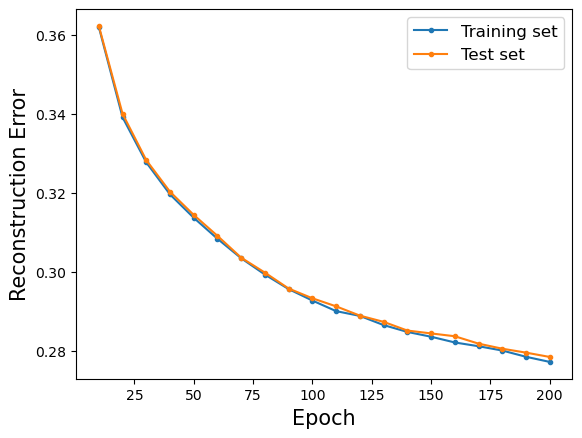

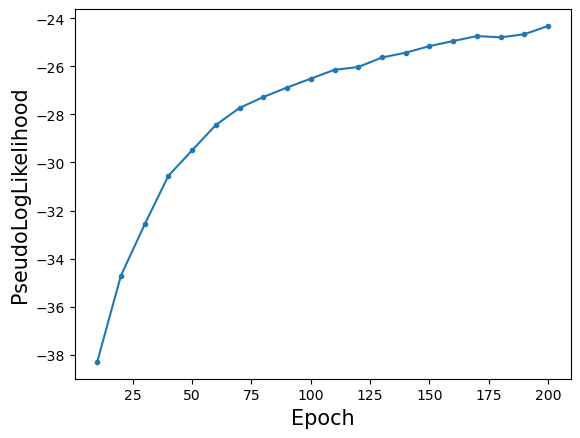

Training RBM 129/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359785 (train), 0.359858 (test), Pseud_Lik: -38.367539, Time: 1.664885, 
Ep 20, Rec er: 0.338716 (train), 0.338338 (test), Pseud_Lik: -34.283404, Time: 1.606717, 
Ep 30, Rec er: 0.327459 (train), 0.327973 (test), Pseud_Lik: -32.214276, Time: 1.666221, 
Ep 40, Rec er: 0.320511 (train), 0.321336 (test), Pseud_Lik: -30.806620, Time: 1.676549, 
Ep 50, Rec er: 0.315645 (train), 0.315389 (test), Pseud_Lik: -29.653287, Time: 1.638623, 
Ep 60, Rec er: 0.309976 (train), 0.310592 (test), Pseud_Lik: -28.690470, Time: 1.676095, 
Ep 70, Rec er: 0.305334 (train), 0.305858 (test), Pseud_Lik: -27.922331, Time: 1.691984, 
Ep 80, Rec er: 0.301107 (train), 0.301056 (test), Pseud_Lik: -27.443953, Time: 1.712481, 
Ep 90, Rec er: 0.297991 (train), 0.298564 (test), Pseud_Lik: -27.076505, Time: 1.669819, 
Ep 100, Rec er: 0.295111 (train), 0.296080 (test), P

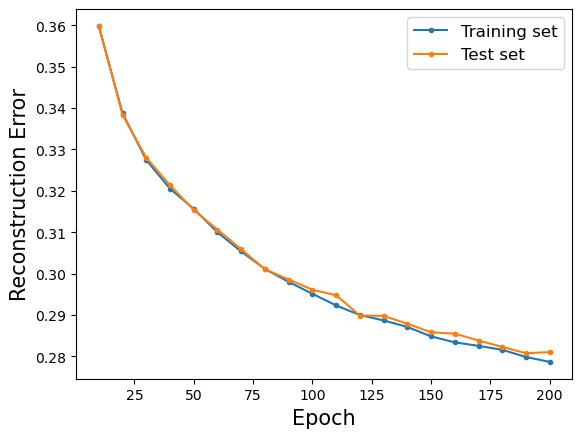

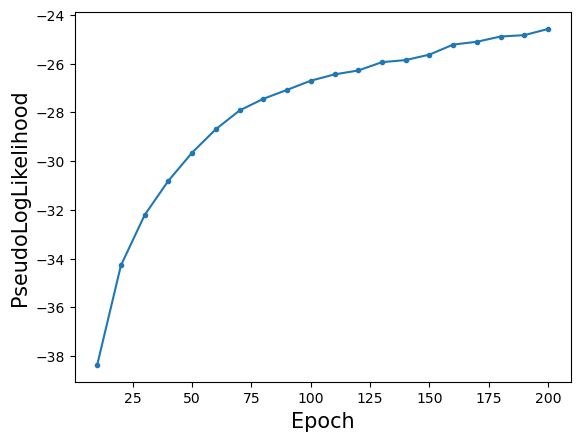

Training RBM 130/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361854 (train), 0.361664 (test), Pseud_Lik: -38.240397, Time: 1.864361, 
Ep 20, Rec er: 0.339655 (train), 0.340113 (test), Pseud_Lik: -34.640243, Time: 1.610309, 
Ep 30, Rec er: 0.327706 (train), 0.328388 (test), Pseud_Lik: -32.233274, Time: 1.767337, 
Ep 40, Rec er: 0.319306 (train), 0.319444 (test), Pseud_Lik: -30.560074, Time: 1.642848, 
Ep 50, Rec er: 0.313502 (train), 0.314137 (test), Pseud_Lik: -29.370700, Time: 1.659567, 
Ep 60, Rec er: 0.309017 (train), 0.310207 (test), Pseud_Lik: -28.549637, Time: 1.653315, 
Ep 70, Rec er: 0.304685 (train), 0.305345 (test), Pseud_Lik: -28.064387, Time: 1.663427, 
Ep 80, Rec er: 0.301180 (train), 0.301089 (test), Pseud_Lik: -27.266629, Time: 1.683796, 
Ep 90, Rec er: 0.297528 (train), 0.298418 (test), Pseud_Lik: -27.082027, Time: 2.154341, 
Ep 100, Rec er: 0.294754 (train), 0.295643 (test), P

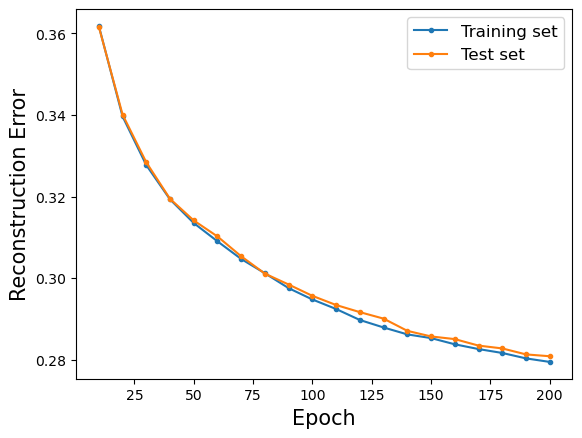

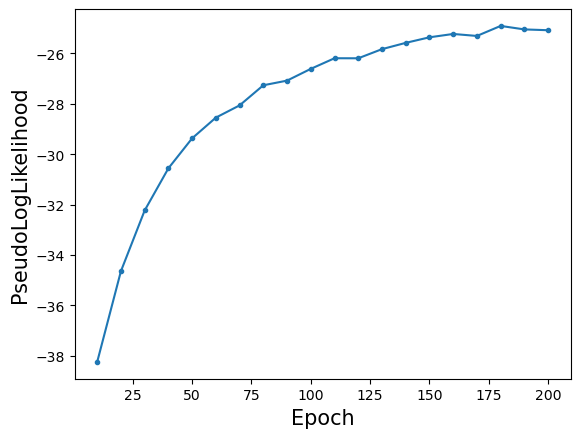

Training RBM 131/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361914 (train), 0.362074 (test), Pseud_Lik: -38.382047, Time: 1.714801, 
Ep 20, Rec er: 0.339111 (train), 0.339260 (test), Pseud_Lik: -34.598773, Time: 2.262863, 
Ep 30, Rec er: 0.327389 (train), 0.328019 (test), Pseud_Lik: -32.225000, Time: 1.702884, 
Ep 40, Rec er: 0.319927 (train), 0.320190 (test), Pseud_Lik: -30.620117, Time: 2.196522, 
Ep 50, Rec er: 0.314865 (train), 0.314885 (test), Pseud_Lik: -29.519276, Time: 1.895543, 
Ep 60, Rec er: 0.309753 (train), 0.310833 (test), Pseud_Lik: -28.694358, Time: 2.115918, 
Ep 70, Rec er: 0.305537 (train), 0.306117 (test), Pseud_Lik: -27.872298, Time: 1.981172, 
Ep 80, Rec er: 0.301735 (train), 0.301969 (test), Pseud_Lik: -27.358996, Time: 1.942349, 
Ep 90, Rec er: 0.297816 (train), 0.299740 (test), Pseud_Lik: -27.078493, Time: 1.800076, 
Ep 100, Rec er: 0.295260 (train), 0.295870 (test), P

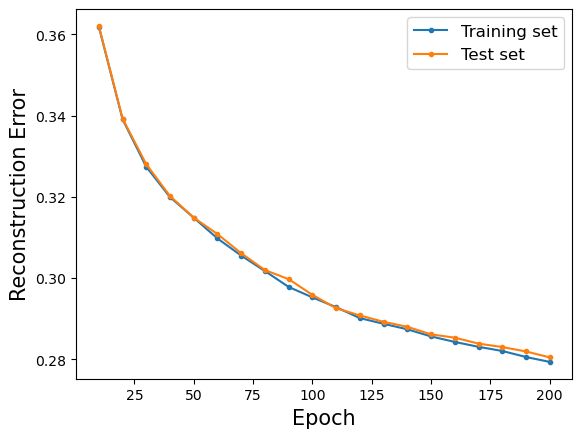

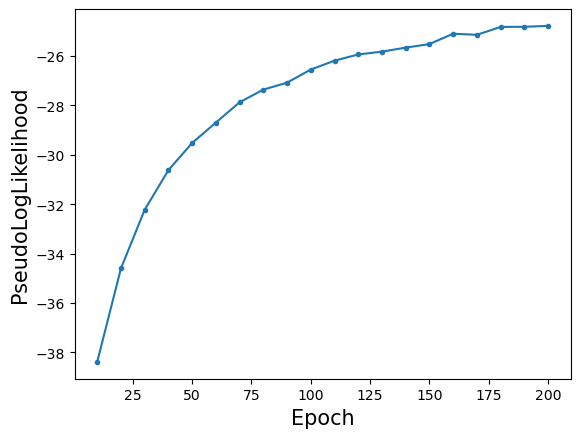

Training RBM 132/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359146 (train), 0.359245 (test), Pseud_Lik: -38.043113, Time: 2.565603, 
Ep 20, Rec er: 0.338809 (train), 0.338544 (test), Pseud_Lik: -34.287998, Time: 2.826565, 
Ep 30, Rec er: 0.327427 (train), 0.327802 (test), Pseud_Lik: -31.806903, Time: 2.653894, 
Ep 40, Rec er: 0.321464 (train), 0.321899 (test), Pseud_Lik: -30.344502, Time: 1.830083, 
Ep 50, Rec er: 0.316361 (train), 0.316289 (test), Pseud_Lik: -29.415351, Time: 1.834991, 
Ep 60, Rec er: 0.311648 (train), 0.312289 (test), Pseud_Lik: -28.888065, Time: 2.183652, 
Ep 70, Rec er: 0.307007 (train), 0.308483 (test), Pseud_Lik: -28.109840, Time: 2.648882, 
Ep 80, Rec er: 0.303121 (train), 0.304564 (test), Pseud_Lik: -27.198848, Time: 2.683134, 
Ep 90, Rec er: 0.299963 (train), 0.300866 (test), Pseud_Lik: -26.849673, Time: 2.020901, 
Ep 100, Rec er: 0.297308 (train), 0.297853 (test), P

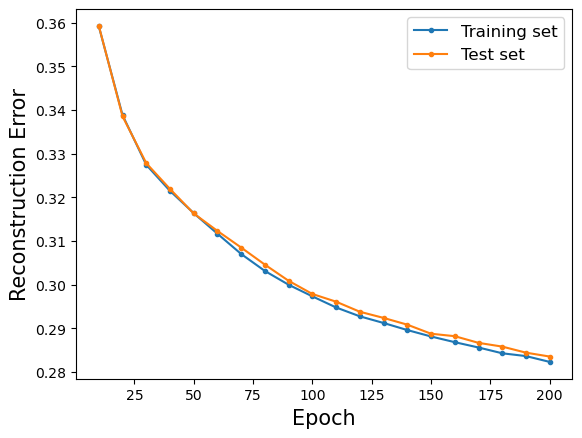

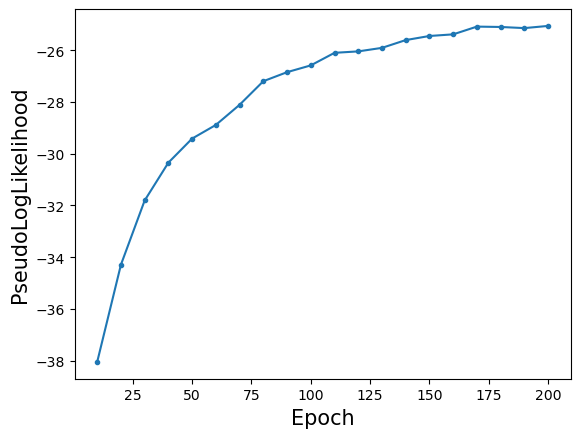

Training RBM 133/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361501 (train), 0.360699 (test), Pseud_Lik: -38.365169, Time: 1.798038, 
Ep 20, Rec er: 0.338271 (train), 0.339287 (test), Pseud_Lik: -34.309718, Time: 1.847322, 
Ep 30, Rec er: 0.327592 (train), 0.327912 (test), Pseud_Lik: -32.213139, Time: 1.895441, 
Ep 40, Rec er: 0.320592 (train), 0.320485 (test), Pseud_Lik: -30.685983, Time: 2.041479, 
Ep 50, Rec er: 0.314932 (train), 0.316126 (test), Pseud_Lik: -29.189306, Time: 1.897736, 
Ep 60, Rec er: 0.310210 (train), 0.311347 (test), Pseud_Lik: -28.504016, Time: 1.884664, 
Ep 70, Rec er: 0.305928 (train), 0.305914 (test), Pseud_Lik: -27.743501, Time: 1.867870, 
Ep 80, Rec er: 0.301624 (train), 0.302449 (test), Pseud_Lik: -27.398719, Time: 2.143436, 
Ep 90, Rec er: 0.298815 (train), 0.299918 (test), Pseud_Lik: -27.102305, Time: 1.790658, 
Ep 100, Rec er: 0.295684 (train), 0.296305 (test), P

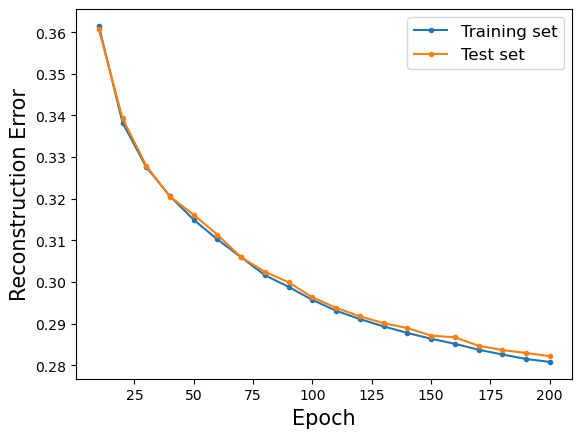

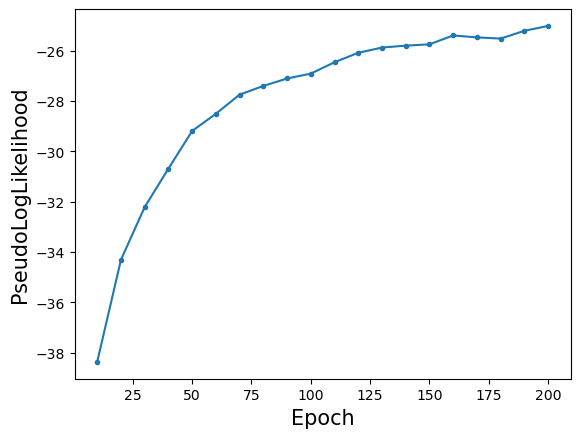

Training RBM 134/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360261 (train), 0.360397 (test), Pseud_Lik: -38.209982, Time: 1.901110, 
Ep 20, Rec er: 0.339200 (train), 0.339350 (test), Pseud_Lik: -34.355445, Time: 1.898394, 
Ep 30, Rec er: 0.328413 (train), 0.329020 (test), Pseud_Lik: -32.525113, Time: 2.157248, 
Ep 40, Rec er: 0.321358 (train), 0.321606 (test), Pseud_Lik: -30.860247, Time: 1.869972, 
Ep 50, Rec er: 0.316189 (train), 0.316269 (test), Pseud_Lik: -29.711654, Time: 1.851054, 
Ep 60, Rec er: 0.310971 (train), 0.311858 (test), Pseud_Lik: -28.700667, Time: 1.842580, 
Ep 70, Rec er: 0.306433 (train), 0.306116 (test), Pseud_Lik: -28.256701, Time: 1.850868, 
Ep 80, Rec er: 0.302432 (train), 0.302915 (test), Pseud_Lik: -27.512523, Time: 1.819265, 
Ep 90, Rec er: 0.299187 (train), 0.299713 (test), Pseud_Lik: -27.088419, Time: 1.742265, 
Ep 100, Rec er: 0.296301 (train), 0.297233 (test), P

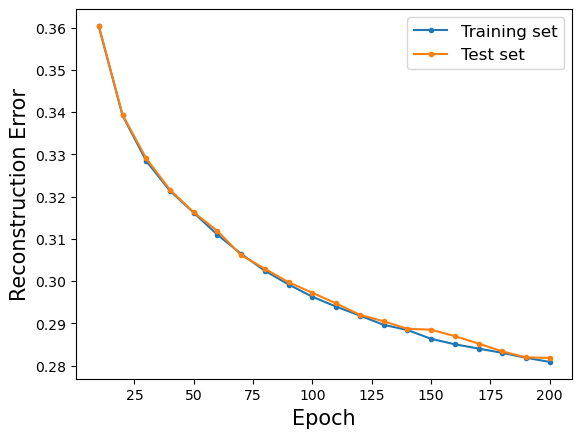

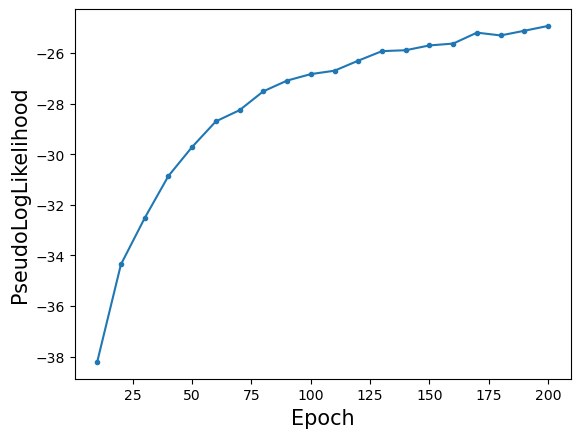

Training RBM 135/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361571 (train), 0.361326 (test), Pseud_Lik: -38.376901, Time: 1.853382, 
Ep 20, Rec er: 0.338980 (train), 0.338847 (test), Pseud_Lik: -34.527572, Time: 2.007629, 
Ep 30, Rec er: 0.328545 (train), 0.328769 (test), Pseud_Lik: -32.417486, Time: 1.824706, 
Ep 40, Rec er: 0.320735 (train), 0.321186 (test), Pseud_Lik: -30.779576, Time: 1.949830, 
Ep 50, Rec er: 0.315546 (train), 0.315290 (test), Pseud_Lik: -29.643033, Time: 1.878284, 
Ep 60, Rec er: 0.310531 (train), 0.311570 (test), Pseud_Lik: -28.999249, Time: 1.837105, 
Ep 70, Rec er: 0.306301 (train), 0.307186 (test), Pseud_Lik: -28.222401, Time: 1.794346, 
Ep 80, Rec er: 0.302061 (train), 0.302971 (test), Pseud_Lik: -27.613529, Time: 1.820411, 
Ep 90, Rec er: 0.298581 (train), 0.299077 (test), Pseud_Lik: -27.122239, Time: 1.854866, 
Ep 100, Rec er: 0.295366 (train), 0.297144 (test), P

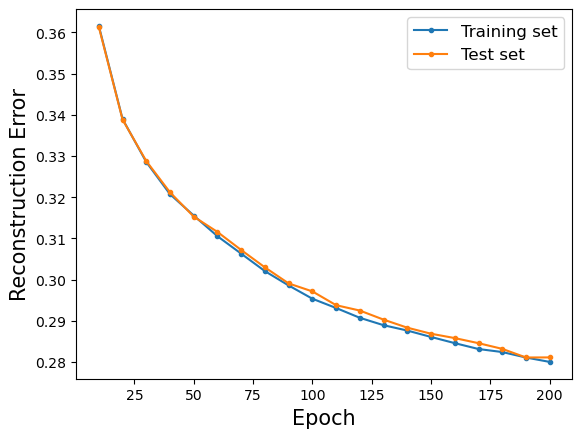

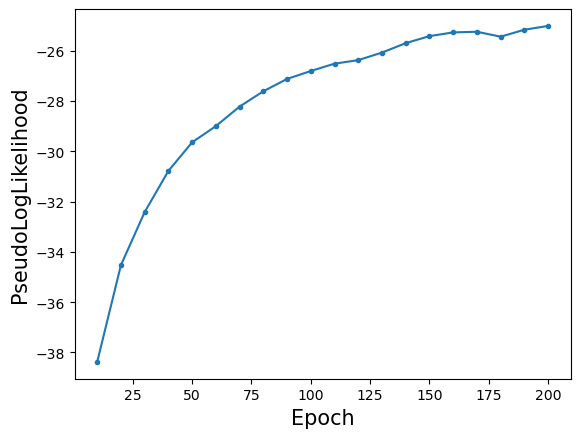

Training RBM 136/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.363343 (train), 0.362680 (test), Pseud_Lik: -38.344967, Time: 1.920455, 
Ep 20, Rec er: 0.339706 (train), 0.339002 (test), Pseud_Lik: -34.755930, Time: 2.134797, 
Ep 30, Rec er: 0.328055 (train), 0.328415 (test), Pseud_Lik: -32.581757, Time: 2.962590, 
Ep 40, Rec er: 0.320296 (train), 0.321888 (test), Pseud_Lik: -31.023325, Time: 1.980093, 
Ep 50, Rec er: 0.314254 (train), 0.315160 (test), Pseud_Lik: -29.677151, Time: 2.834365, 
Ep 60, Rec er: 0.308677 (train), 0.309695 (test), Pseud_Lik: -28.513620, Time: 2.021812, 
Ep 70, Rec er: 0.304161 (train), 0.304728 (test), Pseud_Lik: -27.708440, Time: 2.699206, 
Ep 80, Rec er: 0.300006 (train), 0.301322 (test), Pseud_Lik: -27.016546, Time: 2.203927, 
Ep 90, Rec er: 0.296445 (train), 0.297885 (test), Pseud_Lik: -26.748581, Time: 2.194707, 
Ep 100, Rec er: 0.293995 (train), 0.295173 (test), P

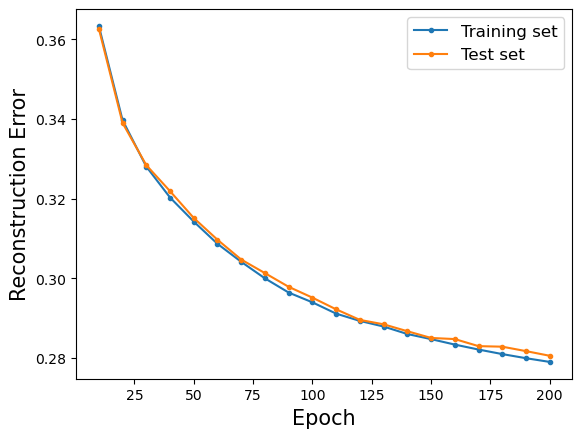

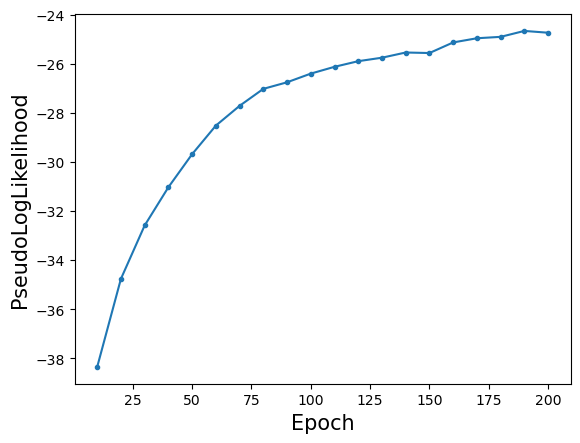

Training RBM 137/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360237 (train), 0.359895 (test), Pseud_Lik: -38.381386, Time: 2.355057, 
Ep 20, Rec er: 0.338061 (train), 0.338669 (test), Pseud_Lik: -34.462938, Time: 1.775114, 
Ep 30, Rec er: 0.327560 (train), 0.327553 (test), Pseud_Lik: -32.004304, Time: 2.205548, 
Ep 40, Rec er: 0.320431 (train), 0.321291 (test), Pseud_Lik: -30.353986, Time: 1.903364, 
Ep 50, Rec er: 0.315823 (train), 0.316161 (test), Pseud_Lik: -29.666982, Time: 1.732132, 
Ep 60, Rec er: 0.310633 (train), 0.310914 (test), Pseud_Lik: -28.867637, Time: 1.956595, 
Ep 70, Rec er: 0.306252 (train), 0.307239 (test), Pseud_Lik: -28.082248, Time: 1.859083, 
Ep 80, Rec er: 0.302768 (train), 0.303990 (test), Pseud_Lik: -27.558291, Time: 2.007525, 
Ep 90, Rec er: 0.298889 (train), 0.299956 (test), Pseud_Lik: -27.043328, Time: 2.042071, 
Ep 100, Rec er: 0.296317 (train), 0.296322 (test), P

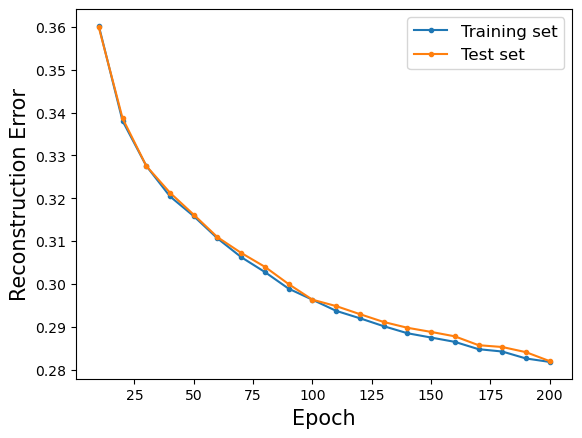

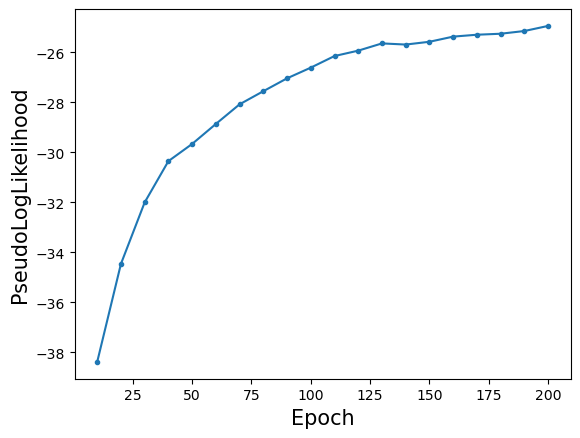

Training RBM 138/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358623 (train), 0.358376 (test), Pseud_Lik: -37.981289, Time: 1.962171, 
Ep 20, Rec er: 0.338602 (train), 0.338508 (test), Pseud_Lik: -34.060974, Time: 2.346140, 
Ep 30, Rec er: 0.328867 (train), 0.328813 (test), Pseud_Lik: -32.134508, Time: 1.723424, 
Ep 40, Rec er: 0.322070 (train), 0.322454 (test), Pseud_Lik: -30.901733, Time: 1.799495, 
Ep 50, Rec er: 0.317081 (train), 0.317371 (test), Pseud_Lik: -30.010277, Time: 1.844011, 
Ep 60, Rec er: 0.312635 (train), 0.313290 (test), Pseud_Lik: -29.056555, Time: 2.402237, 
Ep 70, Rec er: 0.308175 (train), 0.308867 (test), Pseud_Lik: -28.412893, Time: 2.470275, 
Ep 80, Rec er: 0.304773 (train), 0.304804 (test), Pseud_Lik: -27.713218, Time: 1.839830, 
Ep 90, Rec er: 0.300838 (train), 0.302388 (test), Pseud_Lik: -27.304838, Time: 1.787929, 
Ep 100, Rec er: 0.298439 (train), 0.298318 (test), P

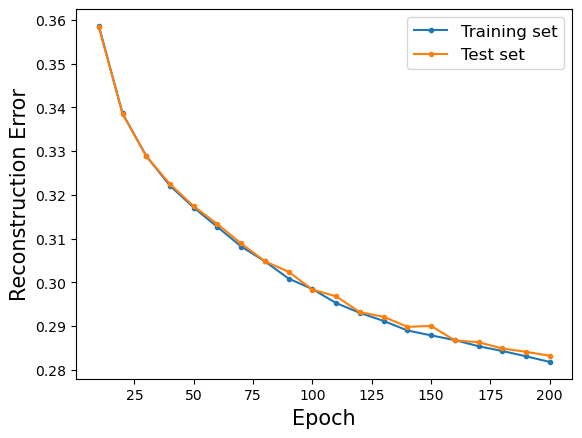

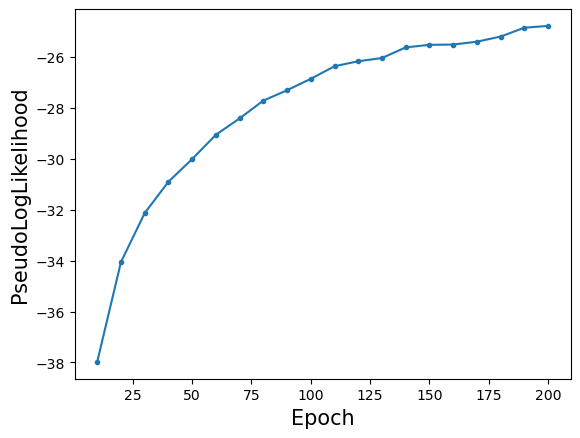

Training RBM 139/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360076 (train), 0.358864 (test), Pseud_Lik: -38.065355, Time: 1.703470, 
Ep 20, Rec er: 0.338820 (train), 0.339703 (test), Pseud_Lik: -34.227019, Time: 2.307069, 
Ep 30, Rec er: 0.327732 (train), 0.328092 (test), Pseud_Lik: -32.381498, Time: 1.773114, 
Ep 40, Rec er: 0.320668 (train), 0.321089 (test), Pseud_Lik: -30.912498, Time: 1.803975, 
Ep 50, Rec er: 0.315326 (train), 0.315532 (test), Pseud_Lik: -29.944141, Time: 2.620710, 
Ep 60, Rec er: 0.310328 (train), 0.311037 (test), Pseud_Lik: -28.880732, Time: 2.557809, 
Ep 70, Rec er: 0.305552 (train), 0.306344 (test), Pseud_Lik: -28.201871, Time: 2.022876, 
Ep 80, Rec er: 0.301244 (train), 0.301839 (test), Pseud_Lik: -27.472326, Time: 2.059162, 
Ep 90, Rec er: 0.298079 (train), 0.298707 (test), Pseud_Lik: -26.919949, Time: 2.700011, 
Ep 100, Rec er: 0.295161 (train), 0.295592 (test), P

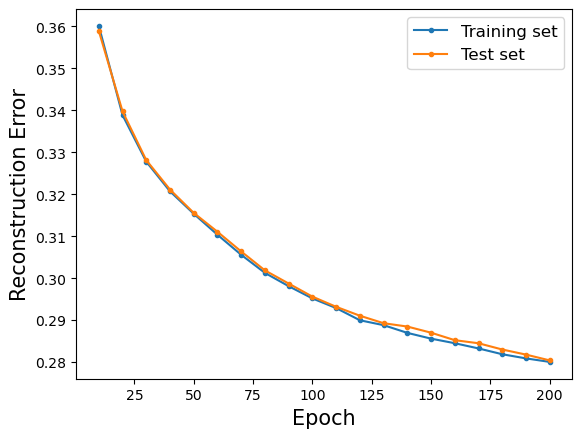

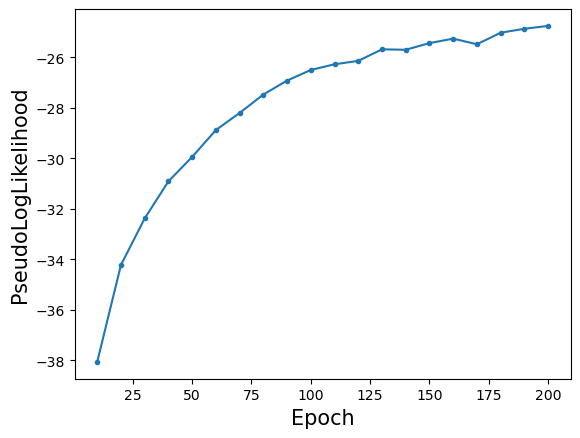

Training RBM 140/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360042 (train), 0.359733 (test), Pseud_Lik: -38.201898, Time: 2.125130, 
Ep 20, Rec er: 0.337928 (train), 0.338780 (test), Pseud_Lik: -34.094442, Time: 2.122324, 
Ep 30, Rec er: 0.327535 (train), 0.327905 (test), Pseud_Lik: -32.087514, Time: 1.884610, 
Ep 40, Rec er: 0.320966 (train), 0.321991 (test), Pseud_Lik: -30.716569, Time: 2.619907, 
Ep 50, Rec er: 0.315869 (train), 0.316660 (test), Pseud_Lik: -29.372309, Time: 2.472100, 
Ep 60, Rec er: 0.311671 (train), 0.312193 (test), Pseud_Lik: -28.505937, Time: 2.889435, 
Ep 70, Rec er: 0.307758 (train), 0.308427 (test), Pseud_Lik: -27.897626, Time: 2.172674, 
Ep 80, Rec er: 0.303621 (train), 0.304405 (test), Pseud_Lik: -27.357500, Time: 2.881483, 
Ep 90, Rec er: 0.300251 (train), 0.301324 (test), Pseud_Lik: -26.933077, Time: 2.051496, 
Ep 100, Rec er: 0.297759 (train), 0.299151 (test), P

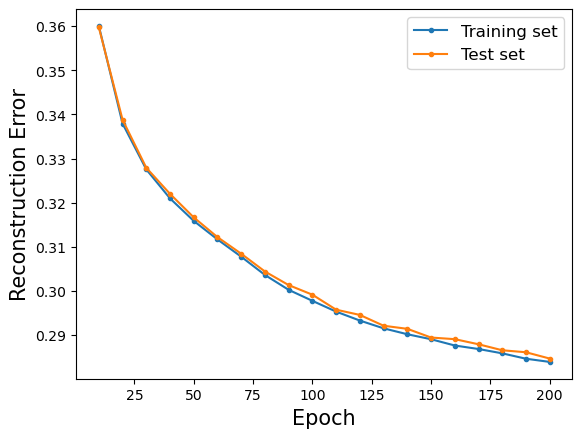

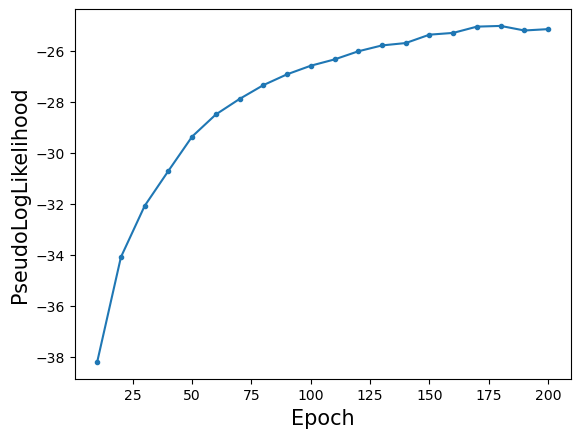

Training RBM 141/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359952 (train), 0.359000 (test), Pseud_Lik: -38.240852, Time: 2.270332, 
Ep 20, Rec er: 0.337935 (train), 0.338128 (test), Pseud_Lik: -34.202034, Time: 2.448870, 
Ep 30, Rec er: 0.328046 (train), 0.328453 (test), Pseud_Lik: -32.045337, Time: 2.339277, 
Ep 40, Rec er: 0.321712 (train), 0.322377 (test), Pseud_Lik: -30.470176, Time: 2.878034, 
Ep 50, Rec er: 0.316475 (train), 0.317827 (test), Pseud_Lik: -29.369014, Time: 2.669708, 
Ep 60, Rec er: 0.312572 (train), 0.313225 (test), Pseud_Lik: -28.673750, Time: 2.066677, 
Ep 70, Rec er: 0.308713 (train), 0.310006 (test), Pseud_Lik: -27.881072, Time: 2.019400, 
Ep 80, Rec er: 0.305802 (train), 0.306132 (test), Pseud_Lik: -27.687422, Time: 2.527755, 
Ep 90, Rec er: 0.302685 (train), 0.303226 (test), Pseud_Lik: -27.149830, Time: 2.196109, 
Ep 100, Rec er: 0.299772 (train), 0.300683 (test), P

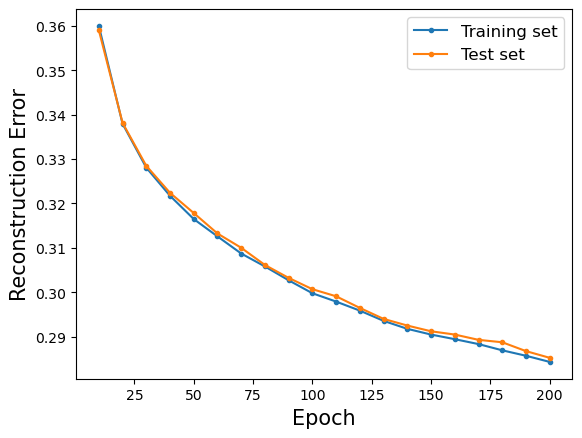

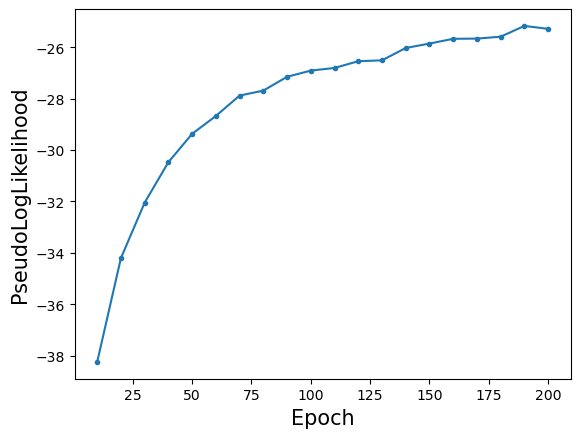

Training RBM 142/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361801 (train), 0.360163 (test), Pseud_Lik: -38.366708, Time: 1.871432, 
Ep 20, Rec er: 0.339006 (train), 0.339837 (test), Pseud_Lik: -34.224735, Time: 1.814629, 
Ep 30, Rec er: 0.328941 (train), 0.329594 (test), Pseud_Lik: -32.668195, Time: 1.778384, 
Ep 40, Rec er: 0.322436 (train), 0.323262 (test), Pseud_Lik: -31.377755, Time: 1.972935, 
Ep 50, Rec er: 0.317322 (train), 0.318015 (test), Pseud_Lik: -30.095299, Time: 1.756204, 
Ep 60, Rec er: 0.312078 (train), 0.312401 (test), Pseud_Lik: -29.213465, Time: 2.522203, 
Ep 70, Rec er: 0.307376 (train), 0.308533 (test), Pseud_Lik: -28.581612, Time: 1.890265, 
Ep 80, Rec er: 0.303167 (train), 0.304023 (test), Pseud_Lik: -27.865598, Time: 2.147480, 
Ep 90, Rec er: 0.299859 (train), 0.299933 (test), Pseud_Lik: -27.499732, Time: 1.700149, 
Ep 100, Rec er: 0.296846 (train), 0.297556 (test), P

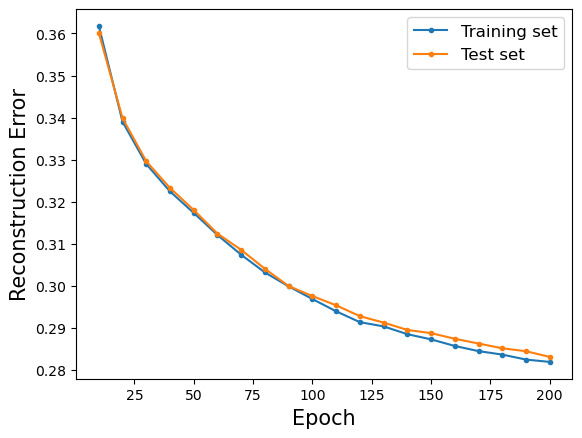

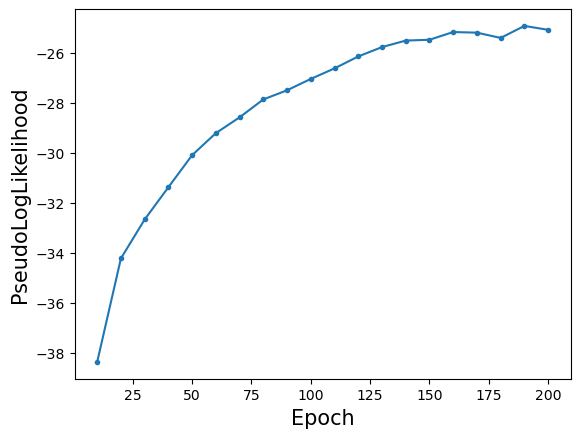

Training RBM 143/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359991 (train), 0.358502 (test), Pseud_Lik: -38.203947, Time: 2.105894, 
Ep 20, Rec er: 0.337910 (train), 0.337914 (test), Pseud_Lik: -33.895822, Time: 2.172941, 
Ep 30, Rec er: 0.327982 (train), 0.329093 (test), Pseud_Lik: -31.858068, Time: 1.802384, 
Ep 40, Rec er: 0.321807 (train), 0.323506 (test), Pseud_Lik: -30.736071, Time: 2.574006, 
Ep 50, Rec er: 0.317327 (train), 0.318255 (test), Pseud_Lik: -30.047862, Time: 2.607268, 
Ep 60, Rec er: 0.312693 (train), 0.313471 (test), Pseud_Lik: -29.407016, Time: 1.809310, 
Ep 70, Rec er: 0.308096 (train), 0.309389 (test), Pseud_Lik: -28.402447, Time: 1.894721, 
Ep 80, Rec er: 0.304394 (train), 0.305077 (test), Pseud_Lik: -27.884810, Time: 1.897573, 
Ep 90, Rec er: 0.301001 (train), 0.301090 (test), Pseud_Lik: -27.312614, Time: 1.749958, 
Ep 100, Rec er: 0.297484 (train), 0.298485 (test), P

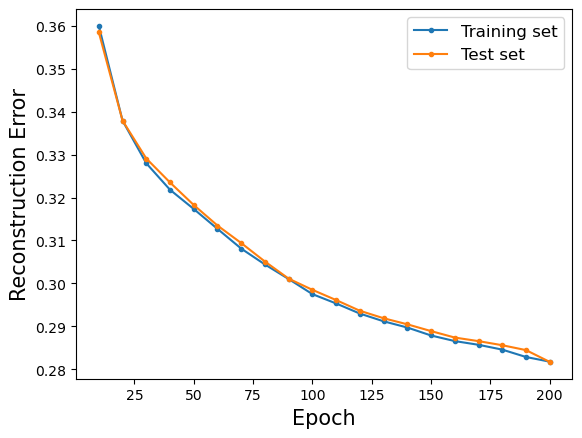

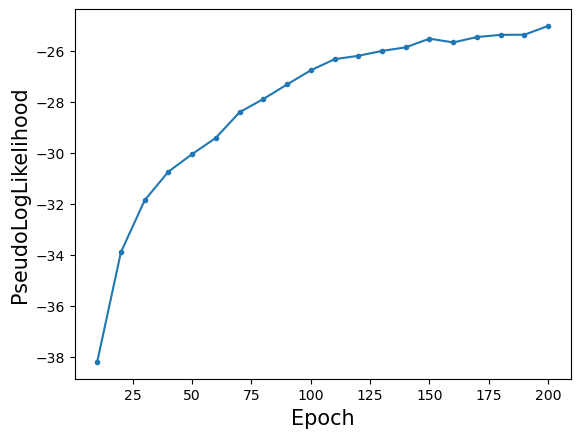

Training RBM 144/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361382 (train), 0.360366 (test), Pseud_Lik: -38.101247, Time: 2.663966, 
Ep 20, Rec er: 0.338669 (train), 0.339055 (test), Pseud_Lik: -34.131248, Time: 2.464949, 
Ep 30, Rec er: 0.327284 (train), 0.327909 (test), Pseud_Lik: -32.406413, Time: 2.813779, 
Ep 40, Rec er: 0.320438 (train), 0.320449 (test), Pseud_Lik: -30.806651, Time: 2.023876, 
Ep 50, Rec er: 0.314799 (train), 0.315316 (test), Pseud_Lik: -29.402748, Time: 2.432054, 
Ep 60, Rec er: 0.309223 (train), 0.311073 (test), Pseud_Lik: -28.517324, Time: 3.216178, 
Ep 70, Rec er: 0.304487 (train), 0.305577 (test), Pseud_Lik: -28.013773, Time: 2.410887, 
Ep 80, Rec er: 0.300667 (train), 0.300784 (test), Pseud_Lik: -27.274629, Time: 2.202703, 
Ep 90, Rec er: 0.297183 (train), 0.298329 (test), Pseud_Lik: -26.671147, Time: 2.877308, 
Ep 100, Rec er: 0.294210 (train), 0.295279 (test), P

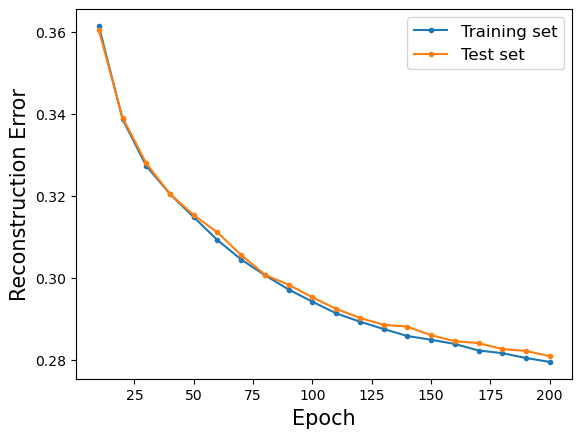

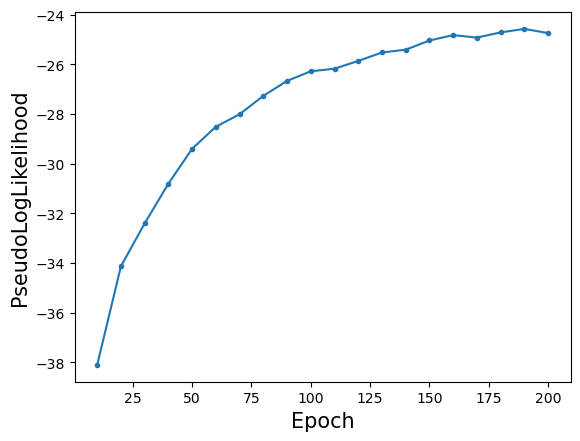

Training RBM 145/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360646 (train), 0.361100 (test), Pseud_Lik: -38.191485, Time: 1.785761, 
Ep 20, Rec er: 0.338576 (train), 0.339169 (test), Pseud_Lik: -34.238276, Time: 2.323893, 
Ep 30, Rec er: 0.327676 (train), 0.327720 (test), Pseud_Lik: -32.366812, Time: 1.866169, 
Ep 40, Rec er: 0.321216 (train), 0.321796 (test), Pseud_Lik: -30.665893, Time: 1.755196, 
Ep 50, Rec er: 0.315424 (train), 0.316785 (test), Pseud_Lik: -29.425824, Time: 1.890280, 
Ep 60, Rec er: 0.310945 (train), 0.311644 (test), Pseud_Lik: -28.529475, Time: 1.853683, 
Ep 70, Rec er: 0.306989 (train), 0.307183 (test), Pseud_Lik: -27.909190, Time: 1.774404, 
Ep 80, Rec er: 0.302827 (train), 0.303088 (test), Pseud_Lik: -27.432427, Time: 1.845105, 
Ep 90, Rec er: 0.299207 (train), 0.300725 (test), Pseud_Lik: -27.136613, Time: 1.732050, 
Ep 100, Rec er: 0.297013 (train), 0.297680 (test), P

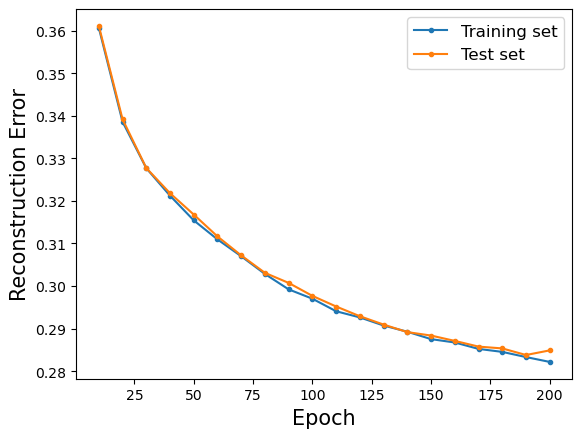

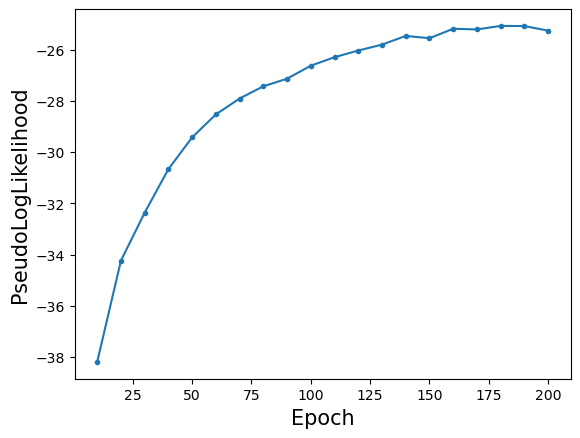

Training RBM 146/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359482 (train), 0.359401 (test), Pseud_Lik: -38.129062, Time: 1.788624, 
Ep 20, Rec er: 0.336931 (train), 0.337354 (test), Pseud_Lik: -33.963534, Time: 2.138953, 
Ep 30, Rec er: 0.326743 (train), 0.326585 (test), Pseud_Lik: -31.979446, Time: 2.765743, 
Ep 40, Rec er: 0.321040 (train), 0.320943 (test), Pseud_Lik: -30.251390, Time: 2.239748, 
Ep 50, Rec er: 0.315164 (train), 0.316269 (test), Pseud_Lik: -29.230826, Time: 2.049536, 
Ep 60, Rec er: 0.311105 (train), 0.312039 (test), Pseud_Lik: -28.433548, Time: 2.907885, 
Ep 70, Rec er: 0.307145 (train), 0.307918 (test), Pseud_Lik: -27.768053, Time: 2.216779, 
Ep 80, Rec er: 0.303603 (train), 0.304334 (test), Pseud_Lik: -27.358459, Time: 1.985193, 
Ep 90, Rec er: 0.300547 (train), 0.301260 (test), Pseud_Lik: -26.991774, Time: 1.850906, 
Ep 100, Rec er: 0.298152 (train), 0.299202 (test), P

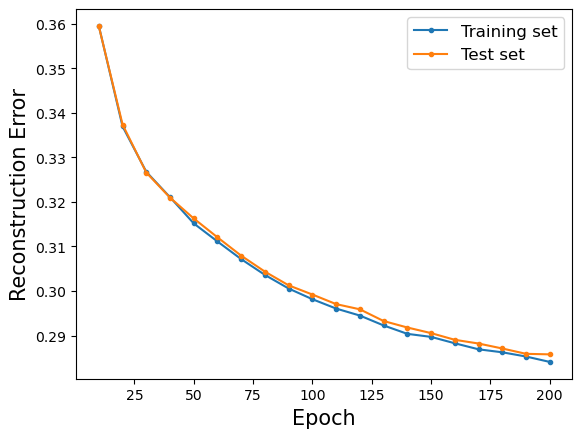

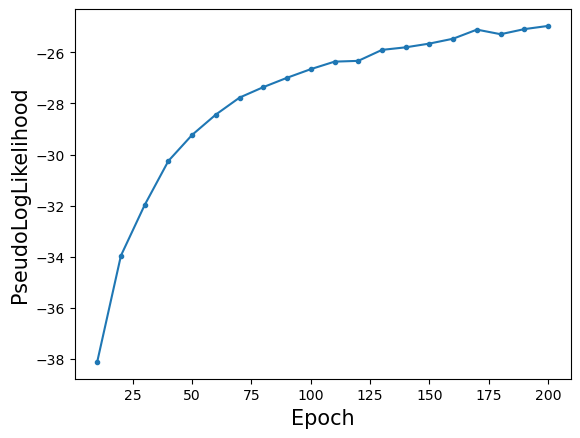

Training RBM 147/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361567 (train), 0.360689 (test), Pseud_Lik: -38.293896, Time: 1.792059, 
Ep 20, Rec er: 0.338855 (train), 0.338954 (test), Pseud_Lik: -34.707868, Time: 2.629649, 
Ep 30, Rec er: 0.325815 (train), 0.327076 (test), Pseud_Lik: -32.657993, Time: 1.769030, 
Ep 40, Rec er: 0.317759 (train), 0.318376 (test), Pseud_Lik: -30.706989, Time: 1.999157, 
Ep 50, Rec er: 0.312064 (train), 0.312443 (test), Pseud_Lik: -29.315373, Time: 1.892906, 
Ep 60, Rec er: 0.306320 (train), 0.307634 (test), Pseud_Lik: -28.356158, Time: 2.151568, 
Ep 70, Rec er: 0.301532 (train), 0.303217 (test), Pseud_Lik: -27.667647, Time: 2.315975, 
Ep 80, Rec er: 0.297710 (train), 0.297832 (test), Pseud_Lik: -26.794667, Time: 2.415247, 
Ep 90, Rec er: 0.294602 (train), 0.295659 (test), Pseud_Lik: -26.344435, Time: 2.007359, 
Ep 100, Rec er: 0.291128 (train), 0.292474 (test), P

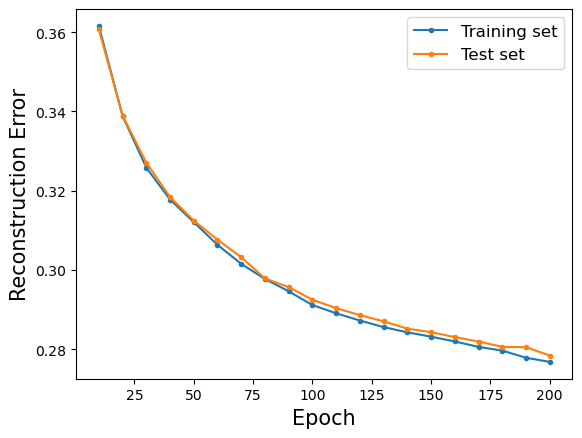

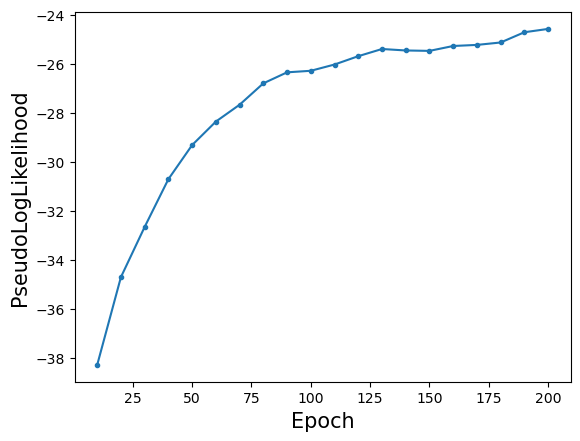

Training RBM 148/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360767 (train), 0.359674 (test), Pseud_Lik: -38.336681, Time: 1.980163, 
Ep 20, Rec er: 0.337686 (train), 0.337682 (test), Pseud_Lik: -34.424622, Time: 1.729534, 
Ep 30, Rec er: 0.326530 (train), 0.326303 (test), Pseud_Lik: -32.228814, Time: 1.807263, 
Ep 40, Rec er: 0.318645 (train), 0.319858 (test), Pseud_Lik: -30.733624, Time: 1.752041, 
Ep 50, Rec er: 0.313399 (train), 0.314321 (test), Pseud_Lik: -29.468364, Time: 1.787789, 
Ep 60, Rec er: 0.308356 (train), 0.308915 (test), Pseud_Lik: -28.499927, Time: 1.709971, 
Ep 70, Rec er: 0.304222 (train), 0.304728 (test), Pseud_Lik: -27.792421, Time: 2.109646, 
Ep 80, Rec er: 0.300335 (train), 0.301544 (test), Pseud_Lik: -27.353365, Time: 2.051435, 
Ep 90, Rec er: 0.296688 (train), 0.297407 (test), Pseud_Lik: -26.884401, Time: 1.828153, 
Ep 100, Rec er: 0.293661 (train), 0.294821 (test), P

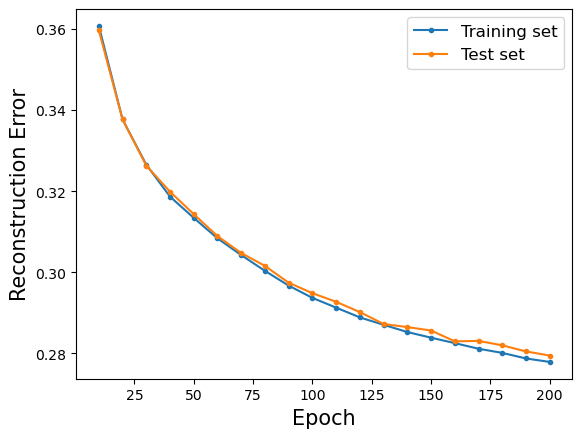

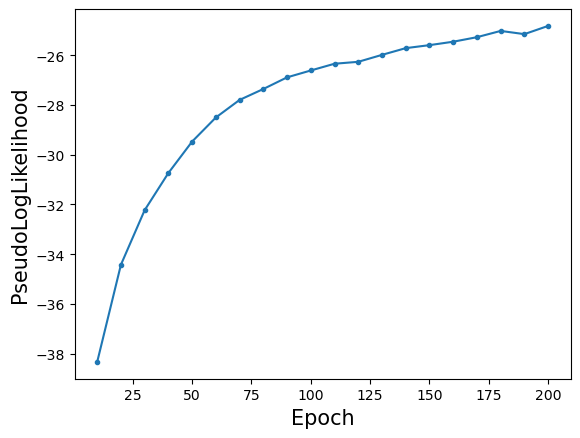

Training RBM 149/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361559 (train), 0.361578 (test), Pseud_Lik: -38.541457, Time: 1.669781, 
Ep 20, Rec er: 0.338097 (train), 0.337965 (test), Pseud_Lik: -34.545542, Time: 1.723026, 
Ep 30, Rec er: 0.327370 (train), 0.327730 (test), Pseud_Lik: -32.226205, Time: 1.937908, 
Ep 40, Rec er: 0.321323 (train), 0.320929 (test), Pseud_Lik: -31.075036, Time: 1.822153, 
Ep 50, Rec er: 0.315752 (train), 0.316241 (test), Pseud_Lik: -29.947691, Time: 1.951154, 
Ep 60, Rec er: 0.311349 (train), 0.311724 (test), Pseud_Lik: -29.021992, Time: 1.746433, 
Ep 70, Rec er: 0.307085 (train), 0.307158 (test), Pseud_Lik: -28.310020, Time: 1.862388, 
Ep 80, Rec er: 0.302255 (train), 0.303777 (test), Pseud_Lik: -27.841177, Time: 2.271047, 
Ep 90, Rec er: 0.299053 (train), 0.299902 (test), Pseud_Lik: -26.959895, Time: 1.777899, 
Ep 100, Rec er: 0.295898 (train), 0.296481 (test), P

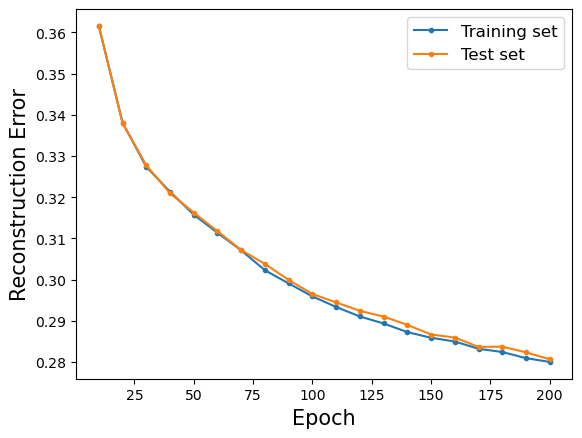

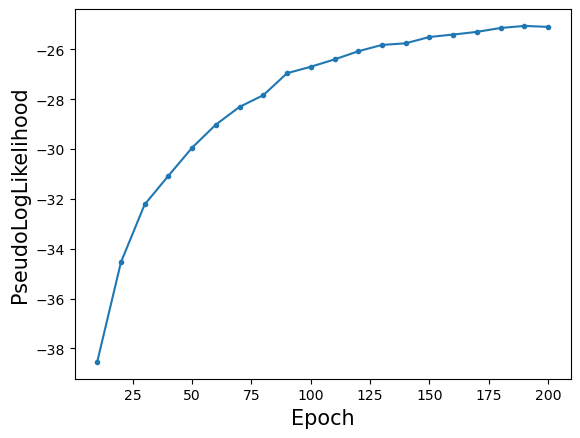

Training RBM 150/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360069 (train), 0.358429 (test), Pseud_Lik: -38.283349, Time: 1.712917, 
Ep 20, Rec er: 0.337434 (train), 0.336712 (test), Pseud_Lik: -34.190225, Time: 1.753998, 
Ep 30, Rec er: 0.326909 (train), 0.327204 (test), Pseud_Lik: -31.935268, Time: 1.875303, 
Ep 40, Rec er: 0.319953 (train), 0.321499 (test), Pseud_Lik: -30.578857, Time: 1.800541, 
Ep 50, Rec er: 0.314833 (train), 0.315359 (test), Pseud_Lik: -29.516536, Time: 1.790432, 
Ep 60, Rec er: 0.310789 (train), 0.310921 (test), Pseud_Lik: -28.554447, Time: 1.813177, 
Ep 70, Rec er: 0.306705 (train), 0.307708 (test), Pseud_Lik: -28.373930, Time: 1.801560, 
Ep 80, Rec er: 0.303422 (train), 0.303947 (test), Pseud_Lik: -27.772866, Time: 2.232880, 
Ep 90, Rec er: 0.299863 (train), 0.301325 (test), Pseud_Lik: -27.239816, Time: 1.915063, 
Ep 100, Rec er: 0.296977 (train), 0.298002 (test), P

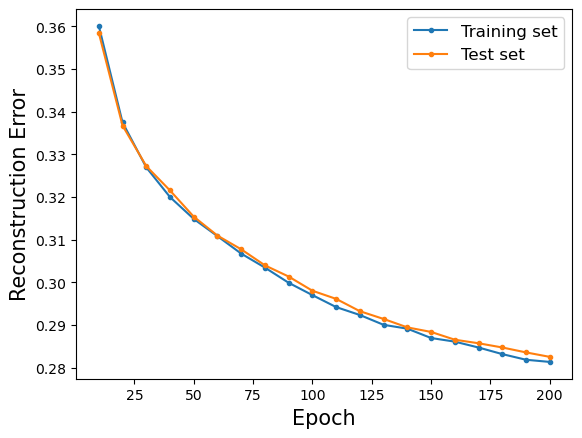

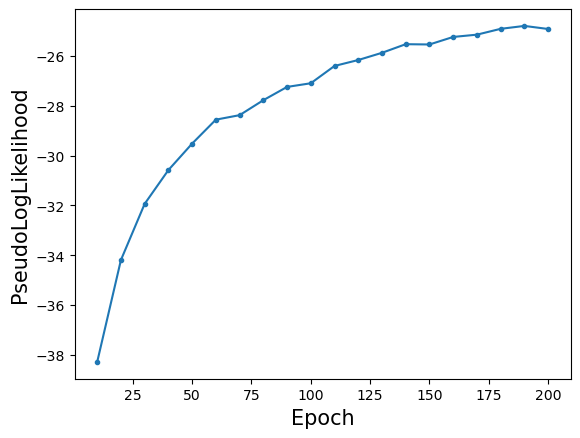

Training RBM 151/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360407 (train), 0.359713 (test), Pseud_Lik: -38.316103, Time: 2.887624, 
Ep 20, Rec er: 0.338250 (train), 0.338103 (test), Pseud_Lik: -34.214556, Time: 2.476497, 
Ep 30, Rec er: 0.328601 (train), 0.328829 (test), Pseud_Lik: -32.485984, Time: 2.660642, 
Ep 40, Rec er: 0.322088 (train), 0.322389 (test), Pseud_Lik: -31.114730, Time: 2.247325, 
Ep 50, Rec er: 0.316062 (train), 0.315906 (test), Pseud_Lik: -30.105267, Time: 2.552361, 
Ep 60, Rec er: 0.310927 (train), 0.311444 (test), Pseud_Lik: -28.737490, Time: 3.296454, 
Ep 70, Rec er: 0.306185 (train), 0.306827 (test), Pseud_Lik: -27.858159, Time: 2.753531, 
Ep 80, Rec er: 0.301860 (train), 0.302007 (test), Pseud_Lik: -27.311633, Time: 3.444674, 
Ep 90, Rec er: 0.298569 (train), 0.299208 (test), Pseud_Lik: -27.025885, Time: 3.483122, 
Ep 100, Rec er: 0.295201 (train), 0.296648 (test), P

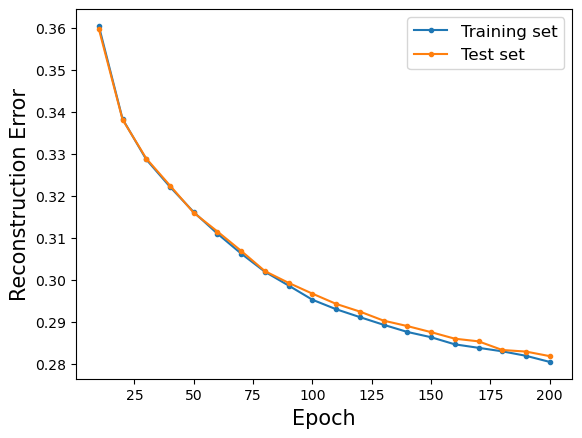

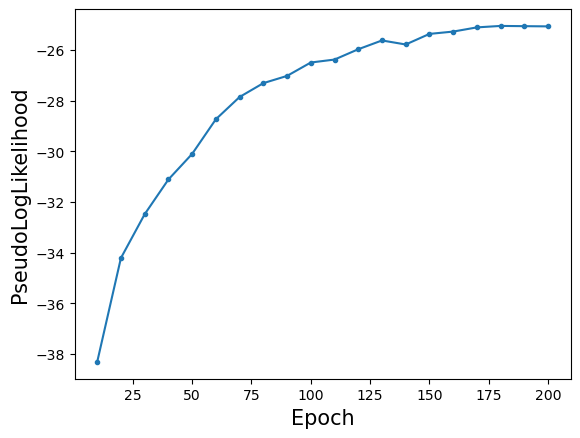

Training RBM 152/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360917 (train), 0.360572 (test), Pseud_Lik: -38.373353, Time: 1.773202, 
Ep 20, Rec er: 0.338133 (train), 0.339307 (test), Pseud_Lik: -34.411384, Time: 1.785705, 
Ep 30, Rec er: 0.327568 (train), 0.326989 (test), Pseud_Lik: -32.478980, Time: 2.403048, 
Ep 40, Rec er: 0.320217 (train), 0.320630 (test), Pseud_Lik: -30.815038, Time: 1.827019, 
Ep 50, Rec er: 0.314765 (train), 0.315428 (test), Pseud_Lik: -29.263888, Time: 2.060358, 
Ep 60, Rec er: 0.309208 (train), 0.309729 (test), Pseud_Lik: -28.408484, Time: 1.853756, 
Ep 70, Rec er: 0.304634 (train), 0.305479 (test), Pseud_Lik: -27.765458, Time: 1.883285, 
Ep 80, Rec er: 0.300963 (train), 0.301432 (test), Pseud_Lik: -27.144748, Time: 1.983169, 
Ep 90, Rec er: 0.297032 (train), 0.298492 (test), Pseud_Lik: -26.650324, Time: 2.002724, 
Ep 100, Rec er: 0.293932 (train), 0.295563 (test), P

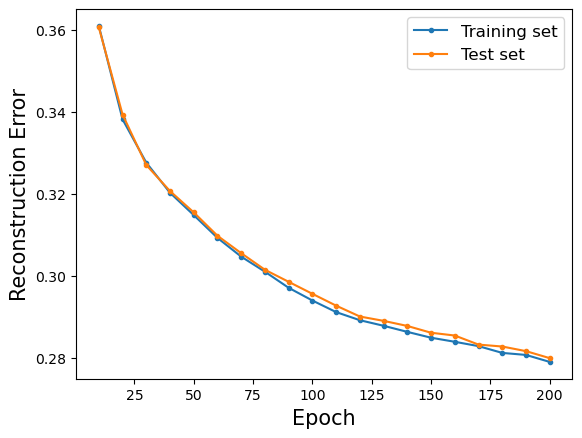

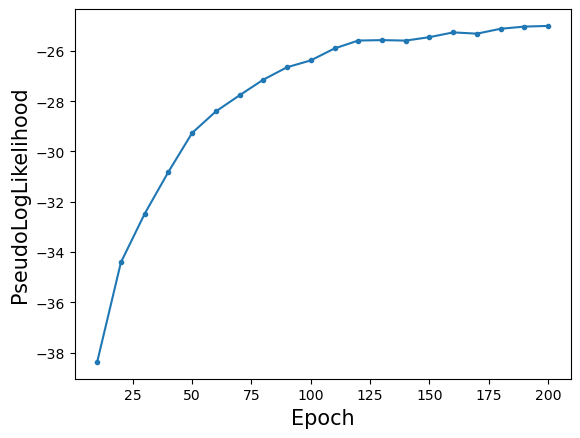

Training RBM 153/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362662 (train), 0.362692 (test), Pseud_Lik: -38.369997, Time: 1.827761, 
Ep 20, Rec er: 0.339728 (train), 0.339707 (test), Pseud_Lik: -34.683540, Time: 2.044485, 
Ep 30, Rec er: 0.327754 (train), 0.328305 (test), Pseud_Lik: -32.672294, Time: 2.266237, 
Ep 40, Rec er: 0.319340 (train), 0.320360 (test), Pseud_Lik: -30.994535, Time: 2.072105, 
Ep 50, Rec er: 0.313679 (train), 0.314016 (test), Pseud_Lik: -29.601889, Time: 1.829006, 
Ep 60, Rec er: 0.308117 (train), 0.309254 (test), Pseud_Lik: -28.516640, Time: 2.565020, 
Ep 70, Rec er: 0.304241 (train), 0.304274 (test), Pseud_Lik: -27.754059, Time: 2.625409, 
Ep 80, Rec er: 0.299944 (train), 0.300485 (test), Pseud_Lik: -27.250052, Time: 2.828641, 
Ep 90, Rec er: 0.296052 (train), 0.296964 (test), Pseud_Lik: -26.762527, Time: 1.891667, 
Ep 100, Rec er: 0.292743 (train), 0.293610 (test), P

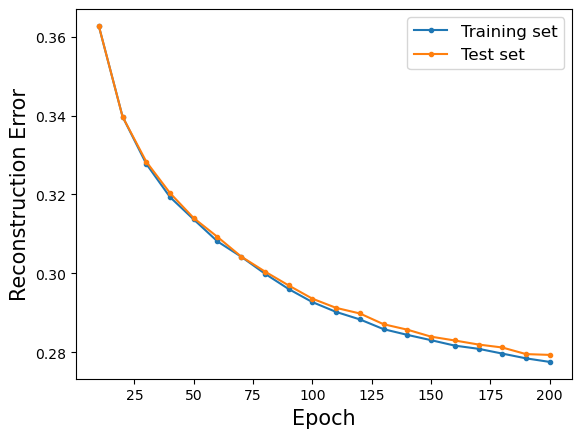

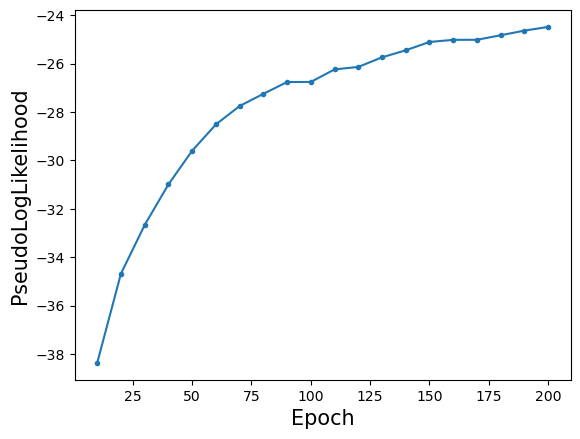

Training RBM 154/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361329 (train), 0.361349 (test), Pseud_Lik: -38.435511, Time: 1.642784, 
Ep 20, Rec er: 0.338024 (train), 0.338716 (test), Pseud_Lik: -34.505141, Time: 1.998911, 
Ep 30, Rec er: 0.326892 (train), 0.327076 (test), Pseud_Lik: -32.127880, Time: 2.308903, 
Ep 40, Rec er: 0.319724 (train), 0.320957 (test), Pseud_Lik: -30.340569, Time: 1.692032, 
Ep 50, Rec er: 0.314117 (train), 0.314520 (test), Pseud_Lik: -29.371655, Time: 1.657707, 
Ep 60, Rec er: 0.309643 (train), 0.309987 (test), Pseud_Lik: -28.621135, Time: 1.815737, 
Ep 70, Rec er: 0.305106 (train), 0.305605 (test), Pseud_Lik: -27.964841, Time: 2.339138, 
Ep 80, Rec er: 0.302168 (train), 0.303087 (test), Pseud_Lik: -27.381263, Time: 1.772730, 
Ep 90, Rec er: 0.298437 (train), 0.298956 (test), Pseud_Lik: -26.734739, Time: 1.759276, 
Ep 100, Rec er: 0.296068 (train), 0.296260 (test), P

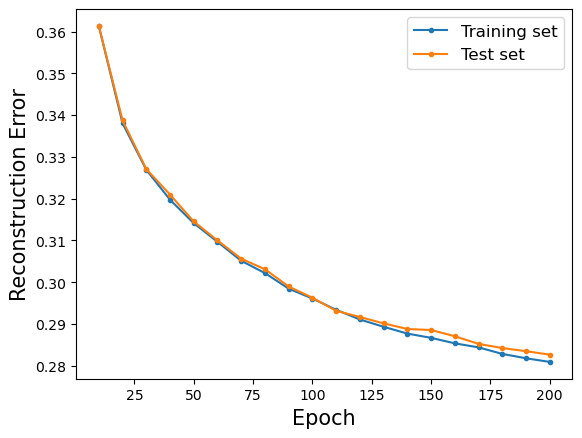

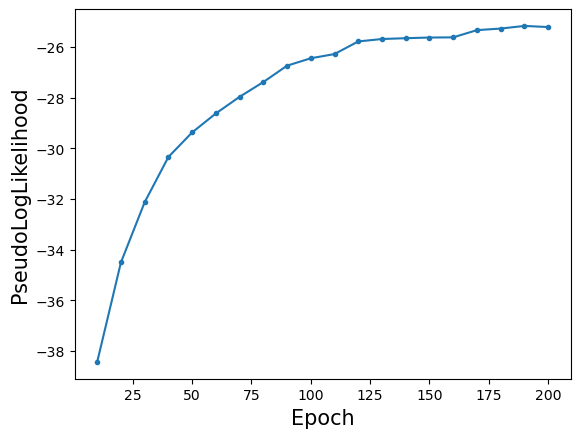

Training RBM 155/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361195 (train), 0.360141 (test), Pseud_Lik: -38.423689, Time: 2.716191, 
Ep 20, Rec er: 0.338456 (train), 0.339208 (test), Pseud_Lik: -33.906010, Time: 2.268179, 
Ep 30, Rec er: 0.328305 (train), 0.329193 (test), Pseud_Lik: -32.158802, Time: 2.004366, 
Ep 40, Rec er: 0.322849 (train), 0.324031 (test), Pseud_Lik: -30.904021, Time: 2.633602, 
Ep 50, Rec er: 0.318659 (train), 0.319041 (test), Pseud_Lik: -30.231924, Time: 1.834574, 
Ep 60, Rec er: 0.314138 (train), 0.314060 (test), Pseud_Lik: -29.441577, Time: 1.977332, 
Ep 70, Rec er: 0.310006 (train), 0.310385 (test), Pseud_Lik: -28.591295, Time: 2.652705, 
Ep 80, Rec er: 0.305916 (train), 0.306522 (test), Pseud_Lik: -27.969189, Time: 1.881094, 
Ep 90, Rec er: 0.302484 (train), 0.302765 (test), Pseud_Lik: -27.467876, Time: 1.922399, 
Ep 100, Rec er: 0.299123 (train), 0.299242 (test), P

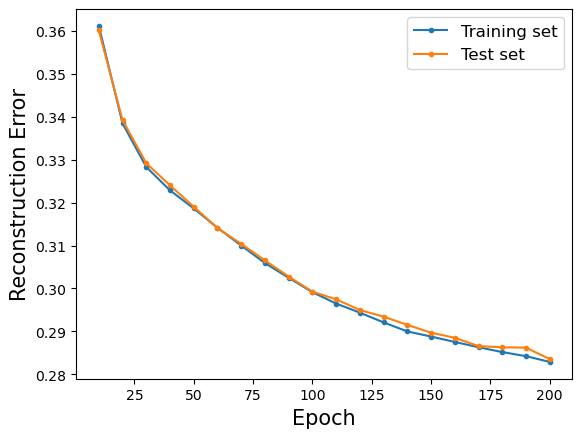

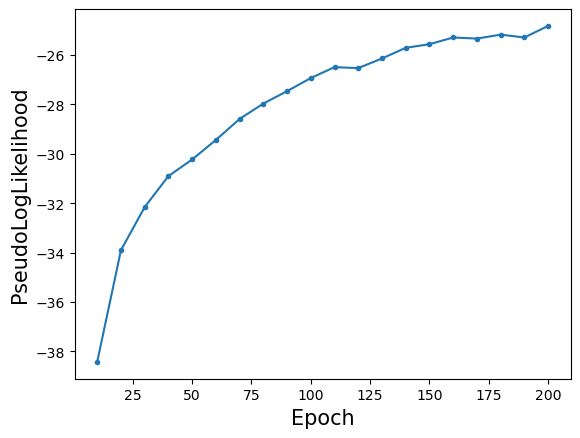

Training RBM 156/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362000 (train), 0.361663 (test), Pseud_Lik: -38.234679, Time: 1.724491, 
Ep 20, Rec er: 0.339720 (train), 0.339753 (test), Pseud_Lik: -34.609156, Time: 1.643920, 
Ep 30, Rec er: 0.327425 (train), 0.328025 (test), Pseud_Lik: -32.485090, Time: 1.765764, 
Ep 40, Rec er: 0.319349 (train), 0.319528 (test), Pseud_Lik: -30.608182, Time: 2.028235, 
Ep 50, Rec er: 0.313057 (train), 0.313328 (test), Pseud_Lik: -29.122421, Time: 2.028309, 
Ep 60, Rec er: 0.308084 (train), 0.308851 (test), Pseud_Lik: -28.397556, Time: 2.076713, 
Ep 70, Rec er: 0.302740 (train), 0.302987 (test), Pseud_Lik: -27.694453, Time: 1.930803, 
Ep 80, Rec er: 0.298998 (train), 0.299581 (test), Pseud_Lik: -26.887346, Time: 2.121272, 
Ep 90, Rec er: 0.295393 (train), 0.296230 (test), Pseud_Lik: -26.567630, Time: 2.313406, 
Ep 100, Rec er: 0.292293 (train), 0.293721 (test), P

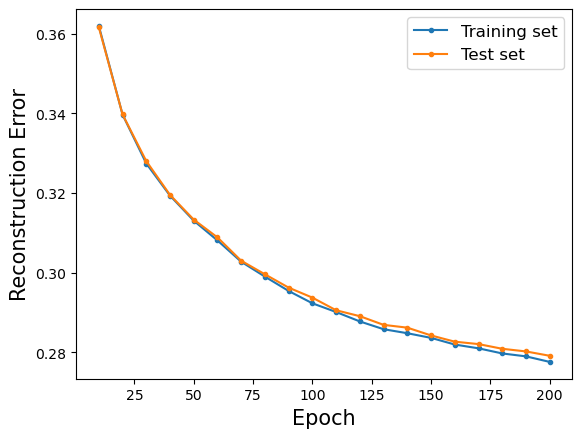

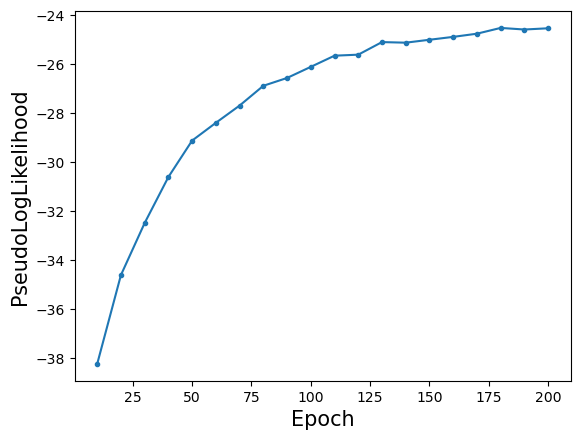

Training RBM 157/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358716 (train), 0.357267 (test), Pseud_Lik: -38.155836, Time: 2.704721, 
Ep 20, Rec er: 0.336906 (train), 0.337507 (test), Pseud_Lik: -33.968318, Time: 1.819691, 
Ep 30, Rec er: 0.326720 (train), 0.327611 (test), Pseud_Lik: -31.913704, Time: 1.901843, 
Ep 40, Rec er: 0.321386 (train), 0.320581 (test), Pseud_Lik: -30.642332, Time: 1.978051, 
Ep 50, Rec er: 0.316165 (train), 0.317356 (test), Pseud_Lik: -29.298980, Time: 2.508484, 
Ep 60, Rec er: 0.311194 (train), 0.311404 (test), Pseud_Lik: -28.685706, Time: 2.227105, 
Ep 70, Rec er: 0.306767 (train), 0.307109 (test), Pseud_Lik: -27.782085, Time: 2.310052, 
Ep 80, Rec er: 0.303297 (train), 0.303223 (test), Pseud_Lik: -27.395408, Time: 2.630157, 
Ep 90, Rec er: 0.299776 (train), 0.300988 (test), Pseud_Lik: -27.037030, Time: 1.797548, 
Ep 100, Rec er: 0.296991 (train), 0.297690 (test), P

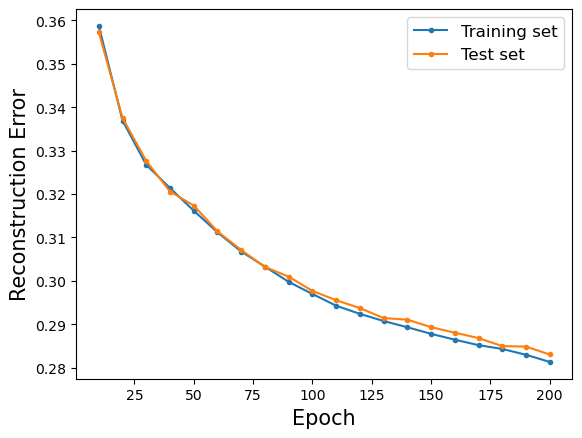

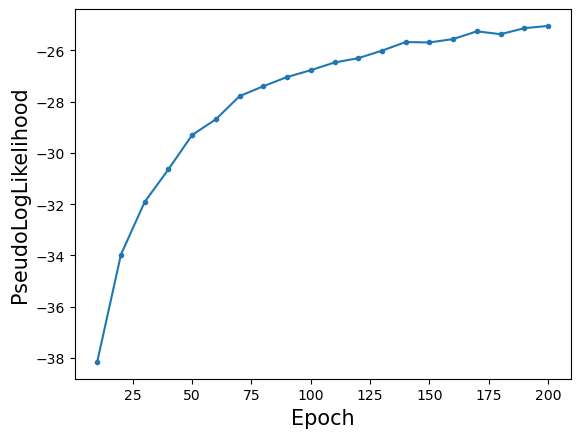

Training RBM 158/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360671 (train), 0.358594 (test), Pseud_Lik: -38.357513, Time: 2.790838, 
Ep 20, Rec er: 0.338215 (train), 0.339284 (test), Pseud_Lik: -34.114279, Time: 1.928113, 
Ep 30, Rec er: 0.328185 (train), 0.327786 (test), Pseud_Lik: -32.138830, Time: 2.207574, 
Ep 40, Rec er: 0.321779 (train), 0.322528 (test), Pseud_Lik: -30.587501, Time: 1.849488, 
Ep 50, Rec er: 0.316440 (train), 0.317013 (test), Pseud_Lik: -29.501855, Time: 3.003054, 
Ep 60, Rec er: 0.311958 (train), 0.313071 (test), Pseud_Lik: -28.595455, Time: 1.994987, 
Ep 70, Rec er: 0.308205 (train), 0.308329 (test), Pseud_Lik: -28.310368, Time: 2.516391, 
Ep 80, Rec er: 0.304354 (train), 0.304952 (test), Pseud_Lik: -27.941522, Time: 1.967342, 
Ep 90, Rec er: 0.301280 (train), 0.302007 (test), Pseud_Lik: -27.567563, Time: 2.643197, 
Ep 100, Rec er: 0.297617 (train), 0.298478 (test), P

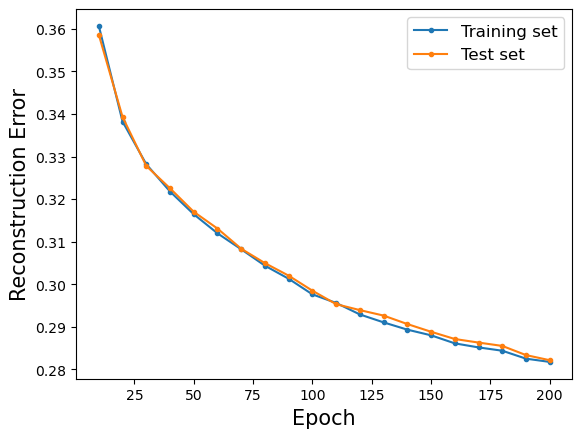

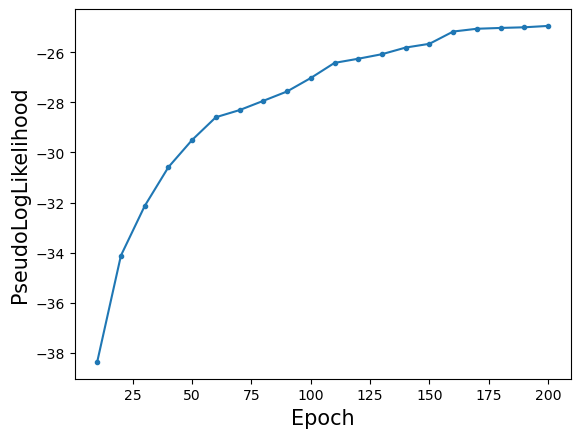

Training RBM 159/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360549 (train), 0.360005 (test), Pseud_Lik: -38.226352, Time: 1.833820, 
Ep 20, Rec er: 0.338208 (train), 0.339041 (test), Pseud_Lik: -34.115239, Time: 1.783700, 
Ep 30, Rec er: 0.327645 (train), 0.327907 (test), Pseud_Lik: -32.236817, Time: 2.278202, 
Ep 40, Rec er: 0.320906 (train), 0.321935 (test), Pseud_Lik: -30.567599, Time: 1.903295, 
Ep 50, Rec er: 0.315639 (train), 0.315811 (test), Pseud_Lik: -29.339833, Time: 2.865370, 
Ep 60, Rec er: 0.310885 (train), 0.311147 (test), Pseud_Lik: -28.605169, Time: 2.042510, 
Ep 70, Rec er: 0.306228 (train), 0.307118 (test), Pseud_Lik: -28.107836, Time: 2.080939, 
Ep 80, Rec er: 0.302402 (train), 0.303300 (test), Pseud_Lik: -27.461706, Time: 1.824554, 
Ep 90, Rec er: 0.298669 (train), 0.299280 (test), Pseud_Lik: -27.186791, Time: 1.758243, 
Ep 100, Rec er: 0.296054 (train), 0.296593 (test), P

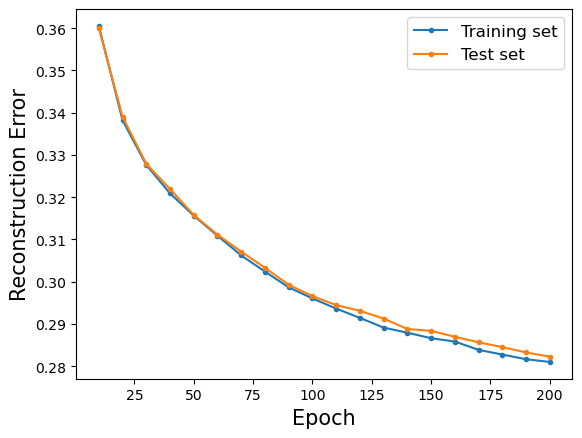

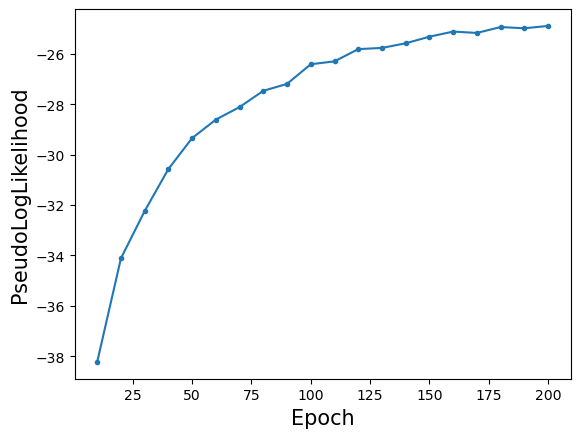

Training RBM 160/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360504 (train), 0.359941 (test), Pseud_Lik: -38.373602, Time: 1.686715, 
Ep 20, Rec er: 0.337859 (train), 0.338072 (test), Pseud_Lik: -34.576284, Time: 2.163452, 
Ep 30, Rec er: 0.326402 (train), 0.327957 (test), Pseud_Lik: -32.142307, Time: 1.674299, 
Ep 40, Rec er: 0.319660 (train), 0.320908 (test), Pseud_Lik: -30.856636, Time: 1.751432, 
Ep 50, Rec er: 0.314221 (train), 0.315190 (test), Pseud_Lik: -29.506547, Time: 1.707918, 
Ep 60, Rec er: 0.309256 (train), 0.309996 (test), Pseud_Lik: -28.471233, Time: 1.688923, 
Ep 70, Rec er: 0.304565 (train), 0.305009 (test), Pseud_Lik: -27.814727, Time: 1.669496, 
Ep 80, Rec er: 0.300129 (train), 0.300935 (test), Pseud_Lik: -27.252682, Time: 2.365011, 
Ep 90, Rec er: 0.296816 (train), 0.297446 (test), Pseud_Lik: -26.796613, Time: 1.695856, 
Ep 100, Rec er: 0.294267 (train), 0.295546 (test), P

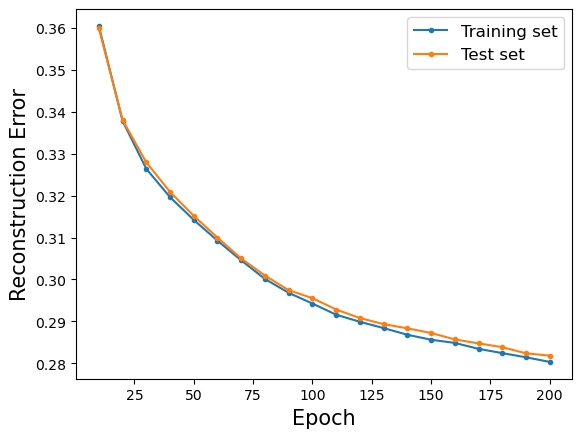

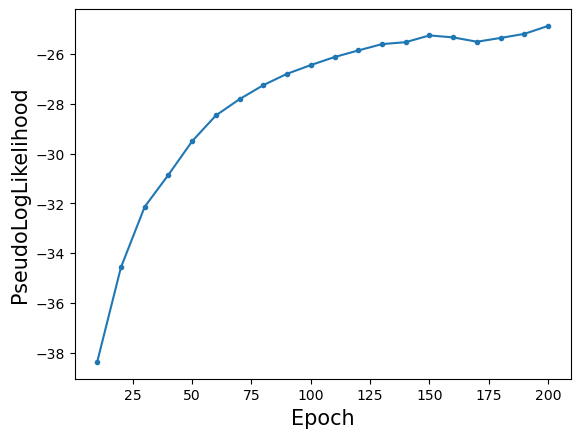

Training RBM 161/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362161 (train), 0.360710 (test), Pseud_Lik: -38.378365, Time: 1.662273, 
Ep 20, Rec er: 0.338031 (train), 0.338478 (test), Pseud_Lik: -34.347430, Time: 1.607414, 
Ep 30, Rec er: 0.326920 (train), 0.327574 (test), Pseud_Lik: -32.460841, Time: 2.317243, 
Ep 40, Rec er: 0.319503 (train), 0.320197 (test), Pseud_Lik: -30.909498, Time: 1.740196, 
Ep 50, Rec er: 0.313320 (train), 0.313951 (test), Pseud_Lik: -29.250062, Time: 1.823421, 
Ep 60, Rec er: 0.308514 (train), 0.308842 (test), Pseud_Lik: -28.218413, Time: 1.738137, 
Ep 70, Rec er: 0.303918 (train), 0.304079 (test), Pseud_Lik: -27.354643, Time: 1.835124, 
Ep 80, Rec er: 0.300064 (train), 0.301126 (test), Pseud_Lik: -26.882635, Time: 1.861987, 
Ep 90, Rec er: 0.296105 (train), 0.297201 (test), Pseud_Lik: -26.500353, Time: 1.889236, 
Ep 100, Rec er: 0.293530 (train), 0.294631 (test), P

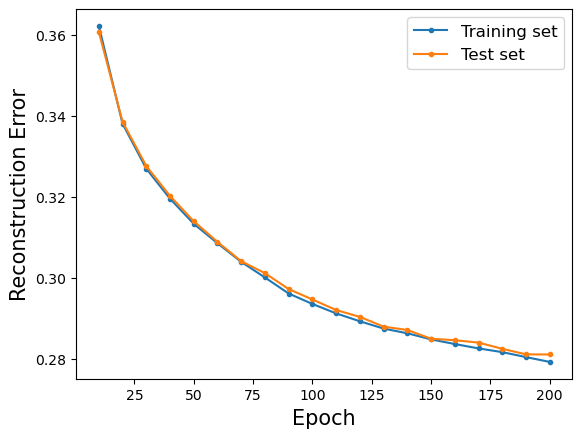

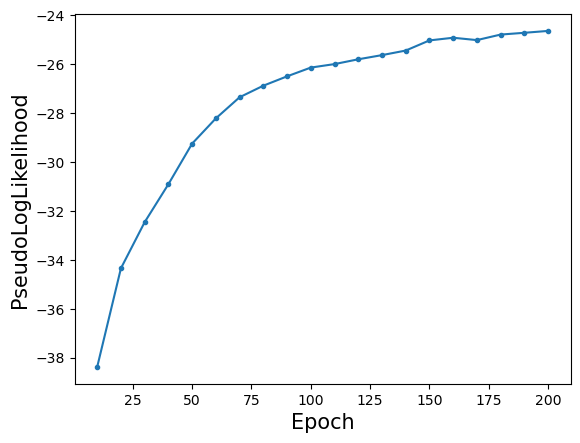

Training RBM 162/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360978 (train), 0.361029 (test), Pseud_Lik: -38.125962, Time: 1.600276, 
Ep 20, Rec er: 0.338439 (train), 0.338519 (test), Pseud_Lik: -34.409585, Time: 1.605038, 
Ep 30, Rec er: 0.327680 (train), 0.327479 (test), Pseud_Lik: -32.525758, Time: 1.611576, 
Ep 40, Rec er: 0.320159 (train), 0.320485 (test), Pseud_Lik: -31.154963, Time: 1.601726, 
Ep 50, Rec er: 0.314862 (train), 0.314279 (test), Pseud_Lik: -29.647725, Time: 1.641585, 
Ep 60, Rec er: 0.309697 (train), 0.310657 (test), Pseud_Lik: -28.623747, Time: 1.624123, 
Ep 70, Rec er: 0.304689 (train), 0.305704 (test), Pseud_Lik: -27.961279, Time: 1.649412, 
Ep 80, Rec er: 0.300906 (train), 0.301855 (test), Pseud_Lik: -27.152261, Time: 1.675587, 
Ep 90, Rec er: 0.297344 (train), 0.298451 (test), Pseud_Lik: -26.885971, Time: 1.640266, 
Ep 100, Rec er: 0.294647 (train), 0.295323 (test), P

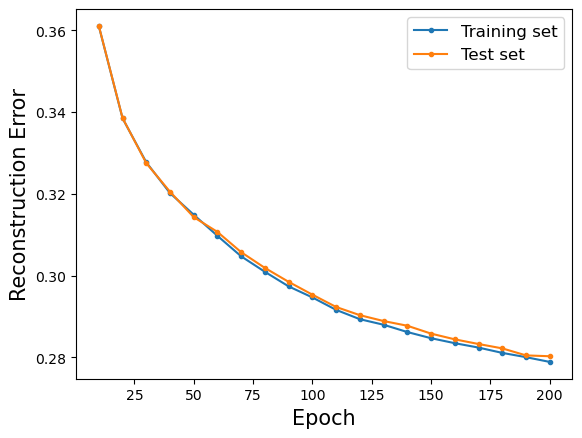

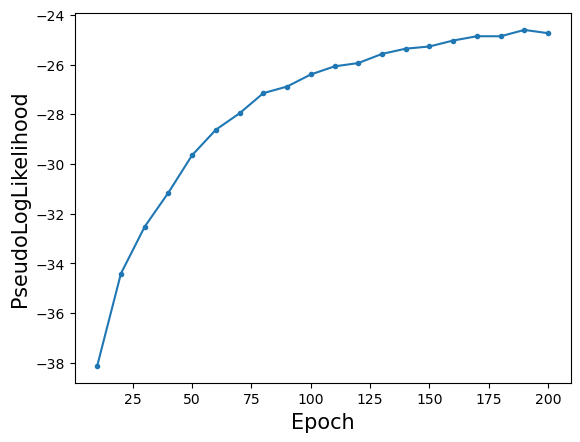

Training RBM 163/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360421 (train), 0.359489 (test), Pseud_Lik: -38.221518, Time: 1.600374, 
Ep 20, Rec er: 0.338680 (train), 0.338817 (test), Pseud_Lik: -34.368651, Time: 1.604806, 
Ep 30, Rec er: 0.327889 (train), 0.328252 (test), Pseud_Lik: -32.609323, Time: 1.643757, 
Ep 40, Rec er: 0.320601 (train), 0.321323 (test), Pseud_Lik: -31.417724, Time: 1.758380, 
Ep 50, Rec er: 0.314733 (train), 0.315737 (test), Pseud_Lik: -29.790371, Time: 1.668402, 
Ep 60, Rec er: 0.309584 (train), 0.309651 (test), Pseud_Lik: -28.704912, Time: 1.692080, 
Ep 70, Rec er: 0.304706 (train), 0.305169 (test), Pseud_Lik: -27.975538, Time: 1.662469, 
Ep 80, Rec er: 0.300676 (train), 0.301387 (test), Pseud_Lik: -27.211285, Time: 1.871958, 
Ep 90, Rec er: 0.296502 (train), 0.297652 (test), Pseud_Lik: -26.635382, Time: 1.731773, 
Ep 100, Rec er: 0.293320 (train), 0.294680 (test), P

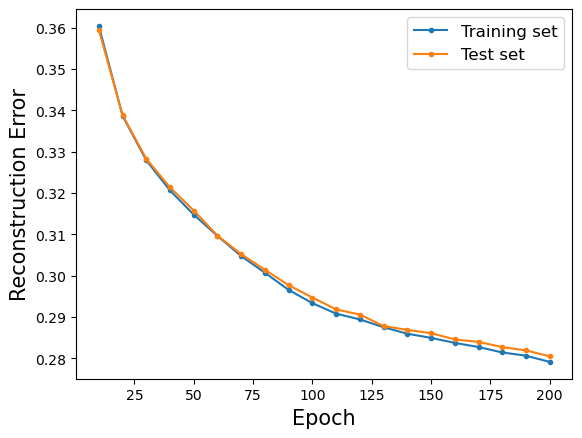

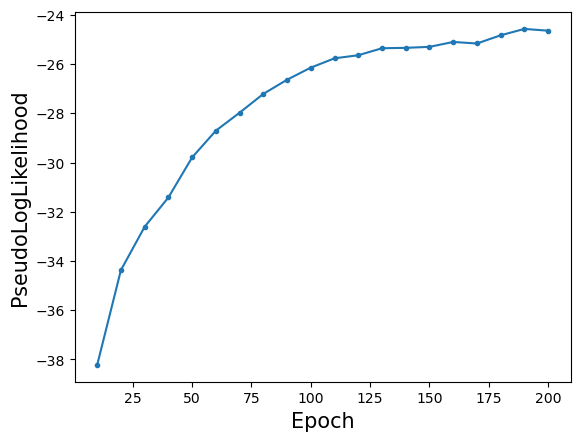

Training RBM 164/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361856 (train), 0.360635 (test), Pseud_Lik: -38.273634, Time: 1.634321, 
Ep 20, Rec er: 0.338499 (train), 0.339809 (test), Pseud_Lik: -34.838266, Time: 1.647592, 
Ep 30, Rec er: 0.326653 (train), 0.327633 (test), Pseud_Lik: -32.464363, Time: 1.659864, 
Ep 40, Rec er: 0.319014 (train), 0.319497 (test), Pseud_Lik: -30.797649, Time: 1.670414, 
Ep 50, Rec er: 0.313497 (train), 0.313984 (test), Pseud_Lik: -29.728753, Time: 1.951800, 
Ep 60, Rec er: 0.308234 (train), 0.308916 (test), Pseud_Lik: -28.706075, Time: 1.812044, 
Ep 70, Rec er: 0.303200 (train), 0.303895 (test), Pseud_Lik: -27.910713, Time: 1.653026, 
Ep 80, Rec er: 0.299160 (train), 0.299681 (test), Pseud_Lik: -27.152950, Time: 1.679715, 
Ep 90, Rec er: 0.295611 (train), 0.296092 (test), Pseud_Lik: -26.680912, Time: 1.787089, 
Ep 100, Rec er: 0.292509 (train), 0.293423 (test), P

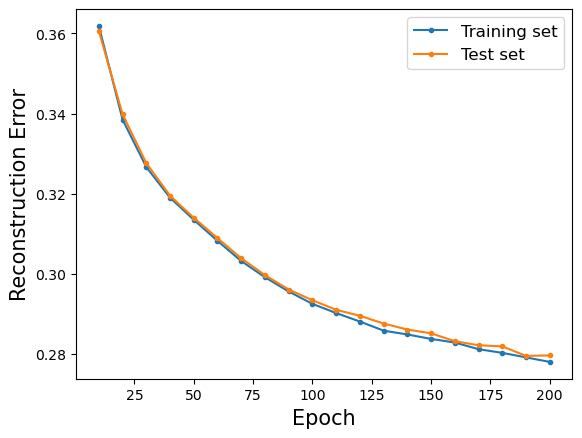

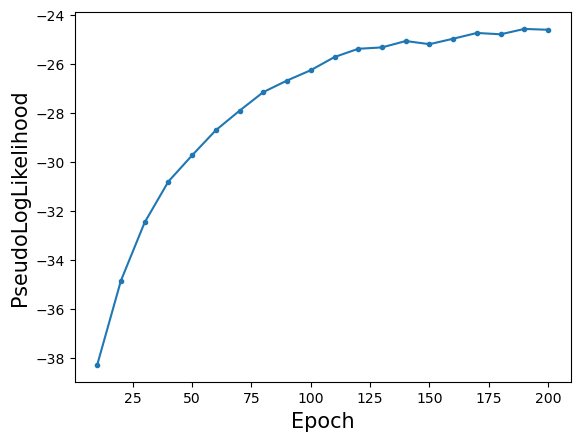

Training RBM 165/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359881 (train), 0.358216 (test), Pseud_Lik: -38.120468, Time: 1.641409, 
Ep 20, Rec er: 0.337985 (train), 0.337827 (test), Pseud_Lik: -34.253608, Time: 1.921910, 
Ep 30, Rec er: 0.327147 (train), 0.327564 (test), Pseud_Lik: -32.515052, Time: 1.653947, 
Ep 40, Rec er: 0.321244 (train), 0.321176 (test), Pseud_Lik: -30.810838, Time: 1.720985, 
Ep 50, Rec er: 0.315277 (train), 0.315949 (test), Pseud_Lik: -29.440958, Time: 2.795294, 
Ep 60, Rec er: 0.310572 (train), 0.311023 (test), Pseud_Lik: -28.808170, Time: 1.981208, 
Ep 70, Rec er: 0.305526 (train), 0.306857 (test), Pseud_Lik: -27.977444, Time: 1.693336, 
Ep 80, Rec er: 0.301500 (train), 0.302053 (test), Pseud_Lik: -27.527746, Time: 1.692723, 
Ep 90, Rec er: 0.298107 (train), 0.298474 (test), Pseud_Lik: -27.025843, Time: 1.867407, 
Ep 100, Rec er: 0.294696 (train), 0.295898 (test), P

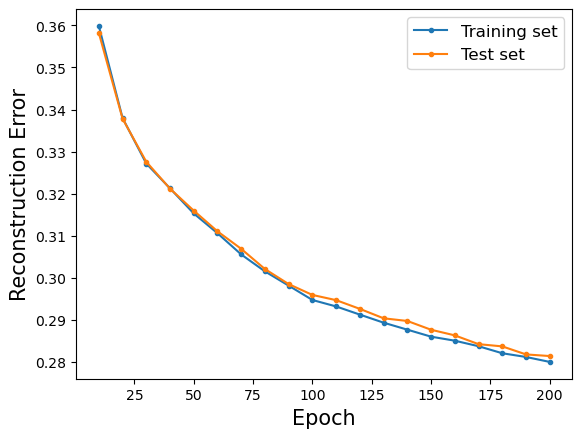

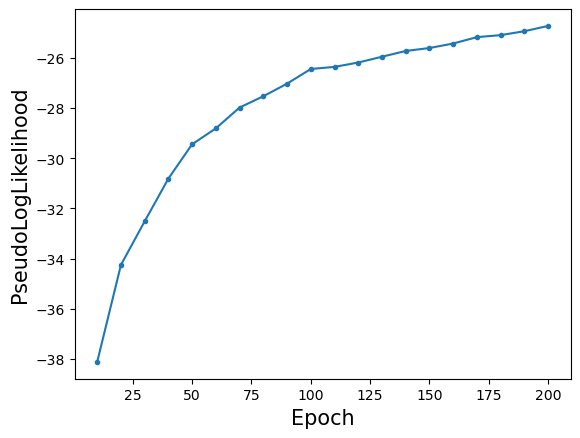

Training RBM 166/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360569 (train), 0.361045 (test), Pseud_Lik: -38.202538, Time: 1.585793, 
Ep 20, Rec er: 0.338578 (train), 0.338531 (test), Pseud_Lik: -34.744038, Time: 1.656057, 
Ep 30, Rec er: 0.327796 (train), 0.328016 (test), Pseud_Lik: -32.684999, Time: 1.675228, 
Ep 40, Rec er: 0.319928 (train), 0.320339 (test), Pseud_Lik: -30.999083, Time: 1.824345, 
Ep 50, Rec er: 0.313869 (train), 0.314159 (test), Pseud_Lik: -29.635620, Time: 1.774324, 
Ep 60, Rec er: 0.308312 (train), 0.309049 (test), Pseud_Lik: -28.878227, Time: 1.808364, 
Ep 70, Rec er: 0.303635 (train), 0.304667 (test), Pseud_Lik: -27.913833, Time: 1.765692, 
Ep 80, Rec er: 0.299683 (train), 0.301440 (test), Pseud_Lik: -27.521819, Time: 1.744237, 
Ep 90, Rec er: 0.296295 (train), 0.297594 (test), Pseud_Lik: -26.913786, Time: 1.688001, 
Ep 100, Rec er: 0.293108 (train), 0.293697 (test), P

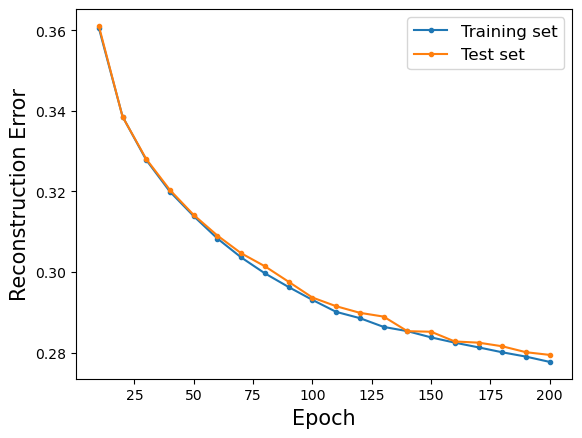

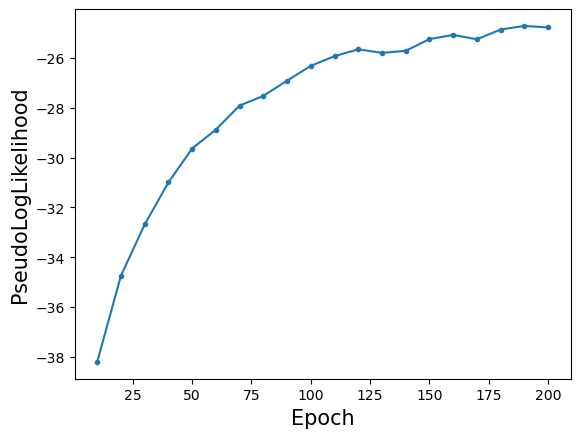

Training RBM 167/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362574 (train), 0.361955 (test), Pseud_Lik: -38.596702, Time: 1.643875, 
Ep 20, Rec er: 0.338811 (train), 0.339667 (test), Pseud_Lik: -34.651978, Time: 1.618624, 
Ep 30, Rec er: 0.326717 (train), 0.327882 (test), Pseud_Lik: -32.202177, Time: 1.646837, 
Ep 40, Rec er: 0.318885 (train), 0.319638 (test), Pseud_Lik: -30.269097, Time: 1.703247, 
Ep 50, Rec er: 0.313144 (train), 0.313723 (test), Pseud_Lik: -29.430889, Time: 1.958940, 
Ep 60, Rec er: 0.307927 (train), 0.307914 (test), Pseud_Lik: -28.519141, Time: 1.772225, 
Ep 70, Rec er: 0.303946 (train), 0.304279 (test), Pseud_Lik: -27.721927, Time: 1.655700, 
Ep 80, Rec er: 0.299696 (train), 0.301399 (test), Pseud_Lik: -27.112657, Time: 1.727785, 
Ep 90, Rec er: 0.296440 (train), 0.296908 (test), Pseud_Lik: -26.698185, Time: 1.886182, 
Ep 100, Rec er: 0.293906 (train), 0.293992 (test), P

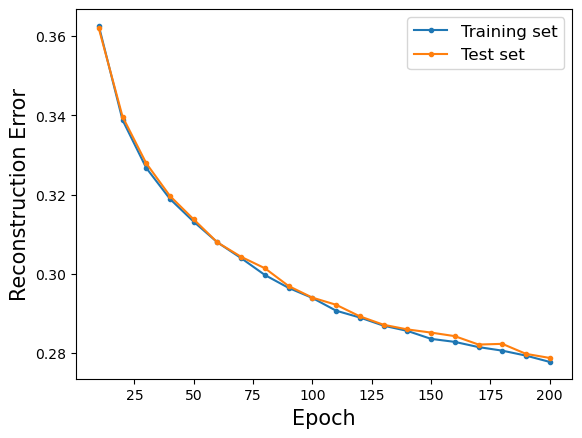

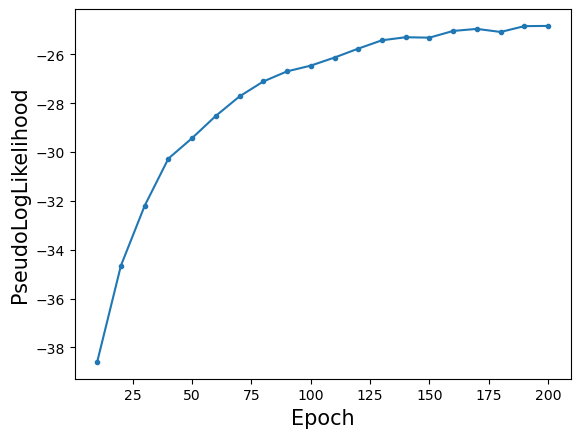

Training RBM 168/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361326 (train), 0.360674 (test), Pseud_Lik: -38.289845, Time: 1.649636, 
Ep 20, Rec er: 0.339257 (train), 0.339790 (test), Pseud_Lik: -34.444875, Time: 1.717464, 
Ep 30, Rec er: 0.328255 (train), 0.328486 (test), Pseud_Lik: -32.436808, Time: 1.919708, 
Ep 40, Rec er: 0.320521 (train), 0.321414 (test), Pseud_Lik: -30.972031, Time: 1.695924, 
Ep 50, Rec er: 0.314927 (train), 0.315039 (test), Pseud_Lik: -29.565830, Time: 1.702792, 
Ep 60, Rec er: 0.309876 (train), 0.310342 (test), Pseud_Lik: -28.734941, Time: 1.679016, 
Ep 70, Rec er: 0.304919 (train), 0.305664 (test), Pseud_Lik: -28.092345, Time: 1.767245, 
Ep 80, Rec er: 0.300152 (train), 0.302154 (test), Pseud_Lik: -27.808908, Time: 1.750646, 
Ep 90, Rec er: 0.297702 (train), 0.297804 (test), Pseud_Lik: -26.893483, Time: 1.732255, 
Ep 100, Rec er: 0.293821 (train), 0.295096 (test), P

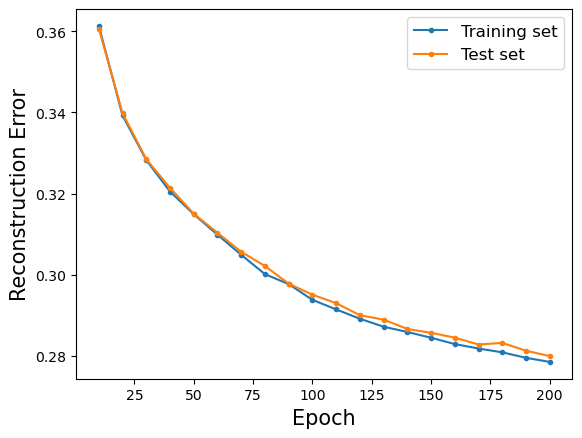

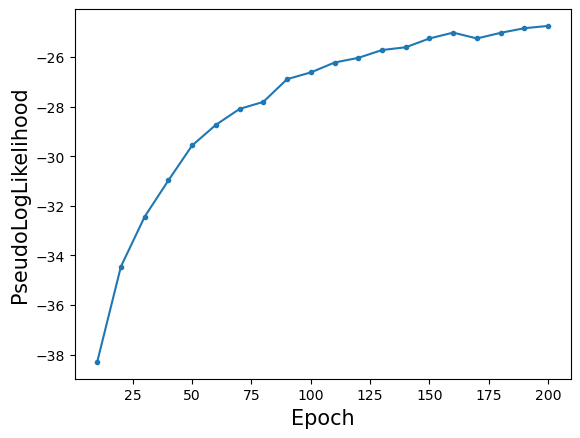

Training RBM 169/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.363369 (train), 0.362595 (test), Pseud_Lik: -38.370843, Time: 2.361419, 
Ep 20, Rec er: 0.339363 (train), 0.339626 (test), Pseud_Lik: -34.441349, Time: 1.666986, 
Ep 30, Rec er: 0.328104 (train), 0.329330 (test), Pseud_Lik: -32.807802, Time: 2.377040, 
Ep 40, Rec er: 0.321365 (train), 0.321782 (test), Pseud_Lik: -31.229322, Time: 1.703839, 
Ep 50, Rec er: 0.315891 (train), 0.315552 (test), Pseud_Lik: -29.950122, Time: 1.825322, 
Ep 60, Rec er: 0.310162 (train), 0.311325 (test), Pseud_Lik: -28.848386, Time: 1.754354, 
Ep 70, Rec er: 0.305016 (train), 0.305470 (test), Pseud_Lik: -28.037055, Time: 2.028923, 
Ep 80, Rec er: 0.300738 (train), 0.301133 (test), Pseud_Lik: -27.367046, Time: 1.844940, 
Ep 90, Rec er: 0.297112 (train), 0.297504 (test), Pseud_Lik: -26.915492, Time: 1.879892, 
Ep 100, Rec er: 0.293765 (train), 0.294290 (test), P

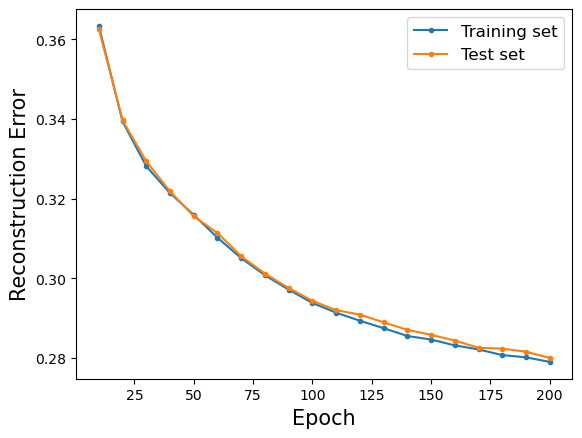

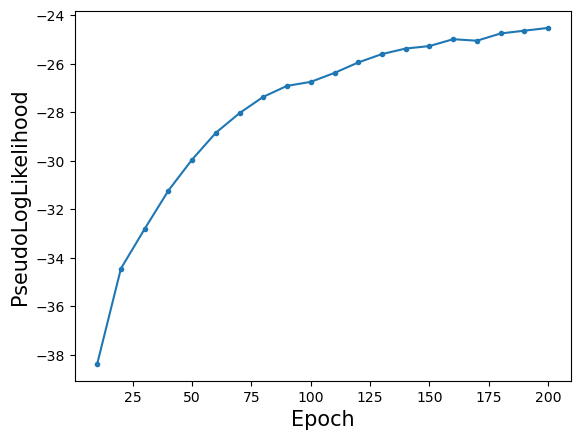

Training RBM 170/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361171 (train), 0.360612 (test), Pseud_Lik: -38.308516, Time: 2.263479, 
Ep 20, Rec er: 0.339294 (train), 0.339592 (test), Pseud_Lik: -34.497333, Time: 1.690506, 
Ep 30, Rec er: 0.327150 (train), 0.327371 (test), Pseud_Lik: -32.237471, Time: 1.684146, 
Ep 40, Rec er: 0.319088 (train), 0.319194 (test), Pseud_Lik: -30.565642, Time: 1.715358, 
Ep 50, Rec er: 0.313052 (train), 0.313419 (test), Pseud_Lik: -29.409037, Time: 2.002089, 
Ep 60, Rec er: 0.308015 (train), 0.308324 (test), Pseud_Lik: -28.420187, Time: 1.725055, 
Ep 70, Rec er: 0.303298 (train), 0.304312 (test), Pseud_Lik: -27.705890, Time: 1.978073, 
Ep 80, Rec er: 0.299613 (train), 0.300932 (test), Pseud_Lik: -27.309180, Time: 1.674036, 
Ep 90, Rec er: 0.295954 (train), 0.296801 (test), Pseud_Lik: -26.969641, Time: 1.749343, 
Ep 100, Rec er: 0.293407 (train), 0.294185 (test), P

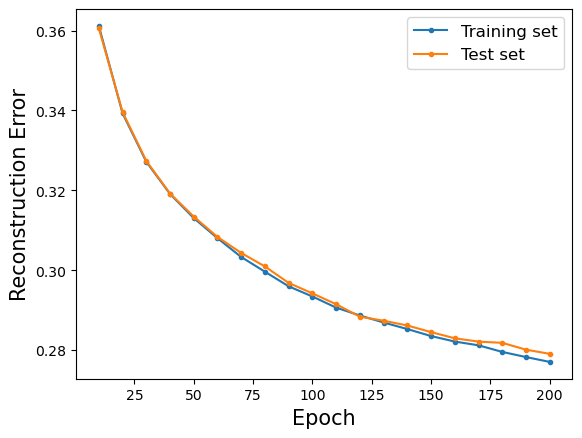

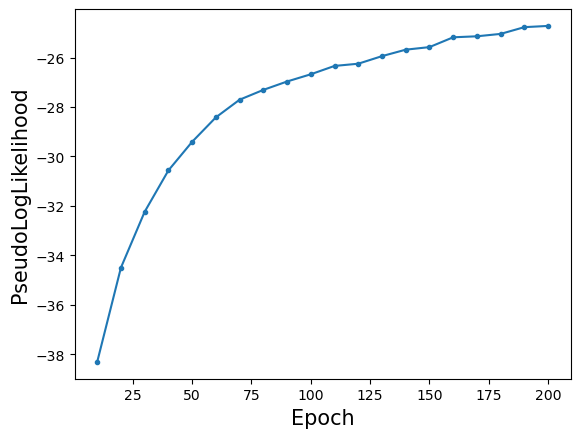

Training RBM 171/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359890 (train), 0.359539 (test), Pseud_Lik: -38.202804, Time: 2.142713, 
Ep 20, Rec er: 0.337668 (train), 0.337989 (test), Pseud_Lik: -34.050879, Time: 1.695824, 
Ep 30, Rec er: 0.327444 (train), 0.327952 (test), Pseud_Lik: -32.084523, Time: 1.789346, 
Ep 40, Rec er: 0.320786 (train), 0.321539 (test), Pseud_Lik: -30.595880, Time: 2.198715, 
Ep 50, Rec er: 0.315754 (train), 0.316574 (test), Pseud_Lik: -29.526769, Time: 2.708532, 
Ep 60, Rec er: 0.311754 (train), 0.312095 (test), Pseud_Lik: -28.841203, Time: 1.886271, 
Ep 70, Rec er: 0.307651 (train), 0.308906 (test), Pseud_Lik: -28.094920, Time: 1.850589, 
Ep 80, Rec er: 0.303896 (train), 0.304998 (test), Pseud_Lik: -27.620101, Time: 1.834313, 
Ep 90, Rec er: 0.300707 (train), 0.301715 (test), Pseud_Lik: -27.206523, Time: 1.733103, 
Ep 100, Rec er: 0.298192 (train), 0.299392 (test), P

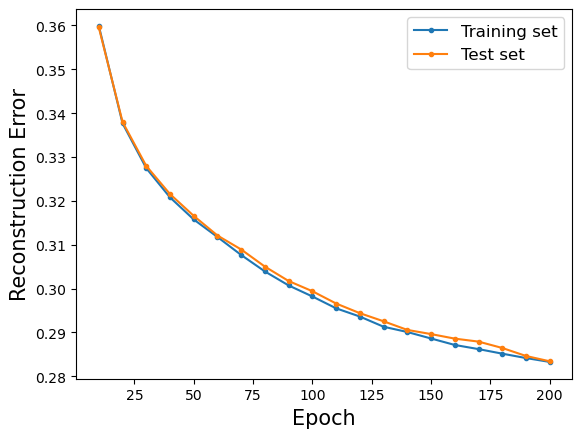

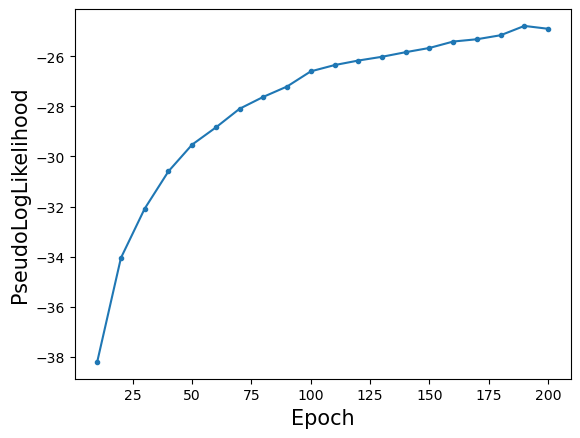

Training RBM 172/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359139 (train), 0.357913 (test), Pseud_Lik: -38.121935, Time: 1.650316, 
Ep 20, Rec er: 0.337247 (train), 0.336121 (test), Pseud_Lik: -33.960240, Time: 1.670287, 
Ep 30, Rec er: 0.327718 (train), 0.327318 (test), Pseud_Lik: -32.324652, Time: 1.627971, 
Ep 40, Rec er: 0.322296 (train), 0.321857 (test), Pseud_Lik: -30.773289, Time: 1.913843, 
Ep 50, Rec er: 0.316322 (train), 0.318009 (test), Pseud_Lik: -29.733716, Time: 1.675470, 
Ep 60, Rec er: 0.311596 (train), 0.313012 (test), Pseud_Lik: -29.299177, Time: 1.687021, 
Ep 70, Rec er: 0.307562 (train), 0.307774 (test), Pseud_Lik: -28.568933, Time: 1.686788, 
Ep 80, Rec er: 0.303574 (train), 0.304318 (test), Pseud_Lik: -28.018889, Time: 1.704201, 
Ep 90, Rec er: 0.300356 (train), 0.300782 (test), Pseud_Lik: -27.475472, Time: 2.007125, 
Ep 100, Rec er: 0.296653 (train), 0.297552 (test), P

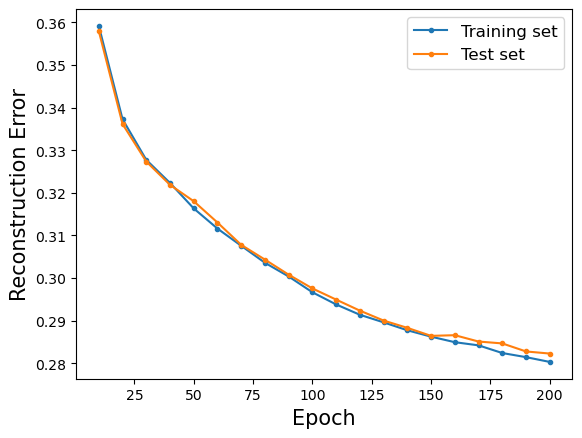

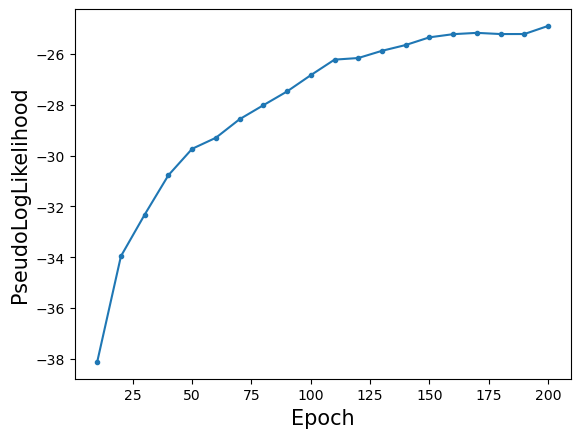

Training RBM 173/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360302 (train), 0.359738 (test), Pseud_Lik: -38.171210, Time: 1.686699, 
Ep 20, Rec er: 0.338630 (train), 0.339605 (test), Pseud_Lik: -34.241917, Time: 1.717388, 
Ep 30, Rec er: 0.327531 (train), 0.328142 (test), Pseud_Lik: -32.170440, Time: 1.970968, 
Ep 40, Rec er: 0.320669 (train), 0.320868 (test), Pseud_Lik: -30.610638, Time: 2.217780, 
Ep 50, Rec er: 0.314629 (train), 0.315417 (test), Pseud_Lik: -29.457177, Time: 2.285058, 
Ep 60, Rec er: 0.309747 (train), 0.311034 (test), Pseud_Lik: -28.345012, Time: 1.712760, 
Ep 70, Rec er: 0.305600 (train), 0.306591 (test), Pseud_Lik: -27.869180, Time: 1.756506, 
Ep 80, Rec er: 0.301398 (train), 0.302613 (test), Pseud_Lik: -27.409886, Time: 2.478983, 
Ep 90, Rec er: 0.298116 (train), 0.298700 (test), Pseud_Lik: -26.864678, Time: 2.117375, 
Ep 100, Rec er: 0.295727 (train), 0.296803 (test), P

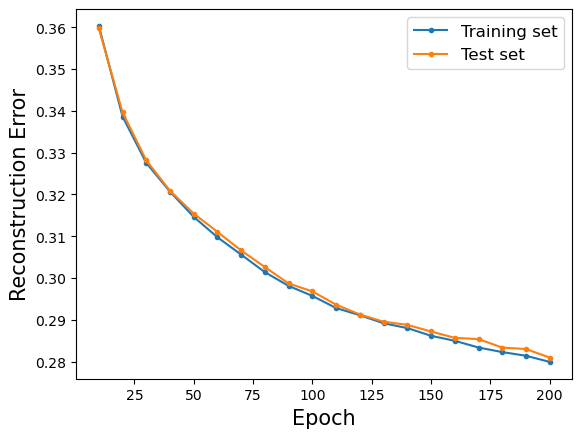

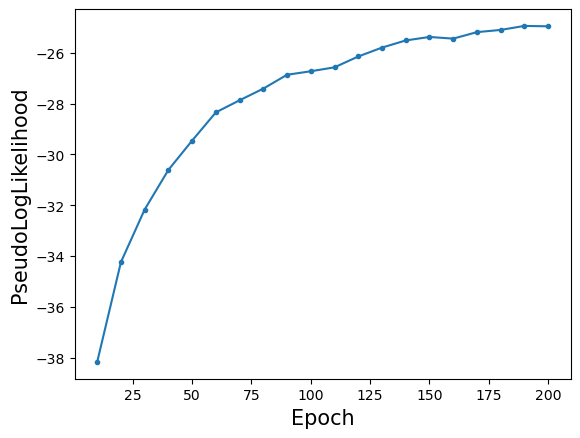

Training RBM 174/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359476 (train), 0.360066 (test), Pseud_Lik: -38.289248, Time: 2.185758, 
Ep 20, Rec er: 0.338045 (train), 0.339120 (test), Pseud_Lik: -34.190210, Time: 1.674394, 
Ep 30, Rec er: 0.326983 (train), 0.327693 (test), Pseud_Lik: -32.370869, Time: 1.639751, 
Ep 40, Rec er: 0.320357 (train), 0.321819 (test), Pseud_Lik: -30.789179, Time: 1.756210, 
Ep 50, Rec er: 0.315254 (train), 0.316500 (test), Pseud_Lik: -29.505515, Time: 1.788822, 
Ep 60, Rec er: 0.310123 (train), 0.311769 (test), Pseud_Lik: -28.474264, Time: 1.664214, 
Ep 70, Rec er: 0.305855 (train), 0.305588 (test), Pseud_Lik: -27.846502, Time: 1.683433, 
Ep 80, Rec er: 0.302242 (train), 0.303017 (test), Pseud_Lik: -27.195868, Time: 2.545734, 
Ep 90, Rec er: 0.298949 (train), 0.299824 (test), Pseud_Lik: -26.743986, Time: 1.761493, 
Ep 100, Rec er: 0.295755 (train), 0.296935 (test), P

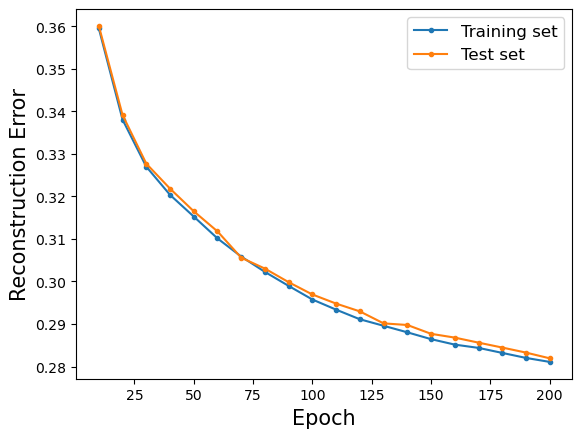

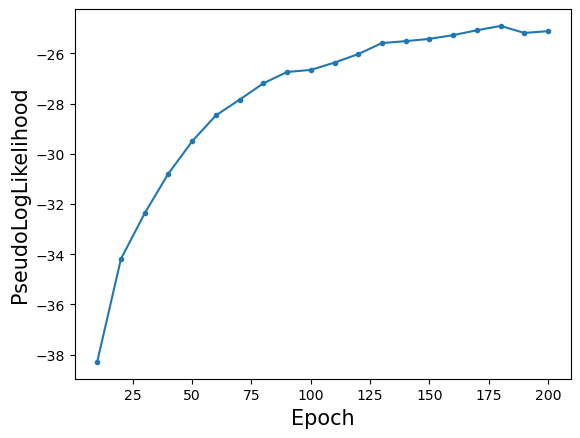

Training RBM 175/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360043 (train), 0.359641 (test), Pseud_Lik: -38.137158, Time: 1.997509, 
Ep 20, Rec er: 0.338899 (train), 0.338649 (test), Pseud_Lik: -34.032435, Time: 1.694566, 
Ep 30, Rec er: 0.329158 (train), 0.329226 (test), Pseud_Lik: -32.126927, Time: 1.919713, 
Ep 40, Rec er: 0.322868 (train), 0.323147 (test), Pseud_Lik: -30.804537, Time: 1.829632, 
Ep 50, Rec er: 0.317949 (train), 0.317899 (test), Pseud_Lik: -29.916939, Time: 3.030041, 
Ep 60, Rec er: 0.312485 (train), 0.314007 (test), Pseud_Lik: -28.763607, Time: 1.888789, 
Ep 70, Rec er: 0.308670 (train), 0.308576 (test), Pseud_Lik: -28.214141, Time: 1.722906, 
Ep 80, Rec er: 0.304253 (train), 0.306165 (test), Pseud_Lik: -27.620349, Time: 1.766773, 
Ep 90, Rec er: 0.301089 (train), 0.301755 (test), Pseud_Lik: -27.233030, Time: 1.752242, 
Ep 100, Rec er: 0.298611 (train), 0.298557 (test), P

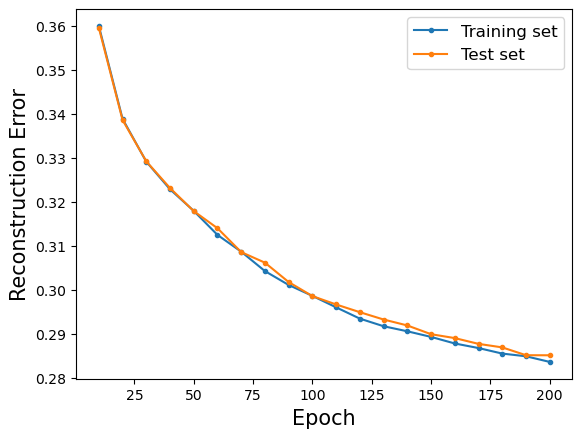

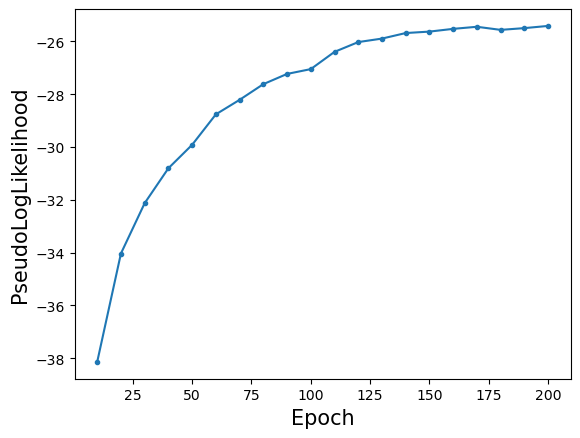

Training RBM 176/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358932 (train), 0.358660 (test), Pseud_Lik: -38.019978, Time: 1.664553, 
Ep 20, Rec er: 0.338413 (train), 0.337813 (test), Pseud_Lik: -33.807070, Time: 2.550314, 
Ep 30, Rec er: 0.328810 (train), 0.330164 (test), Pseud_Lik: -31.975993, Time: 1.861429, 
Ep 40, Rec er: 0.323307 (train), 0.323867 (test), Pseud_Lik: -30.998326, Time: 2.800054, 
Ep 50, Rec er: 0.318367 (train), 0.318637 (test), Pseud_Lik: -30.158818, Time: 2.278713, 
Ep 60, Rec er: 0.313609 (train), 0.314851 (test), Pseud_Lik: -29.234670, Time: 1.700671, 
Ep 70, Rec er: 0.309443 (train), 0.309813 (test), Pseud_Lik: -28.755566, Time: 1.817223, 
Ep 80, Rec er: 0.305428 (train), 0.305924 (test), Pseud_Lik: -28.384862, Time: 1.777624, 
Ep 90, Rec er: 0.302053 (train), 0.302899 (test), Pseud_Lik: -27.944666, Time: 1.749269, 
Ep 100, Rec er: 0.298936 (train), 0.299099 (test), P

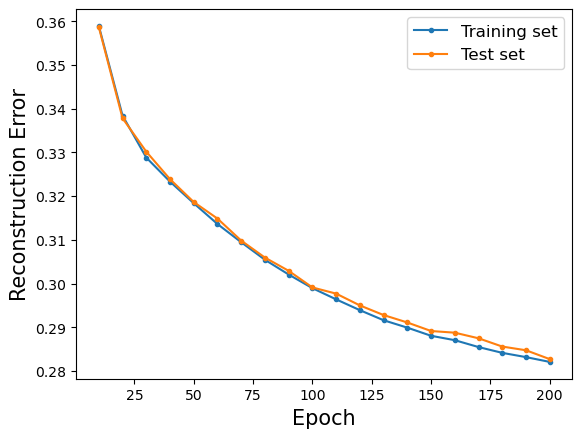

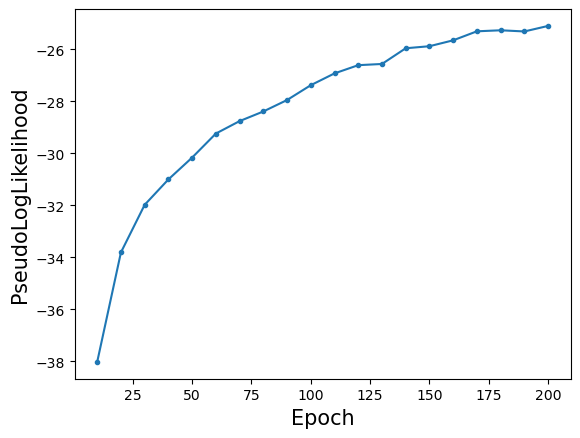

Training RBM 177/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360516 (train), 0.360080 (test), Pseud_Lik: -38.149248, Time: 1.762280, 
Ep 20, Rec er: 0.338811 (train), 0.339078 (test), Pseud_Lik: -34.504296, Time: 1.629211, 
Ep 30, Rec er: 0.327329 (train), 0.327129 (test), Pseud_Lik: -32.179178, Time: 2.188424, 
Ep 40, Rec er: 0.319116 (train), 0.320061 (test), Pseud_Lik: -30.180647, Time: 1.717383, 
Ep 50, Rec er: 0.313336 (train), 0.314041 (test), Pseud_Lik: -28.977636, Time: 1.708140, 
Ep 60, Rec er: 0.308424 (train), 0.308903 (test), Pseud_Lik: -28.267151, Time: 1.709612, 
Ep 70, Rec er: 0.303975 (train), 0.304779 (test), Pseud_Lik: -27.842969, Time: 2.370137, 
Ep 80, Rec er: 0.300323 (train), 0.300663 (test), Pseud_Lik: -27.288556, Time: 2.363662, 
Ep 90, Rec er: 0.296948 (train), 0.297683 (test), Pseud_Lik: -26.643394, Time: 1.700034, 
Ep 100, Rec er: 0.294171 (train), 0.294772 (test), P

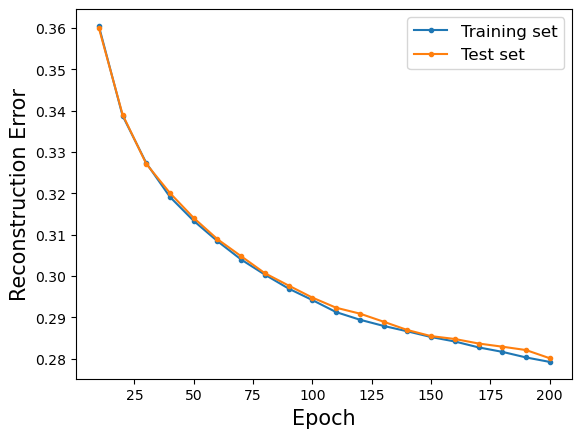

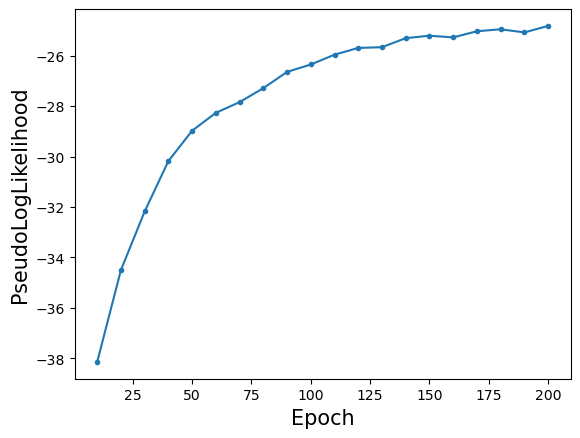

Training RBM 178/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361496 (train), 0.360514 (test), Pseud_Lik: -38.426203, Time: 1.698764, 
Ep 20, Rec er: 0.337492 (train), 0.338082 (test), Pseud_Lik: -34.401323, Time: 1.636004, 
Ep 30, Rec er: 0.326473 (train), 0.327373 (test), Pseud_Lik: -32.053576, Time: 1.647153, 
Ep 40, Rec er: 0.319857 (train), 0.321191 (test), Pseud_Lik: -30.612015, Time: 1.790278, 
Ep 50, Rec er: 0.315133 (train), 0.315795 (test), Pseud_Lik: -29.359835, Time: 1.717451, 
Ep 60, Rec er: 0.309727 (train), 0.310567 (test), Pseud_Lik: -28.881796, Time: 2.856299, 
Ep 70, Rec er: 0.305736 (train), 0.306236 (test), Pseud_Lik: -28.064976, Time: 1.685041, 
Ep 80, Rec er: 0.301464 (train), 0.301805 (test), Pseud_Lik: -27.299022, Time: 2.416083, 
Ep 90, Rec er: 0.298337 (train), 0.300052 (test), Pseud_Lik: -26.909087, Time: 2.369183, 
Ep 100, Rec er: 0.294988 (train), 0.296376 (test), P

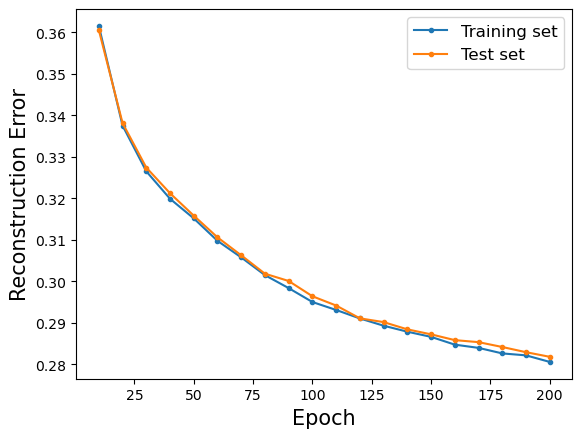

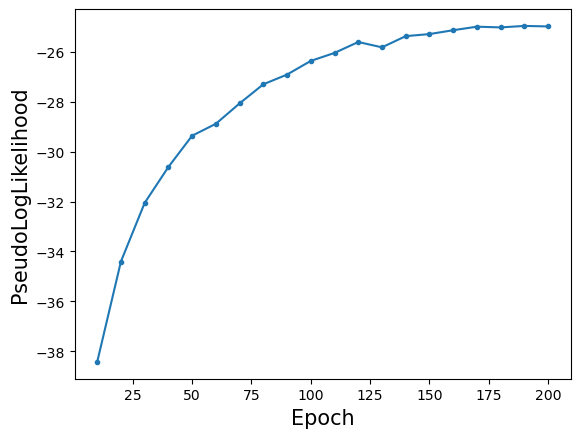

Training RBM 179/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361579 (train), 0.361182 (test), Pseud_Lik: -38.388306, Time: 1.696204, 
Ep 20, Rec er: 0.338892 (train), 0.339230 (test), Pseud_Lik: -34.399067, Time: 1.959865, 
Ep 30, Rec er: 0.327222 (train), 0.327646 (test), Pseud_Lik: -32.395634, Time: 1.681970, 
Ep 40, Rec er: 0.319596 (train), 0.320948 (test), Pseud_Lik: -30.559073, Time: 1.760116, 
Ep 50, Rec er: 0.314111 (train), 0.314225 (test), Pseud_Lik: -29.421775, Time: 2.112041, 
Ep 60, Rec er: 0.308891 (train), 0.309109 (test), Pseud_Lik: -28.385523, Time: 1.718450, 
Ep 70, Rec er: 0.304300 (train), 0.305508 (test), Pseud_Lik: -27.607634, Time: 1.719223, 
Ep 80, Rec er: 0.300087 (train), 0.301035 (test), Pseud_Lik: -27.299698, Time: 1.697151, 
Ep 90, Rec er: 0.296391 (train), 0.297459 (test), Pseud_Lik: -26.517615, Time: 1.894402, 
Ep 100, Rec er: 0.293664 (train), 0.293689 (test), P

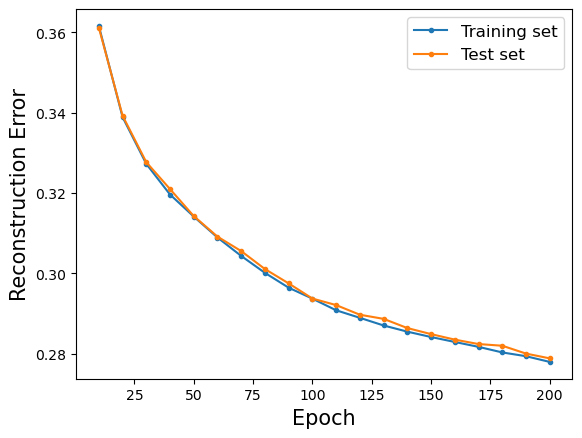

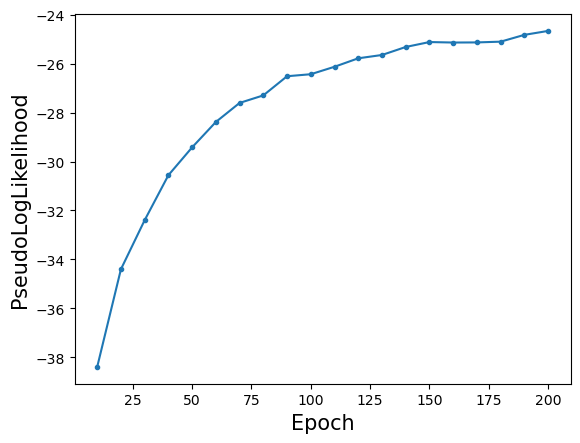

Training RBM 180/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362025 (train), 0.362328 (test), Pseud_Lik: -38.370124, Time: 1.687997, 
Ep 20, Rec er: 0.338872 (train), 0.338456 (test), Pseud_Lik: -34.426869, Time: 1.663514, 
Ep 30, Rec er: 0.327997 (train), 0.328619 (test), Pseud_Lik: -32.417460, Time: 1.650961, 
Ep 40, Rec er: 0.320752 (train), 0.322185 (test), Pseud_Lik: -30.510171, Time: 2.882006, 
Ep 50, Rec er: 0.315592 (train), 0.315696 (test), Pseud_Lik: -29.466524, Time: 1.766264, 
Ep 60, Rec er: 0.311115 (train), 0.311399 (test), Pseud_Lik: -28.363338, Time: 1.727944, 
Ep 70, Rec er: 0.306124 (train), 0.306972 (test), Pseud_Lik: -27.907530, Time: 1.884787, 
Ep 80, Rec er: 0.302249 (train), 0.303251 (test), Pseud_Lik: -27.348130, Time: 2.150211, 
Ep 90, Rec er: 0.298642 (train), 0.299409 (test), Pseud_Lik: -26.828619, Time: 1.772651, 
Ep 100, Rec er: 0.296081 (train), 0.296943 (test), P

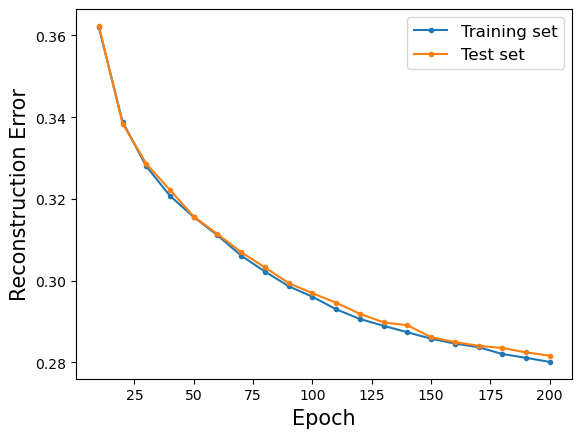

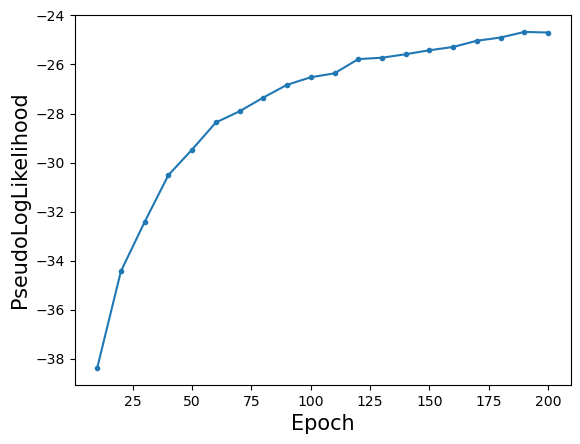

Training RBM 181/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359603 (train), 0.359636 (test), Pseud_Lik: -38.419778, Time: 1.747251, 
Ep 20, Rec er: 0.338215 (train), 0.338207 (test), Pseud_Lik: -33.828203, Time: 1.709772, 
Ep 30, Rec er: 0.328884 (train), 0.329688 (test), Pseud_Lik: -32.022387, Time: 1.857433, 
Ep 40, Rec er: 0.323775 (train), 0.324347 (test), Pseud_Lik: -30.982488, Time: 1.774629, 
Ep 50, Rec er: 0.319310 (train), 0.318605 (test), Pseud_Lik: -30.495117, Time: 2.497409, 
Ep 60, Rec er: 0.314162 (train), 0.314987 (test), Pseud_Lik: -29.464443, Time: 2.300461, 
Ep 70, Rec er: 0.309700 (train), 0.310882 (test), Pseud_Lik: -28.531907, Time: 1.849360, 
Ep 80, Rec er: 0.305349 (train), 0.306377 (test), Pseud_Lik: -27.905541, Time: 2.075615, 
Ep 90, Rec er: 0.301845 (train), 0.302606 (test), Pseud_Lik: -27.336572, Time: 1.774952, 
Ep 100, Rec er: 0.299242 (train), 0.299946 (test), P

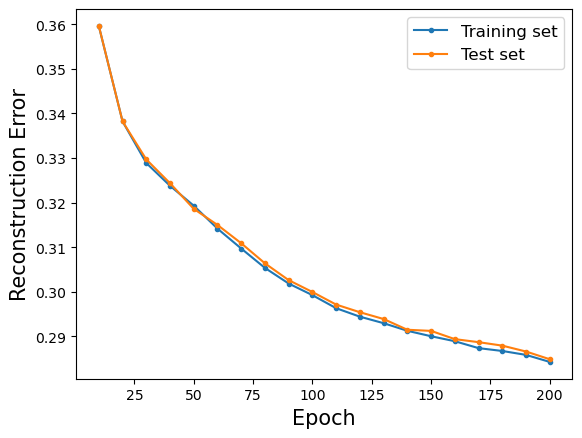

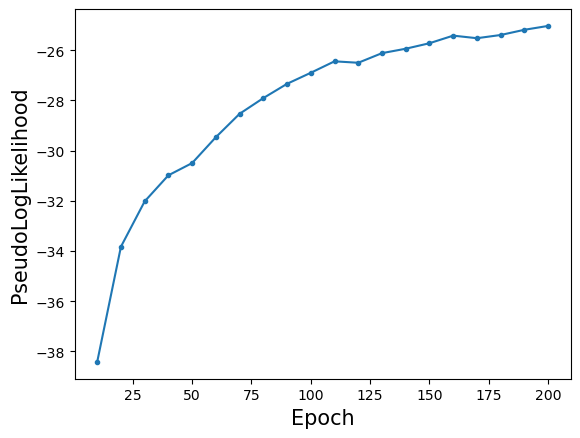

Training RBM 182/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361242 (train), 0.360893 (test), Pseud_Lik: -38.383548, Time: 1.677202, 
Ep 20, Rec er: 0.338352 (train), 0.337803 (test), Pseud_Lik: -34.103869, Time: 1.818020, 
Ep 30, Rec er: 0.327323 (train), 0.328401 (test), Pseud_Lik: -32.373724, Time: 2.355505, 
Ep 40, Rec er: 0.320516 (train), 0.322247 (test), Pseud_Lik: -30.541915, Time: 1.679609, 
Ep 50, Rec er: 0.316228 (train), 0.316657 (test), Pseud_Lik: -29.597078, Time: 1.710668, 
Ep 60, Rec er: 0.311194 (train), 0.311821 (test), Pseud_Lik: -28.727167, Time: 1.855444, 
Ep 70, Rec er: 0.306875 (train), 0.307210 (test), Pseud_Lik: -28.229203, Time: 1.748756, 
Ep 80, Rec er: 0.302912 (train), 0.303908 (test), Pseud_Lik: -27.750926, Time: 2.164941, 
Ep 90, Rec er: 0.299310 (train), 0.300571 (test), Pseud_Lik: -27.263542, Time: 1.756698, 
Ep 100, Rec er: 0.296795 (train), 0.297839 (test), P

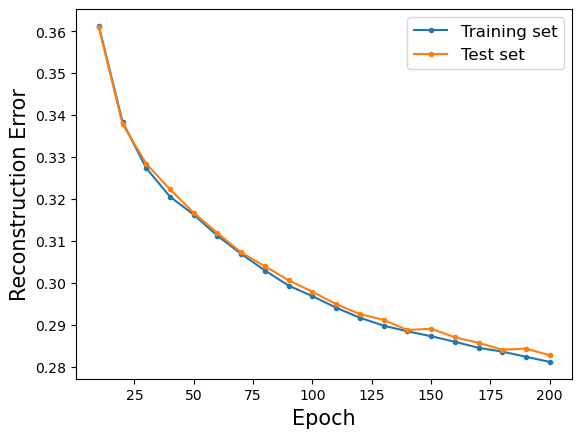

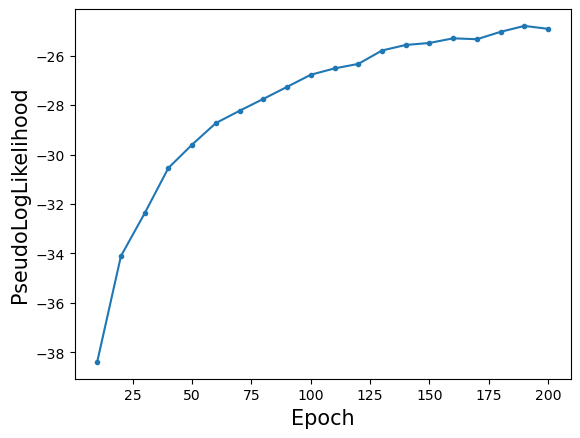

Training RBM 183/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362330 (train), 0.361737 (test), Pseud_Lik: -38.427097, Time: 1.961766, 
Ep 20, Rec er: 0.339637 (train), 0.339736 (test), Pseud_Lik: -34.715119, Time: 1.812654, 
Ep 30, Rec er: 0.327350 (train), 0.327982 (test), Pseud_Lik: -32.541890, Time: 2.579456, 
Ep 40, Rec er: 0.319182 (train), 0.319643 (test), Pseud_Lik: -30.990860, Time: 1.826136, 
Ep 50, Rec er: 0.313090 (train), 0.314112 (test), Pseud_Lik: -29.527521, Time: 1.829398, 
Ep 60, Rec er: 0.308139 (train), 0.308508 (test), Pseud_Lik: -28.376067, Time: 1.754236, 
Ep 70, Rec er: 0.302447 (train), 0.303878 (test), Pseud_Lik: -27.796596, Time: 1.784134, 
Ep 80, Rec er: 0.299004 (train), 0.299629 (test), Pseud_Lik: -27.194389, Time: 1.808709, 
Ep 90, Rec er: 0.294716 (train), 0.296326 (test), Pseud_Lik: -26.491114, Time: 2.025439, 
Ep 100, Rec er: 0.292450 (train), 0.292890 (test), P

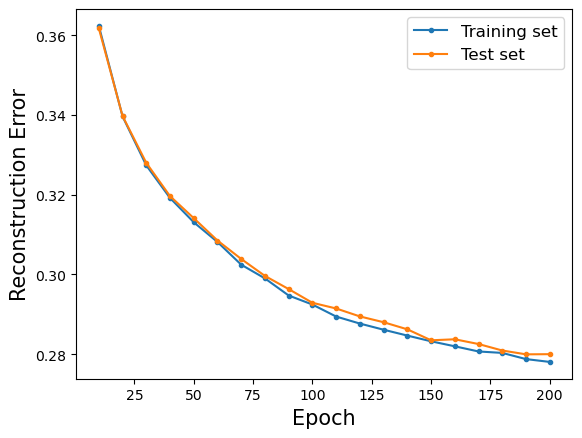

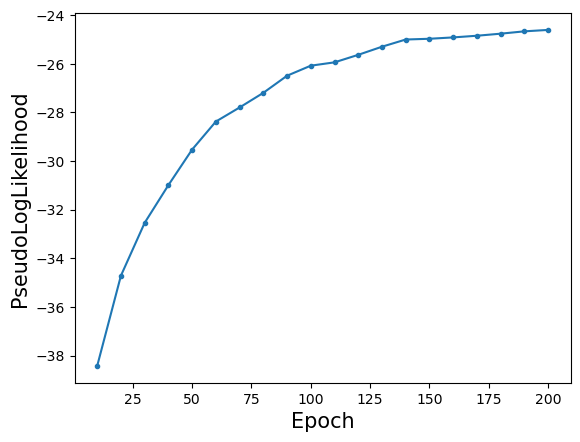

Training RBM 184/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361115 (train), 0.360117 (test), Pseud_Lik: -38.249544, Time: 2.005881, 
Ep 20, Rec er: 0.338290 (train), 0.338326 (test), Pseud_Lik: -34.056601, Time: 1.668803, 
Ep 30, Rec er: 0.327905 (train), 0.328228 (test), Pseud_Lik: -32.107984, Time: 1.678680, 
Ep 40, Rec er: 0.322385 (train), 0.322580 (test), Pseud_Lik: -30.397631, Time: 1.953972, 
Ep 50, Rec er: 0.317806 (train), 0.318698 (test), Pseud_Lik: -29.894455, Time: 1.964396, 
Ep 60, Rec er: 0.313172 (train), 0.313637 (test), Pseud_Lik: -29.194977, Time: 1.700274, 
Ep 70, Rec er: 0.308407 (train), 0.309300 (test), Pseud_Lik: -28.437636, Time: 1.735797, 
Ep 80, Rec er: 0.304554 (train), 0.305685 (test), Pseud_Lik: -28.152047, Time: 2.514018, 
Ep 90, Rec er: 0.300851 (train), 0.302163 (test), Pseud_Lik: -27.374125, Time: 1.729060, 
Ep 100, Rec er: 0.298264 (train), 0.299685 (test), P

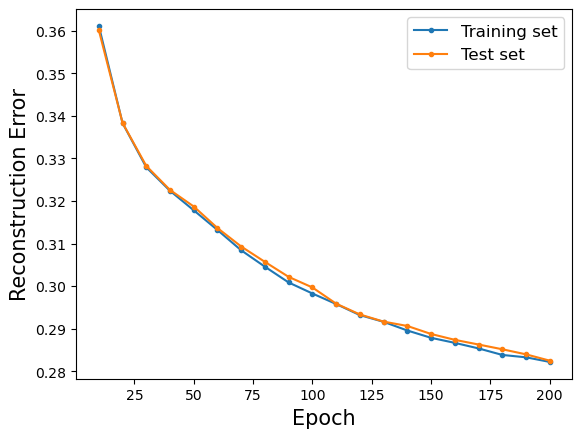

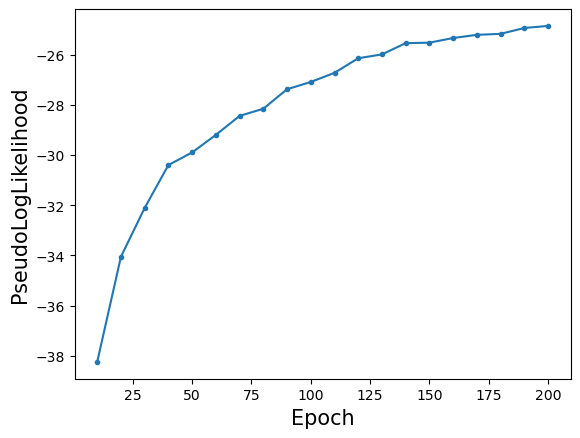

Training RBM 185/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360757 (train), 0.360401 (test), Pseud_Lik: -38.113609, Time: 1.748310, 
Ep 20, Rec er: 0.338908 (train), 0.339121 (test), Pseud_Lik: -34.289011, Time: 1.914863, 
Ep 30, Rec er: 0.328152 (train), 0.329016 (test), Pseud_Lik: -32.315483, Time: 1.861778, 
Ep 40, Rec er: 0.321171 (train), 0.321648 (test), Pseud_Lik: -30.692792, Time: 2.002627, 
Ep 50, Rec er: 0.316033 (train), 0.316972 (test), Pseud_Lik: -29.674403, Time: 1.769255, 
Ep 60, Rec er: 0.311276 (train), 0.311471 (test), Pseud_Lik: -28.890115, Time: 1.793315, 
Ep 70, Rec er: 0.307341 (train), 0.307994 (test), Pseud_Lik: -28.237183, Time: 1.793184, 
Ep 80, Rec er: 0.303420 (train), 0.304649 (test), Pseud_Lik: -27.658786, Time: 1.761542, 
Ep 90, Rec er: 0.299880 (train), 0.301045 (test), Pseud_Lik: -27.028178, Time: 1.755772, 
Ep 100, Rec er: 0.297324 (train), 0.298270 (test), P

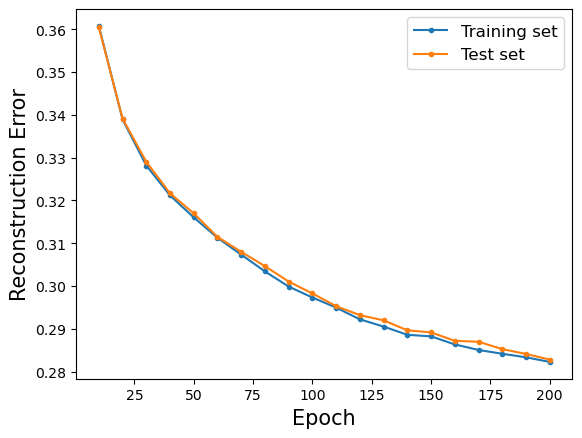

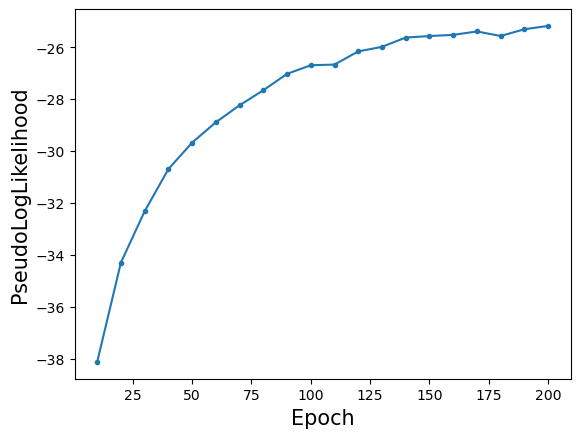

Training RBM 186/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362139 (train), 0.361516 (test), Pseud_Lik: -38.277213, Time: 1.700946, 
Ep 20, Rec er: 0.338507 (train), 0.338756 (test), Pseud_Lik: -34.557998, Time: 1.742981, 
Ep 30, Rec er: 0.326852 (train), 0.327834 (test), Pseud_Lik: -32.291396, Time: 1.931143, 
Ep 40, Rec er: 0.320703 (train), 0.320697 (test), Pseud_Lik: -30.541925, Time: 2.127035, 
Ep 50, Rec er: 0.314839 (train), 0.315989 (test), Pseud_Lik: -29.851184, Time: 1.856922, 
Ep 60, Rec er: 0.310063 (train), 0.310621 (test), Pseud_Lik: -29.031997, Time: 1.853542, 
Ep 70, Rec er: 0.305065 (train), 0.305984 (test), Pseud_Lik: -28.263544, Time: 1.776809, 
Ep 80, Rec er: 0.301165 (train), 0.303118 (test), Pseud_Lik: -27.573844, Time: 2.697966, 
Ep 90, Rec er: 0.297358 (train), 0.298648 (test), Pseud_Lik: -27.135867, Time: 1.740224, 
Ep 100, Rec er: 0.294327 (train), 0.295283 (test), P

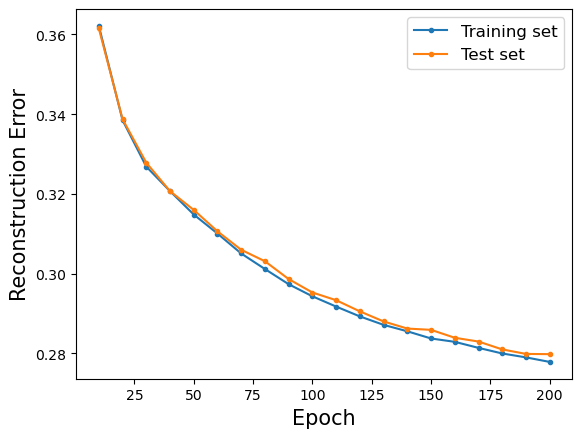

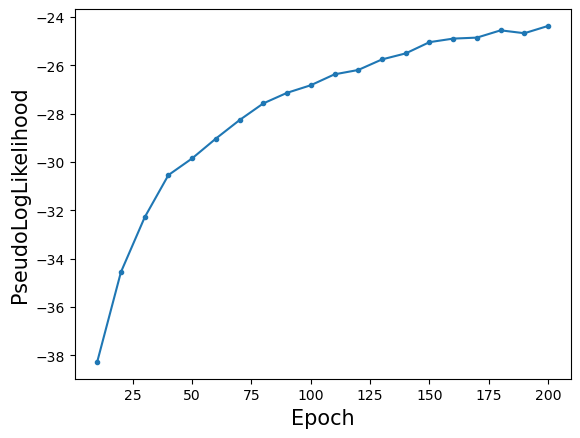

Training RBM 187/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360137 (train), 0.359561 (test), Pseud_Lik: -38.296400, Time: 1.637994, 
Ep 20, Rec er: 0.337990 (train), 0.338556 (test), Pseud_Lik: -34.160108, Time: 1.688078, 
Ep 30, Rec er: 0.328097 (train), 0.330161 (test), Pseud_Lik: -32.183078, Time: 2.810239, 
Ep 40, Rec er: 0.322103 (train), 0.323620 (test), Pseud_Lik: -31.327737, Time: 1.719797, 
Ep 50, Rec er: 0.317388 (train), 0.317235 (test), Pseud_Lik: -29.986127, Time: 1.687478, 
Ep 60, Rec er: 0.312059 (train), 0.312998 (test), Pseud_Lik: -28.963246, Time: 1.852984, 
Ep 70, Rec er: 0.308082 (train), 0.308440 (test), Pseud_Lik: -28.109530, Time: 1.724739, 
Ep 80, Rec er: 0.303565 (train), 0.304786 (test), Pseud_Lik: -27.767856, Time: 2.032504, 
Ep 90, Rec er: 0.299980 (train), 0.301389 (test), Pseud_Lik: -27.308286, Time: 2.028946, 
Ep 100, Rec er: 0.297632 (train), 0.298219 (test), P

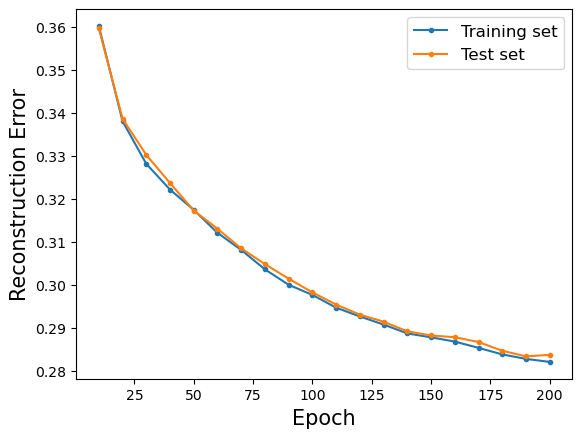

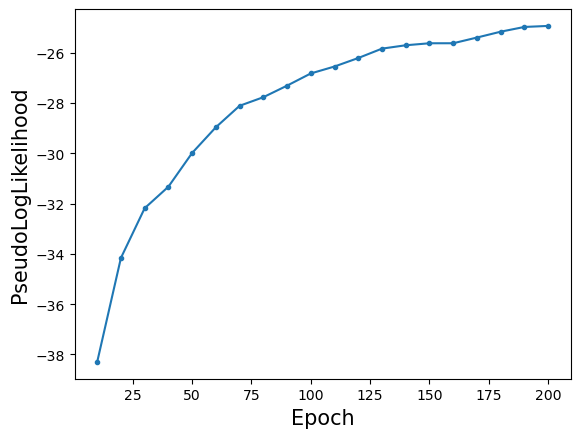

Training RBM 188/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362733 (train), 0.362579 (test), Pseud_Lik: -38.414824, Time: 1.843370, 
Ep 20, Rec er: 0.339118 (train), 0.339043 (test), Pseud_Lik: -34.403369, Time: 1.772618, 
Ep 30, Rec er: 0.327160 (train), 0.327402 (test), Pseud_Lik: -32.252112, Time: 1.936317, 
Ep 40, Rec er: 0.320213 (train), 0.321904 (test), Pseud_Lik: -30.690294, Time: 1.797669, 
Ep 50, Rec er: 0.314740 (train), 0.315539 (test), Pseud_Lik: -29.615637, Time: 2.962134, 
Ep 60, Rec er: 0.309345 (train), 0.310756 (test), Pseud_Lik: -28.581140, Time: 1.731669, 
Ep 70, Rec er: 0.305731 (train), 0.306160 (test), Pseud_Lik: -27.971960, Time: 2.171792, 
Ep 80, Rec er: 0.301769 (train), 0.302439 (test), Pseud_Lik: -27.227507, Time: 1.728966, 
Ep 90, Rec er: 0.298185 (train), 0.299406 (test), Pseud_Lik: -26.731852, Time: 2.074392, 
Ep 100, Rec er: 0.295086 (train), 0.296506 (test), P

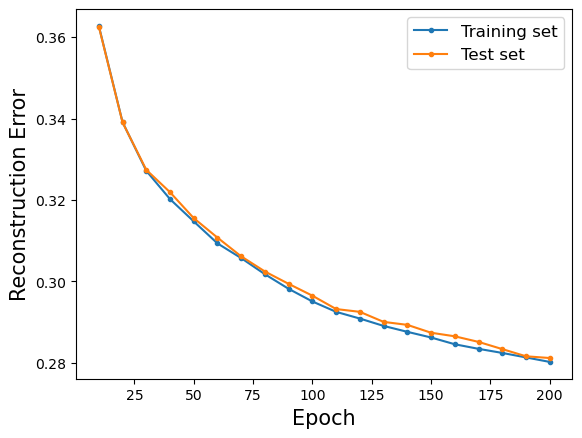

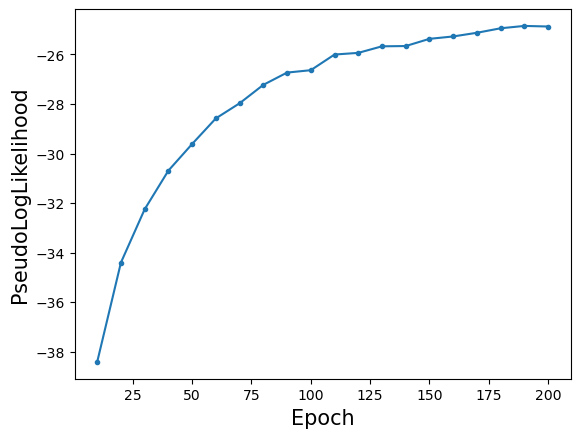

Training RBM 189/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358543 (train), 0.358920 (test), Pseud_Lik: -37.973929, Time: 1.879477, 
Ep 20, Rec er: 0.337330 (train), 0.337630 (test), Pseud_Lik: -34.241700, Time: 1.617972, 
Ep 30, Rec er: 0.326768 (train), 0.326454 (test), Pseud_Lik: -32.099653, Time: 1.653812, 
Ep 40, Rec er: 0.319888 (train), 0.320773 (test), Pseud_Lik: -30.451837, Time: 1.654868, 
Ep 50, Rec er: 0.314716 (train), 0.315702 (test), Pseud_Lik: -29.359781, Time: 1.660728, 
Ep 60, Rec er: 0.309705 (train), 0.310443 (test), Pseud_Lik: -28.560401, Time: 1.673724, 
Ep 70, Rec er: 0.305497 (train), 0.306770 (test), Pseud_Lik: -27.918746, Time: 1.651474, 
Ep 80, Rec er: 0.301312 (train), 0.301870 (test), Pseud_Lik: -27.303911, Time: 1.685681, 
Ep 90, Rec er: 0.297353 (train), 0.298464 (test), Pseud_Lik: -27.151091, Time: 1.758920, 
Ep 100, Rec er: 0.294785 (train), 0.295458 (test), P

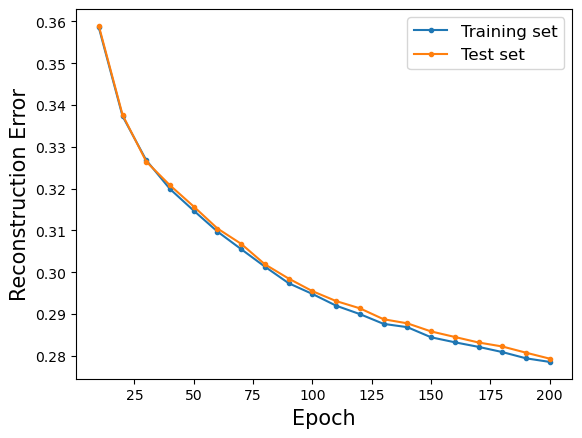

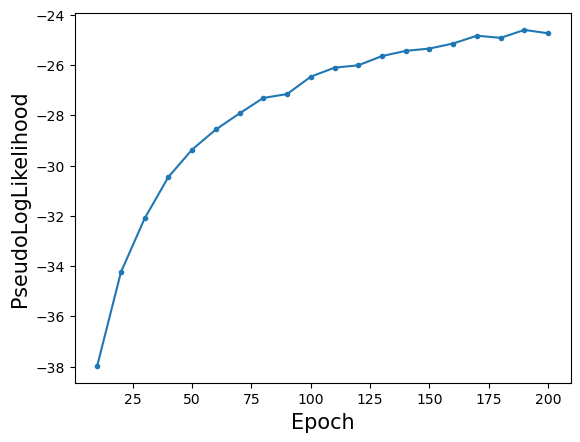

Training RBM 190/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361595 (train), 0.361507 (test), Pseud_Lik: -38.220900, Time: 1.649762, 
Ep 20, Rec er: 0.339005 (train), 0.339552 (test), Pseud_Lik: -34.845261, Time: 1.726558, 
Ep 30, Rec er: 0.327373 (train), 0.326984 (test), Pseud_Lik: -32.280314, Time: 1.649469, 
Ep 40, Rec er: 0.318556 (train), 0.319704 (test), Pseud_Lik: -30.590645, Time: 1.655386, 
Ep 50, Rec er: 0.313365 (train), 0.313770 (test), Pseud_Lik: -29.075917, Time: 1.731952, 
Ep 60, Rec er: 0.308345 (train), 0.307674 (test), Pseud_Lik: -28.385762, Time: 1.648770, 
Ep 70, Rec er: 0.303960 (train), 0.304562 (test), Pseud_Lik: -27.838970, Time: 1.689088, 
Ep 80, Rec er: 0.299862 (train), 0.300653 (test), Pseud_Lik: -27.419644, Time: 1.750342, 
Ep 90, Rec er: 0.296527 (train), 0.297041 (test), Pseud_Lik: -26.810258, Time: 1.681022, 
Ep 100, Rec er: 0.293705 (train), 0.294198 (test), P

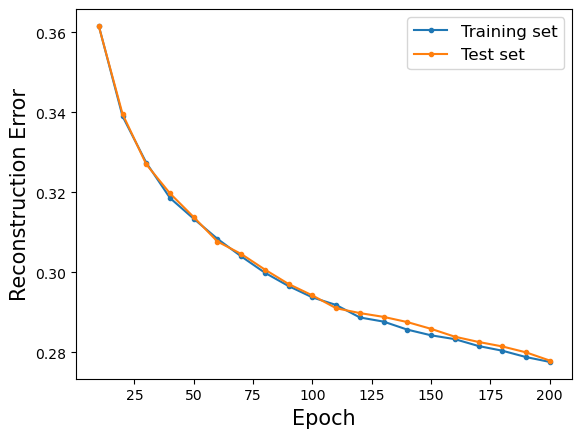

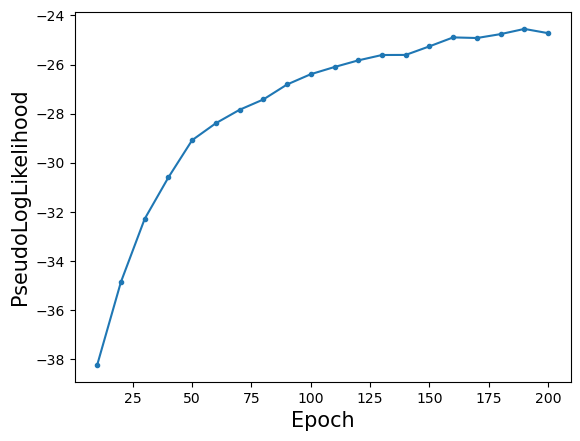

Training RBM 191/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361835 (train), 0.359917 (test), Pseud_Lik: -38.368227, Time: 2.395478, 
Ep 20, Rec er: 0.338268 (train), 0.338857 (test), Pseud_Lik: -34.533084, Time: 1.890767, 
Ep 30, Rec er: 0.327433 (train), 0.328746 (test), Pseud_Lik: -32.606563, Time: 1.999660, 
Ep 40, Rec er: 0.319705 (train), 0.320864 (test), Pseud_Lik: -30.730959, Time: 2.735814, 
Ep 50, Rec er: 0.313655 (train), 0.315078 (test), Pseud_Lik: -29.578289, Time: 1.929528, 
Ep 60, Rec er: 0.308921 (train), 0.310073 (test), Pseud_Lik: -28.491528, Time: 1.848607, 
Ep 70, Rec er: 0.304440 (train), 0.304251 (test), Pseud_Lik: -27.915325, Time: 2.365235, 
Ep 80, Rec er: 0.300428 (train), 0.300974 (test), Pseud_Lik: -27.347548, Time: 2.119128, 
Ep 90, Rec er: 0.296932 (train), 0.297788 (test), Pseud_Lik: -26.848367, Time: 2.872419, 
Ep 100, Rec er: 0.293203 (train), 0.295076 (test), P

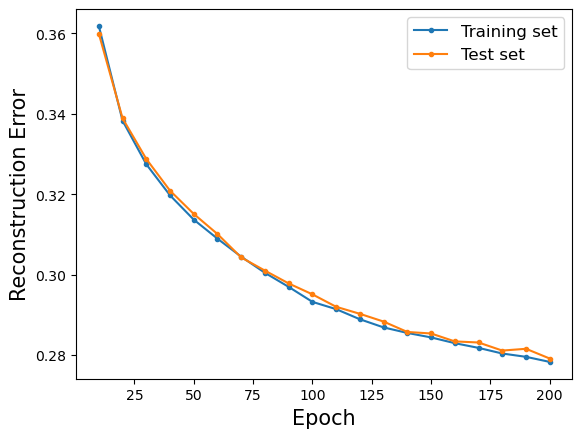

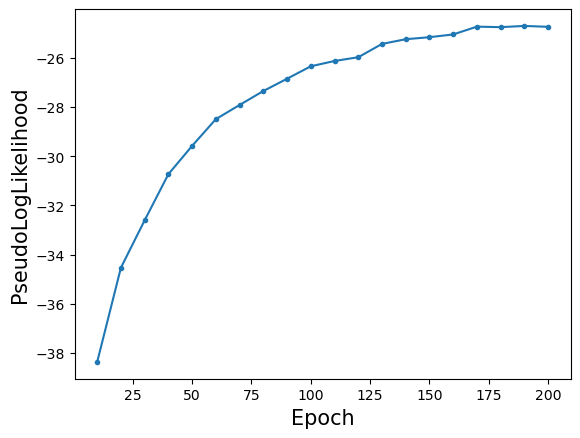

Training RBM 192/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360151 (train), 0.359160 (test), Pseud_Lik: -38.475102, Time: 1.848518, 
Ep 20, Rec er: 0.338276 (train), 0.338571 (test), Pseud_Lik: -34.240756, Time: 1.669041, 
Ep 30, Rec er: 0.326693 (train), 0.327622 (test), Pseud_Lik: -32.024864, Time: 1.618373, 
Ep 40, Rec er: 0.319704 (train), 0.320023 (test), Pseud_Lik: -30.715094, Time: 1.933029, 
Ep 50, Rec er: 0.314325 (train), 0.314958 (test), Pseud_Lik: -29.336669, Time: 1.660886, 
Ep 60, Rec er: 0.309205 (train), 0.310291 (test), Pseud_Lik: -28.521220, Time: 1.775265, 
Ep 70, Rec er: 0.304982 (train), 0.306477 (test), Pseud_Lik: -27.945340, Time: 2.150910, 
Ep 80, Rec er: 0.301097 (train), 0.301957 (test), Pseud_Lik: -27.430484, Time: 1.711955, 
Ep 90, Rec er: 0.298116 (train), 0.298660 (test), Pseud_Lik: -26.876545, Time: 1.728605, 
Ep 100, Rec er: 0.294950 (train), 0.296794 (test), P

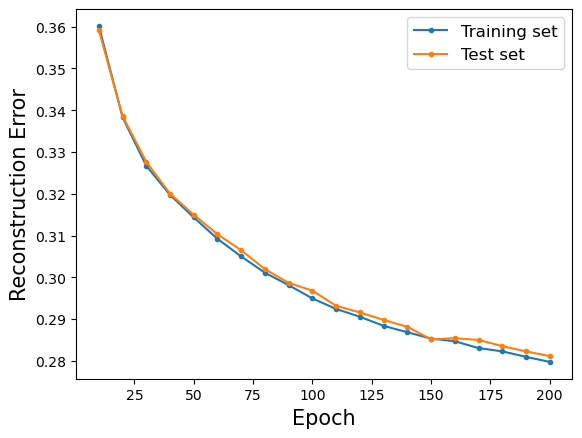

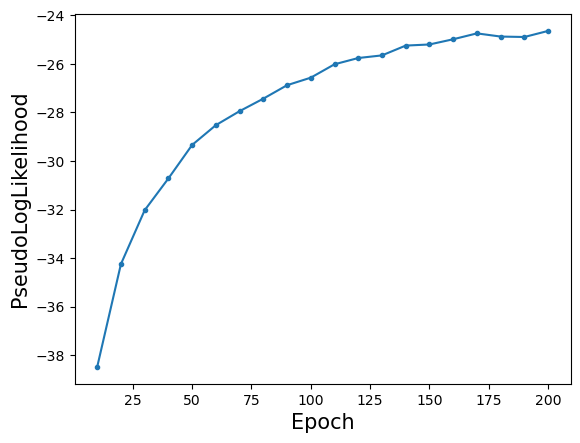

Training RBM 193/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361469 (train), 0.360917 (test), Pseud_Lik: -38.290753, Time: 1.723823, 
Ep 20, Rec er: 0.339857 (train), 0.340033 (test), Pseud_Lik: -34.663324, Time: 1.810723, 
Ep 30, Rec er: 0.328479 (train), 0.329243 (test), Pseud_Lik: -32.849129, Time: 1.703765, 
Ep 40, Rec er: 0.320895 (train), 0.321462 (test), Pseud_Lik: -31.132619, Time: 1.682128, 
Ep 50, Rec er: 0.315121 (train), 0.315312 (test), Pseud_Lik: -29.593528, Time: 1.712154, 
Ep 60, Rec er: 0.309430 (train), 0.310598 (test), Pseud_Lik: -28.580626, Time: 1.688337, 
Ep 70, Rec er: 0.304657 (train), 0.304638 (test), Pseud_Lik: -27.935430, Time: 1.740717, 
Ep 80, Rec er: 0.300416 (train), 0.300508 (test), Pseud_Lik: -27.153988, Time: 1.712141, 
Ep 90, Rec er: 0.296924 (train), 0.297583 (test), Pseud_Lik: -26.790887, Time: 1.753727, 
Ep 100, Rec er: 0.293913 (train), 0.294601 (test), P

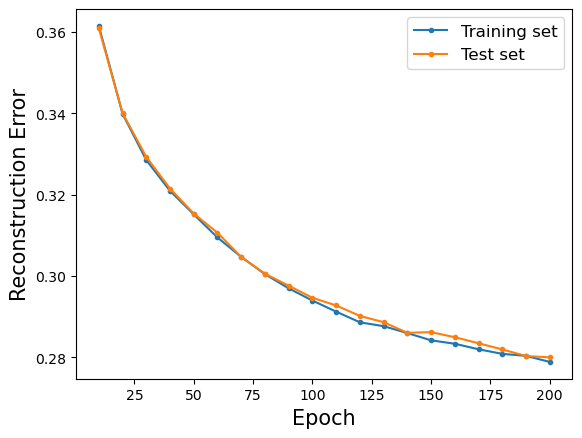

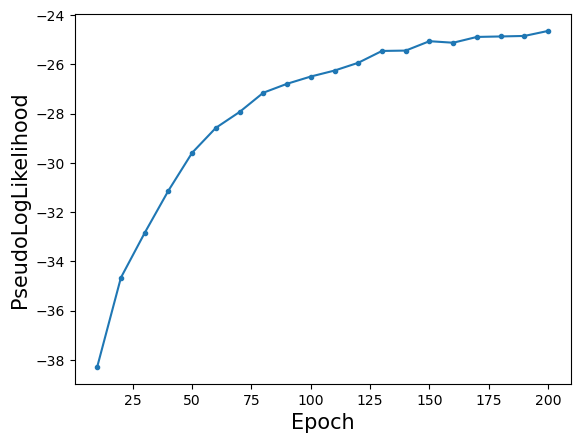

Training RBM 194/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358966 (train), 0.358860 (test), Pseud_Lik: -38.057616, Time: 2.419356, 
Ep 20, Rec er: 0.338444 (train), 0.338501 (test), Pseud_Lik: -34.077792, Time: 2.142549, 
Ep 30, Rec er: 0.327716 (train), 0.329633 (test), Pseud_Lik: -32.009429, Time: 1.736363, 
Ep 40, Rec er: 0.321857 (train), 0.321629 (test), Pseud_Lik: -30.661431, Time: 1.695196, 
Ep 50, Rec er: 0.316733 (train), 0.316620 (test), Pseud_Lik: -29.773658, Time: 1.749215, 
Ep 60, Rec er: 0.311744 (train), 0.312592 (test), Pseud_Lik: -29.014248, Time: 1.885269, 
Ep 70, Rec er: 0.307421 (train), 0.307748 (test), Pseud_Lik: -28.128691, Time: 1.960684, 
Ep 80, Rec er: 0.303673 (train), 0.304513 (test), Pseud_Lik: -27.490392, Time: 2.406621, 
Ep 90, Rec er: 0.300679 (train), 0.301377 (test), Pseud_Lik: -26.814714, Time: 2.024490, 
Ep 100, Rec er: 0.297919 (train), 0.299238 (test), P

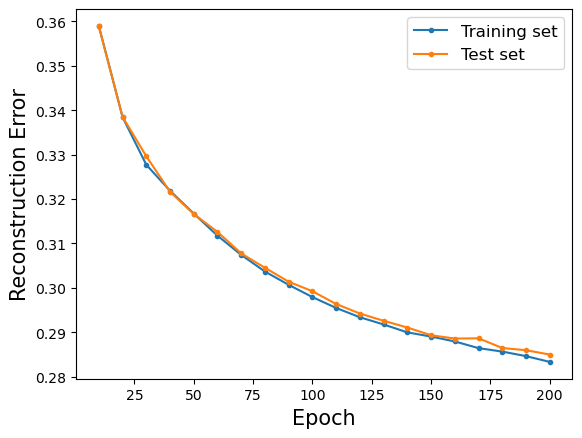

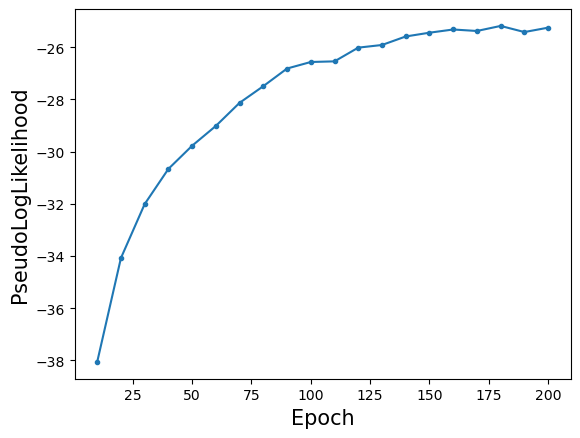

Training RBM 195/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360877 (train), 0.360607 (test), Pseud_Lik: -38.181300, Time: 1.746612, 
Ep 20, Rec er: 0.338881 (train), 0.339412 (test), Pseud_Lik: -34.301509, Time: 1.685671, 
Ep 30, Rec er: 0.328276 (train), 0.329258 (test), Pseud_Lik: -32.247825, Time: 1.738602, 
Ep 40, Rec er: 0.321622 (train), 0.322580 (test), Pseud_Lik: -31.201010, Time: 1.763245, 
Ep 50, Rec er: 0.316559 (train), 0.317144 (test), Pseud_Lik: -29.985177, Time: 1.796798, 
Ep 60, Rec er: 0.311956 (train), 0.312140 (test), Pseud_Lik: -28.870261, Time: 1.905651, 
Ep 70, Rec er: 0.307460 (train), 0.309088 (test), Pseud_Lik: -27.915157, Time: 1.795518, 
Ep 80, Rec er: 0.303357 (train), 0.304030 (test), Pseud_Lik: -27.167335, Time: 1.729404, 
Ep 90, Rec er: 0.300051 (train), 0.301017 (test), Pseud_Lik: -26.904228, Time: 1.773386, 
Ep 100, Rec er: 0.296792 (train), 0.298389 (test), P

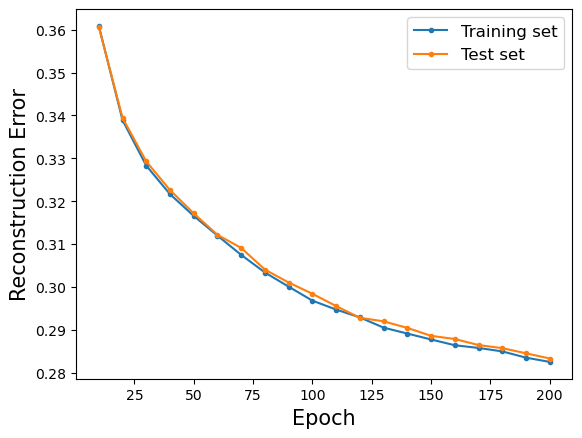

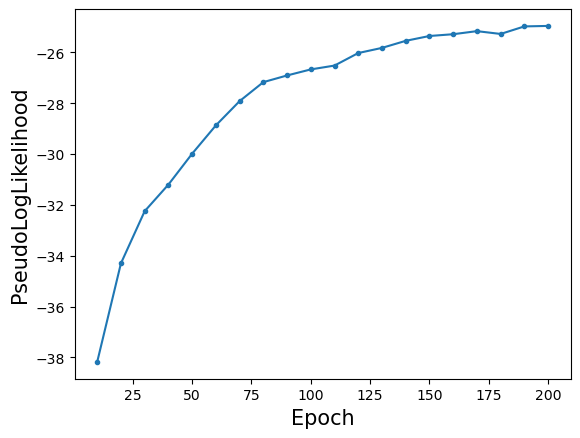

Training RBM 196/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359353 (train), 0.359364 (test), Pseud_Lik: -38.124487, Time: 2.051331, 
Ep 20, Rec er: 0.337922 (train), 0.338625 (test), Pseud_Lik: -34.222216, Time: 1.973182, 
Ep 30, Rec er: 0.327631 (train), 0.327816 (test), Pseud_Lik: -32.108488, Time: 2.002220, 
Ep 40, Rec er: 0.321244 (train), 0.322373 (test), Pseud_Lik: -30.521408, Time: 2.594722, 
Ep 50, Rec er: 0.315528 (train), 0.315626 (test), Pseud_Lik: -29.148176, Time: 2.022808, 
Ep 60, Rec er: 0.311019 (train), 0.311085 (test), Pseud_Lik: -28.451701, Time: 1.922857, 
Ep 70, Rec er: 0.306572 (train), 0.307254 (test), Pseud_Lik: -27.690119, Time: 1.793332, 
Ep 80, Rec er: 0.302778 (train), 0.302355 (test), Pseud_Lik: -27.148139, Time: 1.943300, 
Ep 90, Rec er: 0.299265 (train), 0.300224 (test), Pseud_Lik: -27.050073, Time: 1.796891, 
Ep 100, Rec er: 0.296263 (train), 0.297836 (test), P

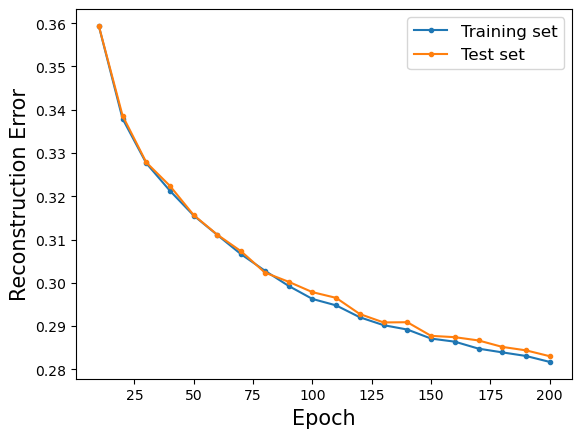

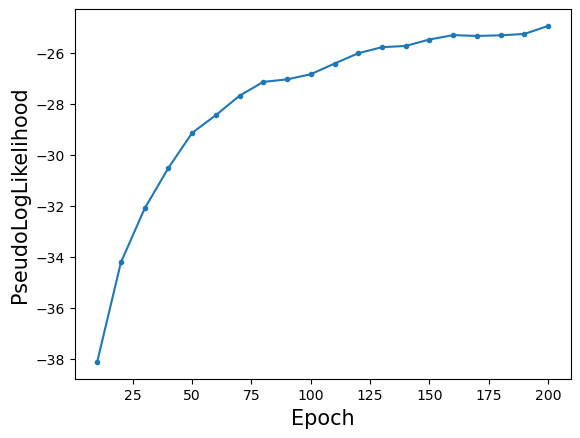

Training RBM 197/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361765 (train), 0.361859 (test), Pseud_Lik: -38.311967, Time: 1.696781, 
Ep 20, Rec er: 0.338263 (train), 0.338492 (test), Pseud_Lik: -34.456638, Time: 1.664411, 
Ep 30, Rec er: 0.326842 (train), 0.328076 (test), Pseud_Lik: -32.059818, Time: 1.745801, 
Ep 40, Rec er: 0.320713 (train), 0.320994 (test), Pseud_Lik: -30.191361, Time: 1.649131, 
Ep 50, Rec er: 0.315310 (train), 0.315259 (test), Pseud_Lik: -29.349430, Time: 2.661481, 
Ep 60, Rec er: 0.310106 (train), 0.311388 (test), Pseud_Lik: -28.795479, Time: 1.739205, 
Ep 70, Rec er: 0.306251 (train), 0.307554 (test), Pseud_Lik: -28.088734, Time: 1.685769, 
Ep 80, Rec er: 0.302403 (train), 0.303394 (test), Pseud_Lik: -27.555868, Time: 1.767873, 
Ep 90, Rec er: 0.299600 (train), 0.300237 (test), Pseud_Lik: -27.221844, Time: 2.000192, 
Ep 100, Rec er: 0.296833 (train), 0.297706 (test), P

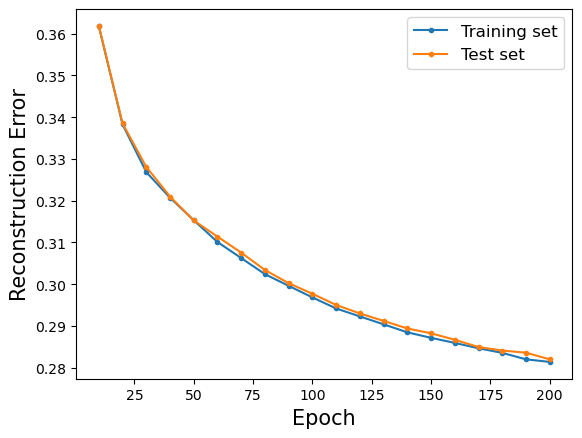

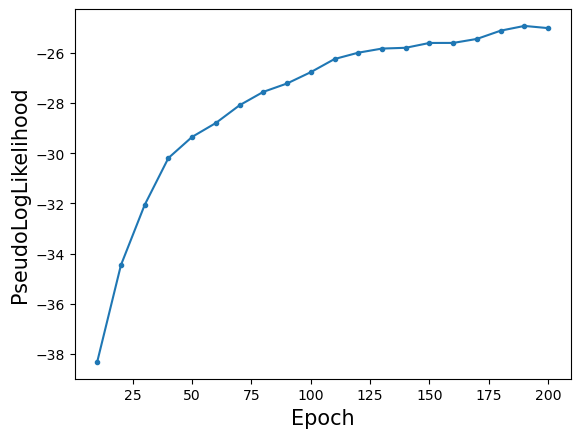

Training RBM 198/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359471 (train), 0.358552 (test), Pseud_Lik: -38.246169, Time: 2.064621, 
Ep 20, Rec er: 0.338096 (train), 0.338298 (test), Pseud_Lik: -33.933384, Time: 1.725904, 
Ep 30, Rec er: 0.327998 (train), 0.329529 (test), Pseud_Lik: -32.265390, Time: 1.651463, 
Ep 40, Rec er: 0.322708 (train), 0.323096 (test), Pseud_Lik: -30.659648, Time: 1.692370, 
Ep 50, Rec er: 0.317866 (train), 0.317953 (test), Pseud_Lik: -29.961872, Time: 1.685290, 
Ep 60, Rec er: 0.312714 (train), 0.313990 (test), Pseud_Lik: -29.086635, Time: 1.903396, 
Ep 70, Rec er: 0.308292 (train), 0.308524 (test), Pseud_Lik: -28.539526, Time: 2.395789, 
Ep 80, Rec er: 0.303619 (train), 0.304585 (test), Pseud_Lik: -27.690814, Time: 3.039331, 
Ep 90, Rec er: 0.300406 (train), 0.300718 (test), Pseud_Lik: -27.006409, Time: 1.710115, 
Ep 100, Rec er: 0.297485 (train), 0.298404 (test), P

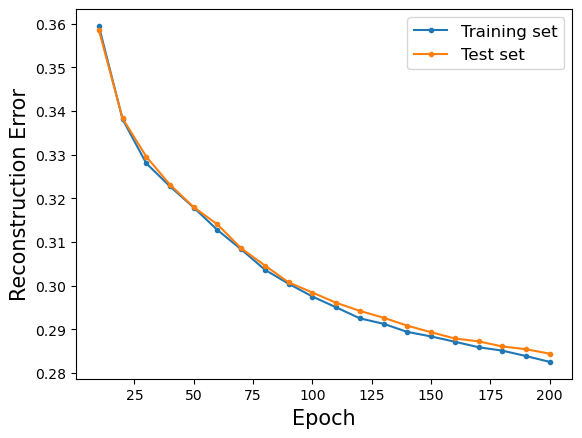

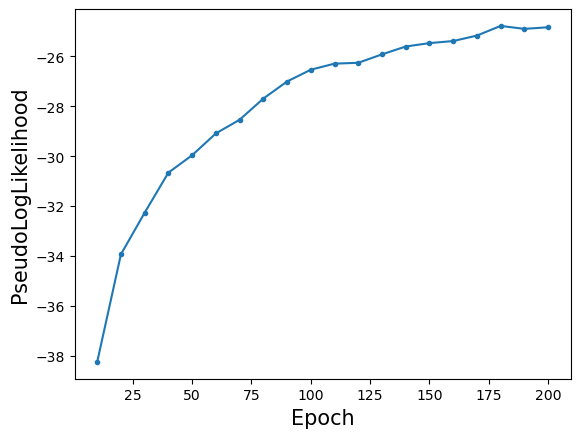

Training RBM 199/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361232 (train), 0.360176 (test), Pseud_Lik: -38.278340, Time: 3.182917, 
Ep 20, Rec er: 0.337982 (train), 0.338160 (test), Pseud_Lik: -34.287793, Time: 2.759295, 
Ep 30, Rec er: 0.327686 (train), 0.327659 (test), Pseud_Lik: -31.910791, Time: 2.463196, 
Ep 40, Rec er: 0.321580 (train), 0.323039 (test), Pseud_Lik: -30.786091, Time: 1.918806, 
Ep 50, Rec er: 0.316399 (train), 0.316257 (test), Pseud_Lik: -29.894330, Time: 3.072828, 
Ep 60, Rec er: 0.311703 (train), 0.312452 (test), Pseud_Lik: -29.066161, Time: 1.958323, 
Ep 70, Rec er: 0.306994 (train), 0.307851 (test), Pseud_Lik: -28.022822, Time: 2.169638, 
Ep 80, Rec er: 0.303387 (train), 0.303823 (test), Pseud_Lik: -27.564835, Time: 2.286808, 
Ep 90, Rec er: 0.299515 (train), 0.300471 (test), Pseud_Lik: -26.964793, Time: 3.192970, 
Ep 100, Rec er: 0.296573 (train), 0.297549 (test), P

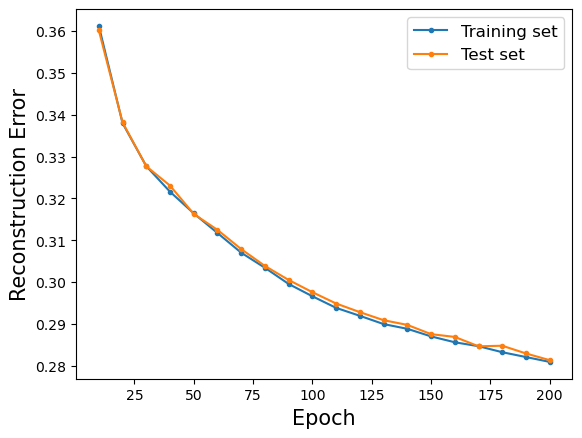

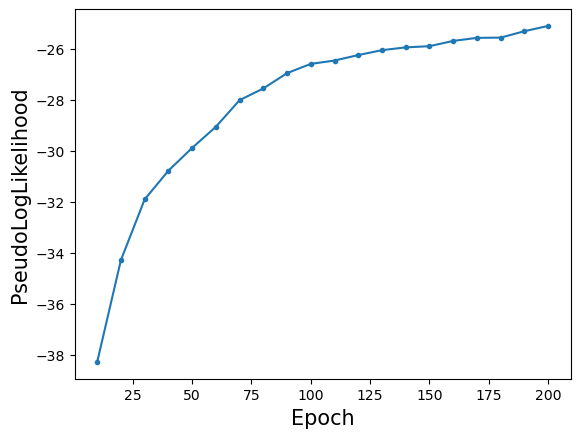

Training RBM 200/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358473 (train), 0.357899 (test), Pseud_Lik: -38.039877, Time: 1.899825, 
Ep 20, Rec er: 0.337913 (train), 0.338207 (test), Pseud_Lik: -34.092226, Time: 2.053962, 
Ep 30, Rec er: 0.327635 (train), 0.328233 (test), Pseud_Lik: -31.991137, Time: 2.673224, 
Ep 40, Rec er: 0.321976 (train), 0.323381 (test), Pseud_Lik: -30.656927, Time: 3.166490, 
Ep 50, Rec er: 0.317950 (train), 0.319243 (test), Pseud_Lik: -29.800033, Time: 2.297637, 
Ep 60, Rec er: 0.312908 (train), 0.313939 (test), Pseud_Lik: -29.328811, Time: 3.101280, 
Ep 70, Rec er: 0.308398 (train), 0.309217 (test), Pseud_Lik: -28.502773, Time: 2.617527, 
Ep 80, Rec er: 0.304537 (train), 0.305276 (test), Pseud_Lik: -27.686035, Time: 2.231818, 
Ep 90, Rec er: 0.300708 (train), 0.302376 (test), Pseud_Lik: -27.142101, Time: 1.890360, 
Ep 100, Rec er: 0.297415 (train), 0.298473 (test), P

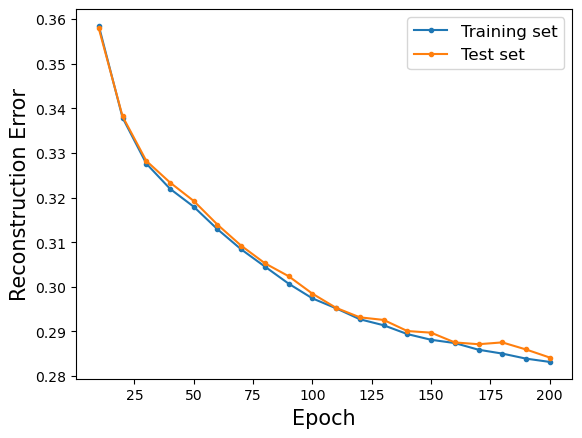

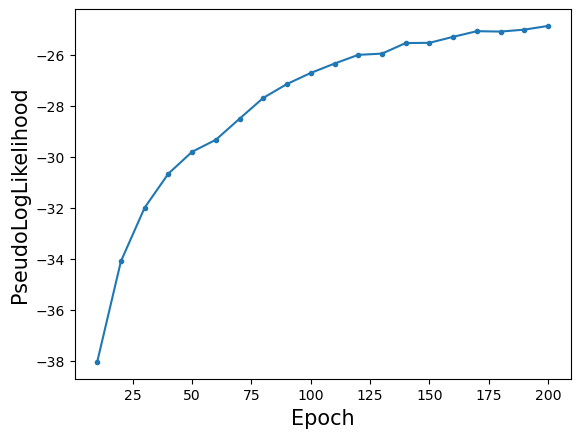

Training RBM 201/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360787 (train), 0.360582 (test), Pseud_Lik: -38.163251, Time: 2.152580, 
Ep 20, Rec er: 0.339145 (train), 0.339136 (test), Pseud_Lik: -34.707829, Time: 1.969967, 
Ep 30, Rec er: 0.328609 (train), 0.329146 (test), Pseud_Lik: -32.430103, Time: 2.009088, 
Ep 40, Rec er: 0.320400 (train), 0.320976 (test), Pseud_Lik: -30.903983, Time: 2.062639, 
Ep 50, Rec er: 0.314073 (train), 0.314250 (test), Pseud_Lik: -29.544131, Time: 1.908078, 
Ep 60, Rec er: 0.309345 (train), 0.309926 (test), Pseud_Lik: -28.752923, Time: 1.934731, 
Ep 70, Rec er: 0.303537 (train), 0.303991 (test), Pseud_Lik: -28.090077, Time: 1.860743, 
Ep 80, Rec er: 0.299724 (train), 0.300539 (test), Pseud_Lik: -27.366224, Time: 2.562423, 
Ep 90, Rec er: 0.296340 (train), 0.297227 (test), Pseud_Lik: -26.827746, Time: 2.454892, 
Ep 100, Rec er: 0.293494 (train), 0.293591 (test), P

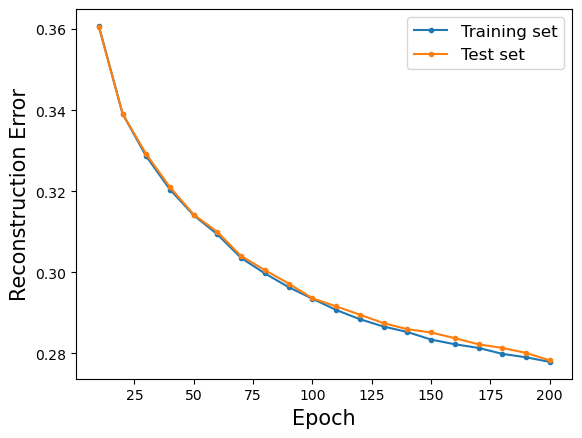

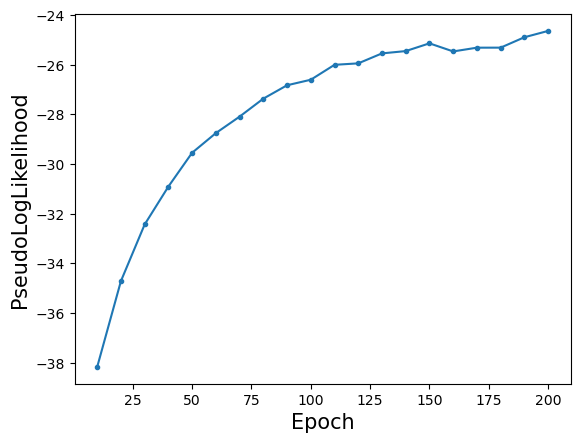

Training RBM 202/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361077 (train), 0.360741 (test), Pseud_Lik: -38.383845, Time: 1.789490, 
Ep 20, Rec er: 0.338119 (train), 0.338329 (test), Pseud_Lik: -34.285893, Time: 1.713074, 
Ep 30, Rec er: 0.326809 (train), 0.326823 (test), Pseud_Lik: -32.332620, Time: 1.692989, 
Ep 40, Rec er: 0.319790 (train), 0.319250 (test), Pseud_Lik: -30.344771, Time: 1.815442, 
Ep 50, Rec er: 0.314179 (train), 0.314530 (test), Pseud_Lik: -29.422933, Time: 1.839828, 
Ep 60, Rec er: 0.309567 (train), 0.310023 (test), Pseud_Lik: -28.392182, Time: 1.837524, 
Ep 70, Rec er: 0.305436 (train), 0.306001 (test), Pseud_Lik: -27.918759, Time: 1.812960, 
Ep 80, Rec er: 0.301926 (train), 0.302401 (test), Pseud_Lik: -27.241762, Time: 1.708091, 
Ep 90, Rec er: 0.299026 (train), 0.298839 (test), Pseud_Lik: -26.816451, Time: 2.016082, 
Ep 100, Rec er: 0.296091 (train), 0.296688 (test), P

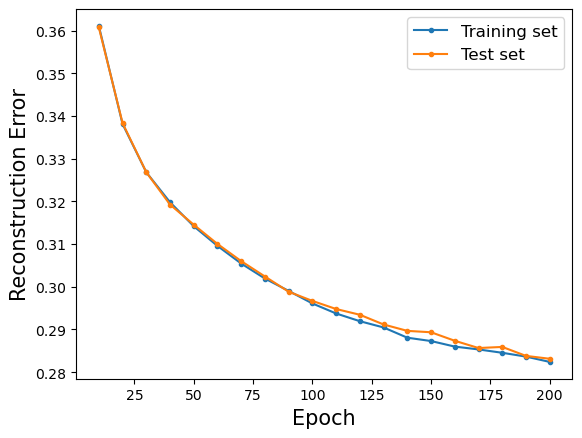

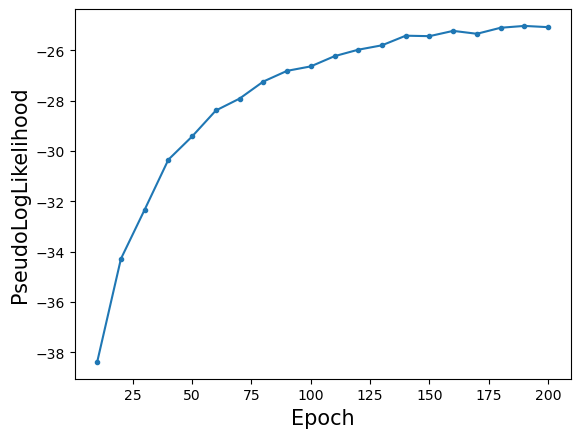

Training RBM 203/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361102 (train), 0.361646 (test), Pseud_Lik: -38.084969, Time: 1.993226, 
Ep 20, Rec er: 0.339228 (train), 0.339078 (test), Pseud_Lik: -34.619058, Time: 2.122436, 
Ep 30, Rec er: 0.327949 (train), 0.328489 (test), Pseud_Lik: -32.680216, Time: 2.266443, 
Ep 40, Rec er: 0.320014 (train), 0.320964 (test), Pseud_Lik: -31.069510, Time: 1.844162, 
Ep 50, Rec er: 0.313558 (train), 0.314988 (test), Pseud_Lik: -29.422100, Time: 1.962641, 
Ep 60, Rec er: 0.308777 (train), 0.308561 (test), Pseud_Lik: -28.326386, Time: 1.755621, 
Ep 70, Rec er: 0.304023 (train), 0.305012 (test), Pseud_Lik: -27.593103, Time: 2.262878, 
Ep 80, Rec er: 0.300409 (train), 0.301424 (test), Pseud_Lik: -27.201018, Time: 1.698529, 
Ep 90, Rec er: 0.297190 (train), 0.297170 (test), Pseud_Lik: -26.747964, Time: 1.788865, 
Ep 100, Rec er: 0.294129 (train), 0.294571 (test), P

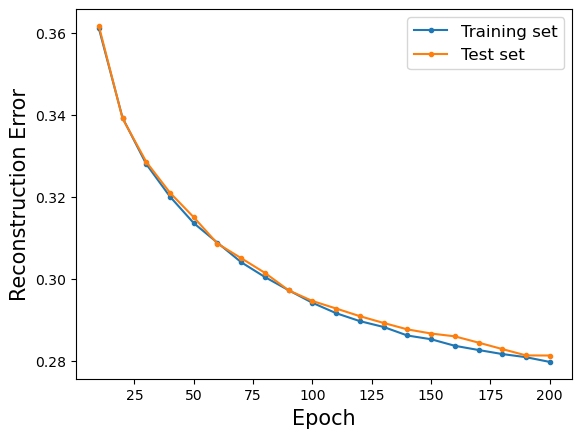

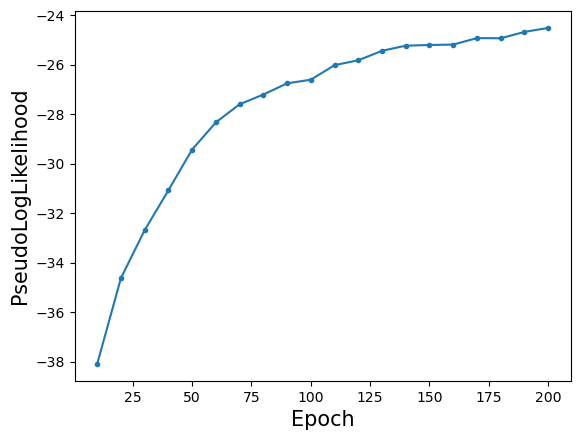

Training RBM 204/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361386 (train), 0.360984 (test), Pseud_Lik: -38.296831, Time: 1.721131, 
Ep 20, Rec er: 0.338374 (train), 0.339113 (test), Pseud_Lik: -34.133055, Time: 1.663778, 
Ep 30, Rec er: 0.327525 (train), 0.328381 (test), Pseud_Lik: -32.201368, Time: 1.793696, 
Ep 40, Rec er: 0.320906 (train), 0.320748 (test), Pseud_Lik: -31.030237, Time: 1.701500, 
Ep 50, Rec er: 0.315045 (train), 0.316710 (test), Pseud_Lik: -29.728492, Time: 1.669563, 
Ep 60, Rec er: 0.310409 (train), 0.311265 (test), Pseud_Lik: -28.669595, Time: 1.738702, 
Ep 70, Rec er: 0.305376 (train), 0.306051 (test), Pseud_Lik: -28.274945, Time: 1.686564, 
Ep 80, Rec er: 0.301372 (train), 0.301441 (test), Pseud_Lik: -27.457013, Time: 1.702030, 
Ep 90, Rec er: 0.298290 (train), 0.298138 (test), Pseud_Lik: -27.022991, Time: 1.746220, 
Ep 100, Rec er: 0.295109 (train), 0.296036 (test), P

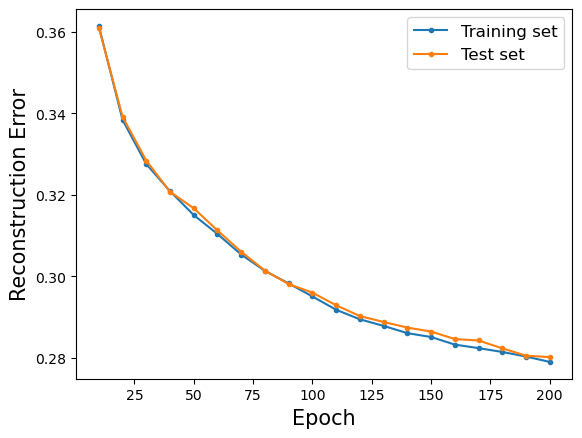

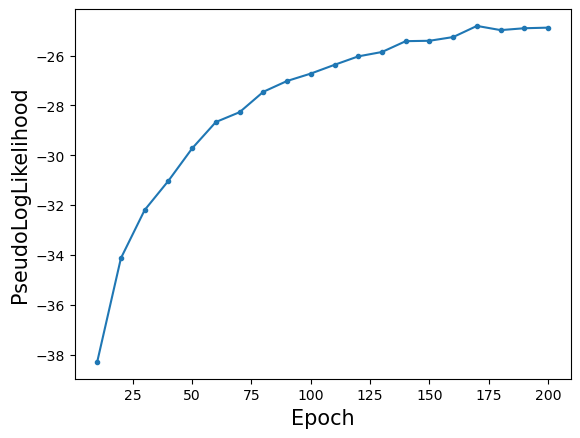

Training RBM 205/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360148 (train), 0.359961 (test), Pseud_Lik: -38.264634, Time: 1.650132, 
Ep 20, Rec er: 0.338618 (train), 0.338827 (test), Pseud_Lik: -34.250460, Time: 1.728377, 
Ep 30, Rec er: 0.327600 (train), 0.328285 (test), Pseud_Lik: -32.252969, Time: 1.649273, 
Ep 40, Rec er: 0.321059 (train), 0.321359 (test), Pseud_Lik: -30.716760, Time: 1.650932, 
Ep 50, Rec er: 0.315485 (train), 0.315857 (test), Pseud_Lik: -29.985763, Time: 3.107541, 
Ep 60, Rec er: 0.310878 (train), 0.311578 (test), Pseud_Lik: -29.161616, Time: 1.675232, 
Ep 70, Rec er: 0.306431 (train), 0.307778 (test), Pseud_Lik: -28.188257, Time: 1.795673, 
Ep 80, Rec er: 0.302337 (train), 0.303329 (test), Pseud_Lik: -27.662928, Time: 1.901400, 
Ep 90, Rec er: 0.299116 (train), 0.300338 (test), Pseud_Lik: -26.999122, Time: 1.970538, 
Ep 100, Rec er: 0.296097 (train), 0.297303 (test), P

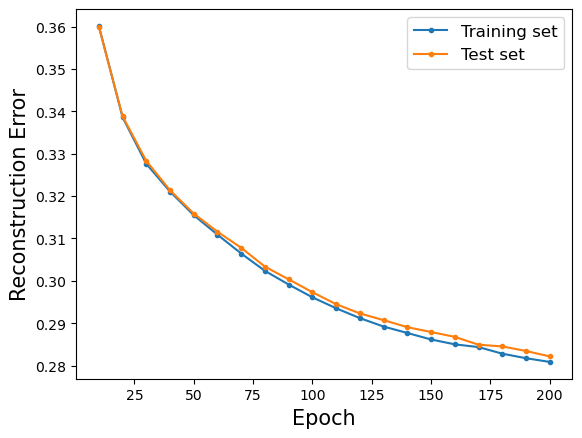

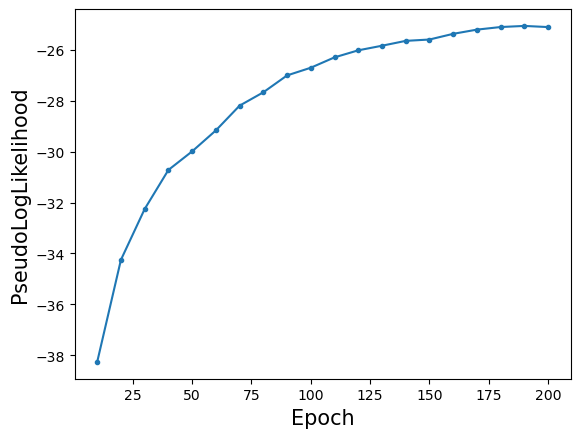

Training RBM 206/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359568 (train), 0.359434 (test), Pseud_Lik: -38.149438, Time: 1.923025, 
Ep 20, Rec er: 0.338265 (train), 0.339650 (test), Pseud_Lik: -33.925460, Time: 1.761704, 
Ep 30, Rec er: 0.327862 (train), 0.327821 (test), Pseud_Lik: -31.620647, Time: 2.464914, 
Ep 40, Rec er: 0.320980 (train), 0.321774 (test), Pseud_Lik: -30.371981, Time: 2.255177, 
Ep 50, Rec er: 0.315840 (train), 0.315909 (test), Pseud_Lik: -29.355336, Time: 1.778312, 
Ep 60, Rec er: 0.311074 (train), 0.311650 (test), Pseud_Lik: -28.582974, Time: 2.521782, 
Ep 70, Rec er: 0.307205 (train), 0.307567 (test), Pseud_Lik: -28.116496, Time: 2.441341, 
Ep 80, Rec er: 0.304081 (train), 0.305102 (test), Pseud_Lik: -27.381398, Time: 1.750984, 
Ep 90, Rec er: 0.301631 (train), 0.302224 (test), Pseud_Lik: -27.071245, Time: 1.839237, 
Ep 100, Rec er: 0.298775 (train), 0.299797 (test), P

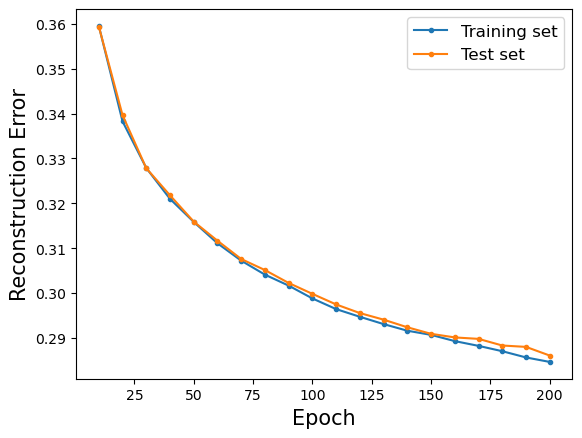

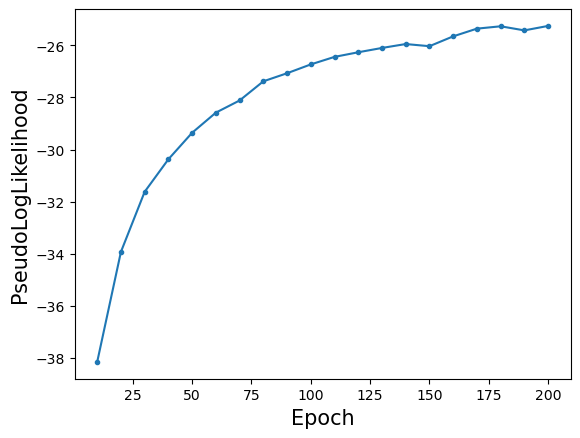

Training RBM 207/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359416 (train), 0.358784 (test), Pseud_Lik: -38.070332, Time: 1.711193, 
Ep 20, Rec er: 0.338431 (train), 0.338998 (test), Pseud_Lik: -33.983425, Time: 1.689272, 
Ep 30, Rec er: 0.329522 (train), 0.329897 (test), Pseud_Lik: -32.056121, Time: 1.680332, 
Ep 40, Rec er: 0.323398 (train), 0.324546 (test), Pseud_Lik: -31.056642, Time: 2.020499, 
Ep 50, Rec er: 0.318410 (train), 0.319086 (test), Pseud_Lik: -30.089771, Time: 1.842372, 
Ep 60, Rec er: 0.313859 (train), 0.314648 (test), Pseud_Lik: -29.045058, Time: 1.753013, 
Ep 70, Rec er: 0.310062 (train), 0.311474 (test), Pseud_Lik: -28.468964, Time: 1.647033, 
Ep 80, Rec er: 0.305540 (train), 0.306563 (test), Pseud_Lik: -27.787856, Time: 1.885366, 
Ep 90, Rec er: 0.302355 (train), 0.303709 (test), Pseud_Lik: -27.110500, Time: 2.144781, 
Ep 100, Rec er: 0.299688 (train), 0.301046 (test), P

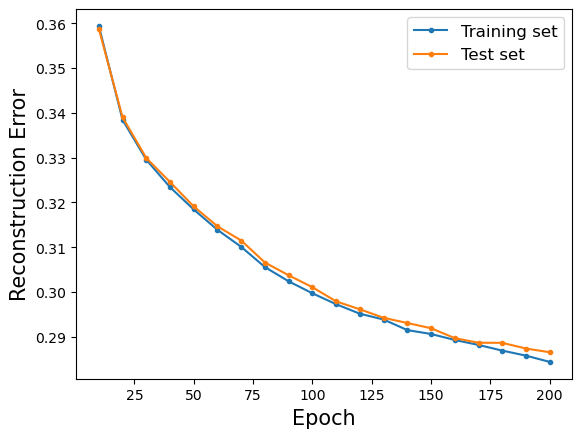

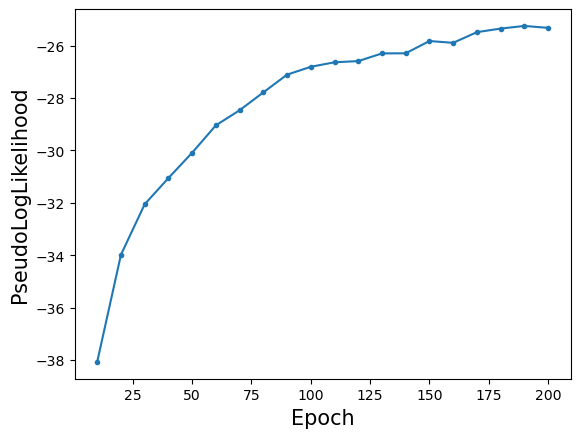

Training RBM 208/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360690 (train), 0.360006 (test), Pseud_Lik: -38.117782, Time: 1.639061, 
Ep 20, Rec er: 0.338360 (train), 0.337729 (test), Pseud_Lik: -34.257569, Time: 1.663846, 
Ep 30, Rec er: 0.327462 (train), 0.328250 (test), Pseud_Lik: -32.247123, Time: 1.664255, 
Ep 40, Rec er: 0.320675 (train), 0.321210 (test), Pseud_Lik: -31.098987, Time: 1.748313, 
Ep 50, Rec er: 0.314863 (train), 0.315086 (test), Pseud_Lik: -29.710649, Time: 2.405700, 
Ep 60, Rec er: 0.309998 (train), 0.310334 (test), Pseud_Lik: -28.708594, Time: 2.325788, 
Ep 70, Rec er: 0.304892 (train), 0.305506 (test), Pseud_Lik: -27.976691, Time: 1.724423, 
Ep 80, Rec er: 0.301014 (train), 0.301868 (test), Pseud_Lik: -27.108426, Time: 1.925453, 
Ep 90, Rec er: 0.297352 (train), 0.297570 (test), Pseud_Lik: -26.806698, Time: 1.695381, 
Ep 100, Rec er: 0.294191 (train), 0.295442 (test), P

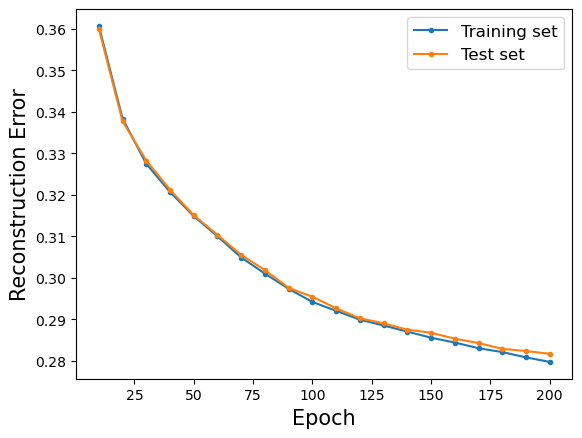

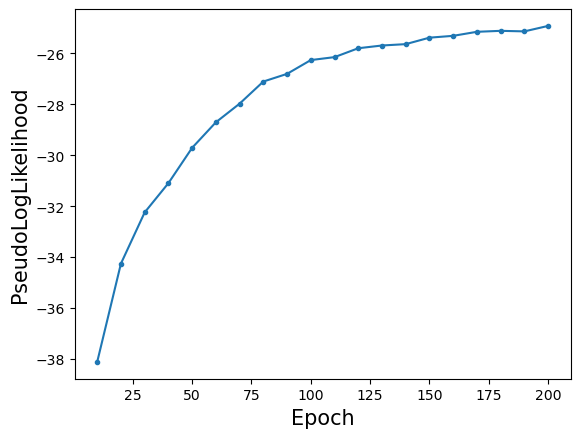

Training RBM 209/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361146 (train), 0.361362 (test), Pseud_Lik: -38.307702, Time: 1.754928, 
Ep 20, Rec er: 0.338770 (train), 0.338360 (test), Pseud_Lik: -34.413049, Time: 2.396203, 
Ep 30, Rec er: 0.327516 (train), 0.327280 (test), Pseud_Lik: -32.242156, Time: 3.363940, 
Ep 40, Rec er: 0.320658 (train), 0.320676 (test), Pseud_Lik: -30.995447, Time: 2.297471, 
Ep 50, Rec er: 0.315625 (train), 0.316491 (test), Pseud_Lik: -30.305768, Time: 2.046377, 
Ep 60, Rec er: 0.310220 (train), 0.310781 (test), Pseud_Lik: -29.563239, Time: 2.884222, 
Ep 70, Rec er: 0.305553 (train), 0.306764 (test), Pseud_Lik: -28.587435, Time: 3.158671, 
Ep 80, Rec er: 0.300943 (train), 0.301383 (test), Pseud_Lik: -27.829678, Time: 1.952727, 
Ep 90, Rec er: 0.297016 (train), 0.297683 (test), Pseud_Lik: -27.256408, Time: 2.556966, 
Ep 100, Rec er: 0.293701 (train), 0.294453 (test), P

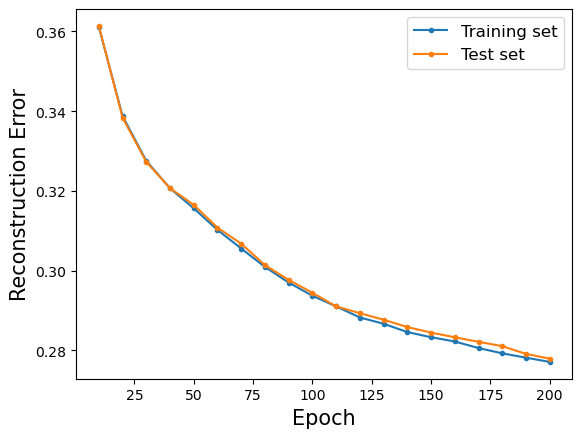

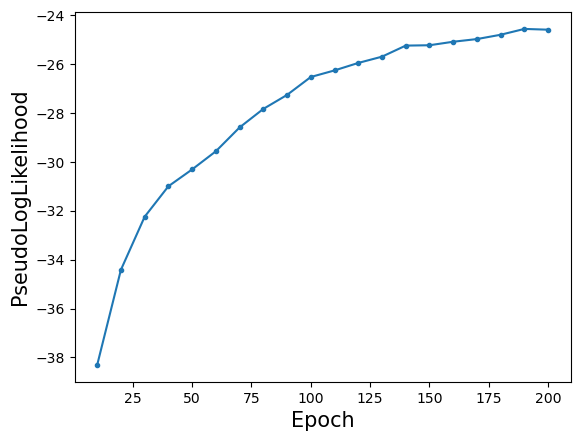

Training RBM 210/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359189 (train), 0.358884 (test), Pseud_Lik: -38.166526, Time: 1.882796, 
Ep 20, Rec er: 0.338489 (train), 0.338542 (test), Pseud_Lik: -34.321562, Time: 2.810788, 
Ep 30, Rec er: 0.328019 (train), 0.329258 (test), Pseud_Lik: -32.181769, Time: 3.088659, 
Ep 40, Rec er: 0.321548 (train), 0.321951 (test), Pseud_Lik: -30.715416, Time: 1.881302, 
Ep 50, Rec er: 0.316821 (train), 0.316672 (test), Pseud_Lik: -29.428539, Time: 2.595420, 
Ep 60, Rec er: 0.312127 (train), 0.312378 (test), Pseud_Lik: -28.692698, Time: 2.953305, 
Ep 70, Rec er: 0.307786 (train), 0.308729 (test), Pseud_Lik: -28.278118, Time: 2.898334, 
Ep 80, Rec er: 0.303525 (train), 0.304715 (test), Pseud_Lik: -27.667171, Time: 2.027408, 
Ep 90, Rec er: 0.300390 (train), 0.300787 (test), Pseud_Lik: -27.429991, Time: 1.847749, 
Ep 100, Rec er: 0.297096 (train), 0.298068 (test), P

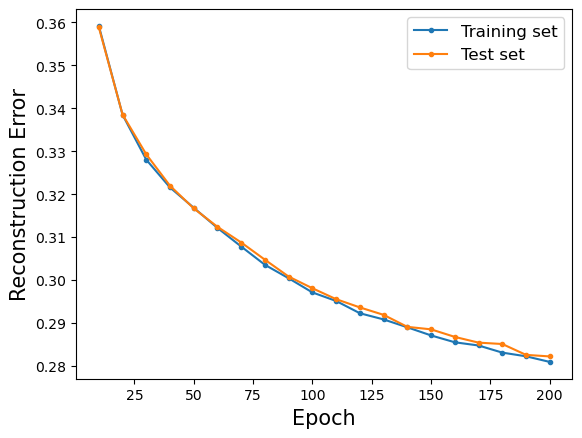

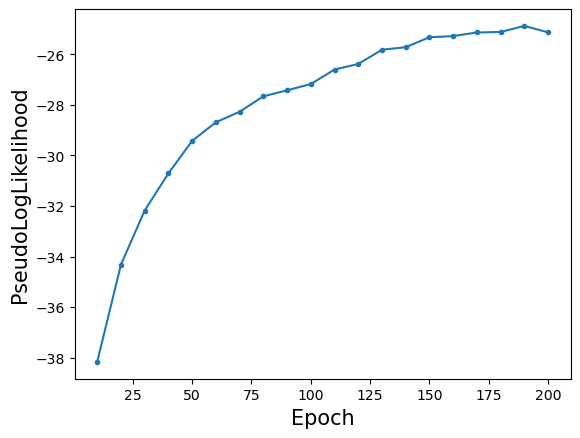

Training RBM 211/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359637 (train), 0.359353 (test), Pseud_Lik: -38.156215, Time: 1.821963, 
Ep 20, Rec er: 0.338792 (train), 0.338802 (test), Pseud_Lik: -34.243102, Time: 1.681782, 
Ep 30, Rec er: 0.328280 (train), 0.328652 (test), Pseud_Lik: -32.095751, Time: 1.808761, 
Ep 40, Rec er: 0.321380 (train), 0.322615 (test), Pseud_Lik: -30.766202, Time: 2.060412, 
Ep 50, Rec er: 0.316474 (train), 0.317392 (test), Pseud_Lik: -29.798916, Time: 1.876211, 
Ep 60, Rec er: 0.311161 (train), 0.312204 (test), Pseud_Lik: -29.030402, Time: 2.014354, 
Ep 70, Rec er: 0.306932 (train), 0.308377 (test), Pseud_Lik: -28.170376, Time: 2.140536, 
Ep 80, Rec er: 0.302848 (train), 0.304160 (test), Pseud_Lik: -27.531525, Time: 1.674256, 
Ep 90, Rec er: 0.299496 (train), 0.300651 (test), Pseud_Lik: -27.157237, Time: 1.853715, 
Ep 100, Rec er: 0.296431 (train), 0.297646 (test), P

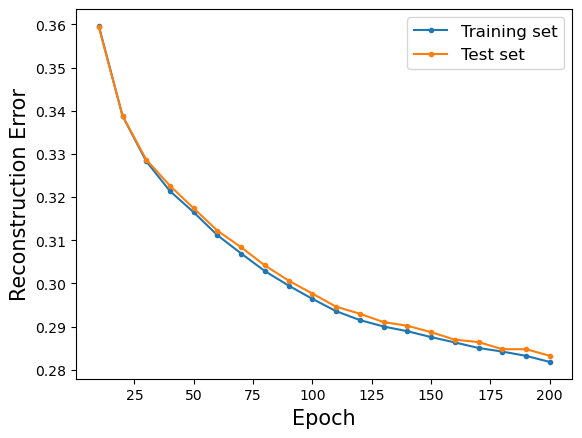

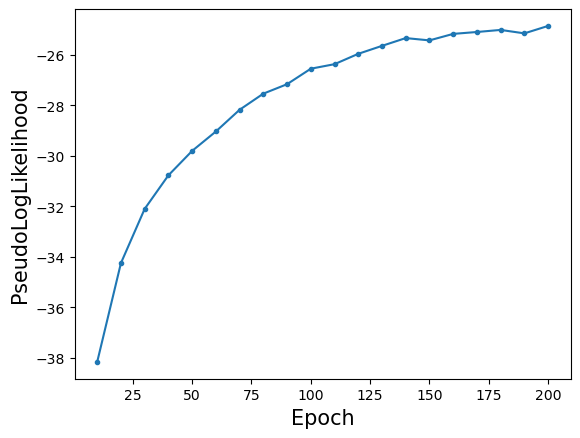

Training RBM 212/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360651 (train), 0.360432 (test), Pseud_Lik: -38.098588, Time: 1.750139, 
Ep 20, Rec er: 0.339365 (train), 0.339130 (test), Pseud_Lik: -34.678331, Time: 1.680705, 
Ep 30, Rec er: 0.328176 (train), 0.328646 (test), Pseud_Lik: -32.640097, Time: 1.743150, 
Ep 40, Rec er: 0.320595 (train), 0.321549 (test), Pseud_Lik: -30.923060, Time: 1.674965, 
Ep 50, Rec er: 0.314810 (train), 0.315784 (test), Pseud_Lik: -29.593742, Time: 1.789781, 
Ep 60, Rec er: 0.309255 (train), 0.310535 (test), Pseud_Lik: -28.893627, Time: 1.797737, 
Ep 70, Rec er: 0.304577 (train), 0.305138 (test), Pseud_Lik: -28.177395, Time: 1.663253, 
Ep 80, Rec er: 0.300432 (train), 0.300849 (test), Pseud_Lik: -27.350576, Time: 1.982251, 
Ep 90, Rec er: 0.296849 (train), 0.296911 (test), Pseud_Lik: -26.709392, Time: 1.704550, 
Ep 100, Rec er: 0.293380 (train), 0.294004 (test), P

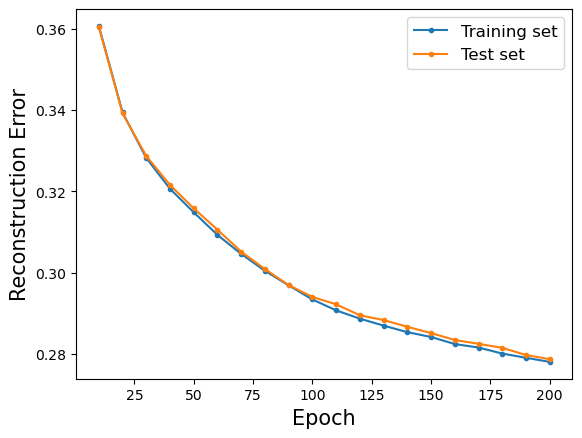

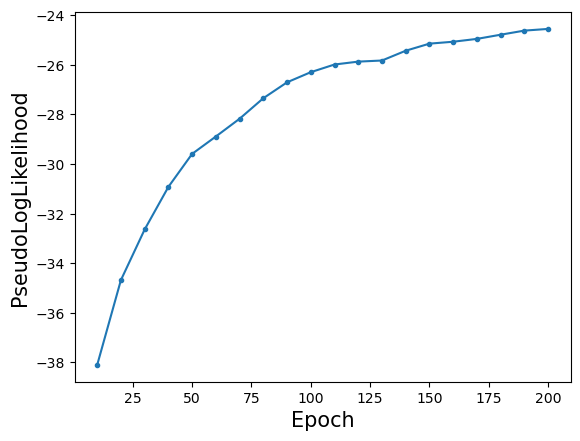

Training RBM 213/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360006 (train), 0.359020 (test), Pseud_Lik: -38.227178, Time: 2.369448, 
Ep 20, Rec er: 0.337801 (train), 0.338233 (test), Pseud_Lik: -34.381373, Time: 1.629429, 
Ep 30, Rec er: 0.327418 (train), 0.327884 (test), Pseud_Lik: -32.446253, Time: 2.353886, 
Ep 40, Rec er: 0.320703 (train), 0.321099 (test), Pseud_Lik: -30.446262, Time: 1.681285, 
Ep 50, Rec er: 0.315162 (train), 0.316455 (test), Pseud_Lik: -29.493312, Time: 2.110104, 
Ep 60, Rec er: 0.310328 (train), 0.311883 (test), Pseud_Lik: -28.762413, Time: 1.965183, 
Ep 70, Rec er: 0.305827 (train), 0.307263 (test), Pseud_Lik: -28.025056, Time: 2.779506, 
Ep 80, Rec er: 0.302789 (train), 0.303894 (test), Pseud_Lik: -27.492605, Time: 2.168015, 
Ep 90, Rec er: 0.299281 (train), 0.300282 (test), Pseud_Lik: -27.075185, Time: 1.785791, 
Ep 100, Rec er: 0.296167 (train), 0.297940 (test), P

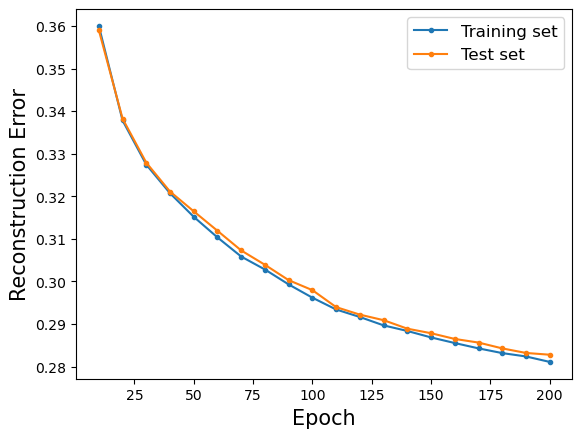

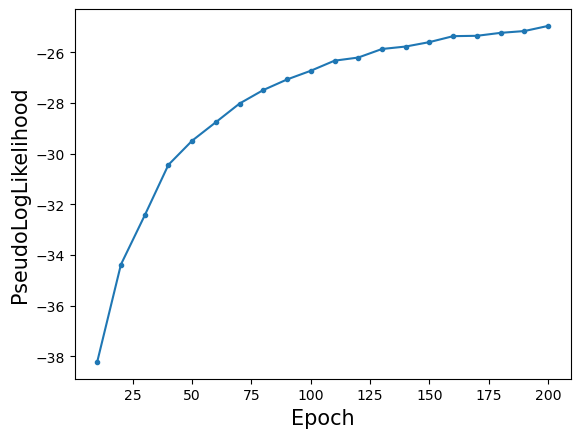

Training RBM 214/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360054 (train), 0.358830 (test), Pseud_Lik: -38.151291, Time: 1.607697, 
Ep 20, Rec er: 0.338435 (train), 0.338507 (test), Pseud_Lik: -33.990221, Time: 1.619006, 
Ep 30, Rec er: 0.328646 (train), 0.329339 (test), Pseud_Lik: -32.451112, Time: 1.673286, 
Ep 40, Rec er: 0.323141 (train), 0.323938 (test), Pseud_Lik: -30.973391, Time: 1.659171, 
Ep 50, Rec er: 0.317629 (train), 0.318675 (test), Pseud_Lik: -30.170881, Time: 1.687492, 
Ep 60, Rec er: 0.313009 (train), 0.314383 (test), Pseud_Lik: -29.452086, Time: 1.696079, 
Ep 70, Rec er: 0.308740 (train), 0.309698 (test), Pseud_Lik: -28.502474, Time: 1.890621, 
Ep 80, Rec er: 0.305223 (train), 0.305375 (test), Pseud_Lik: -27.964866, Time: 1.819941, 
Ep 90, Rec er: 0.301616 (train), 0.301812 (test), Pseud_Lik: -27.239416, Time: 1.857668, 
Ep 100, Rec er: 0.298146 (train), 0.298887 (test), P

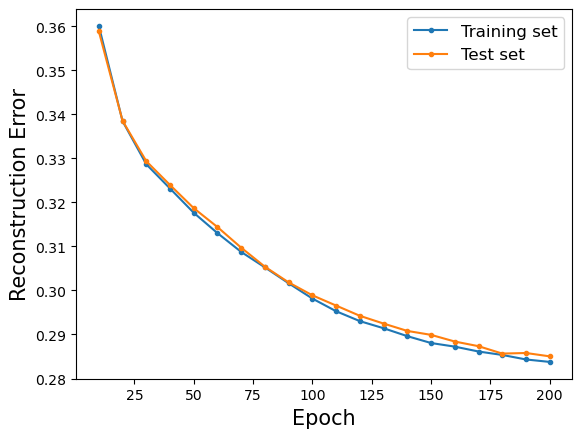

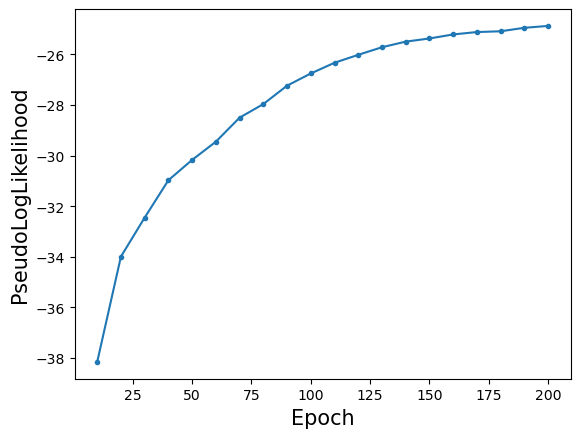

Training RBM 215/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360434 (train), 0.359887 (test), Pseud_Lik: -38.183782, Time: 2.252452, 
Ep 20, Rec er: 0.338241 (train), 0.338020 (test), Pseud_Lik: -34.307267, Time: 2.483308, 
Ep 30, Rec er: 0.329001 (train), 0.329485 (test), Pseud_Lik: -32.256730, Time: 2.537069, 
Ep 40, Rec er: 0.322181 (train), 0.323935 (test), Pseud_Lik: -30.779408, Time: 1.752375, 
Ep 50, Rec er: 0.317198 (train), 0.317891 (test), Pseud_Lik: -29.760499, Time: 2.269438, 
Ep 60, Rec er: 0.311850 (train), 0.313035 (test), Pseud_Lik: -28.788493, Time: 1.929778, 
Ep 70, Rec er: 0.307472 (train), 0.307112 (test), Pseud_Lik: -28.143502, Time: 2.147891, 
Ep 80, Rec er: 0.303620 (train), 0.304926 (test), Pseud_Lik: -27.536768, Time: 1.974321, 
Ep 90, Rec er: 0.300666 (train), 0.301447 (test), Pseud_Lik: -26.924446, Time: 2.223766, 
Ep 100, Rec er: 0.297702 (train), 0.298817 (test), P

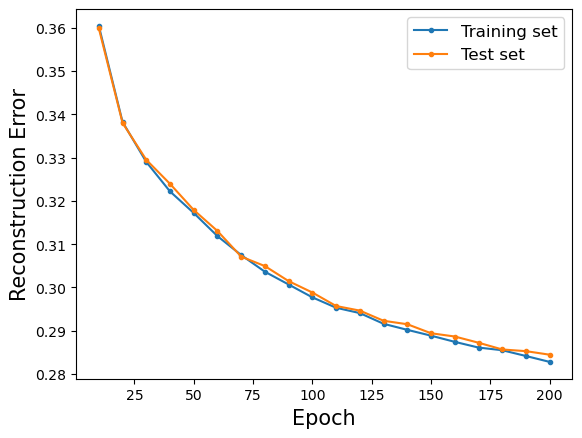

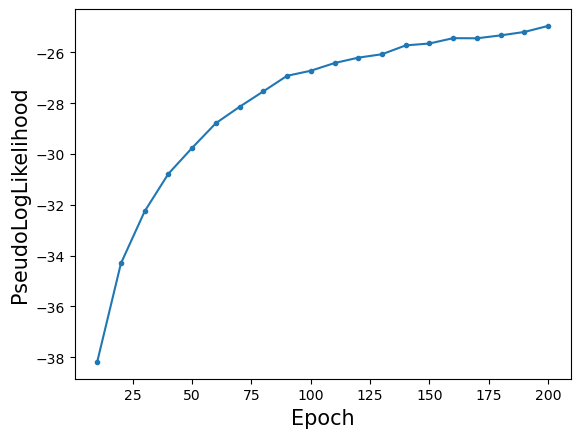

Training RBM 216/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359578 (train), 0.359686 (test), Pseud_Lik: -38.121291, Time: 2.880126, 
Ep 20, Rec er: 0.338488 (train), 0.338603 (test), Pseud_Lik: -34.101043, Time: 1.775399, 
Ep 30, Rec er: 0.328367 (train), 0.329366 (test), Pseud_Lik: -32.344831, Time: 1.931952, 
Ep 40, Rec er: 0.322319 (train), 0.322823 (test), Pseud_Lik: -30.972827, Time: 2.270818, 
Ep 50, Rec er: 0.316931 (train), 0.318206 (test), Pseud_Lik: -30.146114, Time: 2.154736, 
Ep 60, Rec er: 0.311924 (train), 0.312709 (test), Pseud_Lik: -29.063315, Time: 1.931340, 
Ep 70, Rec er: 0.307837 (train), 0.307917 (test), Pseud_Lik: -28.526702, Time: 1.785410, 
Ep 80, Rec er: 0.303341 (train), 0.304470 (test), Pseud_Lik: -27.634578, Time: 2.176282, 
Ep 90, Rec er: 0.300407 (train), 0.300425 (test), Pseud_Lik: -27.118626, Time: 2.637245, 
Ep 100, Rec er: 0.297209 (train), 0.297552 (test), P

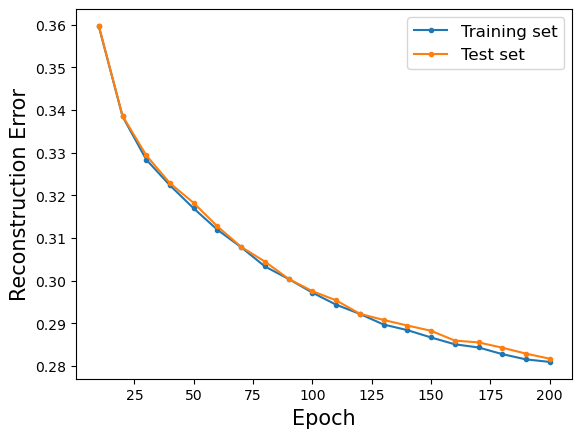

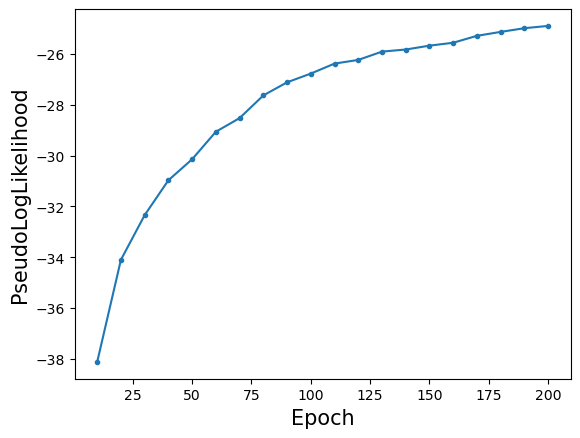

Training RBM 217/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360105 (train), 0.358638 (test), Pseud_Lik: -38.225250, Time: 2.232632, 
Ep 20, Rec er: 0.337716 (train), 0.337570 (test), Pseud_Lik: -34.112495, Time: 1.831025, 
Ep 30, Rec er: 0.327162 (train), 0.328338 (test), Pseud_Lik: -31.961518, Time: 1.808081, 
Ep 40, Rec er: 0.321636 (train), 0.321790 (test), Pseud_Lik: -30.796472, Time: 2.715176, 
Ep 50, Rec er: 0.316559 (train), 0.317279 (test), Pseud_Lik: -29.542225, Time: 2.604096, 
Ep 60, Rec er: 0.312466 (train), 0.312405 (test), Pseud_Lik: -28.607171, Time: 2.148805, 
Ep 70, Rec er: 0.308129 (train), 0.309333 (test), Pseud_Lik: -28.065680, Time: 1.877177, 
Ep 80, Rec er: 0.304040 (train), 0.305355 (test), Pseud_Lik: -27.586685, Time: 3.366891, 
Ep 90, Rec er: 0.301072 (train), 0.302384 (test), Pseud_Lik: -27.347972, Time: 2.110649, 
Ep 100, Rec er: 0.298047 (train), 0.300037 (test), P

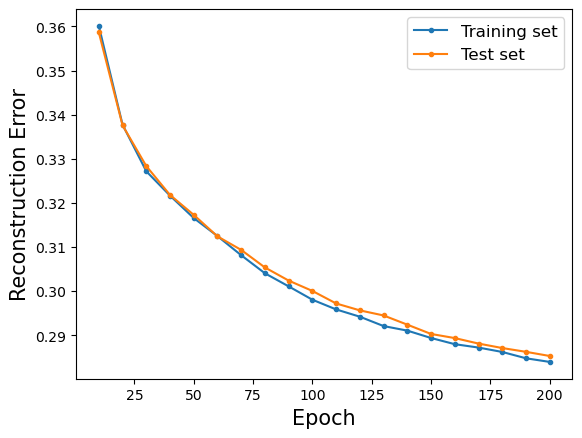

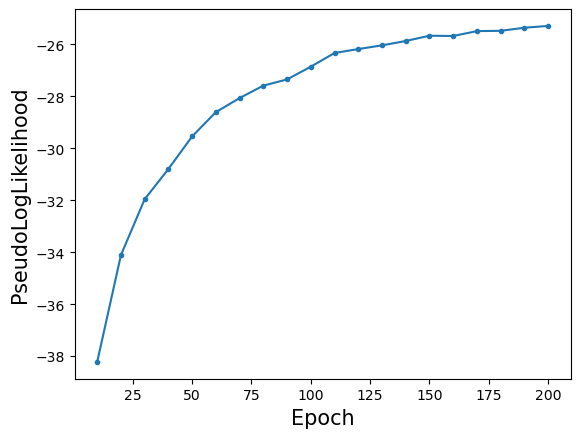

Training RBM 218/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361613 (train), 0.360834 (test), Pseud_Lik: -38.231625, Time: 1.844004, 
Ep 20, Rec er: 0.339123 (train), 0.339105 (test), Pseud_Lik: -34.595951, Time: 2.390136, 
Ep 30, Rec er: 0.328192 (train), 0.329351 (test), Pseud_Lik: -32.816881, Time: 1.781417, 
Ep 40, Rec er: 0.321484 (train), 0.321384 (test), Pseud_Lik: -31.051878, Time: 1.907021, 
Ep 50, Rec er: 0.315813 (train), 0.316881 (test), Pseud_Lik: -29.795582, Time: 2.130550, 
Ep 60, Rec er: 0.310221 (train), 0.310398 (test), Pseud_Lik: -29.042433, Time: 1.951516, 
Ep 70, Rec er: 0.305360 (train), 0.306135 (test), Pseud_Lik: -28.413065, Time: 2.812417, 
Ep 80, Rec er: 0.301454 (train), 0.301457 (test), Pseud_Lik: -27.576614, Time: 1.807842, 
Ep 90, Rec er: 0.297449 (train), 0.297201 (test), Pseud_Lik: -27.121217, Time: 2.101220, 
Ep 100, Rec er: 0.294131 (train), 0.295109 (test), P

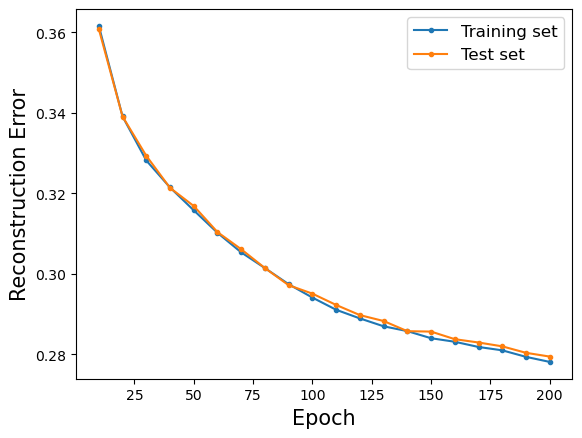

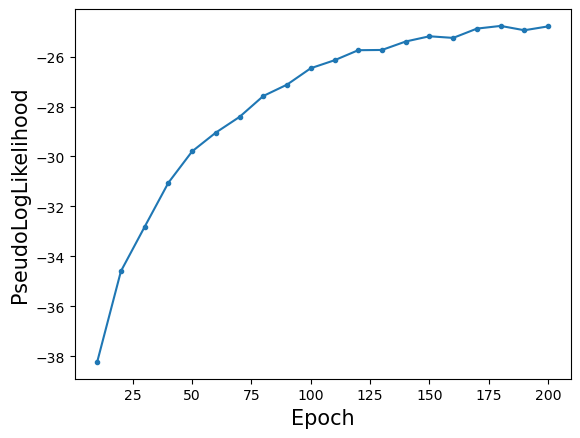

Training RBM 219/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361640 (train), 0.361674 (test), Pseud_Lik: -38.290350, Time: 2.444001, 
Ep 20, Rec er: 0.337386 (train), 0.337298 (test), Pseud_Lik: -34.614979, Time: 1.763322, 
Ep 30, Rec er: 0.325779 (train), 0.326197 (test), Pseud_Lik: -32.216019, Time: 2.244571, 
Ep 40, Rec er: 0.318001 (train), 0.318501 (test), Pseud_Lik: -30.475574, Time: 1.745555, 
Ep 50, Rec er: 0.312499 (train), 0.312841 (test), Pseud_Lik: -29.162232, Time: 2.191388, 
Ep 60, Rec er: 0.307237 (train), 0.308173 (test), Pseud_Lik: -28.371490, Time: 2.939713, 
Ep 70, Rec er: 0.302884 (train), 0.304015 (test), Pseud_Lik: -27.443690, Time: 2.182619, 
Ep 80, Rec er: 0.298576 (train), 0.300542 (test), Pseud_Lik: -26.941949, Time: 1.938055, 
Ep 90, Rec er: 0.295101 (train), 0.295303 (test), Pseud_Lik: -26.497594, Time: 2.159355, 
Ep 100, Rec er: 0.292312 (train), 0.293987 (test), P

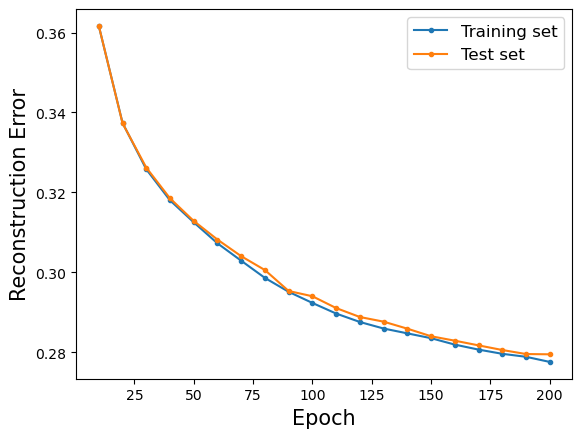

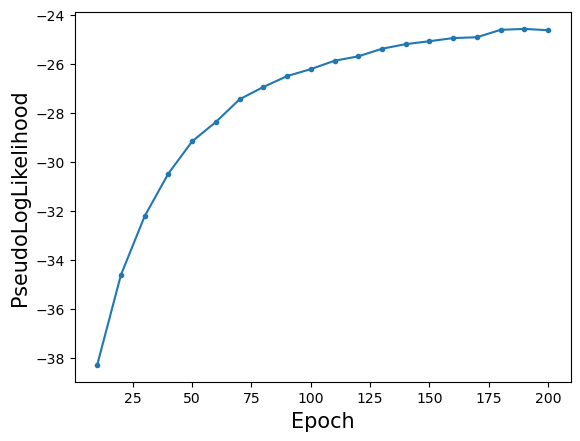

Training RBM 220/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361071 (train), 0.360645 (test), Pseud_Lik: -38.326773, Time: 2.082963, 
Ep 20, Rec er: 0.338350 (train), 0.338756 (test), Pseud_Lik: -34.472810, Time: 2.096721, 
Ep 30, Rec er: 0.326747 (train), 0.327137 (test), Pseud_Lik: -32.101703, Time: 2.442522, 
Ep 40, Rec er: 0.319448 (train), 0.321173 (test), Pseud_Lik: -30.612092, Time: 1.708198, 
Ep 50, Rec er: 0.314015 (train), 0.314649 (test), Pseud_Lik: -29.361592, Time: 2.037198, 
Ep 60, Rec er: 0.308684 (train), 0.309108 (test), Pseud_Lik: -28.567097, Time: 2.162136, 
Ep 70, Rec er: 0.303956 (train), 0.305224 (test), Pseud_Lik: -27.670069, Time: 2.084347, 
Ep 80, Rec er: 0.300867 (train), 0.300864 (test), Pseud_Lik: -26.984233, Time: 1.862852, 
Ep 90, Rec er: 0.297134 (train), 0.297722 (test), Pseud_Lik: -26.628317, Time: 1.940746, 
Ep 100, Rec er: 0.294573 (train), 0.295244 (test), P

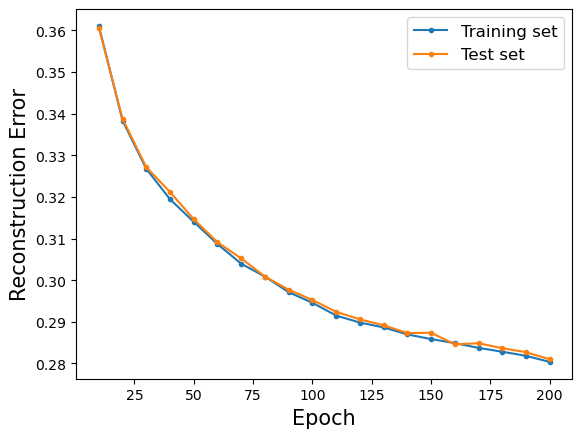

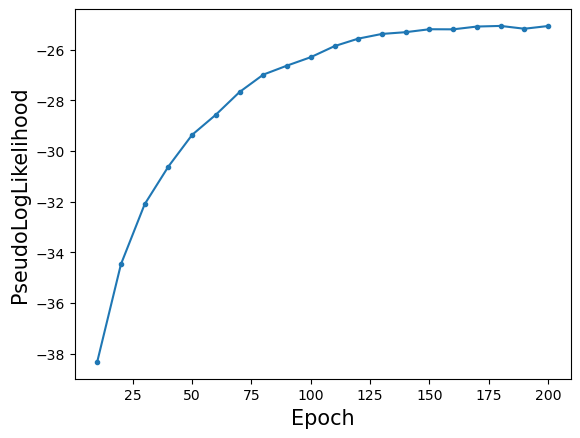

Training RBM 221/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359615 (train), 0.359967 (test), Pseud_Lik: -38.164076, Time: 2.570427, 
Ep 20, Rec er: 0.338012 (train), 0.338090 (test), Pseud_Lik: -33.999282, Time: 3.196762, 
Ep 30, Rec er: 0.327390 (train), 0.327839 (test), Pseud_Lik: -31.975913, Time: 2.636596, 
Ep 40, Rec er: 0.321637 (train), 0.322596 (test), Pseud_Lik: -30.685693, Time: 2.027334, 
Ep 50, Rec er: 0.316208 (train), 0.317173 (test), Pseud_Lik: -29.748479, Time: 2.105340, 
Ep 60, Rec er: 0.311886 (train), 0.313265 (test), Pseud_Lik: -28.901171, Time: 2.240088, 
Ep 70, Rec er: 0.307802 (train), 0.308497 (test), Pseud_Lik: -28.331745, Time: 2.011101, 
Ep 80, Rec er: 0.303580 (train), 0.304205 (test), Pseud_Lik: -27.783920, Time: 2.526731, 
Ep 90, Rec er: 0.300214 (train), 0.302103 (test), Pseud_Lik: -27.167147, Time: 1.975346, 
Ep 100, Rec er: 0.296654 (train), 0.297246 (test), P

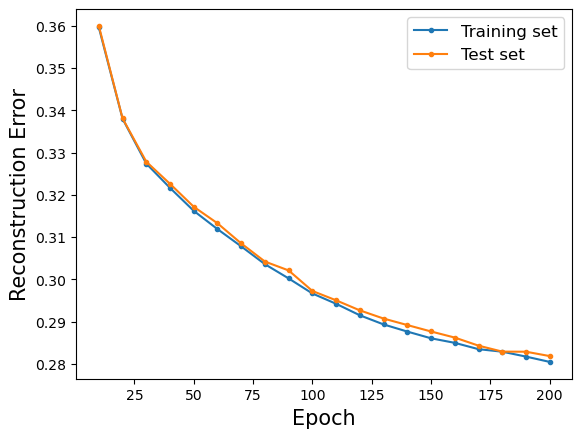

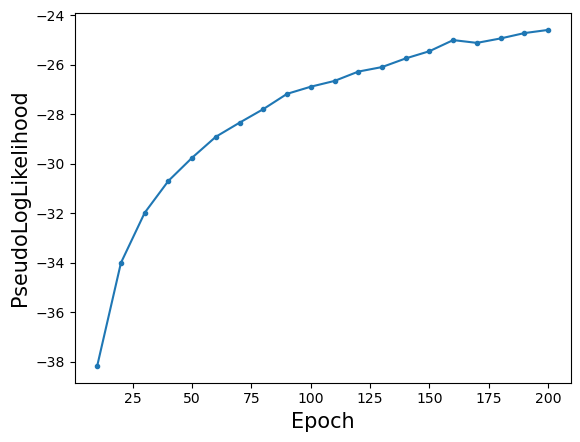

Training RBM 222/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361395 (train), 0.361227 (test), Pseud_Lik: -38.185529, Time: 1.834926, 
Ep 20, Rec er: 0.338665 (train), 0.339140 (test), Pseud_Lik: -34.409478, Time: 2.485286, 
Ep 30, Rec er: 0.327472 (train), 0.328999 (test), Pseud_Lik: -32.612553, Time: 1.904150, 
Ep 40, Rec er: 0.319723 (train), 0.320725 (test), Pseud_Lik: -30.605398, Time: 2.312092, 
Ep 50, Rec er: 0.314204 (train), 0.314885 (test), Pseud_Lik: -29.487268, Time: 1.755450, 
Ep 60, Rec er: 0.309488 (train), 0.310801 (test), Pseud_Lik: -28.422965, Time: 1.872985, 
Ep 70, Rec er: 0.305065 (train), 0.306239 (test), Pseud_Lik: -27.699491, Time: 1.964525, 
Ep 80, Rec er: 0.300842 (train), 0.301813 (test), Pseud_Lik: -27.100539, Time: 1.709815, 
Ep 90, Rec er: 0.297362 (train), 0.298638 (test), Pseud_Lik: -26.740466, Time: 1.786630, 
Ep 100, Rec er: 0.294906 (train), 0.295863 (test), P

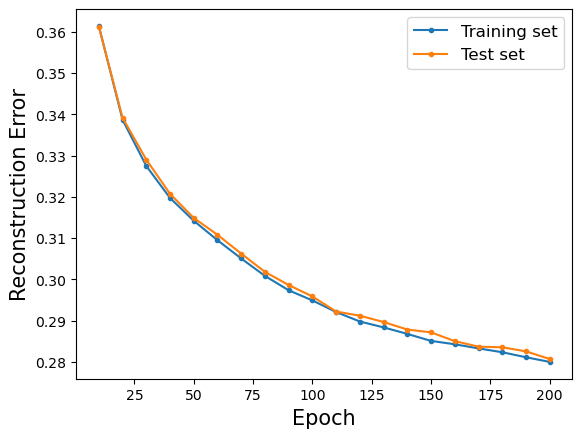

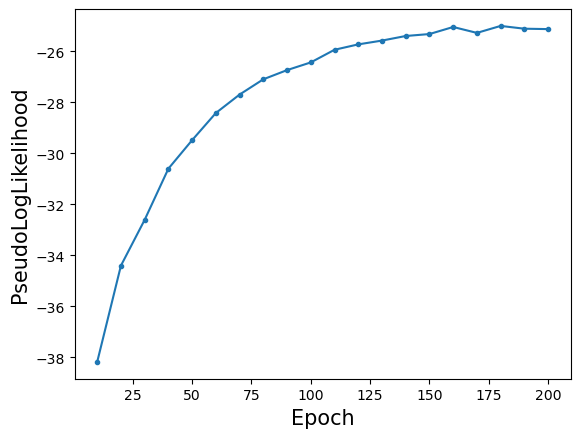

Training RBM 223/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359449 (train), 0.358290 (test), Pseud_Lik: -38.208939, Time: 1.663238, 
Ep 20, Rec er: 0.337346 (train), 0.337902 (test), Pseud_Lik: -34.070714, Time: 1.674832, 
Ep 30, Rec er: 0.327989 (train), 0.328766 (test), Pseud_Lik: -31.836629, Time: 1.669239, 
Ep 40, Rec er: 0.321859 (train), 0.323180 (test), Pseud_Lik: -30.672777, Time: 1.620260, 
Ep 50, Rec er: 0.317094 (train), 0.317306 (test), Pseud_Lik: -29.828966, Time: 2.628980, 
Ep 60, Rec er: 0.311957 (train), 0.312161 (test), Pseud_Lik: -28.806469, Time: 1.639564, 
Ep 70, Rec er: 0.307923 (train), 0.308243 (test), Pseud_Lik: -28.283259, Time: 1.710362, 
Ep 80, Rec er: 0.304460 (train), 0.305831 (test), Pseud_Lik: -27.557858, Time: 1.733192, 
Ep 90, Rec er: 0.301014 (train), 0.302432 (test), Pseud_Lik: -27.051893, Time: 1.707291, 
Ep 100, Rec er: 0.298290 (train), 0.298950 (test), P

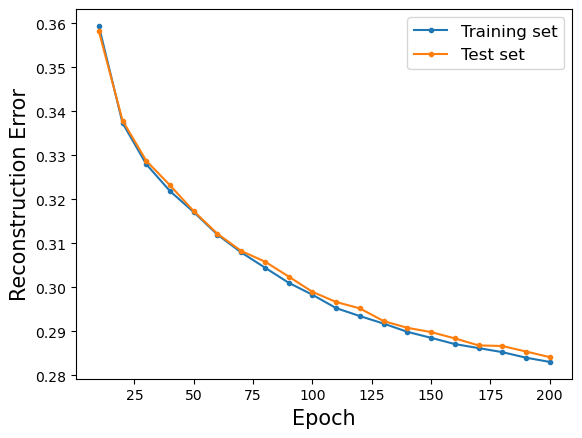

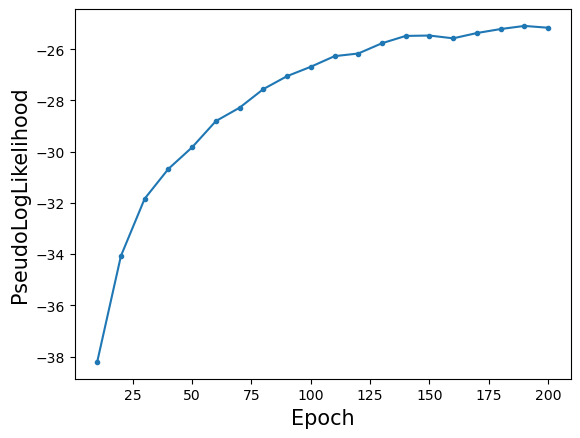

Training RBM 224/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360110 (train), 0.359477 (test), Pseud_Lik: -38.273703, Time: 2.261652, 
Ep 20, Rec er: 0.338913 (train), 0.338996 (test), Pseud_Lik: -34.389679, Time: 1.879366, 
Ep 30, Rec er: 0.328040 (train), 0.328078 (test), Pseud_Lik: -32.735869, Time: 3.107935, 
Ep 40, Rec er: 0.321003 (train), 0.321915 (test), Pseud_Lik: -30.984805, Time: 2.514125, 
Ep 50, Rec er: 0.316174 (train), 0.316845 (test), Pseud_Lik: -29.628691, Time: 2.825980, 
Ep 60, Rec er: 0.310593 (train), 0.311849 (test), Pseud_Lik: -28.885456, Time: 1.857930, 
Ep 70, Rec er: 0.306623 (train), 0.306634 (test), Pseud_Lik: -27.882376, Time: 1.948909, 
Ep 80, Rec er: 0.302530 (train), 0.303696 (test), Pseud_Lik: -27.565168, Time: 1.890515, 
Ep 90, Rec er: 0.299026 (train), 0.299373 (test), Pseud_Lik: -27.167326, Time: 2.002721, 
Ep 100, Rec er: 0.296301 (train), 0.297122 (test), P

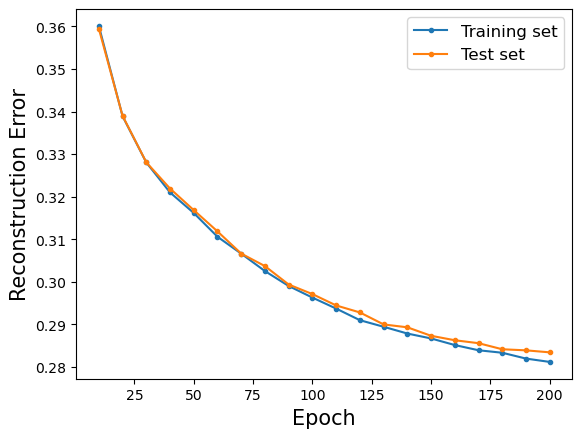

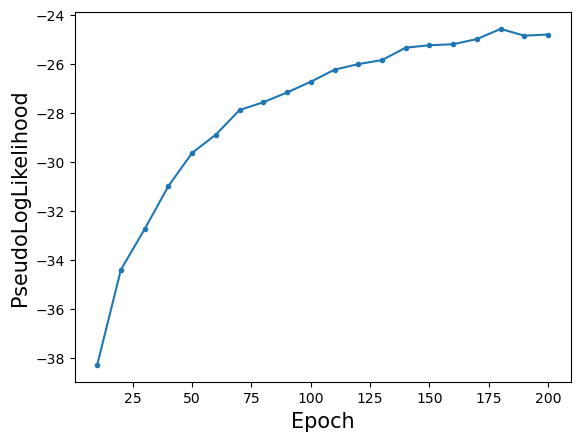

Training RBM 225/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361163 (train), 0.360506 (test), Pseud_Lik: -38.426501, Time: 2.786846, 
Ep 20, Rec er: 0.337751 (train), 0.338644 (test), Pseud_Lik: -34.291173, Time: 1.764297, 
Ep 30, Rec er: 0.327196 (train), 0.326957 (test), Pseud_Lik: -32.110453, Time: 1.748223, 
Ep 40, Rec er: 0.321099 (train), 0.321736 (test), Pseud_Lik: -30.554454, Time: 1.786233, 
Ep 50, Rec er: 0.316548 (train), 0.316291 (test), Pseud_Lik: -29.591858, Time: 2.703430, 
Ep 60, Rec er: 0.311772 (train), 0.312514 (test), Pseud_Lik: -28.953613, Time: 2.596140, 
Ep 70, Rec er: 0.307134 (train), 0.307691 (test), Pseud_Lik: -28.252357, Time: 2.001580, 
Ep 80, Rec er: 0.302864 (train), 0.303192 (test), Pseud_Lik: -27.605239, Time: 2.127296, 
Ep 90, Rec er: 0.299540 (train), 0.299646 (test), Pseud_Lik: -27.246689, Time: 2.754350, 
Ep 100, Rec er: 0.295917 (train), 0.296738 (test), P

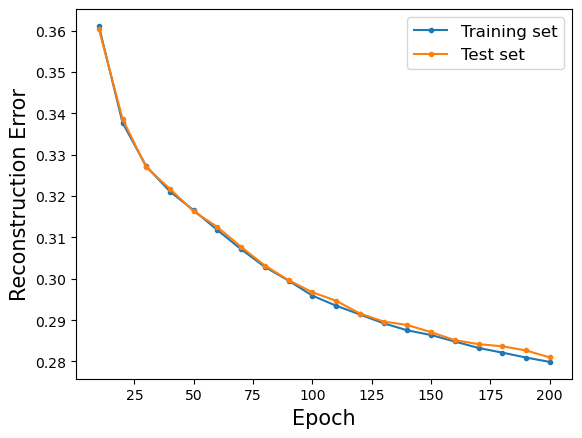

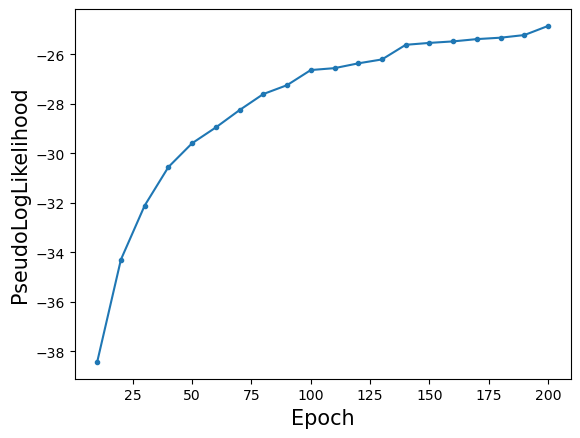

Training RBM 226/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360833 (train), 0.360347 (test), Pseud_Lik: -38.312433, Time: 1.964880, 
Ep 20, Rec er: 0.338964 (train), 0.338879 (test), Pseud_Lik: -34.493493, Time: 1.699238, 
Ep 30, Rec er: 0.327253 (train), 0.328390 (test), Pseud_Lik: -32.298943, Time: 1.872242, 
Ep 40, Rec er: 0.320115 (train), 0.321065 (test), Pseud_Lik: -30.720754, Time: 2.395209, 
Ep 50, Rec er: 0.314350 (train), 0.315125 (test), Pseud_Lik: -29.381446, Time: 1.982645, 
Ep 60, Rec er: 0.309348 (train), 0.310030 (test), Pseud_Lik: -28.428904, Time: 2.552682, 
Ep 70, Rec er: 0.304861 (train), 0.305821 (test), Pseud_Lik: -27.857956, Time: 1.813872, 
Ep 80, Rec er: 0.300638 (train), 0.302114 (test), Pseud_Lik: -27.233652, Time: 2.044260, 
Ep 90, Rec er: 0.297386 (train), 0.298471 (test), Pseud_Lik: -26.947709, Time: 1.770980, 
Ep 100, Rec er: 0.295023 (train), 0.294728 (test), P

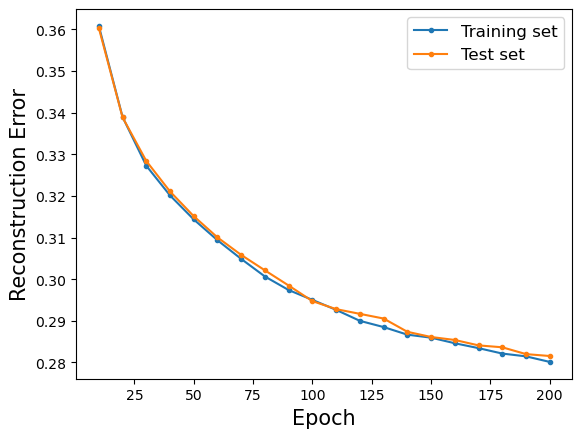

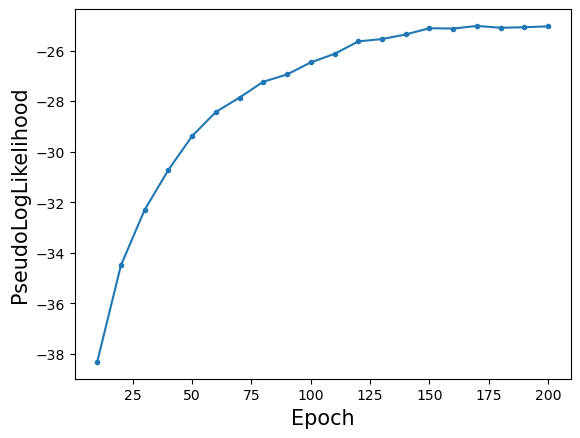

Training RBM 227/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362218 (train), 0.362312 (test), Pseud_Lik: -38.364323, Time: 1.750730, 
Ep 20, Rec er: 0.338975 (train), 0.338372 (test), Pseud_Lik: -34.623223, Time: 2.587208, 
Ep 30, Rec er: 0.327567 (train), 0.328398 (test), Pseud_Lik: -32.484033, Time: 2.537332, 
Ep 40, Rec er: 0.319764 (train), 0.321026 (test), Pseud_Lik: -30.941483, Time: 1.840330, 
Ep 50, Rec er: 0.314493 (train), 0.315129 (test), Pseud_Lik: -29.758988, Time: 1.698622, 
Ep 60, Rec er: 0.309282 (train), 0.309642 (test), Pseud_Lik: -28.624445, Time: 2.040840, 
Ep 70, Rec er: 0.304765 (train), 0.305100 (test), Pseud_Lik: -28.043820, Time: 2.894806, 
Ep 80, Rec er: 0.300516 (train), 0.301132 (test), Pseud_Lik: -27.357098, Time: 2.375644, 
Ep 90, Rec er: 0.297006 (train), 0.297044 (test), Pseud_Lik: -27.027004, Time: 1.860019, 
Ep 100, Rec er: 0.293715 (train), 0.294948 (test), P

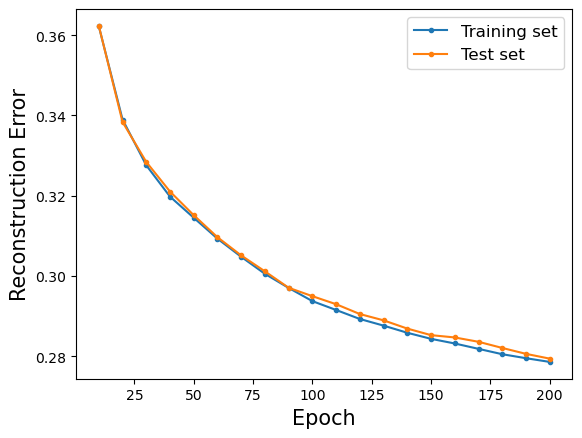

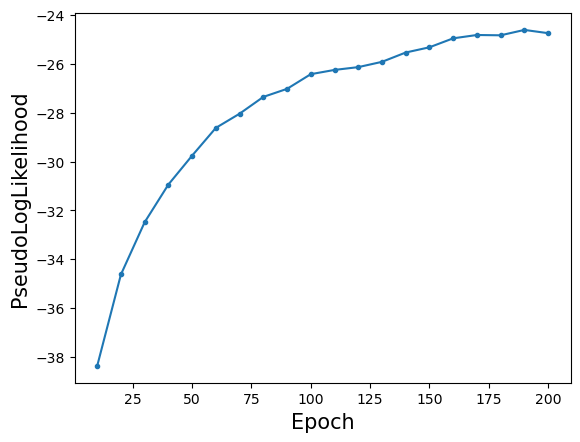

Training RBM 228/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360004 (train), 0.358941 (test), Pseud_Lik: -38.176795, Time: 2.130608, 
Ep 20, Rec er: 0.338097 (train), 0.338495 (test), Pseud_Lik: -34.035673, Time: 1.686153, 
Ep 30, Rec er: 0.327329 (train), 0.327888 (test), Pseud_Lik: -31.838666, Time: 1.928235, 
Ep 40, Rec er: 0.321808 (train), 0.322077 (test), Pseud_Lik: -30.853799, Time: 1.791547, 
Ep 50, Rec er: 0.316634 (train), 0.316997 (test), Pseud_Lik: -30.103706, Time: 2.496374, 
Ep 60, Rec er: 0.311990 (train), 0.312875 (test), Pseud_Lik: -29.099497, Time: 1.902290, 
Ep 70, Rec er: 0.307622 (train), 0.307783 (test), Pseud_Lik: -28.459896, Time: 1.858813, 
Ep 80, Rec er: 0.303335 (train), 0.303108 (test), Pseud_Lik: -27.817969, Time: 2.535209, 
Ep 90, Rec er: 0.299390 (train), 0.299832 (test), Pseud_Lik: -27.152881, Time: 1.925378, 
Ep 100, Rec er: 0.296494 (train), 0.296850 (test), P

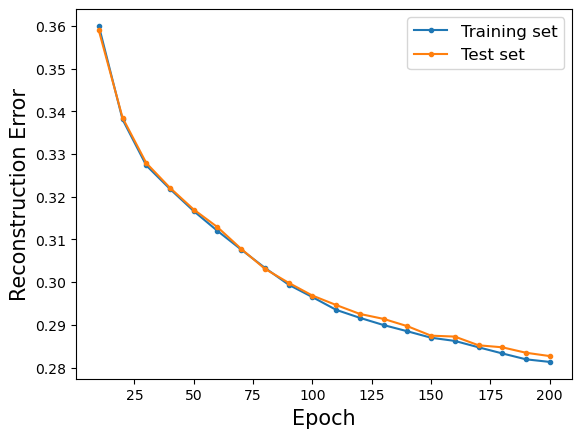

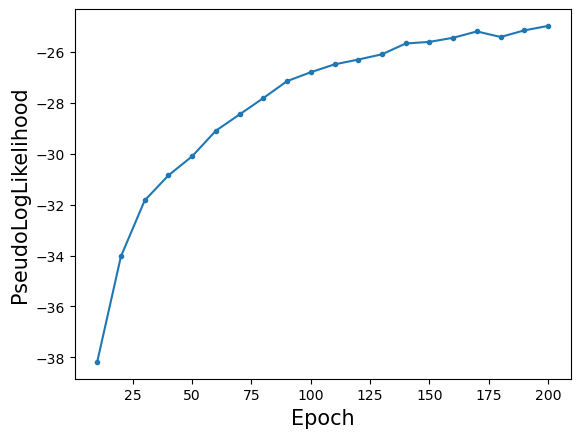

Training RBM 229/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359849 (train), 0.359854 (test), Pseud_Lik: -38.245206, Time: 2.330652, 
Ep 20, Rec er: 0.338358 (train), 0.338479 (test), Pseud_Lik: -34.391964, Time: 1.776112, 
Ep 30, Rec er: 0.327531 (train), 0.326760 (test), Pseud_Lik: -32.272796, Time: 1.743617, 
Ep 40, Rec er: 0.321207 (train), 0.321920 (test), Pseud_Lik: -30.510102, Time: 2.541129, 
Ep 50, Rec er: 0.316311 (train), 0.317085 (test), Pseud_Lik: -29.782647, Time: 2.308838, 
Ep 60, Rec er: 0.311327 (train), 0.311813 (test), Pseud_Lik: -28.910018, Time: 2.454615, 
Ep 70, Rec er: 0.307090 (train), 0.306369 (test), Pseud_Lik: -28.101416, Time: 1.842795, 
Ep 80, Rec er: 0.302971 (train), 0.302973 (test), Pseud_Lik: -27.450813, Time: 1.960040, 
Ep 90, Rec er: 0.299428 (train), 0.300570 (test), Pseud_Lik: -27.185826, Time: 2.429003, 
Ep 100, Rec er: 0.296308 (train), 0.297582 (test), P

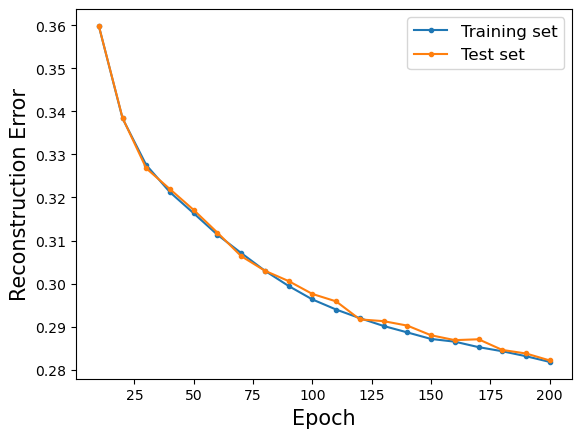

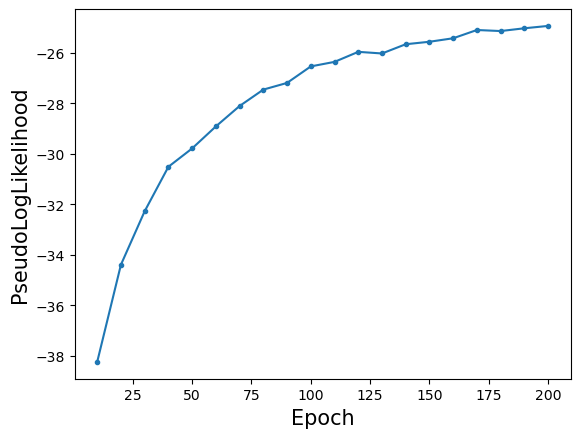

Training RBM 230/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361179 (train), 0.360976 (test), Pseud_Lik: -38.457026, Time: 2.172936, 
Ep 20, Rec er: 0.338088 (train), 0.338845 (test), Pseud_Lik: -34.349744, Time: 1.779328, 
Ep 30, Rec er: 0.326908 (train), 0.327533 (test), Pseud_Lik: -32.235095, Time: 2.682801, 
Ep 40, Rec er: 0.320575 (train), 0.320757 (test), Pseud_Lik: -30.528163, Time: 1.769134, 
Ep 50, Rec er: 0.315268 (train), 0.316251 (test), Pseud_Lik: -29.581139, Time: 2.086585, 
Ep 60, Rec er: 0.310605 (train), 0.311430 (test), Pseud_Lik: -28.713679, Time: 1.877801, 
Ep 70, Rec er: 0.306359 (train), 0.306945 (test), Pseud_Lik: -27.776879, Time: 2.873580, 
Ep 80, Rec er: 0.302278 (train), 0.303919 (test), Pseud_Lik: -27.025088, Time: 2.944809, 
Ep 90, Rec er: 0.299356 (train), 0.299545 (test), Pseud_Lik: -26.800850, Time: 2.217835, 
Ep 100, Rec er: 0.296401 (train), 0.297351 (test), P

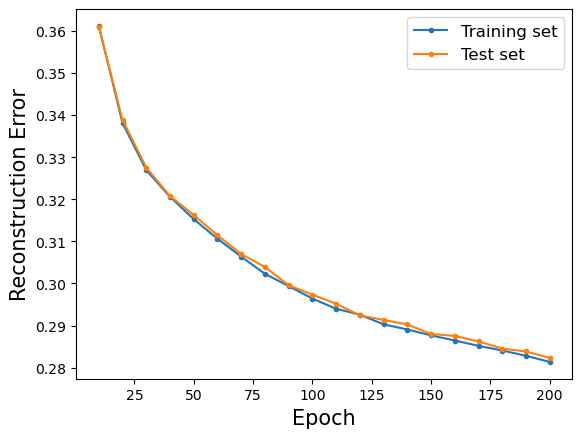

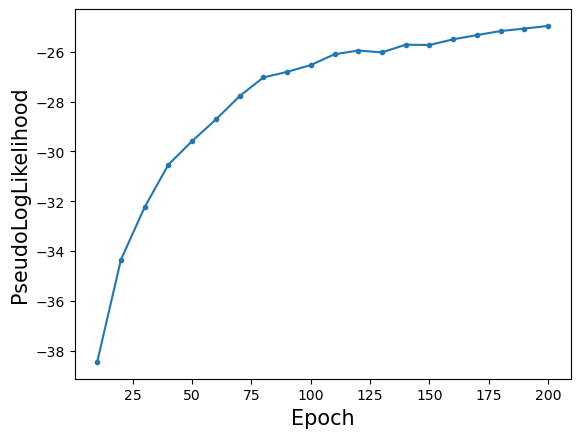

Training RBM 231/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361608 (train), 0.361217 (test), Pseud_Lik: -38.362764, Time: 1.814048, 
Ep 20, Rec er: 0.338884 (train), 0.339920 (test), Pseud_Lik: -34.398242, Time: 1.868208, 
Ep 30, Rec er: 0.328051 (train), 0.327996 (test), Pseud_Lik: -32.471877, Time: 1.914340, 
Ep 40, Rec er: 0.319513 (train), 0.319815 (test), Pseud_Lik: -30.891921, Time: 2.122327, 
Ep 50, Rec er: 0.313401 (train), 0.314430 (test), Pseud_Lik: -29.411473, Time: 2.483771, 
Ep 60, Rec er: 0.308717 (train), 0.308886 (test), Pseud_Lik: -28.593821, Time: 2.846455, 
Ep 70, Rec er: 0.304461 (train), 0.305116 (test), Pseud_Lik: -28.097372, Time: 2.313214, 
Ep 80, Rec er: 0.300249 (train), 0.300865 (test), Pseud_Lik: -27.298132, Time: 2.066823, 
Ep 90, Rec er: 0.296933 (train), 0.296903 (test), Pseud_Lik: -27.044154, Time: 1.816469, 
Ep 100, Rec er: 0.293783 (train), 0.295023 (test), P

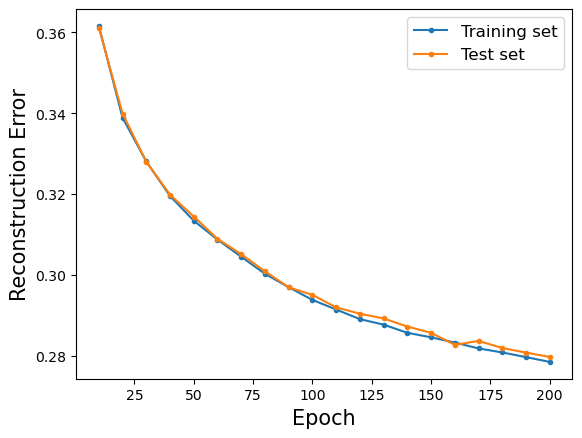

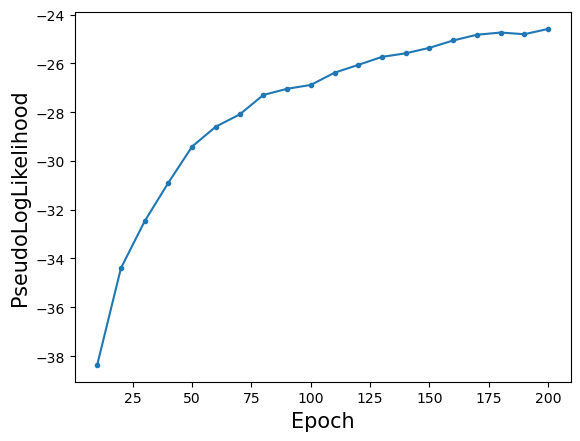

Training RBM 232/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362198 (train), 0.362667 (test), Pseud_Lik: -38.423630, Time: 2.205987, 
Ep 20, Rec er: 0.338607 (train), 0.338874 (test), Pseud_Lik: -34.451914, Time: 1.729689, 
Ep 30, Rec er: 0.327993 (train), 0.329114 (test), Pseud_Lik: -32.188794, Time: 1.722196, 
Ep 40, Rec er: 0.320972 (train), 0.321375 (test), Pseud_Lik: -30.475866, Time: 1.696677, 
Ep 50, Rec er: 0.315469 (train), 0.317433 (test), Pseud_Lik: -29.545563, Time: 1.734756, 
Ep 60, Rec er: 0.310375 (train), 0.311862 (test), Pseud_Lik: -28.688850, Time: 1.723896, 
Ep 70, Rec er: 0.306439 (train), 0.306701 (test), Pseud_Lik: -28.096389, Time: 1.779425, 
Ep 80, Rec er: 0.302595 (train), 0.302987 (test), Pseud_Lik: -27.311380, Time: 1.718186, 
Ep 90, Rec er: 0.299029 (train), 0.299828 (test), Pseud_Lik: -26.965285, Time: 1.803044, 
Ep 100, Rec er: 0.296015 (train), 0.296437 (test), P

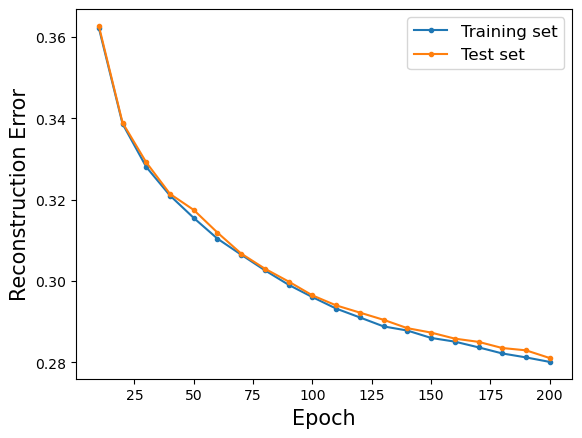

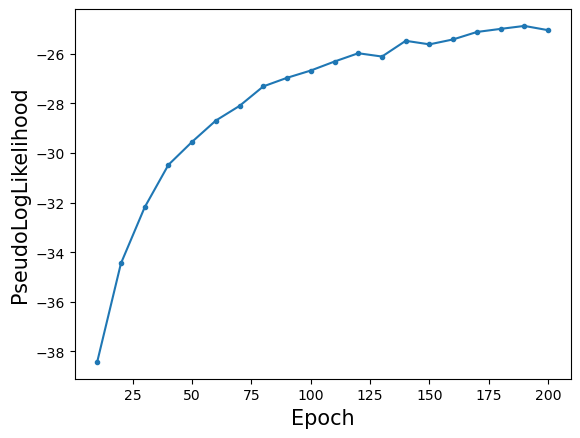

Training RBM 233/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361541 (train), 0.361308 (test), Pseud_Lik: -38.462817, Time: 1.939763, 
Ep 20, Rec er: 0.339836 (train), 0.339238 (test), Pseud_Lik: -34.568383, Time: 2.075504, 
Ep 30, Rec er: 0.328202 (train), 0.329594 (test), Pseud_Lik: -32.598819, Time: 2.717903, 
Ep 40, Rec er: 0.320786 (train), 0.321138 (test), Pseud_Lik: -30.886300, Time: 2.596610, 
Ep 50, Rec er: 0.314995 (train), 0.315211 (test), Pseud_Lik: -29.690585, Time: 2.848842, 
Ep 60, Rec er: 0.309527 (train), 0.310756 (test), Pseud_Lik: -28.710282, Time: 1.793893, 
Ep 70, Rec er: 0.305436 (train), 0.305490 (test), Pseud_Lik: -27.802662, Time: 2.395742, 
Ep 80, Rec er: 0.301052 (train), 0.302173 (test), Pseud_Lik: -27.494995, Time: 2.019678, 
Ep 90, Rec er: 0.297978 (train), 0.298389 (test), Pseud_Lik: -27.142915, Time: 1.932765, 
Ep 100, Rec er: 0.294400 (train), 0.295452 (test), P

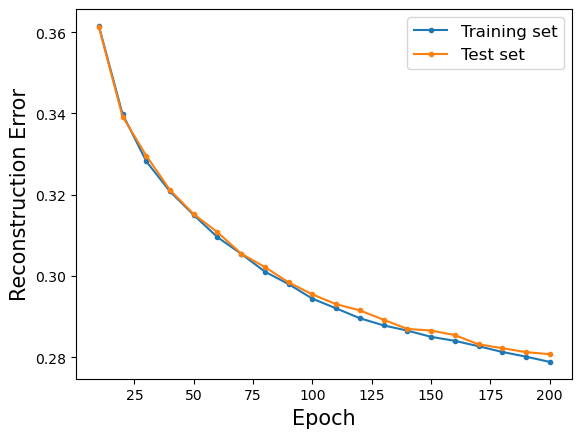

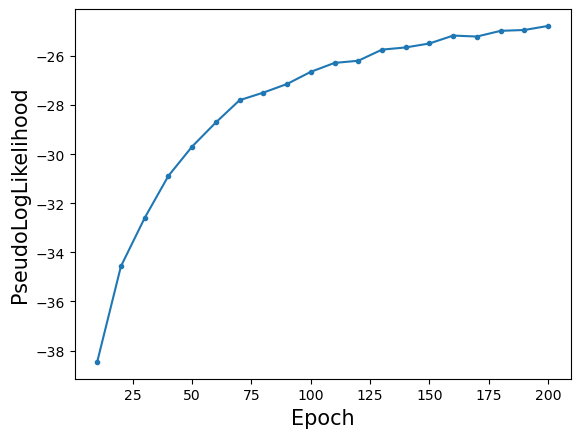

Training RBM 234/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359567 (train), 0.359410 (test), Pseud_Lik: -38.145465, Time: 1.894348, 
Ep 20, Rec er: 0.337708 (train), 0.338533 (test), Pseud_Lik: -34.195636, Time: 1.743125, 
Ep 30, Rec er: 0.328131 (train), 0.327960 (test), Pseud_Lik: -32.315848, Time: 2.261629, 
Ep 40, Rec er: 0.321747 (train), 0.322916 (test), Pseud_Lik: -31.195377, Time: 1.738605, 
Ep 50, Rec er: 0.316582 (train), 0.317223 (test), Pseud_Lik: -30.117227, Time: 1.791345, 
Ep 60, Rec er: 0.311328 (train), 0.311851 (test), Pseud_Lik: -29.296043, Time: 2.227886, 
Ep 70, Rec er: 0.306622 (train), 0.307717 (test), Pseud_Lik: -28.326097, Time: 1.852865, 
Ep 80, Rec er: 0.302054 (train), 0.303478 (test), Pseud_Lik: -27.517794, Time: 1.769207, 
Ep 90, Rec er: 0.298880 (train), 0.300526 (test), Pseud_Lik: -27.153194, Time: 1.845556, 
Ep 100, Rec er: 0.295482 (train), 0.297163 (test), P

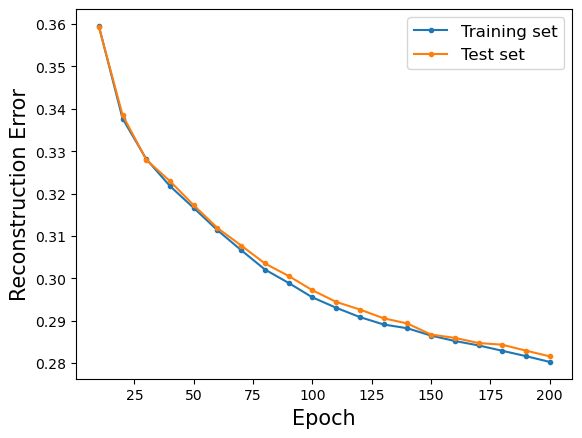

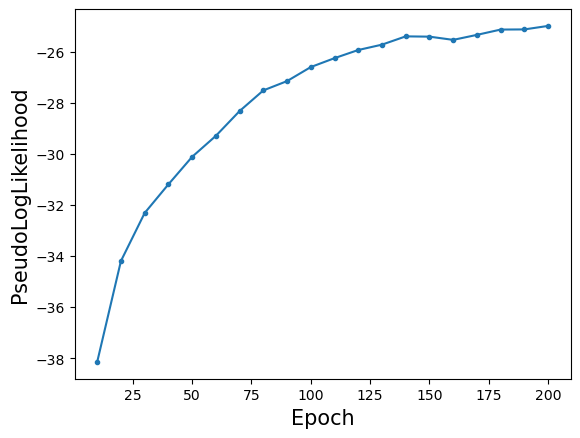

Training RBM 235/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361232 (train), 0.360033 (test), Pseud_Lik: -38.123100, Time: 1.819996, 
Ep 20, Rec er: 0.337936 (train), 0.337721 (test), Pseud_Lik: -34.181915, Time: 1.711148, 
Ep 30, Rec er: 0.327146 (train), 0.327532 (test), Pseud_Lik: -31.875883, Time: 1.623644, 
Ep 40, Rec er: 0.320965 (train), 0.321429 (test), Pseud_Lik: -31.119193, Time: 1.661294, 
Ep 50, Rec er: 0.315291 (train), 0.316605 (test), Pseud_Lik: -29.906045, Time: 1.697770, 
Ep 60, Rec er: 0.310362 (train), 0.311774 (test), Pseud_Lik: -28.974017, Time: 1.823728, 
Ep 70, Rec er: 0.305988 (train), 0.306566 (test), Pseud_Lik: -28.172263, Time: 1.716333, 
Ep 80, Rec er: 0.301958 (train), 0.302448 (test), Pseud_Lik: -27.671571, Time: 1.764468, 
Ep 90, Rec er: 0.298166 (train), 0.299499 (test), Pseud_Lik: -26.761017, Time: 1.812484, 
Ep 100, Rec er: 0.295292 (train), 0.296471 (test), P

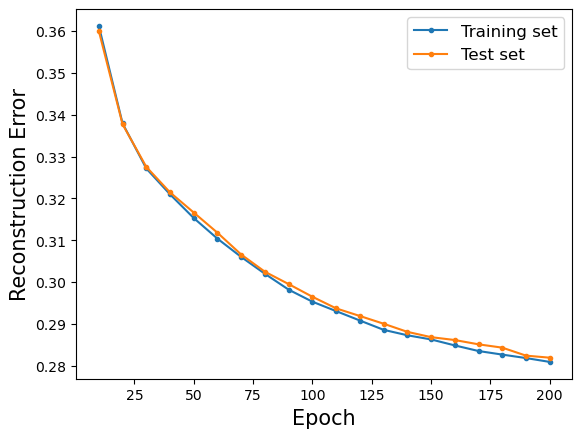

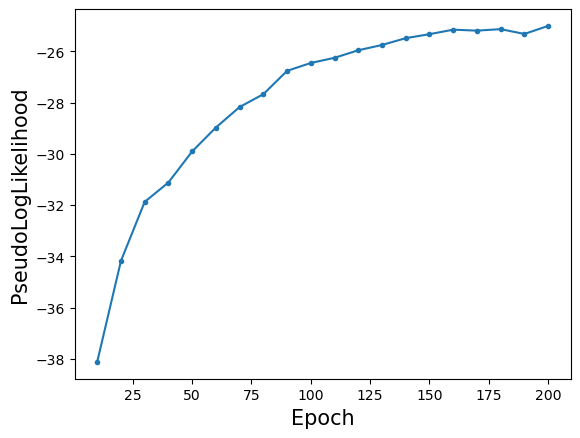

Training RBM 236/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360662 (train), 0.360178 (test), Pseud_Lik: -38.117035, Time: 3.136975, 
Ep 20, Rec er: 0.338969 (train), 0.339647 (test), Pseud_Lik: -34.104872, Time: 2.174640, 
Ep 30, Rec er: 0.329076 (train), 0.329214 (test), Pseud_Lik: -32.087539, Time: 2.324782, 
Ep 40, Rec er: 0.322187 (train), 0.322806 (test), Pseud_Lik: -31.088645, Time: 2.443309, 
Ep 50, Rec er: 0.316486 (train), 0.317336 (test), Pseud_Lik: -30.451829, Time: 2.445234, 
Ep 60, Rec er: 0.311558 (train), 0.312319 (test), Pseud_Lik: -29.318067, Time: 2.764915, 
Ep 70, Rec er: 0.306729 (train), 0.307709 (test), Pseud_Lik: -28.425346, Time: 1.956755, 
Ep 80, Rec er: 0.302978 (train), 0.303654 (test), Pseud_Lik: -27.525043, Time: 2.080827, 
Ep 90, Rec er: 0.299430 (train), 0.298801 (test), Pseud_Lik: -27.045683, Time: 2.090445, 
Ep 100, Rec er: 0.296184 (train), 0.297422 (test), P

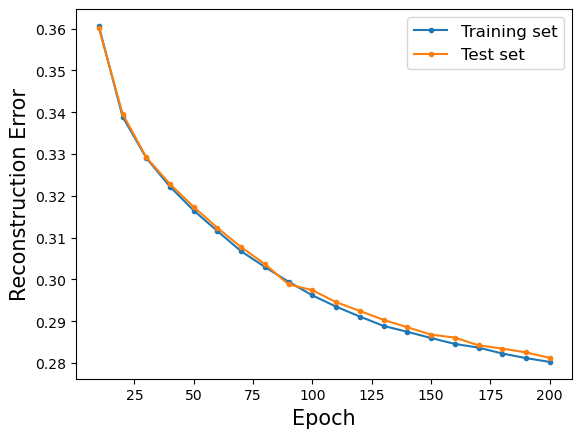

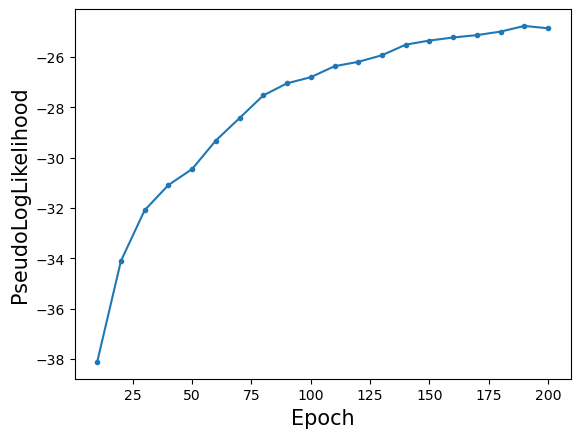

Training RBM 237/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361310 (train), 0.359903 (test), Pseud_Lik: -38.213306, Time: 1.807526, 
Ep 20, Rec er: 0.338595 (train), 0.339814 (test), Pseud_Lik: -34.288744, Time: 1.923466, 
Ep 30, Rec er: 0.327756 (train), 0.327978 (test), Pseud_Lik: -32.155128, Time: 1.914197, 
Ep 40, Rec er: 0.321093 (train), 0.321927 (test), Pseud_Lik: -30.684816, Time: 1.798084, 
Ep 50, Rec er: 0.315961 (train), 0.317587 (test), Pseud_Lik: -29.837137, Time: 1.812997, 
Ep 60, Rec er: 0.311809 (train), 0.312326 (test), Pseud_Lik: -28.880323, Time: 1.998641, 
Ep 70, Rec er: 0.307407 (train), 0.307741 (test), Pseud_Lik: -28.073389, Time: 1.863729, 
Ep 80, Rec er: 0.303376 (train), 0.304736 (test), Pseud_Lik: -27.714412, Time: 1.779938, 
Ep 90, Rec er: 0.299940 (train), 0.300404 (test), Pseud_Lik: -27.017851, Time: 1.778460, 
Ep 100, Rec er: 0.297035 (train), 0.298018 (test), P

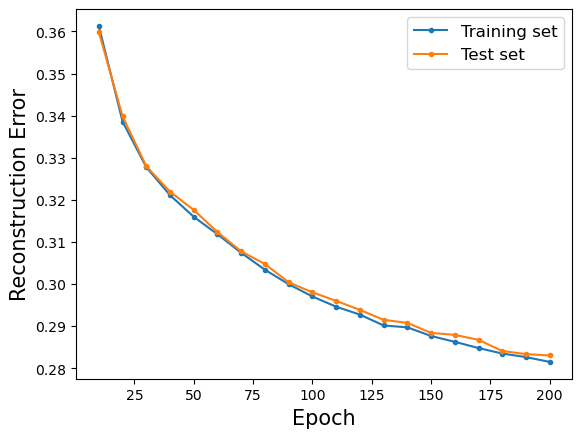

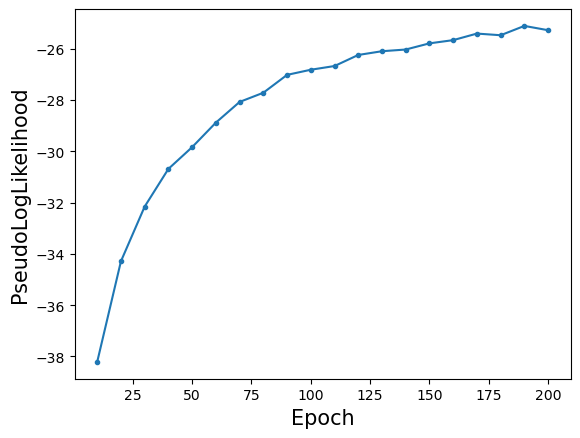

Training RBM 238/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359117 (train), 0.359436 (test), Pseud_Lik: -38.250654, Time: 1.646621, 
Ep 20, Rec er: 0.338126 (train), 0.339171 (test), Pseud_Lik: -34.319138, Time: 1.591834, 
Ep 30, Rec er: 0.327868 (train), 0.328182 (test), Pseud_Lik: -32.203085, Time: 1.637709, 
Ep 40, Rec er: 0.321354 (train), 0.322240 (test), Pseud_Lik: -30.747544, Time: 1.785158, 
Ep 50, Rec er: 0.316583 (train), 0.316922 (test), Pseud_Lik: -29.561683, Time: 1.768880, 
Ep 60, Rec er: 0.311028 (train), 0.312830 (test), Pseud_Lik: -28.772232, Time: 1.648742, 
Ep 70, Rec er: 0.306803 (train), 0.307904 (test), Pseud_Lik: -28.075426, Time: 2.238943, 
Ep 80, Rec er: 0.303157 (train), 0.304732 (test), Pseud_Lik: -27.627570, Time: 1.732449, 
Ep 90, Rec er: 0.299502 (train), 0.300789 (test), Pseud_Lik: -27.325228, Time: 1.665986, 
Ep 100, Rec er: 0.297165 (train), 0.297838 (test), P

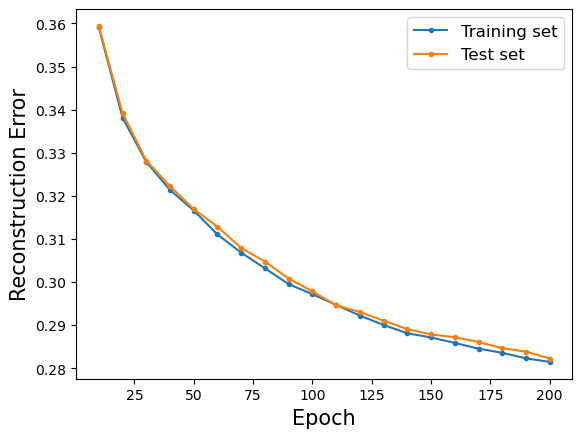

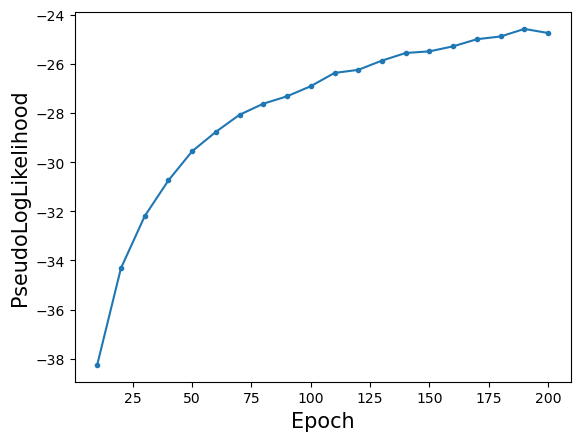

Training RBM 239/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360241 (train), 0.360181 (test), Pseud_Lik: -38.428738, Time: 1.616350, 
Ep 20, Rec er: 0.338867 (train), 0.338608 (test), Pseud_Lik: -34.083894, Time: 1.667956, 
Ep 30, Rec er: 0.327960 (train), 0.328556 (test), Pseud_Lik: -31.853032, Time: 1.711424, 
Ep 40, Rec er: 0.321000 (train), 0.321422 (test), Pseud_Lik: -30.411563, Time: 1.676872, 
Ep 50, Rec er: 0.316585 (train), 0.316402 (test), Pseud_Lik: -29.356000, Time: 1.620614, 
Ep 60, Rec er: 0.311760 (train), 0.311759 (test), Pseud_Lik: -29.023403, Time: 1.688982, 
Ep 70, Rec er: 0.307308 (train), 0.308096 (test), Pseud_Lik: -28.122402, Time: 1.833164, 
Ep 80, Rec er: 0.303504 (train), 0.304578 (test), Pseud_Lik: -27.734710, Time: 1.771634, 
Ep 90, Rec er: 0.299761 (train), 0.301166 (test), Pseud_Lik: -27.450459, Time: 1.709289, 
Ep 100, Rec er: 0.296619 (train), 0.297135 (test), P

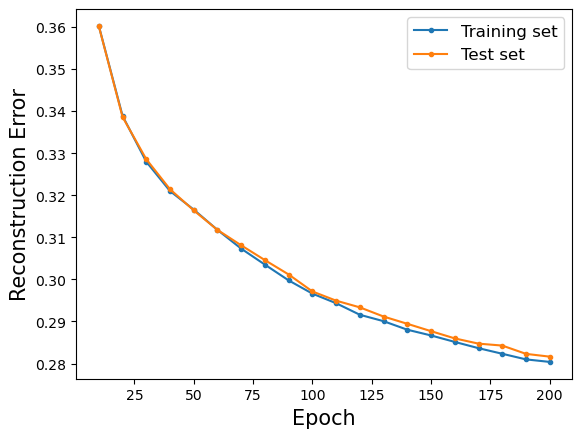

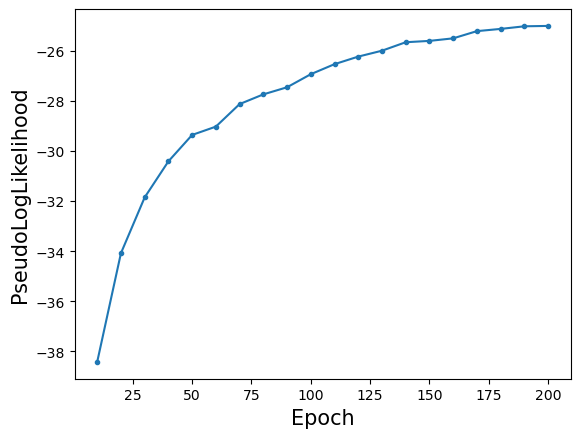

Training RBM 240/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.358834 (train), 0.358174 (test), Pseud_Lik: -38.122111, Time: 2.867925, 
Ep 20, Rec er: 0.337296 (train), 0.337042 (test), Pseud_Lik: -34.102296, Time: 1.643237, 
Ep 30, Rec er: 0.327324 (train), 0.327455 (test), Pseud_Lik: -32.177665, Time: 2.224741, 
Ep 40, Rec er: 0.320929 (train), 0.322601 (test), Pseud_Lik: -30.562559, Time: 1.990670, 
Ep 50, Rec er: 0.315932 (train), 0.317712 (test), Pseud_Lik: -29.490265, Time: 1.749471, 
Ep 60, Rec er: 0.311083 (train), 0.311764 (test), Pseud_Lik: -28.814667, Time: 2.838354, 
Ep 70, Rec er: 0.306794 (train), 0.307262 (test), Pseud_Lik: -28.320062, Time: 1.684462, 
Ep 80, Rec er: 0.302732 (train), 0.303109 (test), Pseud_Lik: -27.692382, Time: 1.800006, 
Ep 90, Rec er: 0.299762 (train), 0.301084 (test), Pseud_Lik: -27.214144, Time: 2.334786, 
Ep 100, Rec er: 0.296832 (train), 0.297726 (test), P

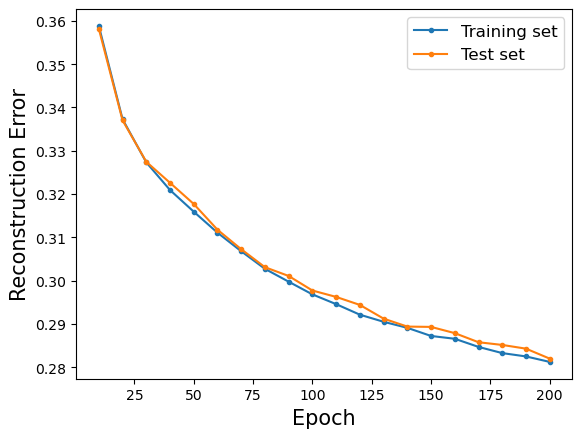

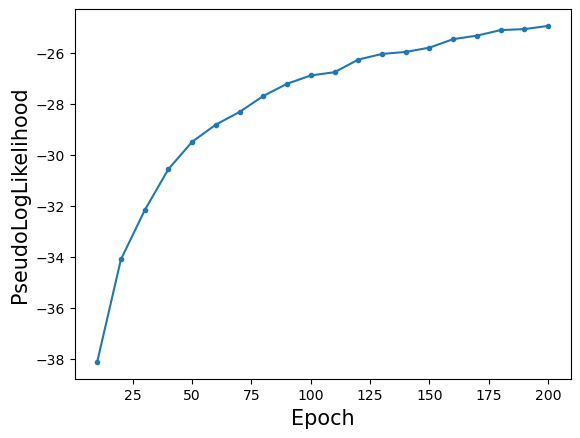

Training RBM 241/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360114 (train), 0.358753 (test), Pseud_Lik: -38.080903, Time: 1.631913, 
Ep 20, Rec er: 0.337402 (train), 0.339089 (test), Pseud_Lik: -34.276156, Time: 1.976148, 
Ep 30, Rec er: 0.327158 (train), 0.327555 (test), Pseud_Lik: -32.183158, Time: 1.882334, 
Ep 40, Rec er: 0.320763 (train), 0.321626 (test), Pseud_Lik: -30.722817, Time: 2.028985, 
Ep 50, Rec er: 0.315348 (train), 0.316456 (test), Pseud_Lik: -29.746359, Time: 1.827688, 
Ep 60, Rec er: 0.310697 (train), 0.311583 (test), Pseud_Lik: -28.429711, Time: 1.850791, 
Ep 70, Rec er: 0.306378 (train), 0.307638 (test), Pseud_Lik: -27.853777, Time: 2.388019, 
Ep 80, Rec er: 0.302116 (train), 0.303155 (test), Pseud_Lik: -27.134420, Time: 1.852582, 
Ep 90, Rec er: 0.299245 (train), 0.300199 (test), Pseud_Lik: -26.726226, Time: 2.308651, 
Ep 100, Rec er: 0.296106 (train), 0.296628 (test), P

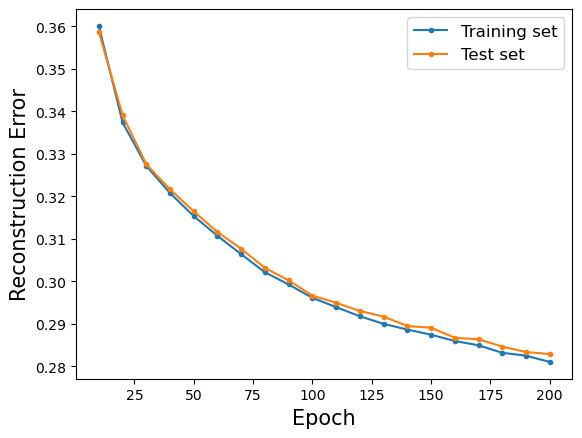

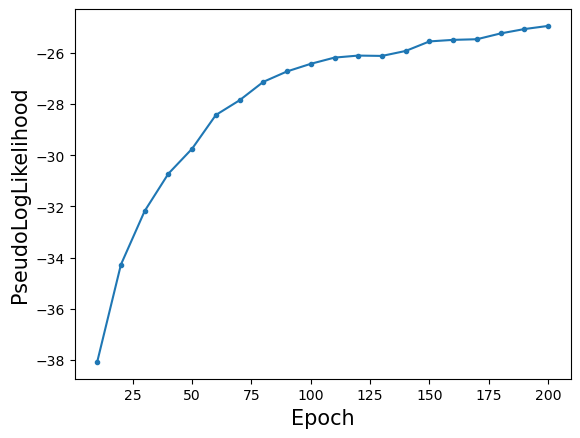

Training RBM 242/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362473 (train), 0.361148 (test), Pseud_Lik: -38.465241, Time: 2.642456, 
Ep 20, Rec er: 0.338933 (train), 0.338758 (test), Pseud_Lik: -34.475760, Time: 1.737627, 
Ep 30, Rec er: 0.327599 (train), 0.327585 (test), Pseud_Lik: -32.070418, Time: 3.189011, 
Ep 40, Rec er: 0.320592 (train), 0.320152 (test), Pseud_Lik: -30.599885, Time: 1.782546, 
Ep 50, Rec er: 0.315185 (train), 0.315667 (test), Pseud_Lik: -29.445841, Time: 1.771058, 
Ep 60, Rec er: 0.310198 (train), 0.310498 (test), Pseud_Lik: -28.780541, Time: 2.599809, 
Ep 70, Rec er: 0.305768 (train), 0.305252 (test), Pseud_Lik: -27.878819, Time: 1.915602, 
Ep 80, Rec er: 0.301824 (train), 0.302943 (test), Pseud_Lik: -27.642962, Time: 2.459945, 
Ep 90, Rec er: 0.299024 (train), 0.299409 (test), Pseud_Lik: -27.024514, Time: 1.889209, 
Ep 100, Rec er: 0.295924 (train), 0.296979 (test), P

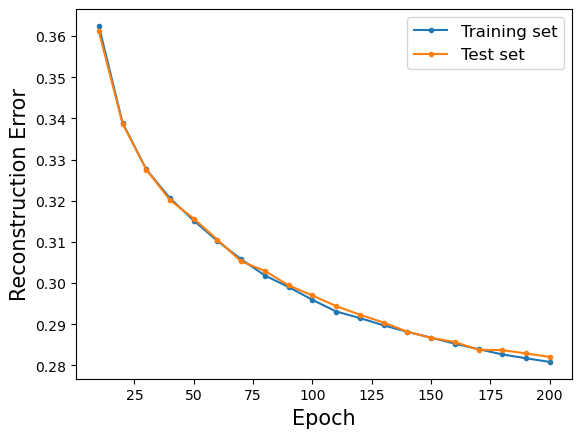

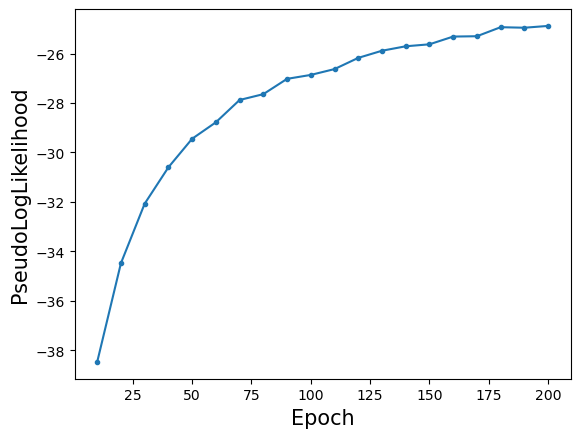

Training RBM 243/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359799 (train), 0.358695 (test), Pseud_Lik: -38.134139, Time: 3.090258, 
Ep 20, Rec er: 0.338836 (train), 0.337972 (test), Pseud_Lik: -34.238134, Time: 1.764246, 
Ep 30, Rec er: 0.328107 (train), 0.328552 (test), Pseud_Lik: -32.300724, Time: 2.660669, 
Ep 40, Rec er: 0.320910 (train), 0.321739 (test), Pseud_Lik: -30.667202, Time: 2.919769, 
Ep 50, Rec er: 0.316031 (train), 0.317505 (test), Pseud_Lik: -29.442176, Time: 1.741269, 
Ep 60, Rec er: 0.311464 (train), 0.311895 (test), Pseud_Lik: -28.637734, Time: 2.069332, 
Ep 70, Rec er: 0.307463 (train), 0.308166 (test), Pseud_Lik: -27.864573, Time: 1.854691, 
Ep 80, Rec er: 0.303252 (train), 0.304272 (test), Pseud_Lik: -27.417889, Time: 1.787743, 
Ep 90, Rec er: 0.300317 (train), 0.301412 (test), Pseud_Lik: -27.015496, Time: 2.072561, 
Ep 100, Rec er: 0.297794 (train), 0.298928 (test), P

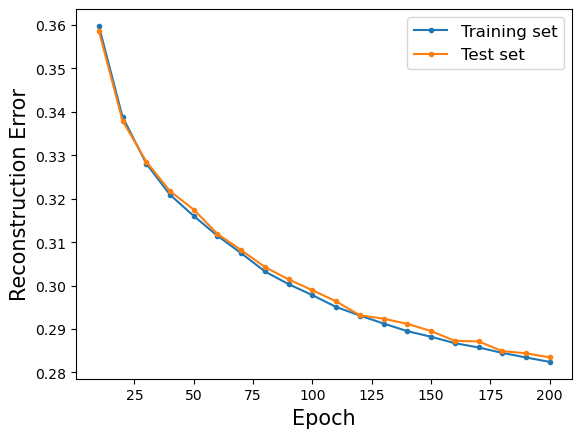

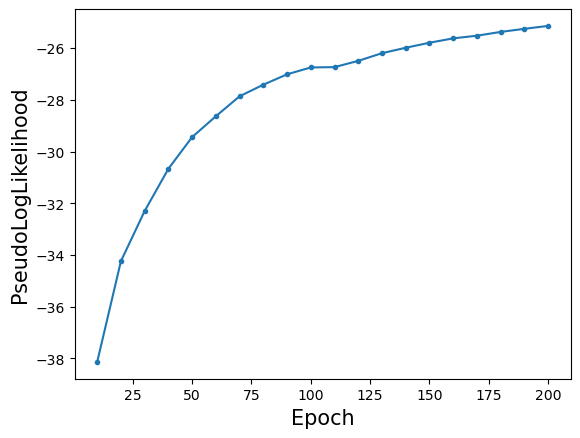

Training RBM 244/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360859 (train), 0.360598 (test), Pseud_Lik: -38.470260, Time: 2.706048, 
Ep 20, Rec er: 0.337658 (train), 0.337603 (test), Pseud_Lik: -33.948735, Time: 1.749068, 
Ep 30, Rec er: 0.327413 (train), 0.327995 (test), Pseud_Lik: -32.040442, Time: 2.900132, 
Ep 40, Rec er: 0.320315 (train), 0.321507 (test), Pseud_Lik: -30.265187, Time: 1.788802, 
Ep 50, Rec er: 0.315347 (train), 0.316516 (test), Pseud_Lik: -29.167395, Time: 1.868144, 
Ep 60, Rec er: 0.311114 (train), 0.312089 (test), Pseud_Lik: -28.474764, Time: 1.899711, 
Ep 70, Rec er: 0.306653 (train), 0.308608 (test), Pseud_Lik: -27.948624, Time: 1.867529, 
Ep 80, Rec er: 0.303298 (train), 0.303389 (test), Pseud_Lik: -27.232308, Time: 2.658406, 
Ep 90, Rec er: 0.300538 (train), 0.301370 (test), Pseud_Lik: -26.706037, Time: 2.153533, 
Ep 100, Rec er: 0.297641 (train), 0.298809 (test), P

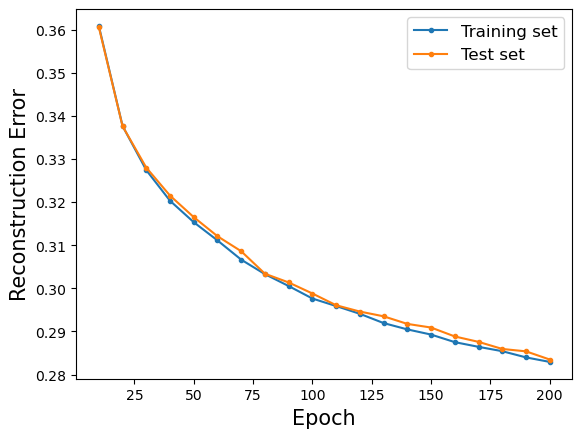

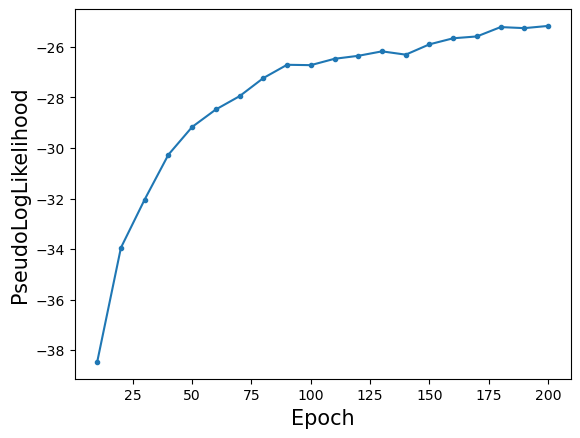

Training RBM 245/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362403 (train), 0.362690 (test), Pseud_Lik: -38.430762, Time: 1.956065, 
Ep 20, Rec er: 0.338657 (train), 0.339003 (test), Pseud_Lik: -34.365324, Time: 1.774225, 
Ep 30, Rec er: 0.327619 (train), 0.328343 (test), Pseud_Lik: -32.234597, Time: 3.001640, 
Ep 40, Rec er: 0.320996 (train), 0.322463 (test), Pseud_Lik: -30.975576, Time: 1.748021, 
Ep 50, Rec er: 0.315550 (train), 0.316390 (test), Pseud_Lik: -29.779725, Time: 1.775295, 
Ep 60, Rec er: 0.310481 (train), 0.310973 (test), Pseud_Lik: -28.549628, Time: 1.956189, 
Ep 70, Rec er: 0.305981 (train), 0.306916 (test), Pseud_Lik: -27.986915, Time: 1.847267, 
Ep 80, Rec er: 0.301805 (train), 0.303074 (test), Pseud_Lik: -27.345283, Time: 1.702507, 
Ep 90, Rec er: 0.299549 (train), 0.299786 (test), Pseud_Lik: -27.118460, Time: 1.915608, 
Ep 100, Rec er: 0.296228 (train), 0.297297 (test), P

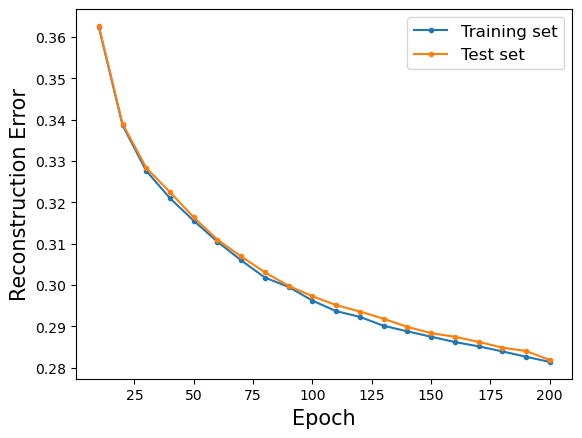

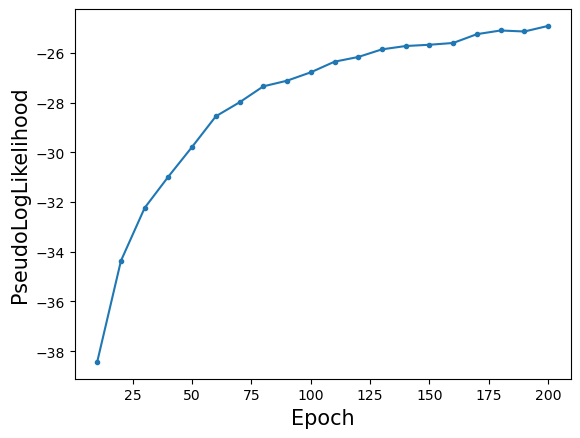

Training RBM 246/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.362685 (train), 0.362695 (test), Pseud_Lik: -38.289622, Time: 1.718886, 
Ep 20, Rec er: 0.338251 (train), 0.337830 (test), Pseud_Lik: -34.381328, Time: 1.652993, 
Ep 30, Rec er: 0.327862 (train), 0.328723 (test), Pseud_Lik: -32.304191, Time: 1.674361, 
Ep 40, Rec er: 0.320919 (train), 0.322004 (test), Pseud_Lik: -30.741558, Time: 1.815441, 
Ep 50, Rec er: 0.316031 (train), 0.317020 (test), Pseud_Lik: -29.507049, Time: 1.805309, 
Ep 60, Rec er: 0.311430 (train), 0.312726 (test), Pseud_Lik: -28.675912, Time: 1.888087, 
Ep 70, Rec er: 0.306499 (train), 0.306424 (test), Pseud_Lik: -28.324904, Time: 2.125354, 
Ep 80, Rec er: 0.302297 (train), 0.303311 (test), Pseud_Lik: -27.737137, Time: 1.884438, 
Ep 90, Rec er: 0.298838 (train), 0.300031 (test), Pseud_Lik: -27.227089, Time: 1.832842, 
Ep 100, Rec er: 0.295465 (train), 0.296858 (test), P

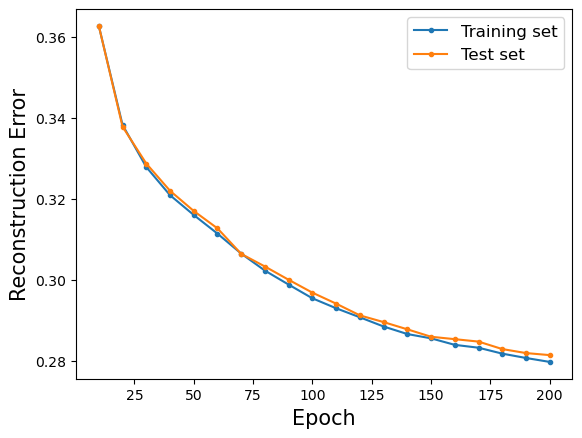

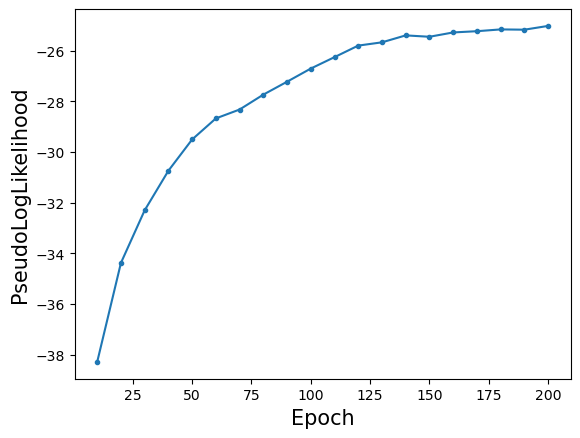

Training RBM 247/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.360490 (train), 0.360776 (test), Pseud_Lik: -38.194223, Time: 2.071783, 
Ep 20, Rec er: 0.337666 (train), 0.338454 (test), Pseud_Lik: -34.250119, Time: 1.646368, 
Ep 30, Rec er: 0.326989 (train), 0.327143 (test), Pseud_Lik: -32.154801, Time: 1.676291, 
Ep 40, Rec er: 0.320850 (train), 0.321601 (test), Pseud_Lik: -30.784194, Time: 1.765108, 
Ep 50, Rec er: 0.315973 (train), 0.316538 (test), Pseud_Lik: -29.827201, Time: 1.895559, 
Ep 60, Rec er: 0.311017 (train), 0.312017 (test), Pseud_Lik: -28.843733, Time: 1.684343, 
Ep 70, Rec er: 0.306788 (train), 0.307102 (test), Pseud_Lik: -28.265570, Time: 3.075830, 
Ep 80, Rec er: 0.302554 (train), 0.303356 (test), Pseud_Lik: -27.520280, Time: 2.056160, 
Ep 90, Rec er: 0.298521 (train), 0.300137 (test), Pseud_Lik: -27.015134, Time: 1.810720, 
Ep 100, Rec er: 0.296101 (train), 0.296352 (test), P

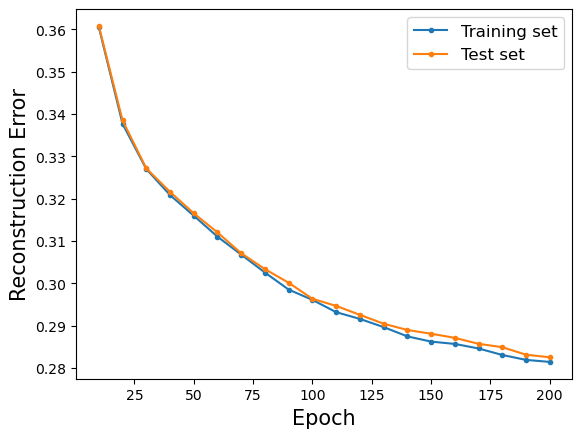

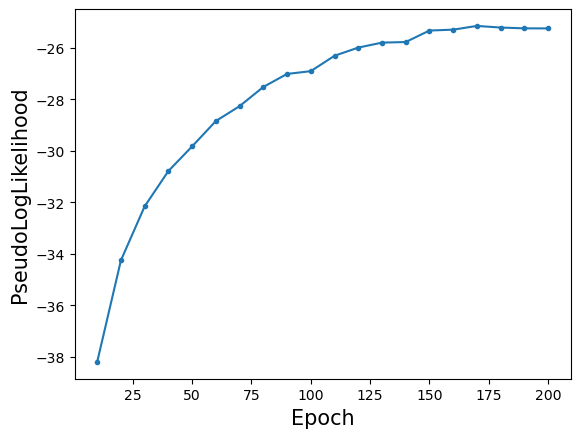

Training RBM 248/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.361911 (train), 0.360361 (test), Pseud_Lik: -38.215015, Time: 1.887907, 
Ep 20, Rec er: 0.338889 (train), 0.338929 (test), Pseud_Lik: -34.313309, Time: 1.612285, 
Ep 30, Rec er: 0.328462 (train), 0.329173 (test), Pseud_Lik: -32.288770, Time: 1.692846, 
Ep 40, Rec er: 0.322038 (train), 0.321628 (test), Pseud_Lik: -30.927451, Time: 1.937929, 
Ep 50, Rec er: 0.315967 (train), 0.316879 (test), Pseud_Lik: -29.748682, Time: 1.757851, 
Ep 60, Rec er: 0.311896 (train), 0.312189 (test), Pseud_Lik: -28.903052, Time: 1.645660, 
Ep 70, Rec er: 0.307202 (train), 0.308141 (test), Pseud_Lik: -28.129056, Time: 1.760999, 
Ep 80, Rec er: 0.303794 (train), 0.304075 (test), Pseud_Lik: -27.526550, Time: 1.762606, 
Ep 90, Rec er: 0.299540 (train), 0.301003 (test), Pseud_Lik: -26.975675, Time: 1.749623, 
Ep 100, Rec er: 0.296573 (train), 0.298078 (test), P

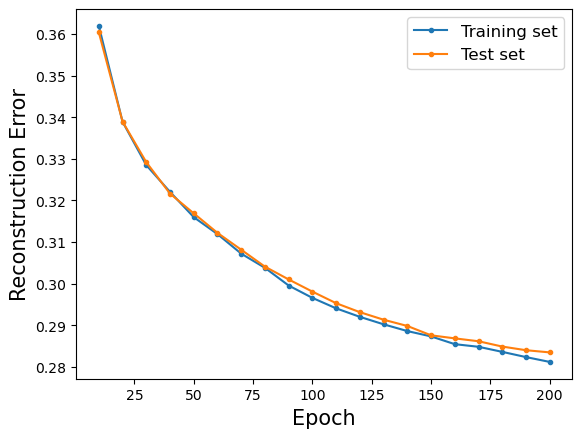

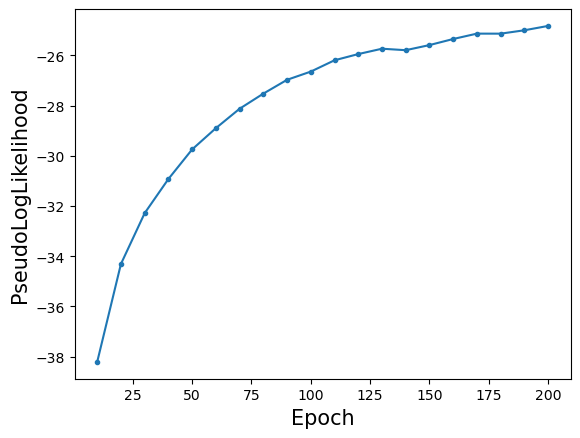

Training RBM 249/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359398 (train), 0.359939 (test), Pseud_Lik: -38.155374, Time: 1.927791, 
Ep 20, Rec er: 0.338085 (train), 0.337728 (test), Pseud_Lik: -34.173295, Time: 1.783217, 
Ep 30, Rec er: 0.328360 (train), 0.328609 (test), Pseud_Lik: -32.063228, Time: 1.712228, 
Ep 40, Rec er: 0.321995 (train), 0.322476 (test), Pseud_Lik: -30.538577, Time: 1.753001, 
Ep 50, Rec er: 0.316388 (train), 0.317232 (test), Pseud_Lik: -29.674171, Time: 1.682259, 
Ep 60, Rec er: 0.311924 (train), 0.312660 (test), Pseud_Lik: -28.794384, Time: 1.722510, 
Ep 70, Rec er: 0.307607 (train), 0.308423 (test), Pseud_Lik: -28.048859, Time: 1.750621, 
Ep 80, Rec er: 0.303532 (train), 0.304698 (test), Pseud_Lik: -27.326613, Time: 1.850727, 
Ep 90, Rec er: 0.300592 (train), 0.301607 (test), Pseud_Lik: -27.025295, Time: 1.700021, 
Ep 100, Rec er: 0.297551 (train), 0.298431 (test), P

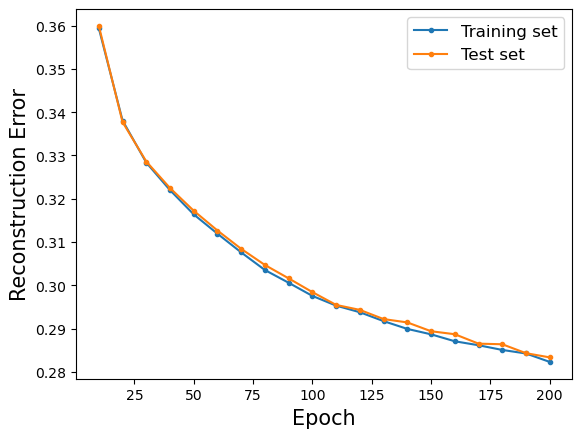

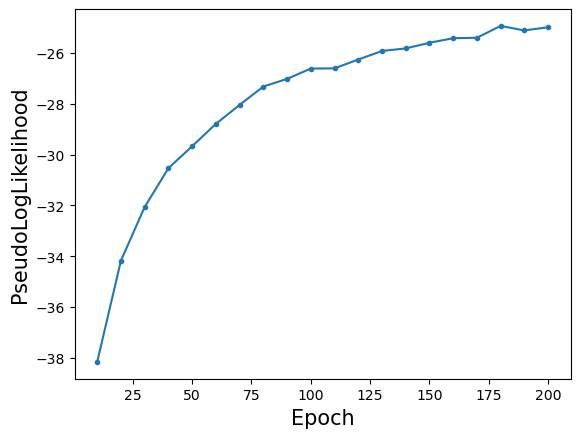

Training RBM 250/250
RBM --- Nv= 100, Nh= 100, lr= 1.0E-02, k= 1, Bsize= 100, Epochs= 200, USE_CUDA= False, verbose= 10
Starting training
Ep 10, Rec er: 0.359212 (train), 0.358996 (test), Pseud_Lik: -37.966146, Time: 1.590324, 
Ep 20, Rec er: 0.337921 (train), 0.338152 (test), Pseud_Lik: -34.054171, Time: 1.626358, 
Ep 30, Rec er: 0.327817 (train), 0.328589 (test), Pseud_Lik: -32.362924, Time: 1.628819, 
Ep 40, Rec er: 0.322154 (train), 0.322275 (test), Pseud_Lik: -31.006335, Time: 1.685510, 
Ep 50, Rec er: 0.316781 (train), 0.318019 (test), Pseud_Lik: -29.889339, Time: 1.911390, 
Ep 60, Rec er: 0.312003 (train), 0.312764 (test), Pseud_Lik: -28.943324, Time: 1.636835, 
Ep 70, Rec er: 0.307279 (train), 0.308336 (test), Pseud_Lik: -28.293787, Time: 1.743867, 
Ep 80, Rec er: 0.303673 (train), 0.303573 (test), Pseud_Lik: -27.954204, Time: 1.696449, 
Ep 90, Rec er: 0.299810 (train), 0.300778 (test), Pseud_Lik: -27.531206, Time: 1.670455, 
Ep 100, Rec er: 0.297328 (train), 0.298236 (test), P

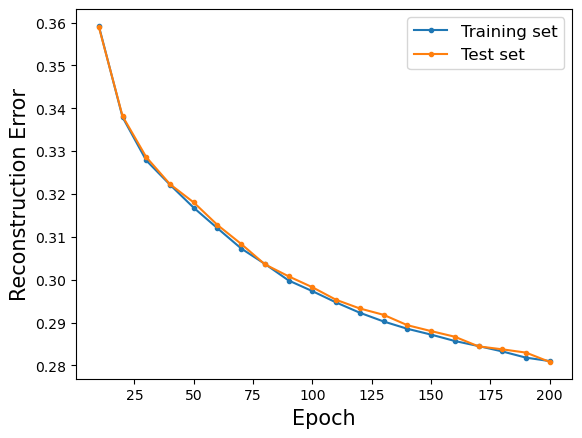

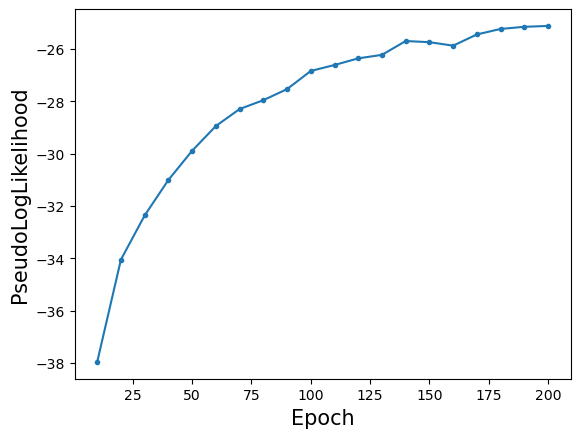

In [11]:

lr = 0.01
k_learning = 1
batch_size = 100
nb_epoch = 200
k_sampling = 1

total_rbms = 250  # Total number of RBMs to train
rbms_per_batch = 5  # Number of RBMs per batch
temp_storage = []  # Temporary storage for each batch of RBMs

for rbm_index in range(total_rbms):
    print(f"Training RBM {rbm_index + 1}/{total_rbms}")

    # Initialize a new RBM
    rbm = RBM(num_visible=training_set.shape[1], 
              num_hidden=training_set.shape[1], 
              bias=False,
              T=1.0,
              use_cuda=False)

    # Train the RBM
    rbm.learn(training_set=training_set, 
              test_set=test_set,
              lr=lr, 
              nb_epoch=nb_epoch, 
              batch_size=batch_size,
              k_learning=k_learning,
              k_sampling=k_sampling,
              verbose=10)

    # Add the trained RBM to the temporary storage
    temp_storage.append(rbm)

    # Save 2 RBMs as a batch
    if (rbm_index + 1) % rbms_per_batch == 0 or (rbm_index + 1) == total_rbms:
        batch_index = (rbm_index + 1) // rbms_per_batch
        torch.save(temp_storage, f'rbms_group_{batch_index}.pt')
        temp_storage = []  # Clear the temporary storage for the next batch


In [ ]:
all_rbms = []  # List to store all RBMs

# Loop through each file and load the RBMs
for i in range(1, 101):  # Assuming file names are from 1 to 100
    file_name = f'rbms_group_{i}.pt'
    rbms_batch = torch.load(file_name)
    all_rbms.extend(rbms_batch)  # Add the loaded RBMs to the list

# Save all RBMs into one file
# torch.save(all_rbms, '200epochs__250_rbms.pt')

<Axes: >

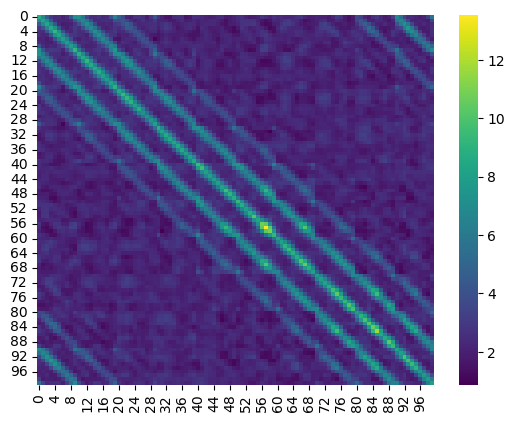

In [12]:
loaded_rbms = torch.load('rbms_group_1.pt')
w = loaded_rbms[0].parameters()[0]
w = torch.mm(w.t(),w)
sns.heatmap(w, linewidths= 0.0, cmap= 'viridis')

### Saving the multiple batches into 1

In [9]:
nb_epoch= rbm.num_train_epochs()
Nv= training_set.shape[1]
Nh= training_set.shape[1]

name = 'RBM_model_T_complete_nv%d_nh%d_lr%.1E_k%d_bsize%d_nepochs%d' % (Nv,
                                                                        Nh,
                                                                        lr,
                                                                        k_learning,
                                                                        batch_size,
                                                                        nb_epoch)

PATH = name + '.pt'

torch.save(rbm, PATH)

### Weights distribution

In [10]:
W, v, h = rbm.parameters()

del v
del h
torch.cuda.empty_cache()

In [11]:
W_layers = rbm.W_layers()

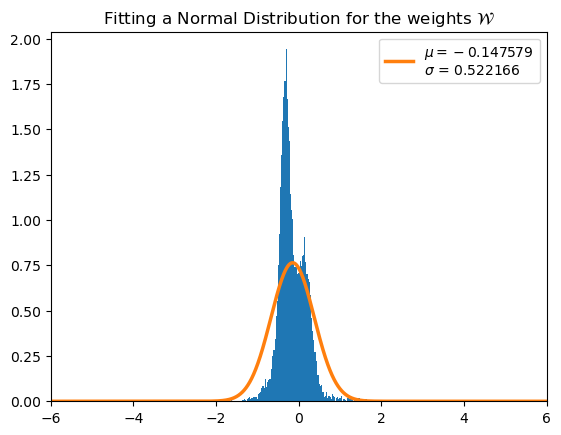

In [12]:
W_ = W.cpu().numpy().reshape((W.shape[0]*W.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 1000, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.xlim([-6, 6])
plt.legend()
plt.show()

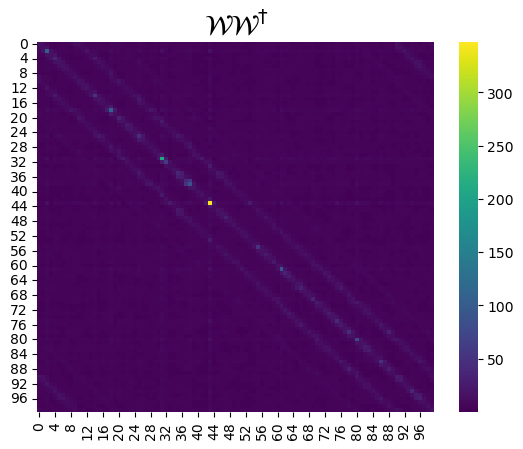

In [13]:
WW = torch.mm(W.t(), W)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
plt.show()

### Comparing this weight distribution with the one from MF trainining set

In [14]:
rbm = torch.load('RBM_model_T_complete_nv100_nh100_lr1.0E-02_k1_bsize100_nepochs8000.pt')

In [15]:
W, v, h = rbm.parameters()

del v
del h
torch.cuda.empty_cache()

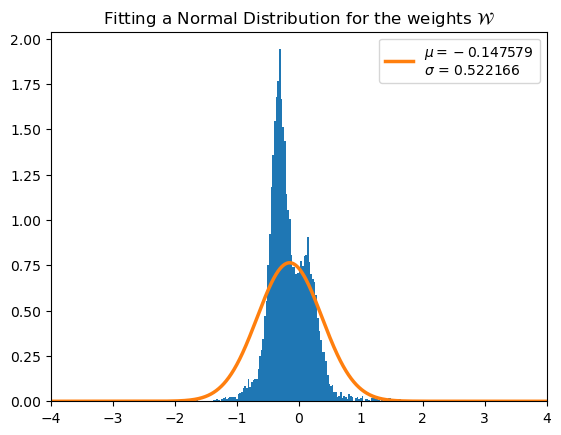

In [16]:
W_ = W.cpu().numpy().reshape((W.shape[0]*W.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 1000, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.xlim([-4, 4])
plt.legend()
plt.show()

In [17]:
rbm_MF = torch.load('RBM_model_T_complete_MF_nv100_nh100_lr1.0E-03_k1_bsize100_nepochs20000.pt')

W_MF, v_MF, h_MF = rbm_MF.parameters()

del v_MF
del h_MF
torch.cuda.empty_cache()


FileNotFoundError: [Errno 2] No such file or directory: 'RBM_model_T_complete_MF_nv100_nh100_lr1.0E-03_k1_bsize100_nepochs20000.pt'

In [19]:
W_ = W_MF.cpu().numpy().reshape((W_MF.shape[0]*W_MF.shape[1]))

# Plot normalized histogram 
plt.hist(W_, 
         bins= 100, 
         density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_MF, sigmaW_MF = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_MF, sigmaW_MF) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_MF, sigmaW_MF ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W} - MF$')
plt.xlim([-4, 4])
plt.legend()
plt.show()

NameError: name 'W_MF' is not defined

In [91]:
def distr_comp(muW_,
               sigmaW_,
               muW_MF,
               sigmaW_MF,
               L= 10,
               x_min= -5,
               x_max= 5,
               x_num= 500,
               loc_legend= 'lower right',
               training_set= 'COMPLETE',
               save= False, 
               publication= False):
              
    if publication:
        plt.figure(figsize=(3.375, 0.678*3.375))
        plt.xticks(fontsize= 6)
        plt.yticks(fontsize= 6)
        markersize = 4.0
        linewidth= 0.4
        alpha= 0.1
        fontsize_t = 6.0
        linewidth_v= 0.5
        
    else:
        markersize = 10.0
        linewidth= 1.5
        alpha= 0.1
        fontsize_t = 12.0
        linewidth_v= 0.8
        
           
    x = np.linspace(x_min, x_max, x_num)
    plot_pdf = stats.norm.pdf(x, muW_, sigmaW_)
    plot_pdf_MF = stats.norm.pdf(x, muW_MF, sigmaW_MF)

    plt.plot(x, 
             plot_pdf, 
             linewidth= linewidth,
             label= 'Nearest Neig')

    plt.fill_between(x, 
                     plot_pdf,
                     alpha= alpha)

    plt.plot(x, 
             plot_pdf_MF,
             linewidth= linewidth,
             label= 'Mean Field')

    plt.fill_between(x,
                     plot_pdf_MF,
                     alpha= alpha)
    
    plt.axvline(x= 0.0, linestyle= ':', linewidth= linewidth_v, color= 'black')

    plt.ylim([0, plt.ylim()[1]])
    plt.legend(loc= loc_legend,
              fontsize= fontsize_t)
    
    if save:
        if publication:
            path_fig = '../figures/PUB_DISTRIB_COMP_NN_vs_MF_L%d_Train%s.pdf' % (L, training_set)   
            plt.savefig(path_fig , bbox_inches='tight')
        else:
            path_fig = '../figures/DISTRIB_COMP_NN_vs_MF_L%d_Train%s.pdf' % (L, training_set)   
            plt.savefig(path_fig, bbox_inches='tight')
    
    plt.show()

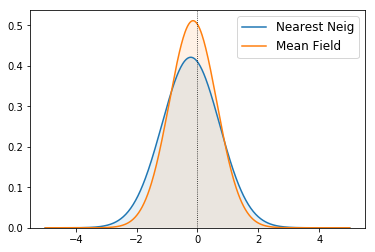

In [93]:
distr_comp(muW_= muW_,
           sigmaW_= sigmaW_,
           muW_MF= muW_MF,
           sigmaW_MF= sigmaW_MF,
           L= 10,
           x_min= -5,
           x_max= 5,
           x_num= 500,
           loc_legend= 'upper right',
           training_set= 'COMPLETE',
           save= False, 
           publication= False)